In [55]:
import sys
print(sys.version)

3.8.11 (default, Jul  8 2021, 01:27:30) 
[Clang 10.0.0 ]


In [56]:
"""
Created on Jul 29 2021
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)

In [57]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [58]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [61]:
%load_ext autoreload
%autoreload 2

import Zernike_Module_v047g
import Zernike_Analysis_Module
from Zernike_Module_v047g import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *

# 0.35d or greater

print('Zernike_Module.__version__: '+str(Zernike_Module_v047g.__version__))
print('Zernike_Analysis_Module.__version__: '+str(Zernike_Analysis_Module.__version__))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Zernike_Module.__version__: 0.47g
Zernike_Analysis_Module.__version__: 0.26j


In [6]:
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle
import glob
import time

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
#import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

from astropy.io import fits

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c



print(np.__version__)
#print(skimage.__version__)
print(scipy.__version__)
print(pd.__version__)

1.20.3
1.6.2
1.2.0


In [8]:
import pickle
print(pickle.__version__)

AttributeError: module 'pickle' has no attribute '__version__'

# Unit test 

In [7]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([7.1,1.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=0,verbosity=0,npix=1536)   

res=model(allparameters_proposal,return_Image=True)


print(res[0])

version of the code is: 0.47g
(309, 309)
[0, 0]
(309, 309)
[-4.379359995034642, -21.468527874138204]
(309, 309)
[6.620640004965358, 0.5314721258617965]
(309, 309)
[12.120640004965358, -10.468527874138204]
(309, 309)
[1.1206400049653578, 11.531472125861796]
(309, 309)
[3.8706400049653578, -4.9685278741382035]
(309, 309)
[14.870640004965358, 17.031472125861796]
(309, 309)
[9.370640004965358, -15.968527874138204]
(309, 309)
[-1.6293599950346422, 6.0314721258617965]
(309, 309)
[-0.25435999503464224, -7.7185278741382035]
(309, 309)
[10.745640004965358, 14.281472125861796]
(309, 309)
[16.24564000496536, -18.718527874138204]
(309, 309)
[5.245640004965358, 3.2814721258617965]
(309, 309)
[2.4956400049653578, -13.218527874138204]
(309, 309)
[13.495640004965358, 8.781472125861796]
(309, 309)
[7.995640004965358, -2.2185278741382035]
(309, 309)
[-3.0043599950346422, 19.781472125861796]
(309, 309)
[-2.3168599950346422, -0.8435278741382035]
(309, 309)
[8.683140004965358, 21.156472125861796]
(309, 309

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5249: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
/opt/miniconda3/envs/idp2_pyfftw/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [8]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

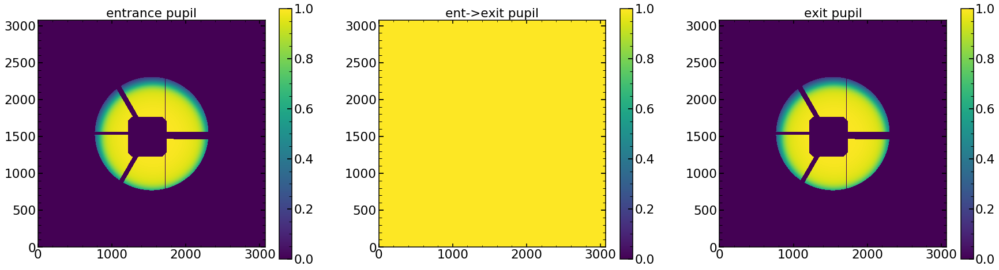

In [9]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

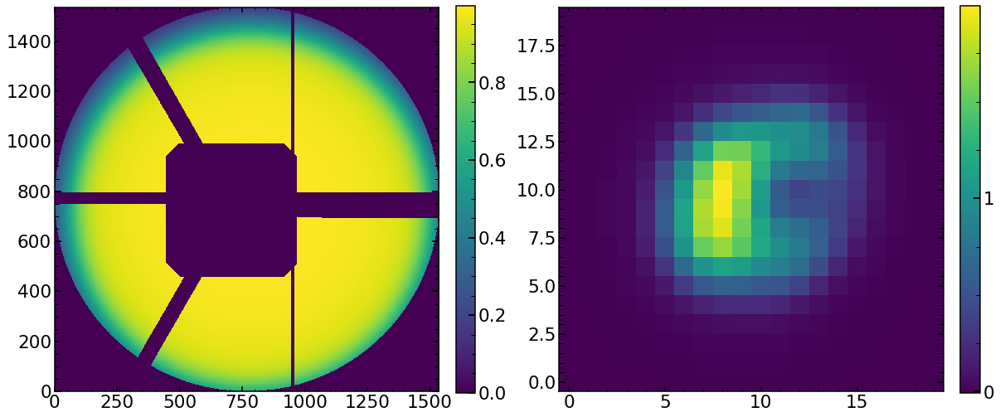

In [10]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**-2,1,10,10**2,10**3,10**4,10**5])

# Aug 01, 10 fibers 

In [62]:
import glob

finalAr_wrong_secondary=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalAr_Jul2021_wrong_secondary",allow_pickle=True)
finalAr=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalAr_Jul2021",allow_pickle=True)
finalNe=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalNe_Jul2021",allow_pickle=True)
finalKr=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalKr_Jul2021",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## which are avaliable 

In [63]:
#date='May2921'

date_folder='Aug0121'
date_files='Aug0121'
ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


#Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*KrSwarm1.npy', recursive=True)

In [64]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='34437']


###########

analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
analyzed_Neon_images=analyzed_Neon_images[analyzed_Neon_images[:,0]=='34313']




###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='34657']

In [65]:
analyzed_Ar_images
#analyzed_Neon_images
#analyzed_Ar_images

array([['34437', '101', 'Ar'],
       ['34437', '102', 'Ar'],
       ['34437', '103', 'Ar'],
       ['34437', '104', 'Ar'],
       ['34437', '105', 'Ar'],
       ['34437', '107', 'Ar'],
       ['34437', '109', 'Ar'],
       ['34437', '111', 'Ar'],
       ['34437', '113', 'Ar'],
       ['34437', '114', 'Ar'],
       ['34437', '115', 'Ar'],
       ['34437', '116', 'Ar'],
       ['34437', '117', 'Ar'],
       ['34437', '11', 'Ar'],
       ['34437', '119', 'Ar'],
       ['34437', '13', 'Ar'],
       ['34437', '15', 'Ar'],
       ['34437', '17', 'Ar'],
       ['34437', '18', 'Ar'],
       ['34437', '1', 'Ar'],
       ['34437', '19', 'Ar'],
       ['34437', '20', 'Ar'],
       ['34437', '21', 'Ar'],
       ['34437', '23', 'Ar'],
       ['34437', '25', 'Ar'],
       ['34437', '27', 'Ar'],
       ['34437', '29', 'Ar'],
       ['34437', '30', 'Ar'],
       ['34437', '31', 'Ar'],
       ['34437', '32', 'Ar'],
       ['34437', '33', 'Ar'],
       ['34437', '35', 'Ar'],
       ['34437', '37', 'Ar'

In [66]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:80 / analyzed_Ne_images:30 / analyzed_Kr_images:10


## single image analysis 

In [67]:
 date='Aug0121'

single_number='51'
image_index=int(single_number)
eps=8
arc='Ar'
dataset=6



if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=27719
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr

wavelength=float(finalArc.loc[int(single_number)]['wavelength'])
#wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_short_with_focus=['m4','0','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   401
xc                     1610
yc                     1190
wavelength        727.47876
close                     1
lamp                     Ar
xc_effective           1610
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 51, dtype: object

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]


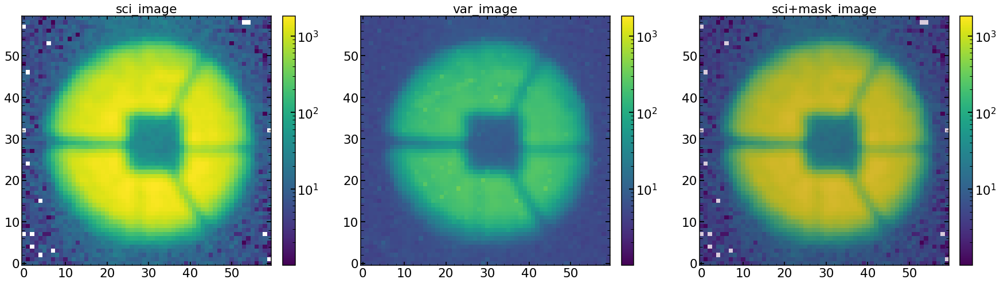

In [68]:
single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
single_analysis.create_basic_data_image()

In [69]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.117834448814392
average chi2 reduced is: -4.187660333497099


### chain analysis 

In [18]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518Arres_gbests_position.npy
(21, 129)


array([   -7.89797766,     0.39688587,     0.06337297,     0.01398799,
           0.11351922,    -0.5930547 ,    -0.01954482,     0.37408595,
           0.00485251,    -0.00724699,     0.00897703,    -0.02165102,
           0.02339488,    -0.26843767,     0.08117586,    -0.45003392,
          -0.00261739,    -0.01468504,     0.00517304,    -0.01193744,
           0.01140077,    -0.00153957,    -0.00056605,     0.04175221,
          -0.00056961,    -0.03396056,    -0.00177865,     0.02014584,
          -0.00430211,     0.0099644 ,    -0.00183295,    -0.01725726,
           0.00058247,    -0.04659504,    -0.00015778,    -0.00414725,
          -0.04653839,    -0.00553679,     0.64488234,     0.07733101,
          -0.04796971,    -0.03974842,     0.05739969,     0.0360364 ,
           0.32817029,     0.1423118 ,     0.001696  ,     1.19625273,
           0.00786866,    -0.04978565,     0.97196635,     0.04773475,
           0.46083617,     1.02438878,     0.14243521, 69558.46480471,
      

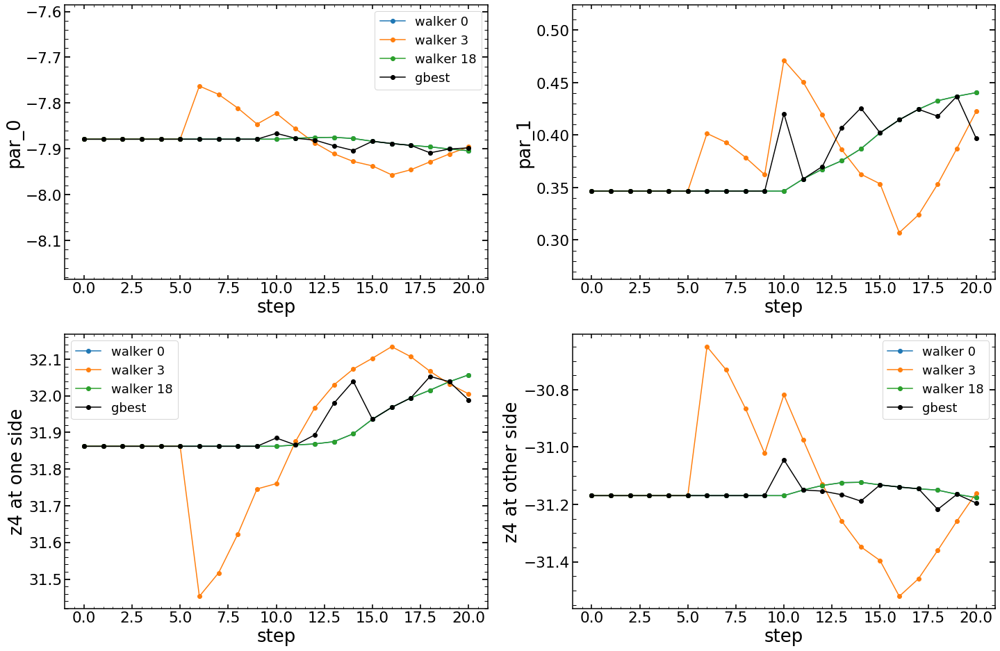

In [19]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=0*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(gbests_positions[:,i])
plt.ylim(np.min([mean_one_what-0.3,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.3,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

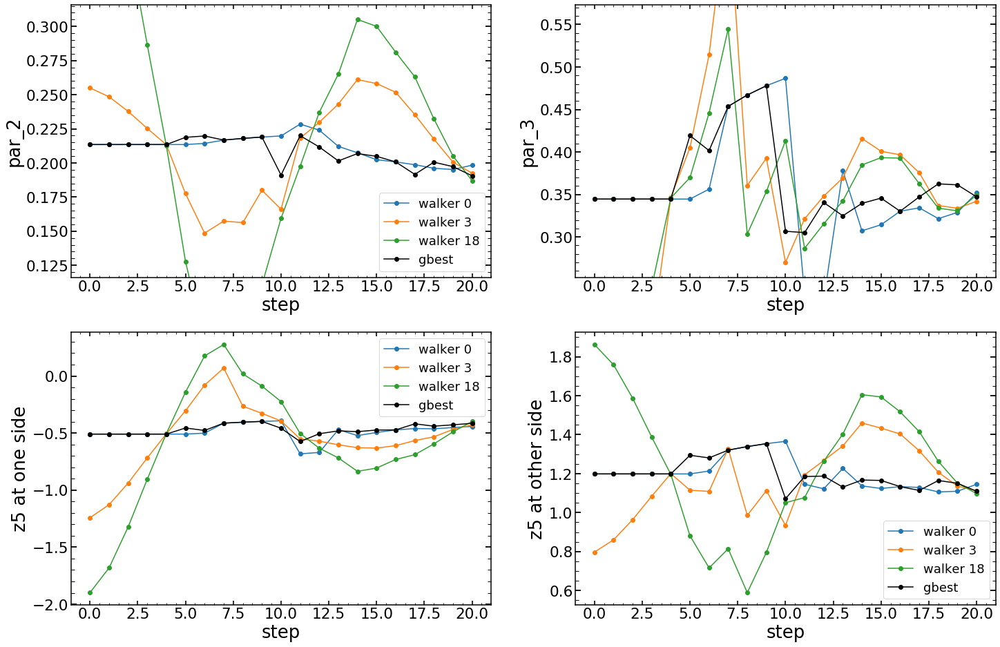

In [32]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=1*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

Text(0.5, 1.0, 'par_46 / wide_43')

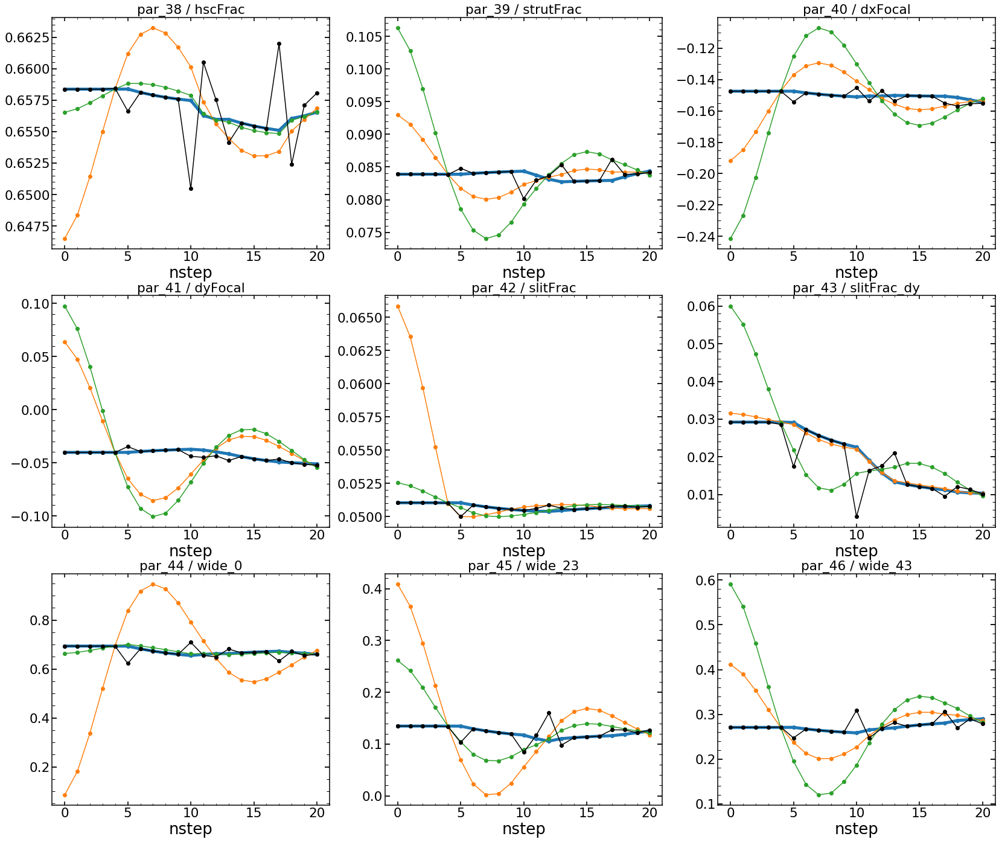

In [33]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

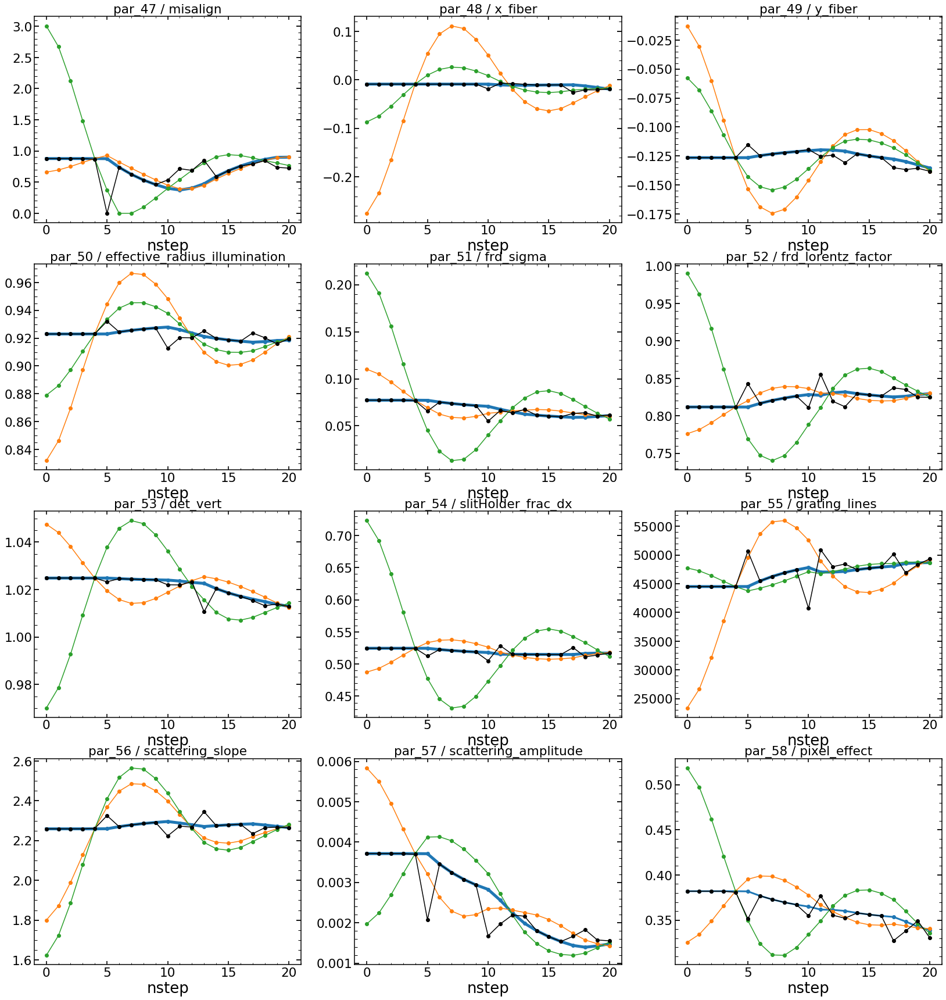

In [34]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

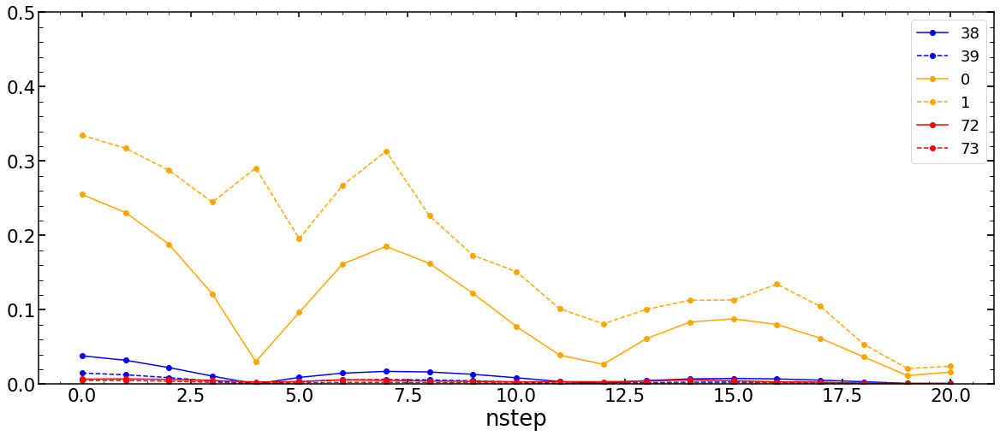

In [35]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

(0.08380435532583756, 0.08406479990270858)

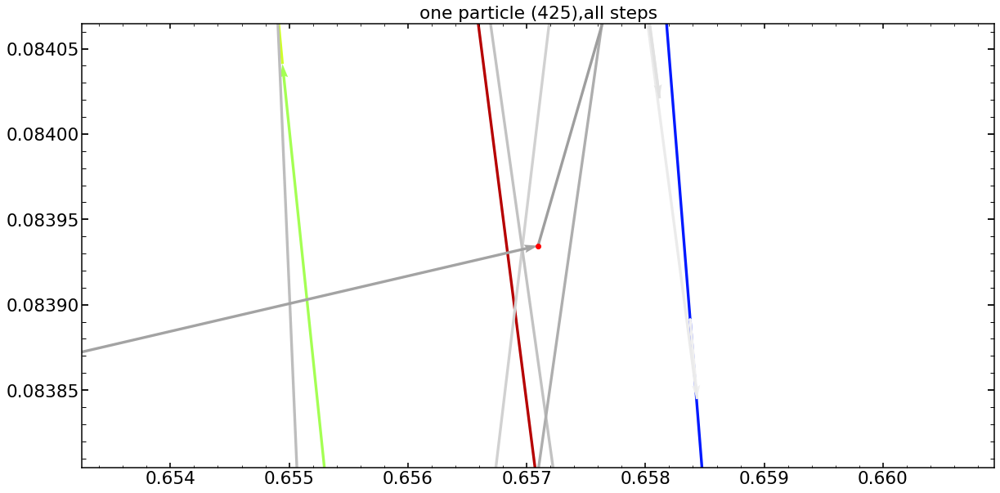

In [36]:
nsteps=chain0_swarm_1.shape[0]


j=0
n_particle=425
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle ('+str(n_particle)+'),all steps')

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors)
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,ls='--')
plt.scatter(X_best[-1],Y_best[-1],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.xlim(X_best[-1]-3*delta_X,X_best[-1]+3*delta_X)
plt.ylim(Y_best[-1]-3*delta_Y,Y_best[-1]+3*delta_Y)

Text(0, 0.5, 'parameter: 39')

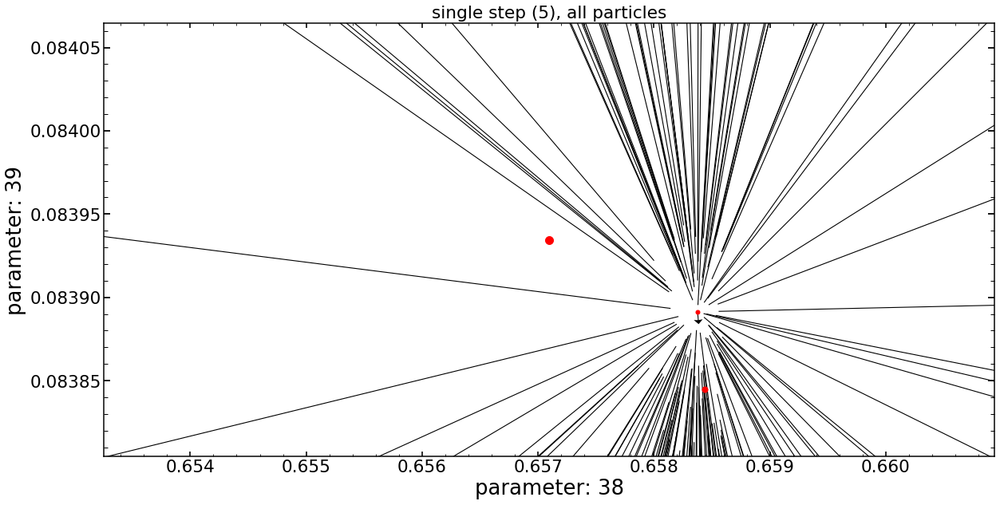

In [37]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437158ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.053055922190348
average chi2 reduced is: -4.196821213516641
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437158ArSwarm1.npy
(21, 480, 129)


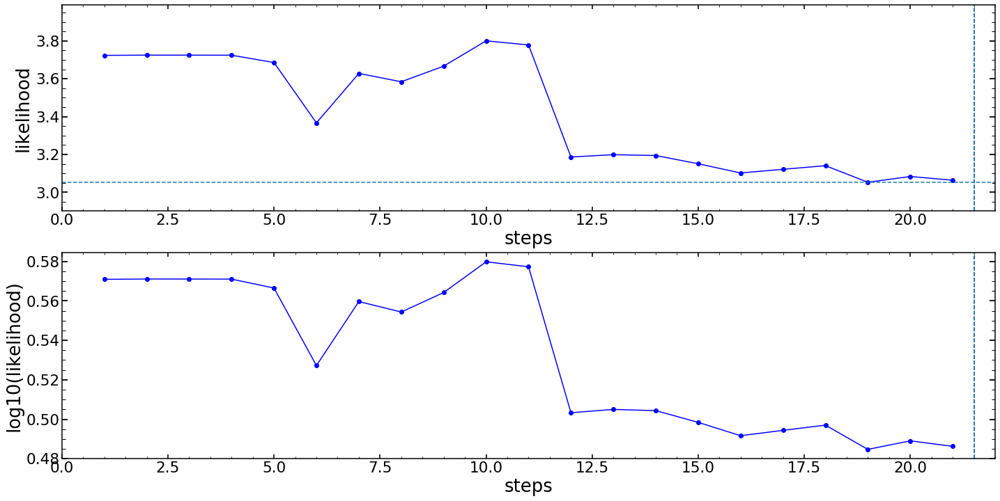

In [38]:
single_analysis.create_fitting_evolution_plot()

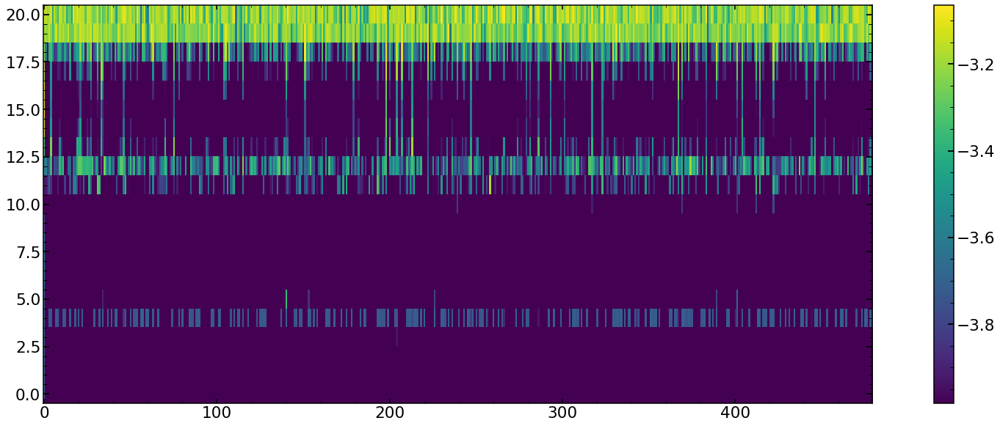

In [39]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()

In [40]:
list_of_which_particle_is_gbest=[]
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,38]==gbests_positions[i][38])[0][0]])
    
list_of_which_particle_is_gbest

[[0, 0],
 [1, 0],
 [2, 0],
 [3, 0],
 [4, 57],
 [5, 140],
 [6, 0],
 [7, 0],
 [8, 0],
 [9, 0],
 [10, 422],
 [11, 258],
 [12, 374],
 [13, 213],
 [14, 0],
 [15, 0],
 [16, 0],
 [17, 198],
 [18, 151],
 [19, 234],
 [20, 230]]

### image analysis 

In [70]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)




#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


res_multi_10=np.copy(res_multi)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

"""
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=True)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)
"""

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 2.49646
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.7731013
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47g
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   31.98879649    -0.23950389    -1.04713156     0.45226522
    -0.02665703    -0.05755913    -0.36201717    -0.77473736
    -0.00421549    -0.03262958    -0.04714263     0.04401641
    -0.03168213     0.02726043     0.02717285    -0.00992545
    -0.04892493    -0.00351613     0.18061678     0.64488234
     0.07733101    -0.04796971    -0.03974842     0.05739969
     0.0360364      0.32817029     0.1423118      

time_2-time_1 for shift and resize 0.0005466938018798828
time_3-time_2 for shift and resize 0.0014450550079345703
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.00020599365234375
time_3_3-time_3_2 for shift and resize 0.30738019943237305
time_4-time_3_3 for shift and resize 7.152557373046875e-07
time_4-time_3 for shift and resize 0.3075869083404541
time_5-time_4 for shift and resize 0.0024690628051757812
time_5-time_1 for shift and resize 0.31204771995544434
chi2 within shgo with use_only_chi True and use_center_of_light False [12.81533574  6.15826532] / 2.6904795
(875, 875)
[18.31533574432039, -4.841734684223233]
time_2-time_1 for shift and resize 0.0010690689086914062
time_3-time_2 for shift and resize 0.0025491714477539062
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.0001308917999267578
time_3_3-time_3_2 for shift and resize 0.27401089668273926
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-t

time_2-time_1 for shift and resize 0.0008599758148193359
time_3-time_2 for shift and resize 0.002117156982421875
time_3_1-time_3 for shift and resize 7.152557373046875e-07
time_3_2-time_3_1 for shift and resize 0.00014829635620117188
time_3_3-time_3_2 for shift and resize 0.24365901947021484
time_4-time_3_3 for shift and resize 1.6689300537109375e-06
time_4-time_3 for shift and resize 0.24380970001220703
time_5-time_4 for shift and resize 0.0026962757110595703
time_5-time_1 for shift and resize 0.2494831085205078
chi2 within shgo with use_only_chi True and use_center_of_light False [14.19033574  3.40826532] / 3.542409
(875, 875)
[3.1903357443203895, 25.408265315776767]
time_2-time_1 for shift and resize 0.000644683837890625
time_3-time_2 for shift and resize 0.0019032955169677734
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.0001537799835205078
time_3_3-time_3_2 for shift and resize 0.225128173828125
time_4-time_3_3 for shift and resize 2.14576721191

time_2-time_1 for shift and resize 0.0006258487701416016
time_3-time_2 for shift and resize 0.001558065414428711
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.702278137207031e-05
time_3_3-time_3_2 for shift and resize 0.2226729393005371
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-time_3 for shift and resize 0.2227621078491211
time_5-time_4 for shift and resize 0.002259969711303711
time_5-time_1 for shift and resize 0.22720599174499512
chi2 within shgo with use_only_chi True and use_center_of_light False [11.53380217  6.62013521] / 2.7073731
(875, 875)
[12.17456895710437, 6.158265315776767]
time_2-time_1 for shift and resize 0.0005848407745361328
time_3-time_2 for shift and resize 0.0014791488647460938
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.891654968261719e-05
time_3_3-time_3_2 for shift and resize 0.22733521461486816
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_

time_2-time_1 for shift and resize 0.0005030632019042969
time_3-time_2 for shift and resize 0.0015931129455566406
time_3_1-time_3 for shift and resize 9.5367431640625e-07
time_3_2-time_3_1 for shift and resize 7.724761962890625e-05
time_3_3-time_3_2 for shift and resize 0.2202298641204834
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.22030901908874512
time_5-time_4 for shift and resize 0.002061128616333008
time_5-time_1 for shift and resize 0.22446632385253906
chi2 within shgo with use_only_chi True and use_center_of_light False [12.14703601  5.82990468] / 2.6070137
(875, 875)
[11.934907160714005, 5.7983315470763355]
time_2-time_1 for shift and resize 0.0006601810455322266
time_3-time_2 for shift and resize 0.0014379024505615234
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.295608520507812e-05
time_3_3-time_3_2 for shift and resize 0.22322607040405273
time_4-time_3_3 for shift and resize 2.1457672119140

time_2-time_1 for shift and resize 0.0008001327514648438
time_3-time_2 for shift and resize 0.0021932125091552734
time_3_1-time_3 for shift and resize 9.5367431640625e-07
time_3_2-time_3_1 for shift and resize 8.606910705566406e-05
time_3_3-time_3_2 for shift and resize 0.2459876537322998
time_4-time_3_3 for shift and resize 3.0994415283203125e-06
time_4-time_3 for shift and resize 0.2460777759552002
time_5-time_4 for shift and resize 0.004024028778076172
time_5-time_1 for shift and resize 0.2530951499938965
chi2 within shgo with use_only_chi True and use_center_of_light False [12.00022214  5.79681279] / 2.6031146
(875, 875)
[11.991819137713087, 5.7947957197892705]
time_2-time_1 for shift and resize 0.0006430149078369141
time_3-time_2 for shift and resize 0.0019609928131103516
time_3_1-time_3 for shift and resize 9.5367431640625e-07
time_3_2-time_3_1 for shift and resize 8.20159912109375e-05
time_3_3-time_3_2 for shift and resize 0.3465421199798584
time_4-time_3_3 for shift and resize 

time_2-time_1 for shift and resize 0.0006549358367919922
time_3-time_2 for shift and resize 0.0025429725646972656
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 9.393692016601562e-05
time_3_3-time_3_2 for shift and resize 0.32489490509033203
time_4-time_3_3 for shift and resize 3.0994415283203125e-06
time_4-time_3 for shift and resize 0.32499194145202637
time_5-time_4 for shift and resize 0.0035979747772216797
time_5-time_1 for shift and resize 0.3317878246307373
chi2 within shgo with use_only_chi True and use_center_of_light False [11.98544859  5.79420978] / 2.603088
(875, 875)
[11.98463834323768, 5.795907420961621]
time_2-time_1 for shift and resize 0.0012149810791015625
time_3-time_2 for shift and resize 0.002974987030029297
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.0002570152282714844
time_3_3-time_3_2 for shift and resize 0.30456089973449707
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-t

time_2-time_1 for shift and resize 0.0006339550018310547
time_3-time_2 for shift and resize 0.001377105712890625
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.915496826171875e-05
time_3_3-time_3_2 for shift and resize 0.31415295600891113
time_4-time_3_3 for shift and resize 1.6689300537109375e-06
time_4-time_3 for shift and resize 0.31423377990722656
time_5-time_4 for shift and resize 0.0034101009368896484
time_5-time_1 for shift and resize 0.3196549415588379
chi2 within shgo with use_only_chi True and use_center_of_light False [11.984928    5.79347173] / 2.603087
(875, 875)
[11.984504651462814, 5.793458867011435]
time_2-time_1 for shift and resize 0.0007011890411376953
time_3-time_2 for shift and resize 0.0021398067474365234
time_3_1-time_3 for shift and resize 9.5367431640625e-07
time_3_2-time_3_1 for shift and resize 0.00011110305786132812
time_3_3-time_3_2 for shift and resize 0.23517298698425293
time_4-time_3_3 for shift and resize 1.90734863281

time_2-time_1 for shift and resize 0.0007619857788085938
time_3-time_2 for shift and resize 0.001981973648071289
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 9.894371032714844e-05
time_3_3-time_3_2 for shift and resize 0.30421018600463867
time_4-time_3_3 for shift and resize 1.9073486328125e-06
time_4-time_3 for shift and resize 0.30431103706359863
time_5-time_4 for shift and resize 0.0025010108947753906
time_5-time_1 for shift and resize 0.3095560073852539
chi2 within shgo with use_only_chi True and use_center_of_light False [11.98461011  5.79332318] / 2.6030867
(875, 875)
[11.984536175005843, 5.793376489895277]
time_2-time_1 for shift and resize 0.0006620883941650391
time_3-time_2 for shift and resize 0.0018270015716552734
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.988380432128906e-05
time_3_3-time_3_2 for shift and resize 0.3013629913330078
time_4-time_3_3 for shift and resize 1.9073486328125e-06
time_4-time_3

time_2-time_1 for shift and resize 0.0006959438323974609
time_3-time_2 for shift and resize 0.002207040786743164
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.392333984375e-05
time_3_3-time_3_2 for shift and resize 0.23434925079345703
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.2344341278076172
time_5-time_4 for shift and resize 0.0027179718017578125
time_5-time_1 for shift and resize 0.24005508422851562
chi2 within shgo with use_only_chi True and use_center_of_light False [11.98455989  5.79334075] / 2.6030867
(875, 875)
[11.984535452973468, 5.793354332111319]
time_2-time_1 for shift and resize 0.0005211830139160156
time_3-time_2 for shift and resize 0.0013689994812011719
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.988380432128906e-05
time_3_3-time_3_2 for shift and resize 0.2937779426574707
time_4-time_3_3 for shift and resize 4.291534423828125e-06
time_4-time_3 

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.000492095947265625
Time for FFT is 0.6217608451843262
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 38.60894120135926
size_of_central_cut: 1081
optPsf_cut.shape(1082, 1082)
oversampling:11
optPsf_cut.shape[0]1082
size_of_optPsf_cut_downsampled: 308
optPsf_cut_downsampled.shape: (309, 309)
size_of_optPsf_cut_in_Microns: 421.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[69558.46480471207, 2.069777274613648, 0.0013539187313994264, 0.3222330703278189, 1.7904252711257178]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(309, 309)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
1
socket.gethostname()IapetusUSA
Time for postprocessing up to single_

Time for postprocessing pupil after _get_Pupil 0.2930338382720947
Time for pupil and illumination calculation is 0.29801225662231445

Starting creation of wavefront
diam_sic [m]: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -31.195024751085935, 0.2674798653031896, -0.1389778343209222, 0.2959066814740901, 0.01216305274062161, 0.014257096514011039, -0.1748581681095737, -0.12533047646670598, -0.025154583143561674, 0.008754696055492344, 0.04406349281074865, 0.039488013759925195, -0.03623898711153876, 0.01303125405622057, -0.007244045332397192, -0.02458907512424917, -0.044265142026501496, -0.004778362901153992, -0.19169036948375615, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.2674798653031896, -0.1389778343209222, 0.2959066814740901, 0.01216305274062161, 0.014257096514011039, -0.1748581681095737, 0, -0.025154583143561

time_2-time_1 for shift and resize 0.0005772113800048828
time_3-time_2 for shift and resize 0.0015857219696044922
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.0108642578125e-05
time_3_3-time_3_2 for shift and resize 0.24887418746948242
time_4-time_3_3 for shift and resize 2.6226043701171875e-06
time_4-time_3 for shift and resize 0.24895691871643066
time_5-time_4 for shift and resize 0.0027892589569091797
time_5-time_1 for shift and resize 0.2539091110229492
chi2 within shgo with use_only_chi True and use_center_of_light False [ 3.72177912 -9.18061298] / 6.625712
(875, 875)
[5.0967791190305825, -22.930612977129897]
time_2-time_1 for shift and resize 0.0008628368377685547
time_3-time_2 for shift and resize 0.0018169879913330078
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 9.202957153320312e-05
time_3_3-time_3_2 for shift and resize 0.2957799434661865
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-

time_2-time_1 for shift and resize 0.0006337165832519531
time_3-time_2 for shift and resize 0.0020051002502441406
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.58306884765625e-05
time_3_3-time_3_2 for shift and resize 0.30365419387817383
time_4-time_3_3 for shift and resize 2.288818359375e-05
time_4-time_3 for shift and resize 0.30376291275024414
time_5-time_4 for shift and resize 0.003693103790283203
time_5-time_1 for shift and resize 0.31009483337402344
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.97177912 -14.68061298] / 3.218641
(875, 875)
[11.971779133931744, -14.680612977129897]
time_2-time_1 for shift and resize 0.0007560253143310547
time_3-time_2 for shift and resize 0.0026390552520751953
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 9.179115295410156e-05
time_3_3-time_3_2 for shift and resize 0.28789710998535156
time_4-time_3_3 for shift and resize 2.86102294921875e-06
time_4-ti

time_2-time_1 for shift and resize 0.0006358623504638672
time_3-time_2 for shift and resize 0.002151966094970703
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.00010228157043457031
time_3_3-time_3_2 for shift and resize 0.22705483436584473
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.2271580696105957
time_5-time_4 for shift and resize 0.0020999908447265625
time_5-time_1 for shift and resize 0.23204588890075684
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.67248464 -14.31359765] / 3.15792
(875, 875)
[12.121426358018457, -13.212551679416908]
time_2-time_1 for shift and resize 0.0006232261657714844
time_3-time_2 for shift and resize 0.0022170543670654297
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.487701416015625e-05
time_3_3-time_3_2 for shift and resize 0.2351229190826416
time_4-time_3_3 for shift and resize 1.9073486328125e-05
time_4-tim

time_2-time_1 for shift and resize 0.0008070468902587891
time_3-time_2 for shift and resize 0.0024709701538085938
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.0002181529998779297
time_3_3-time_3_2 for shift and resize 0.2866787910461426
time_4-time_3_3 for shift and resize 3.0994415283203125e-06
time_4-time_3 for shift and resize 0.28690004348754883
time_5-time_4 for shift and resize 0.0033369064331054688
time_5-time_1 for shift and resize 0.2935149669647217
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.87733622 -13.37410652] / 3.0660589
(875, 875)
[11.814057651571913, -13.357977917587577]
time_2-time_1 for shift and resize 0.0007648468017578125
time_3-time_2 for shift and resize 0.002580404281616211
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.00017070770263671875
time_3_3-time_3_2 for shift and resize 0.26966428756713867
time_4-time_3_3 for shift and resize 7.152557373046875e-07
tim

time_2-time_1 for shift and resize 0.0006058216094970703
time_3-time_2 for shift and resize 0.0015139579772949219
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.0108642578125e-05
time_3_3-time_3_2 for shift and resize 0.2595529556274414
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.25963401794433594
time_5-time_4 for shift and resize 0.002624034881591797
time_5-time_1 for shift and resize 0.2643778324127197
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.84403816 -13.36455991] / 3.0659962
(875, 875)
[11.834417655825584, -13.3832450999463]
time_2-time_1 for shift and resize 0.0006871223449707031
time_3-time_2 for shift and resize 0.0014710426330566406
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.796287536621094e-05
time_3_3-time_3_2 for shift and resize 0.23473095893859863
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3

time_2-time_1 for shift and resize 0.0011279582977294922
time_3-time_2 for shift and resize 0.002950906753540039
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.000141143798828125
time_3_3-time_3_2 for shift and resize 0.32187390327453613
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.32201600074768066
time_5-time_4 for shift and resize 0.002361297607421875
time_5-time_1 for shift and resize 0.32845616340637207
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.83934049 -13.38289588] / 3.0659685
(875, 875)
[11.838840906360833, -13.380207505545819]
time_2-time_1 for shift and resize 0.0011210441589355469
time_3-time_2 for shift and resize 0.0030012130737304688
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.0001289844512939453
time_3_3-time_3_2 for shift and resize 0.2472367286682129
time_4-time_3_3 for shift and resize 3.0994415283203125e-06
time_4-

time_2-time_1 for shift and resize 0.0005528926849365234
time_3-time_2 for shift and resize 0.0020880699157714844
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.296966552734375e-05
time_3_3-time_3_2 for shift and resize 0.2809441089630127
time_4-time_3_3 for shift and resize 1.9073486328125e-06
time_4-time_3 for shift and resize 0.28102898597717285
time_5-time_4 for shift and resize 0.0023682117462158203
time_5-time_1 for shift and resize 0.2860381603240967
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.83939267 -13.38312426] / 3.0659685
(875, 875)
[11.839409348353815, -13.382820840611629]
time_2-time_1 for shift and resize 0.0008101463317871094
time_3-time_2 for shift and resize 0.0020439624786376953
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.392333984375e-05
time_3_3-time_3_2 for shift and resize 0.22970199584960938
time_4-time_3_3 for shift and resize 1.9073486328125e-06
time_4-time

time_2-time_1 for shift and resize 0.0008287429809570312
time_3-time_2 for shift and resize 0.001967191696166992
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.082389831542969e-05
time_3_3-time_3_2 for shift and resize 0.2223191261291504
time_4-time_3_3 for shift and resize 1.1920928955078125e-06
time_4-time_3 for shift and resize 0.22240114212036133
time_5-time_4 for shift and resize 0.0020847320556640625
time_5-time_1 for shift and resize 0.22728180885314941
chi2 within shgo with use_only_chi True and use_center_of_light False [ 11.8393491 -13.3828865] / 3.0659685
(875, 875)
[11.839348401802708, -13.382899144665693]
time_2-time_1 for shift and resize 0.0007696151733398438
time_3-time_2 for shift and resize 0.0019021034240722656
time_3_1-time_3 for shift and resize 1.1920928955078125e-06
time_3_2-time_3_1 for shift and resize 7.700920104980469e-05
time_3_3-time_3_2 for shift and resize 0.2235429286956787
time_4-time_3_3 for shift and resize 1.1920928

/opt/miniconda3/envs/idp2_pyfftw/lib/python3.8/site-packages/numpy/lib/function_base.py:793: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, order=order, subok=subok, copy=True)


'\nindex_of_single_image=1\nmodel = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,\n                      simulation_00=True)  \n\nres_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)\n'

In [72]:
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=True)  

res_with_Image_10=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7328897
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.6817136
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47g
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.39688587     0.01398799    -0.5930547      0.37408595
    -0.00724699    -0.02165102    -0.26843767    -0.45003392
    -0.01468504    -0.01193744    -0.00153957     0.04175221
    -0.03396056     0.02014584     0.0099644     -0.01725726
    -0.04659504    -0.00414725    -0.00553679     0.64488234
     0.07733101    -0.04796971    -0.03974842     0.05739969
     0.0360364      0.32817029     0.1423118      0.001696
     1.19625273     0.00786866    -0.04978565     

(309, 309)
[1.5790966803514532, 2.106772515229192]
time_2-time_1 for shift and resize 0.0007390975952148438
time_3-time_2 for shift and resize 0.0016431808471679688
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.893013000488281e-05
time_3_3-time_3_2 for shift and resize 0.031787872314453125
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.031877756118774414
time_5-time_4 for shift and resize 0.0006930828094482422
time_5-time_1 for shift and resize 0.03495311737060547
sim00=False and center of light =true
(309, 309)
[1.5790470252616675, 2.10765996458883]
time_2-time_1 for shift and resize 0.00043511390686035156
time_3-time_2 for shift and resize 0.0005428791046142578
time_3_1-time_3 for shift and resize 9.5367431640625e-07
time_3_2-time_3_1 for shift and resize 7.200241088867188e-05
time_3_3-time_3_2 for shift and resize 0.03223133087158203
time_4-time_3_3 for shift and resize 1.6689300537109375e-06
time_4-t

In [73]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [74]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(len(list_of_sci_images)):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-89.72824097 -70.3238678  -80.8219986 ]


'model pixels with a flux larger than (quantile_08_focus): 5.791532516479496'

mean reported value:-5.093181133270264
array_of_single_res: [-3.65943623 -7.54899263 -4.07111454]
renormalization factors: [1. 1. 1.]
array_of_single_res renormalized: [-3.65943623 -7.54899263 -4.07111454]


([<matplotlib.axis.XTick at 0x7ff05d5f3130>,
 <a list of 3 Text xticklabel objects>)

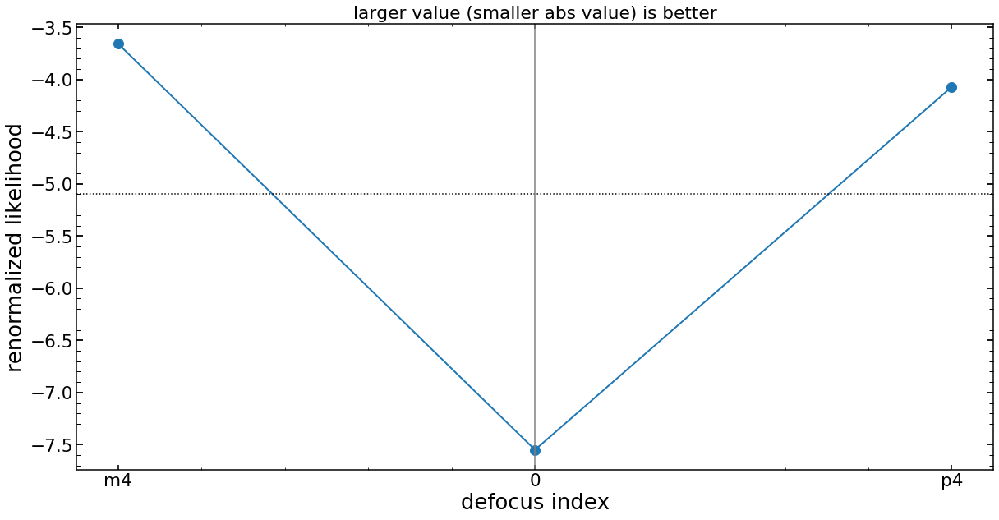

In [75]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.ones(len(list_of_sci_images))


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.title('larger value (smaller abs value) is better')

plt.axvline(np.where(np.array(list_of_defocuses_input_short_with_focus)=='0')[0][0],color='gray')
plt.xticks(np.arange(len(list_of_defocuses_input_short_with_focus)),list_of_defocuses_input_short_with_focus)

In [76]:
minchain=list_of_minchain[1]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0  0.396886  0.013988 -0.593055  0.374086 -0.007247 -0.021651 -0.268438   

        z11  
0 -0.450034  
##############################################
        z12       z13      z14       z15       z16       z17       z18  \
0 -0.014685 -0.011937 -0.00154  0.041752 -0.033961  0.020146  0.009964   

        z19       z20       z21       z22  
0 -0.017257 -0.046595 -0.004147 -0.005537  

##############################################
    hscFrac  strutFrac  dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.644882   0.077331 -0.04797 -0.039748    0.0574     0.036036
##############################################
    wide_0   wide_23   wide_43  misalign
0  0.32817  0.142312  0.001696  1.196253
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.007869 -0.049786                       0.971966   0.047735   

   frd_lorentz_factor  
0  

(-1.5, -0.5)

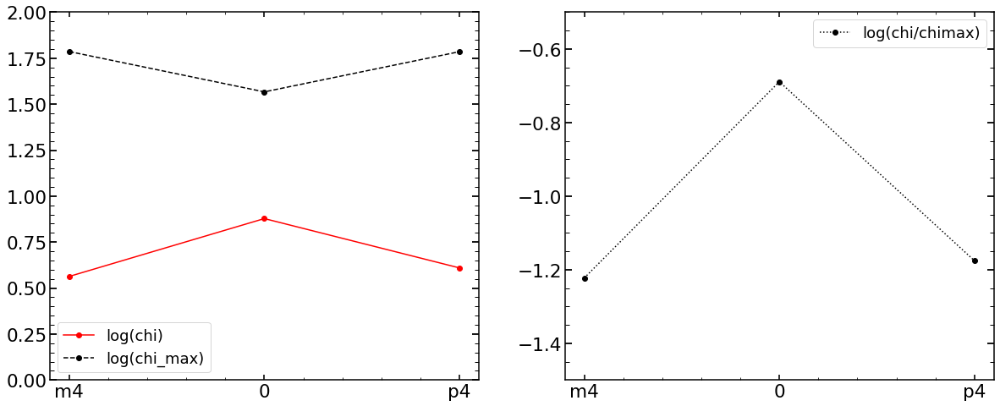

In [77]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

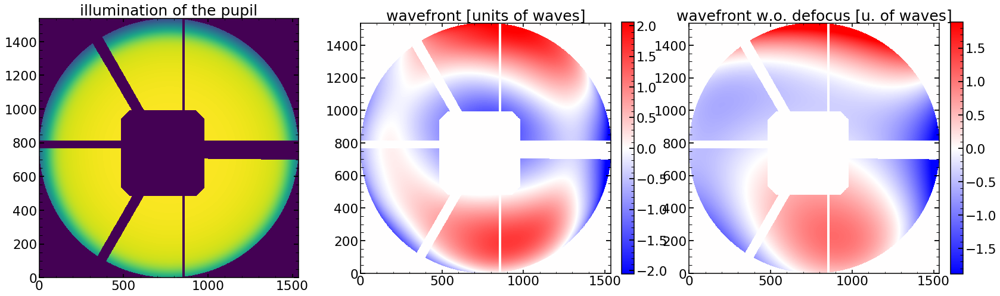

In [78]:
# save has to be save=1 for this to update
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 2.49646
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.7731013
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47g
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 20.720561027526855
---------------------
chi**2 max reduced is: 2819.706
chi**2 reduced is: 13.773485 for log improvement: -2.31116
chi max reduced is: 34.73165
chi reduced is: 2.597065 for log improvement: -1.1262426
---------------------
chi**2 reduced within custom mask area is: 13.773485
---------------------
chi**2 max reduced within flux mask area is: 5154.543
chi**2 reduced within flux mask area is: 22.99619 for log improvement: -2.3505342
chi max 

/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_2528/468137248.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array_of_sci_image=np.array(list_of_sci_images)
/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_2528/468137248.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array_of_single_model_image=np.array(list_of_single_model_image)
/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_2528/468137248.py:26: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lis

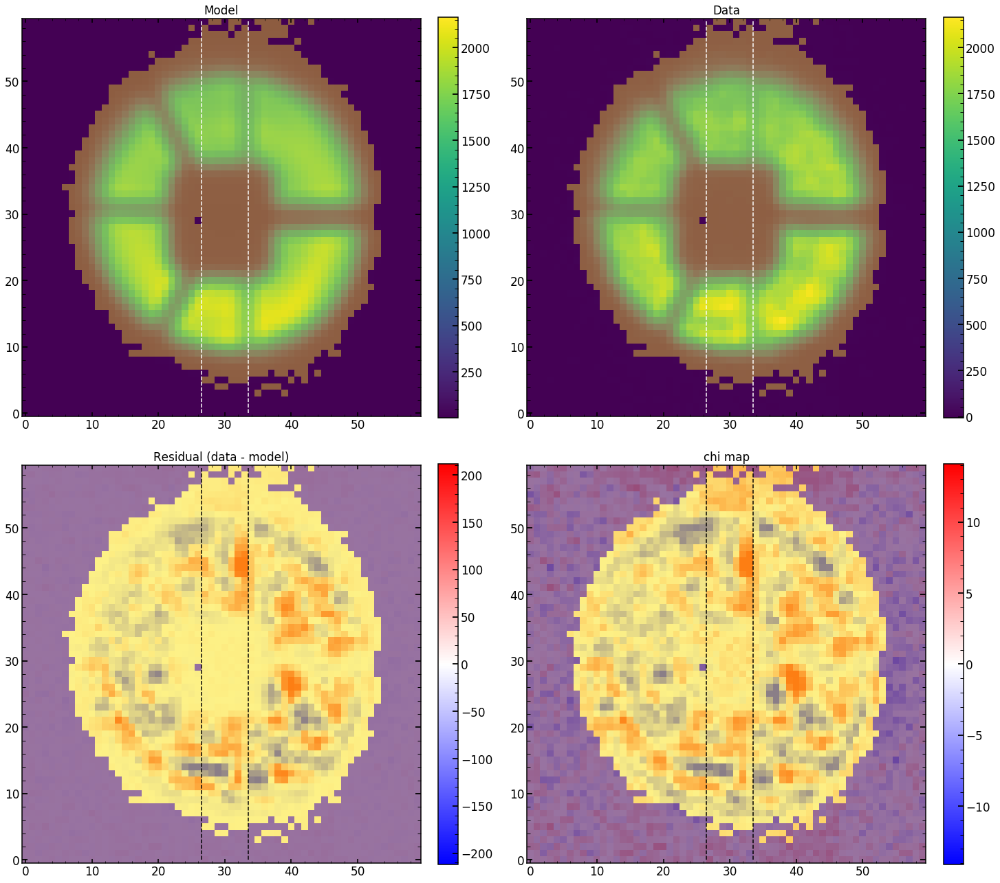

In [79]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_single_model_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_var_images)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 2.49646
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.7731013
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47g
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 20.720561027526855
fraction of chi2 due to 1% of pixels: 0.11864141
---------------------
chi**2 max reduced is: 2819.706
chi**2 reduced is: 13.773485 for log improvement: -2.31116
chi max reduced is: 34.73165
chi reduced is: 2.597065 for log improvement: -1.1262426
---------------------
chi**2 reduced within custom mask area is: 13.773485
---------------------
chi**2 max reduced within flux mask area is: 5154.543
chi**2 reduced within flux mask area is: 

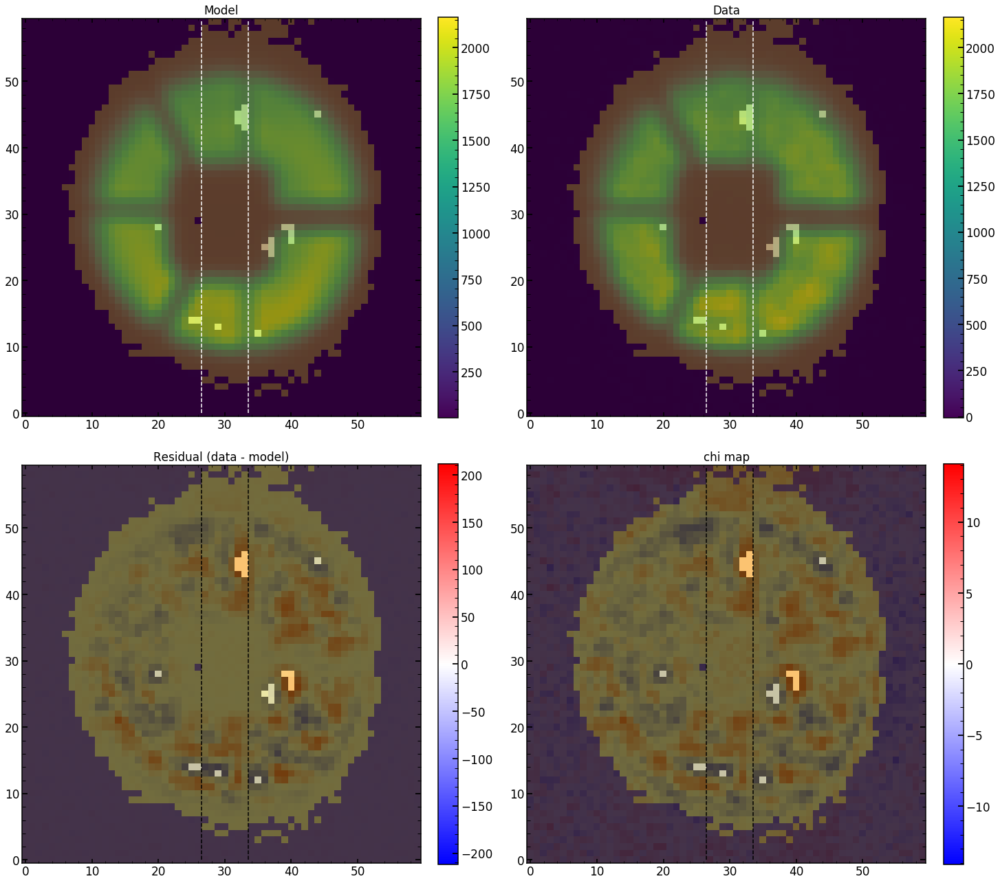

In [80]:
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 2.49646
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.7731013
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47g
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 20.720561027526855
---------------------
chi**2 max reduced is: 2819.706
chi**2 reduced is: 13.773485 for log improvement: -2.31116
chi max reduced is: 34.73165
chi reduced is: 2.597065 for log improvement: -1.1262426
---------------------
chi**2 reduced within custom mask area is: 13.773485
---------------------
chi**2 max reduced within flux mask area is: 5154.543
chi**2 reduced within flux mask area is: 22.99619 for log improvement: -2.3505342
chi max 

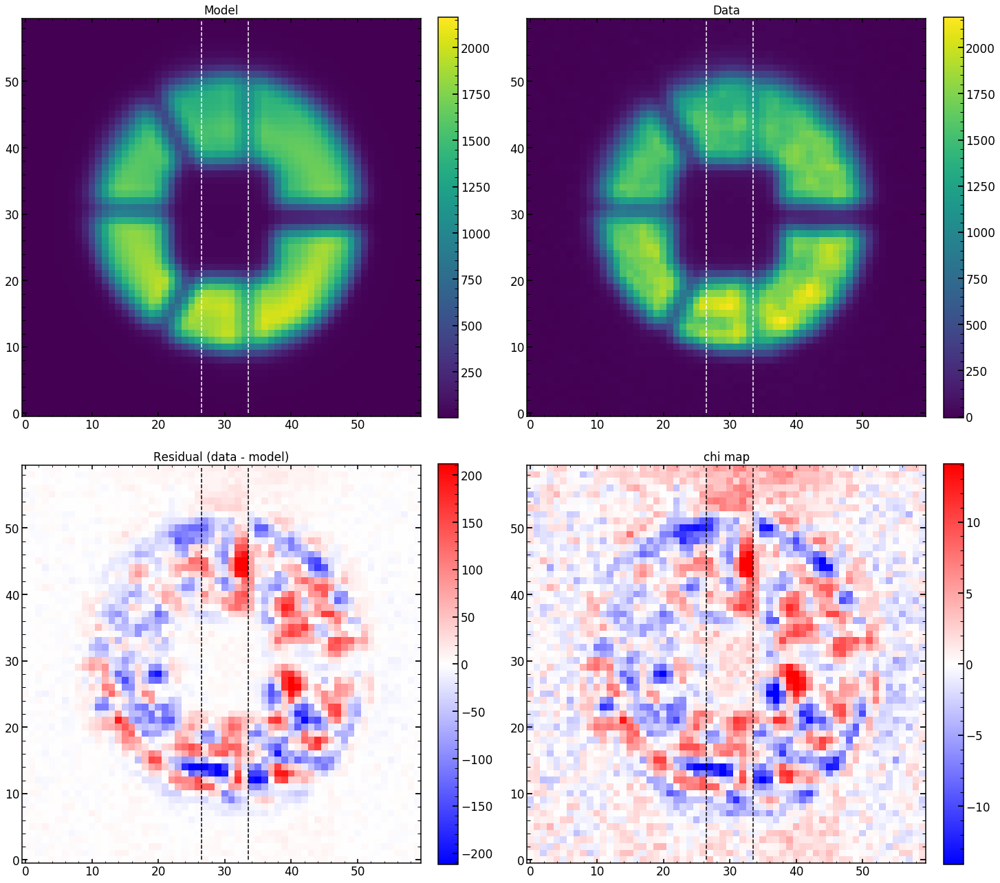

In [81]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7328897
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.6817136
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47g
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 9.163277864456177
---------------------
chi**2 max reduced is: 300.48175
chi**2 reduced is: 15.466131 for log improvement: -1.2884364
chi max reduced is: 5.0893574
chi reduced is: 2.0405178 for log improvement: -0.39692256
---------------------
chi**2 reduced within custom mask area is: 15.466131
---------------------
chi**2 max reduced within flux mask area is: 2544.287
chi**2 reduced within flux mask area is: 109.72214 for log improvement: -1.3652719

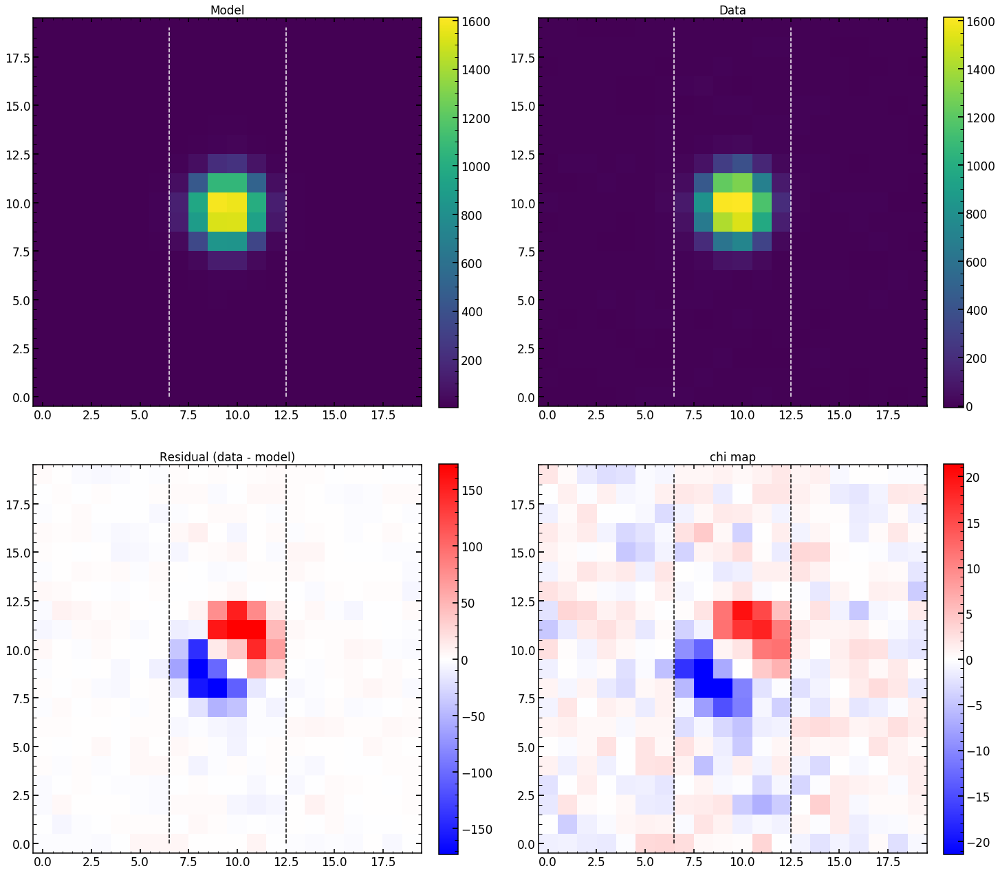

In [82]:
index_of_single_image=1
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 300.48175
chi**2 reduced is: 15.466131
Abs of residual divided by total flux is: 0.19084121
Abs of residual divided by largest value of a flux in the image is: 0.14478822


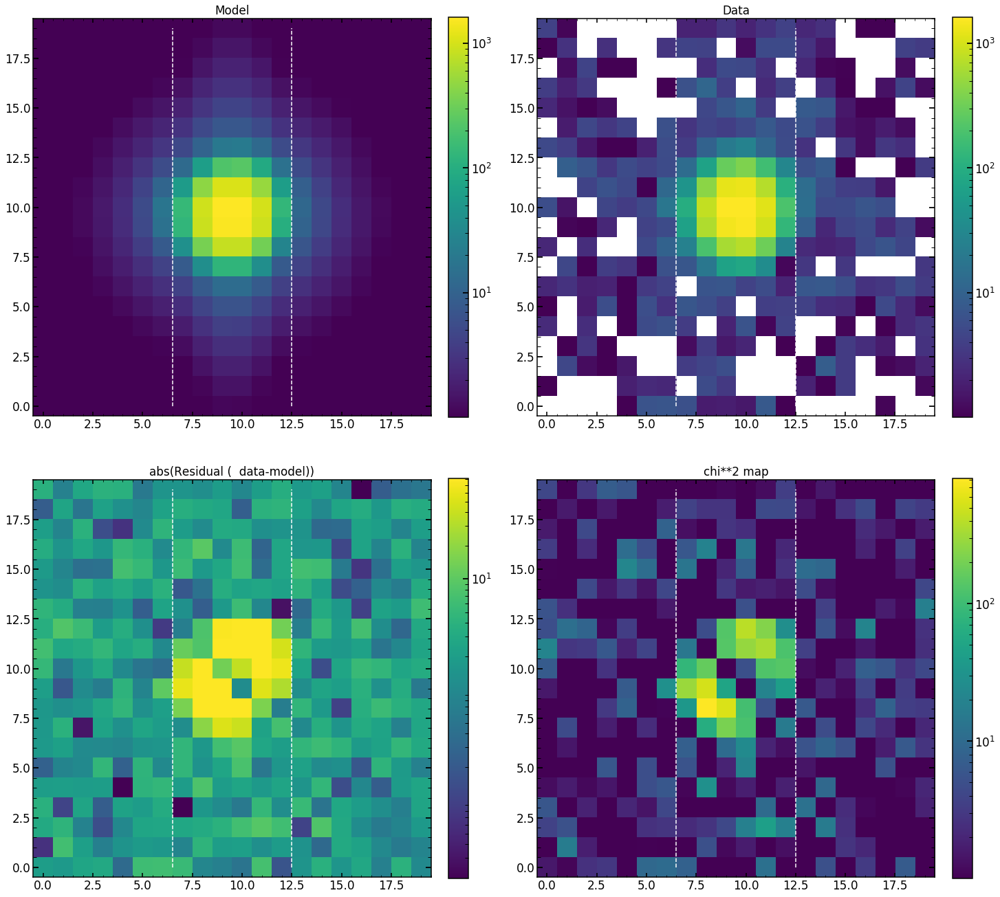

In [83]:
index_of_single_image=1
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

15.466131
chi**2 reduced is: 15.466131
Abs of residual divided by total flux is: 0.19084121
Abs of residual divided by largest value of a flux in the image is: 0.14478822


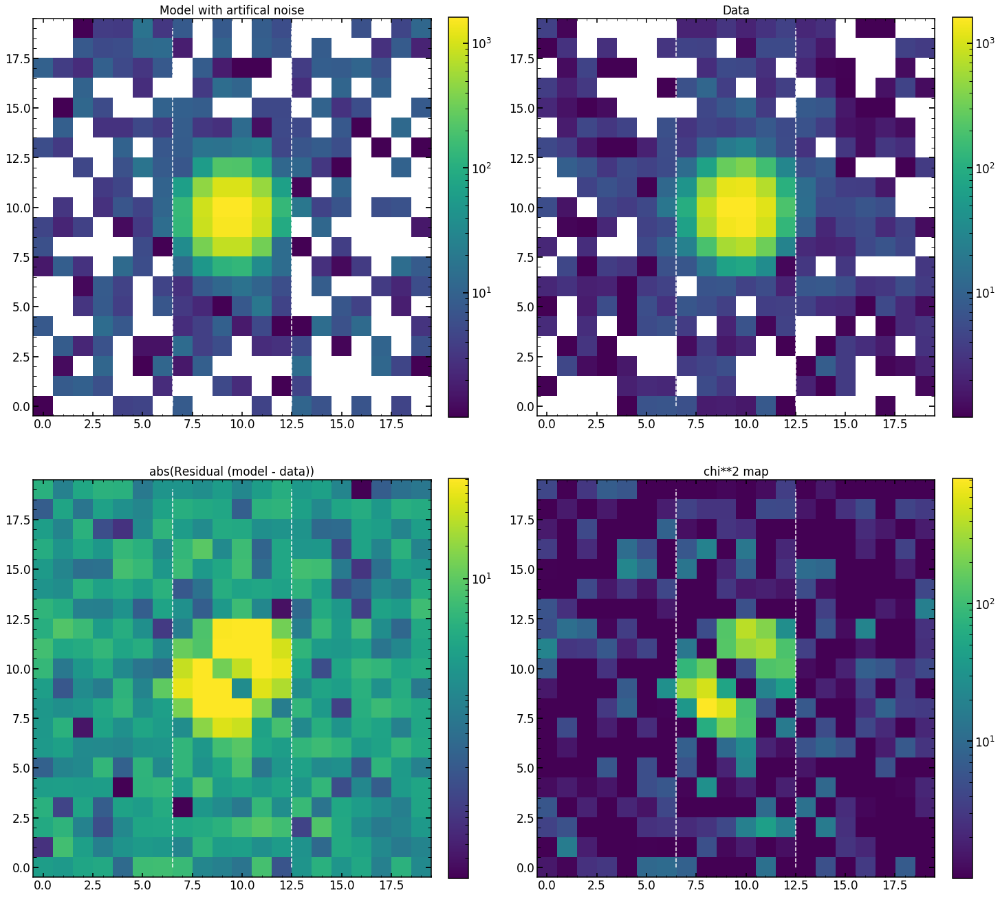

In [84]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

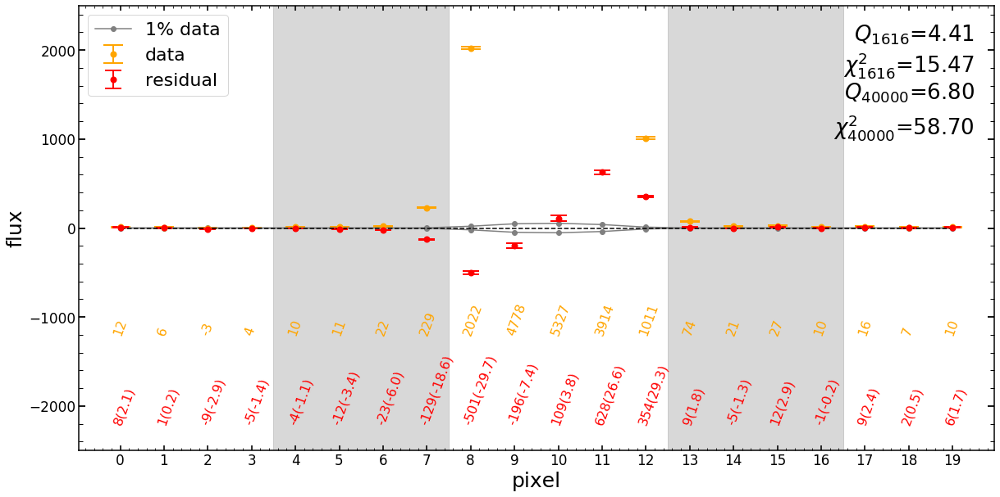

In [85]:
index_of_single_image=1
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## results everywhere 

In [29]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar[:,1])

unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne[:,1])

if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr[:,1])
else:
    unique_numbers_Kr=np.array([])


In [30]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443718ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.245847582817078
average chi2 reduced is: -4.905127790307131
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371148ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.14926815032959
average chi2 reduced is: -5.088554361087559
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 115
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371158ArSwarm1.npy
(21, 480, 129)
minimal likelihood 

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437238ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.236481348673503
average chi2 reduced is: -4.665203003497479
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 25
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437258ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.427646438280742
average chi2 reduced is: -4.564249387751716
STAMPS_FOLDER: /Vol

<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437418ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.863253831863403
average chi2 reduced is: -5.928834456782329
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 42
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAn

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 56
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437568ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.332981109619141
average chi2 reduced is: -5.046159811946364
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 57
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<

<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443778ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.384799321492514
average chi2 reduced is: -5.398362679543785
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 71
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnal

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 87
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437878ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 2.806591192881266
average chi2 reduced is: -4.171085153309425
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 89
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<

In [31]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313118NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.832126299540201
average chi2 reduced is: -5.670083981260349
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 14
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]


<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313418NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.632570743560791
average chi2 reduced is: -6.099092524206805
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 42
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalys

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313698NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.593010028203328
average chi2 reduced is: -4.961217813995732
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 74
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313748NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.268843015034994
average chi2 reduced is: -5.802703335554812
STAMPS_FOLDER: /Vo

In [32]:
results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34561, 34567, 34573, 34603, 34609, 34615, 34645, 34651, 34657]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34561
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34657118KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.806947867075602
average chi2 reduced is: -5.30391605734905
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 15
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34561, 34567, 34573, 34603, 34609, 34615, 34645, 34651, 34657]
<_

In [33]:
# just the ones without neigbhours done with 0.47f 

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

## adding proper chi2 values 

In [34]:
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 2.9287925
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.6706638
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [     0.91672063      0.45975831     -0.24301141      0.52013614
      0.48295412      0.03891698     -0.36331903     -0.22739848
     -0.06454541     -0.13011551     -0.05421691     -0.01630217
     -0.01114651      0.01283405      0.00198466      0.02720952
     -0.01619534      0.00348599      0.03207345      0.67645916
      0.0898145      -0.13768708     -0.08622358      0.05174337
      0.01933563      0.25315478      0.12590708      0.01664304
      0.60478431     

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [  2.24932865 -15.38431043] / 1.5087297373369772
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-8.75067135  6.61568957] / 0.8913604305038916
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-7.37567135 -7.13431043] / 0.9692023048102807
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 3.62432865 14.86568957] / 1.2911616422025554
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [  9.12432865 -18.13431043] / 1.9407045766107982
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-1.87567135  3.86568957] / 0.2749481522273565
sim00=False and center of light =true
chi2 within shgo with use_on

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.50566383  1.11828745] / 1.4032549350173077e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.50584936  1.11823988] / 3.5100153626593985e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.50581561  1.11816239] / 5.1523929867814546e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.50581281  1.11819541] / 2.047891304961065e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.50589152  1.1182183 ] / 6.178634629602575e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.50580086  1.11821732] / 1.1981845952528158e-06
sim00=False and center of light =true
chi2 withi

In [35]:
date='Aug0121'
obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

Ar_index=results_of_fit_many_Ar['0'].index.values
for single_number in tqdm(Ar_index):
    
    wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])
    
    single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis.create_basic_data_image()

    double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
    list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
    index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
    columns,columns22,columns22_analysis=single_analysis.return_columns()

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()

    model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                       wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                extraZernike=None,pupilExplicit=None,simulation_00=None,
                double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                      use_center_of_flux=True)   

    
    #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
    #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

    res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
    np.save('/Volumes/Saturn_USA/PFS/Images/Aug0121/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_Ar[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_Ar[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

  0%|                                                                                                                             | 0/80 [00:00<?, ?it/s]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 1
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443718ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443718ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443718ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.245847582817078
average chi2 reduced is: -4.752740260558706
simulation_00 here is: None
sim0

/opt/miniconda3/envs/idp2_pyfftw/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)
  1%|█▍                                                                                                                 | 1/80 [00:48<1:04:12, 48.76s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371018ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371018ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371018ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.04208262761434
average chi2 reduced is: -5.5696443185302815
simulation_00 here 

  2%|██▉                                                                                                                | 2/80 [01:43<1:08:19, 52.56s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 102
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371028ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371028ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371028ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.4684403737386065
average chi2 reduced is: -4.872012326444699
simulation_00 here is: 

  4%|████▎                                                                                                              | 3/80 [02:38<1:08:44, 53.57s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 103
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371038ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371038ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371038ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.302714745203653
average chi2 reduced is: -5.064055788937626
simulation_00 here i

  5%|█████▊                                                                                                             | 4/80 [03:32<1:07:50, 53.56s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 104
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371048ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371048ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371048ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.083636204401652
average chi2 reduced is: -4.801141114150297
simulation_00 here is: N

  6%|███████▏                                                                                                           | 5/80 [04:26<1:07:09, 53.72s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 105
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371058ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371058ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371058ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 19.706578254699707
average chi2 reduced is: -5.81763929478289
simulation_00 here is: N

  8%|████████▋                                                                                                          | 6/80 [05:19<1:05:50, 53.38s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 107
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371078ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371078ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371078ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.326664129892985
average chi2 reduced is: -4.546465569368335
simulation_00 here is: N

  9%|██████████                                                                                                         | 7/80 [06:17<1:07:09, 55.19s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 109
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371098ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371098ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371098ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.524066726366679
average chi2 reduced is: -4.57262044753854
simulation_00 here is: No

 10%|███████████▌                                                                                                       | 8/80 [07:11<1:05:31, 54.61s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437118ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437118ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437118ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.565005779266357
average chi2 reduced is: -4.610432568601569
simulation_00 here is: None


 11%|████████████▉                                                                                                      | 9/80 [08:03<1:03:54, 54.00s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 111
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371118ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371118ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371118ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.3476941188176474
average chi2 reduced is: -4.145235055500266
simulation_00 here is: 

 12%|██████████████▎                                                                                                   | 10/80 [08:57<1:02:40, 53.72s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 113
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371138ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371138ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371138ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.564520994822184
average chi2 reduced is: -5.571271187038634
simulation_00 here 

 14%|███████████████▋                                                                                                  | 11/80 [09:54<1:03:10, 54.93s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 114
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371148ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371148ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371148ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.14926815032959
average chi2 reduced is: -4.8706392893036465
simulation_00 here is: N

 15%|█████████████████                                                                                                 | 12/80 [10:50<1:02:37, 55.26s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 115
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371158ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371158ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371158ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.420912424723307
average chi2 reduced is: -5.064268167420335
simulation_00 here i

 16%|██████████████████▌                                                                                               | 13/80 [11:46<1:01:45, 55.31s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 116
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371168ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371168ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371168ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.663743893305461
average chi2 reduced is: -4.804961767583883
simulation_00 here is: N

 18%|████████████████████▎                                                                                               | 14/80 [12:37<59:22, 53.97s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 117
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371178ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371178ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371178ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 25.37782080968221
average chi2 reduced is: -5.8123592673878735
simulation_00 here is: 

 19%|█████████████████████▊                                                                                              | 15/80 [13:31<58:39, 54.14s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 119
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371198ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371198ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_344371198ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.960898081461589
average chi2 reduced is: -4.5251067961020475
simulation_00 here is: 

 20%|███████████████████████▏                                                                                            | 16/80 [14:26<58:08, 54.50s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 13
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437138ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437138ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437138ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.8105008999506635
average chi2 reduced is: -4.592298010424397
simulation_00 here is: None

 21%|████████████████████████▏                                                                                         | 17/80 [15:38<1:02:32, 59.56s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 15
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437158ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437158ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437158ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.053055922190348
average chi2 reduced is: -4.196821213516641
simulation_00 here is: None


 22%|█████████████████████████▋                                                                                        | 18/80 [16:33<1:00:10, 58.23s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 17
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437178ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437178ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437178ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.943159262339273
average chi2 reduced is: -5.487858591276242
simulation_00 here is: 

 24%|███████████████████████████▌                                                                                        | 19/80 [17:28<58:17, 57.34s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 18
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437188ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437188ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437188ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.048483371734619
average chi2 reduced is: -4.853936681567714
simulation_00 here is: None


 25%|█████████████████████████████                                                                                       | 20/80 [18:18<55:03, 55.05s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 19
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437198ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437198ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437198ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.416153192520142
average chi2 reduced is: -5.029877416692102
simulation_00 here is: N

 26%|██████████████████████████████▍                                                                                     | 21/80 [19:12<53:58, 54.89s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 20
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437208ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437208ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437208ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.979345401128133
average chi2 reduced is: -4.790229929371
simulation_00 here is: None
sim

 28%|███████████████████████████████▉                                                                                    | 22/80 [20:05<52:21, 54.17s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 21
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437218ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437218ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437218ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 15.03740135828654
average chi2 reduced is: -5.7409253536140845
simulation_00 here is: None

 29%|█████████████████████████████████▎                                                                                  | 23/80 [20:59<51:26, 54.15s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 23
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437238ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437238ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437238ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.236481348673503
average chi2 reduced is: -4.528948218612999
simulation_00 here is: None


 30%|██████████████████████████████████▊                                                                                 | 24/80 [21:55<51:00, 54.65s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 25
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437258ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437258ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437258ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.427646438280742
average chi2 reduced is: -4.435373462625914
simulation_00 here is: None


 31%|████████████████████████████████████▎                                                                               | 25/80 [22:44<48:43, 53.16s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 27
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437278ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437278ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437278ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 2.8646080493927
average chi2 reduced is: -4.051308197914273
simulation_00 here is: None
si

 32%|█████████████████████████████████████▋                                                                              | 26/80 [23:37<47:45, 53.06s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 29
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437298ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437298ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437298ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.551579316457113
average chi2 reduced is: -5.286448191214506
simulation_00 here is: N

 34%|███████████████████████████████████████▏                                                                            | 27/80 [24:32<47:23, 53.66s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 3
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443738ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443738ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443738ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.747348149617513
average chi2 reduced is: -4.352713895335947
simulation_00 here is: None
sim0

 35%|████████████████████████████████████████▌                                                                           | 28/80 [25:31<47:49, 55.18s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 30
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437308ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437308ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437308ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.381919860839844
average chi2 reduced is: -4.6907739206153485
simulation_00 here is: None

 36%|██████████████████████████████████████████                                                                          | 29/80 [26:22<45:53, 54.00s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 31
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437318ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437318ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437318ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.314555088678996
average chi2 reduced is: -4.842187321616532
simulation_00 here is: N

 38%|███████████████████████████████████████████▌                                                                        | 30/80 [27:15<44:38, 53.58s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 32
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437328ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437328ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437328ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.887066046396892
average chi2 reduced is: -4.613922597471143
simulation_00 here is: None


 39%|████████████████████████████████████████████▉                                                                       | 31/80 [28:05<42:59, 52.64s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 33
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437338ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437338ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437338ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.379428227742514
average chi2 reduced is: -5.511380819718403
simulation_00 here is: None

 40%|██████████████████████████████████████████████▍                                                                     | 32/80 [28:56<41:33, 51.96s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 35
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437358ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437358ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437358ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.433014154434204
average chi2 reduced is: -4.374115470673223
simulation_00 here is: None


 41%|███████████████████████████████████████████████▊                                                                    | 33/80 [29:47<40:34, 51.81s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 37
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437378ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437378ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437378ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.347680966059367
average chi2 reduced is: -4.66403836215691
simulation_00 here is: None
s

 42%|█████████████████████████████████████████████████▎                                                                  | 34/80 [30:39<39:47, 51.89s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 39
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437398ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437398ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437398ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.214350859324137
average chi2 reduced is: -4.251978707925744
simulation_00 here is: None


 44%|██████████████████████████████████████████████████▊                                                                 | 35/80 [31:32<39:08, 52.20s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 41
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437418ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437418ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437418ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.863253831863403
average chi2 reduced is: -5.626941613635252
simulation_00 here is: 

 45%|████████████████████████████████████████████████████▏                                                               | 36/80 [32:22<37:49, 51.58s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 42
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437428ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437428ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437428ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.206002553304036
average chi2 reduced is: -4.960249126151918
simulation_00 here is: None


 46%|█████████████████████████████████████████████████████▋                                                              | 37/80 [33:14<36:56, 51.55s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 43
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437438ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437438ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437438ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.713026364644368
average chi2 reduced is: -5.138794556618532
simulation_00 here is: N

 48%|███████████████████████████████████████████████████████                                                             | 38/80 [34:08<36:40, 52.40s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 44
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437448ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437448ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437448ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.738431692123413
average chi2 reduced is: -4.899101135388311
simulation_00 here is: None


 49%|████████████████████████████████████████████████████████▌                                                           | 39/80 [35:01<35:49, 52.42s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 45
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437458ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437458ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437458ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 24.82293446858724
average chi2 reduced is: -5.818637030880377
simulation_00 here is: None


 50%|██████████████████████████████████████████████████████████                                                          | 40/80 [35:56<35:37, 53.43s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 47
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437478ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437478ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437478ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.736122290293376
average chi2 reduced is: -4.647935453040491
simulation_00 here is: None


 51%|███████████████████████████████████████████████████████████▍                                                        | 41/80 [36:49<34:37, 53.26s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 49
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437498ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437498ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437498ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.112339337666829
average chi2 reduced is: -4.5900536143756305
simulation_00 here is: None

 52%|████████████████████████████████████████████████████████████▉                                                       | 42/80 [37:42<33:37, 53.09s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 5
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443758ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443758ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443758ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.120256265004477
average chi2 reduced is: -5.666659567236896
simulation_00 here is: None

 54%|██████████████████████████████████████████████████████████████▎                                                     | 43/80 [38:37<33:03, 53.60s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437518ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.117834448814392
average chi2 reduced is: -4.187660333497099
simulation_00 here is: None


 55%|███████████████████████████████████████████████████████████████▊                                                    | 44/80 [39:28<31:43, 52.88s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 53
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437538ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437538ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437538ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.468893686930338
average chi2 reduced is: -5.586938063588078
simulation_00 here is: 

 56%|█████████████████████████████████████████████████████████████████▎                                                  | 45/80 [40:16<30:03, 51.53s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 54
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437548ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437548ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437548ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.391885280609131
average chi2 reduced is: -4.900122685645176
simulation_00 here is: None


 57%|██████████████████████████████████████████████████████████████████▋                                                 | 46/80 [41:09<29:21, 51.82s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 55
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437558ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437558ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437558ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.675555388132731
average chi2 reduced is: -5.0971820311226255
simulation_00 here is: 

 59%|████████████████████████████████████████████████████████████████████▏                                               | 47/80 [42:01<28:36, 52.00s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 56
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437568ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437568ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437568ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.332981109619141
average chi2 reduced is: -4.836099869349571
simulation_00 here is: None


 60%|█████████████████████████████████████████████████████████████████████▌                                              | 48/80 [42:52<27:30, 51.59s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 57
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437578ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437578ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437578ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 15.755043983459473
average chi2 reduced is: -5.847575655917919
simulation_00 here is: None

 61%|███████████████████████████████████████████████████████████████████████                                             | 49/80 [43:47<27:11, 52.64s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 59
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437598ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437598ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437598ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.059937636057536
average chi2 reduced is: -4.606346448327785
simulation_00 here is: None


 62%|████████████████████████████████████████████████████████████████████████▌                                           | 50/80 [44:37<25:55, 51.85s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 6
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443768ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443768ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443768ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.260474602381388
average chi2 reduced is: -5.008744719898227
simulation_00 here is: None
sim0

 64%|█████████████████████████████████████████████████████████████████████████▉                                          | 51/80 [45:31<25:23, 52.55s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 61
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437618ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437618ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437618ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.392606218655904
average chi2 reduced is: -4.577981583965431
simulation_00 here is: None


 65%|███████████████████████████████████████████████████████████████████████████▍                                        | 52/80 [46:27<24:57, 53.47s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 63
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437638ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437638ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437638ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 2.6307749350865683
average chi2 reduced is: -4.157863054454311
simulation_00 here is: None

 66%|████████████████████████████████████████████████████████████████████████████▊                                       | 53/80 [47:18<23:46, 52.84s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 65
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437658ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437658ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437658ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.88308318456014
average chi2 reduced is: -5.5640378704353886
simulation_00 here is: 

 68%|██████████████████████████████████████████████████████████████████████████████▎                                     | 54/80 [48:13<23:11, 53.51s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 66
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437668ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437668ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437668ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.432292381922404
average chi2 reduced is: -4.896044225013147
simulation_00 here is: None


 69%|███████████████████████████████████████████████████████████████████████████████▊                                    | 55/80 [49:02<21:40, 52.02s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 67
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437678ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437678ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437678ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.680515607198079
average chi2 reduced is: -5.075012574089192
simulation_00 here is: N

 70%|█████████████████████████████████████████████████████████████████████████████████▏                                  | 56/80 [49:55<20:58, 52.42s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 68
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437688ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437688ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437688ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.393919308980306
average chi2 reduced is: -4.82288713358765
simulation_00 here is: None
s

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                 | 57/80 [50:47<19:59, 52.14s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 69
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437698ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437698ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437698ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.392089684804281
average chi2 reduced is: -5.815678002975002
simulation_00 here is: None

 72%|████████████████████████████████████████████████████████████████████████████████████                                | 58/80 [51:39<19:06, 52.10s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 7
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443778ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443778ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443778ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.384799321492514
average chi2 reduced is: -5.163796766672881
simulation_00 here is: None


 74%|█████████████████████████████████████████████████████████████████████████████████████▌                              | 59/80 [52:35<18:42, 53.46s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 71
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437718ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437718ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437718ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.629884084065755
average chi2 reduced is: -4.564989956399487
simulation_00 here is: None


 75%|███████████████████████████████████████████████████████████████████████████████████████                             | 60/80 [53:29<17:50, 53.55s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 73
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437738ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437738ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437738ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.505913019180298
average chi2 reduced is: -4.510638141557868
simulation_00 here is: None


 76%|████████████████████████████████████████████████████████████████████████████████████████▍                           | 61/80 [54:38<18:27, 58.27s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 75
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437758ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437758ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437758ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.205630580584208
average chi2 reduced is: -4.080912310118225
simulation_00 here is: None


 78%|█████████████████████████████████████████████████████████████████████████████████████████▉                          | 62/80 [55:31<16:57, 56.53s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 77
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437778ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437778ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437778ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.49213727315267
average chi2 reduced is: -5.551609188421724
simulation_00 here is: N

 79%|███████████████████████████████████████████████████████████████████████████████████████████▎                        | 63/80 [56:22<15:35, 55.04s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 78
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437788ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437788ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437788ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.029711405436198
average chi2 reduced is: -4.844307003307575
simulation_00 here is: None


 80%|████████████████████████████████████████████████████████████████████████████████████████████▊                       | 64/80 [57:17<14:36, 54.81s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 79
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437798ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437798ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437798ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.620794296264648
average chi2 reduced is: -5.046085306328827
simulation_00 here is: N

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                     | 65/80 [58:09<13:31, 54.13s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 8
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443788ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443788ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443788ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.012026151021321
average chi2 reduced is: -4.914195921822968
simulation_00 here is: None
sim0

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                    | 66/80 [59:01<12:28, 53.48s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 80
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437808ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437808ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437808ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.028376420338948
average chi2 reduced is: -4.766721669356853
simulation_00 here is: None


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 67/80 [59:56<11:40, 53.91s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 81
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437818ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437818ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437818ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 16.138984044392902
average chi2 reduced is: -5.778392822351838
simulation_00 here is: None

 85%|████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 68/80 [1:00:47<10:37, 53.12s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 83
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437838ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437838ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437838ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.275494416554769
average chi2 reduced is: -4.52212410959331
simulation_00 here is: None
s

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████▎               | 69/80 [1:01:40<09:44, 53.09s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 85
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437858ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437858ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437858ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.5117645263671875
average chi2 reduced is: -4.493737616195302
simulation_00 here is: None

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████▊              | 70/80 [1:02:32<08:47, 52.76s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 87
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437878ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437878ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437878ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 2.806591192881266
average chi2 reduced is: -4.098756561796254
simulation_00 here is: None


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 71/80 [1:03:26<07:57, 53.10s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 89
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437898ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437898ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437898ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.768091996510824
average chi2 reduced is: -5.377076230894583
simulation_00 here is: 

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 72/80 [1:04:21<07:08, 53.55s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 9
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443798ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443798ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3443798ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 17.13715140024821
average chi2 reduced is: -5.899905898317269
simulation_00 here is: None
sim0

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████          | 73/80 [1:05:15<06:15, 53.64s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 90
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437908ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437908ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437908ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.155995766321818
average chi2 reduced is: -4.762787611788035
simulation_00 here is: None


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 74/80 [1:06:06<05:18, 53.08s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 91
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437918ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437918ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437918ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.766608874003093
average chi2 reduced is: -4.919235221806317
simulation_00 here is: N

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 75/80 [1:06:58<04:22, 52.51s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 92
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437928ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437928ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437928ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.574739217758179
average chi2 reduced is: -4.688476226152447
simulation_00 here is: None


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 76/80 [1:07:50<03:29, 52.35s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 93
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437938ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437938ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437938ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.187374591827393
average chi2 reduced is: -5.598437875495597
simulation_00 here is: None

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 77/80 [1:08:40<02:35, 51.84s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 95
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437958ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437958ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437958ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.7005094687143965
average chi2 reduced is: -4.470408508736493
simulation_00 here is: None

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 78/80 [1:09:30<01:42, 51.21s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 97
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437978ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437978ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437978ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.381429036458333
average chi2 reduced is: -4.587133171039783
simulation_00 here is: None


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 79/80 [1:10:22<00:51, 51.41s/it]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 99
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437998ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437998ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34437998ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 3.0709676345189414
average chi2 reduced is: -4.142881393059031
simulation_00 here is: None

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 80/80 [1:11:17<00:00, 53.47s/it]


In [36]:
date='Aug0121'
obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ne'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

Ne_index=results_of_fit_many_Ne['0'].index.values
for single_number in tqdm(Ne_index):
    
    wavelength=float(finalNe.iloc[int(single_number)]['wavelength'])
    single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis.create_basic_data_image()

    double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
    list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
    index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
    columns,columns22,columns22_analysis=single_analysis.return_columns()

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()

    model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                       wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                extraZernike=None,pupilExplicit=None,simulation_00=None,
                double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                      use_center_of_flux=True)   

    
    #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
    #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

    res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
    np.save('/Volumes/Saturn_USA/PFS/Images/Aug0121/Res_multi/res_multi_'+str(single_number)+'_Ne',res_multi)

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]
    
    print('starting_values: '+str(starting_values))
    print('final_values: '+str(final_values))

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_Ne[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_Ne[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

  0%|                                                                                                                             | 0/30 [00:00<?, ?it/s]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313118NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313118NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313118NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.832126299540201
average chi2 reduced is: -5.420035278269194
simulation_00 here is: None

  3%|███▉                                                                                                                 | 1/30 [00:52<25:20, 52.43s/it]

starting_values: [228.56203  46.66379 237.62666]
final_values: [14.254314   2.6454597 15.3621235]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 14
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313148NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313148NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313148NeSwarm1.npy
(21, 480, 129)
minimal likelih

  7%|███████▊                                                                                                             | 2/30 [01:51<26:20, 56.43s/it]

starting_values: [288.0427    59.053265 291.29327 ]
final_values: [17.00013   3.578398 18.402824]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 15
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313158NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313158NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313158NeSwarm1.npy
(21, 480, 129)
minimal likelih

 10%|███████████▋                                                                                                         | 3/30 [02:45<24:52, 55.29s/it]

starting_values: [144.3957   36.82347 141.69316]
final_values: [8.029281  1.6716456 8.42425  ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 2
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431328NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431328NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431328NeSwarm1.npy
(21, 480, 129)
minimal likelihood is:

 13%|███████████████▌                                                                                                     | 4/30 [03:36<23:15, 53.68s/it]

starting_values: [252.83182  56.02601 268.13388]
final_values: [17.686289   2.0454187 17.051271 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 20
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313208NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313208NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313208NeSwarm1.npy
(21, 480, 129)
minimal likelih

 17%|███████████████████▌                                                                                                 | 5/30 [04:32<22:40, 54.43s/it]

starting_values: [201.5896    40.368206 205.13226 ]
final_values: [11.835653  3.004814 12.313392]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 23
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313238NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313238NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313238NeSwarm1.npy
(21, 480, 129)
minimal likelih

 20%|███████████████████████▍                                                                                             | 6/30 [05:25<21:34, 53.93s/it]

starting_values: [254.85992  53.17999 251.01175]
final_values: [14.247187  4.083309 15.443065]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 24
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313248NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313248NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313248NeSwarm1.npy
(21, 480, 129)
minimal likelihood

 23%|███████████████████████████▎                                                                                         | 7/30 [06:18<20:36, 53.76s/it]

starting_values: [128.5259    36.211823 122.171844]
final_values: [7.8101664 1.7593656 8.178804 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 29
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313298NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313298NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313298NeSwarm1.npy
(21, 480, 129)
minimal likelih

 27%|███████████████████████████████▏                                                                                     | 8/30 [07:12<19:41, 53.69s/it]

starting_values: [269.55045   58.337322 268.0758  ]
final_values: [14.911832  5.183108 15.136323]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 32
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313328NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313328NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313328NeSwarm1.npy
(21, 480, 129)
minimal likelih

 30%|███████████████████████████████████                                                                                  | 9/30 [08:07<18:56, 54.13s/it]

starting_values: [340.85986  65.91016 332.37326]
final_values: [22.91735    6.3619294 24.424416 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 33
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313338NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313338NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313338NeSwarm1.npy
(21, 480, 129)
minimal likelih

 33%|██████████████████████████████████████▋                                                                             | 10/30 [08:59<17:49, 53.48s/it]

starting_values: [172.00298   39.664867 160.45683 ]
final_values: [9.020095  3.4577065 9.314587 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 38
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313388NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313388NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313388NeSwarm1.npy
(21, 480, 129)
minimal likelih

 37%|██████████████████████████████████████████▌                                                                         | 11/30 [09:59<17:35, 55.57s/it]

starting_values: [257.23126   52.727097 253.27333 ]
final_values: [14.440615   3.6970222 15.515272 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 41
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313418NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313418NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313418NeSwarm1.npy
(21, 480, 129)
minimal like

 40%|██████████████████████████████████████████████▍                                                                     | 12/30 [11:02<17:17, 57.65s/it]

starting_values: [322.3496  64.9657 312.3402]
final_values: [16.328205  4.365302 20.177874]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 42
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313428NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313428NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313428NeSwarm1.npy
(21, 480, 129)
minimal likelihood is

 43%|██████████████████████████████████████████████████▎                                                                 | 13/30 [12:11<17:18, 61.11s/it]

starting_values: [166.19913  36.37269 150.9162 ]
final_values: [8.092644  2.3999507 8.613385 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 47
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313478NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313478NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313478NeSwarm1.npy
(21, 480, 129)
minimal likelihood

 47%|██████████████████████████████████████████████████████▏                                                             | 14/30 [13:14<16:28, 61.75s/it]

starting_values: [241.73137   44.324318 235.5936  ]
final_values: [13.433481   3.1739106 13.608494 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 5
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431358NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431358NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431358NeSwarm1.npy
(21, 480, 129)
minimal likeliho

 50%|██████████████████████████████████████████████████████████                                                          | 15/30 [14:13<15:13, 60.89s/it]

starting_values: [320.2564   69.50272 327.0608 ]
final_values: [20.650723   3.5422356 20.959288 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 50
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313508NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313508NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313508NeSwarm1.npy
(21, 480, 129)
minimal likelih

 53%|█████████████████████████████████████████████████████████████▊                                                      | 16/30 [15:10<13:53, 59.57s/it]

starting_values: [305.67075  60.30566 293.04218]
final_values: [16.675772  4.242066 19.394571]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313518NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313518NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313518NeSwarm1.npy
(21, 480, 129)
minimal likelihood

 57%|█████████████████████████████████████████████████████████████████▋                                                  | 17/30 [16:31<14:20, 66.22s/it]

starting_values: [155.74725   33.110443 141.95045 ]
final_values: [7.6372595 2.8535218 7.8368454]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 56
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313568NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313568NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313568NeSwarm1.npy
(21, 480, 129)
minimal likelih

 60%|█████████████████████████████████████████████████████████████████████▌                                              | 18/30 [17:27<12:37, 63.15s/it]

starting_values: [268.1171    55.424564 263.6739  ]
final_values: [15.963433  4.305194 15.893165]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 59
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313598NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313598NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313598NeSwarm1.npy
(21, 480, 129)
minimal likelih

 63%|█████████████████████████████████████████████████████████████████████████▍                                          | 19/30 [18:19<10:56, 59.72s/it]

starting_values: [338.4706   68.68594 325.63425]
final_values: [20.484375   3.6640942 19.94708  ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 6
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431368NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431368NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_3431368NeSwarm1.npy
(21, 480, 129)
minimal likelihood 

 67%|█████████████████████████████████████████████████████████████████████████████▎                                      | 20/30 [19:18<09:54, 59.44s/it]

starting_values: [159.63116   41.633026 161.28726 ]
final_values: [10.049471   1.7620842  9.6487255]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 60
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313608NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313608NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313608NeSwarm1.npy
(21, 480, 129)
minimal like

 70%|█████████████████████████████████████████████████████████████████████████████████▏                                  | 21/30 [20:17<08:55, 59.48s/it]

starting_values: [170.78574   34.752396 157.18602 ]
final_values: [9.714962  1.6874532 9.787028 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 65
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313658NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313658NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313658NeSwarm1.npy
(21, 480, 129)
minimal likelih

 73%|█████████████████████████████████████████████████████████████████████████████████████                               | 22/30 [21:12<07:45, 58.18s/it]

starting_values: [216.97331  44.41664 214.00645]
final_values: [13.874653   2.6548426 14.208953 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 68
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313688NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313688NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313688NeSwarm1.npy
(21, 480, 129)
minimal likelih

 77%|████████████████████████████████████████████████████████████████████████████████████████▉                           | 23/30 [22:12<06:50, 58.58s/it]

starting_values: [272.7419    48.621994 264.76093 ]
final_values: [18.132236  2.461566 19.279047]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 69
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313698NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313698NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313698NeSwarm1.npy
(21, 480, 129)
minimal likelih

 80%|████████████████████████████████████████████████████████████████████████████████████████████▊                       | 24/30 [23:13<05:55, 59.28s/it]

starting_values: [138.43518   36.338306 127.76626 ]
final_values: [8.292077 2.816545 8.629532]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 74
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313748NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313748NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313748NeSwarm1.npy
(21, 480, 129)
minimal likelihood

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 25/30 [24:10<04:52, 58.60s/it]

starting_values: [260.95215   53.575512 261.42764 ]
final_values: [15.531689   2.2559993 15.973241 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 77
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313778NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313778NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313778NeSwarm1.npy
(21, 480, 129)
minimal like

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 26/30 [25:04<03:49, 57.35s/it]

starting_values: [158.75069   68.553375 318.8184  ]
final_values: [14.432955   2.7604427 20.538443 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 78
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313788NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313788NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313788NeSwarm1.npy
(21, 480, 129)
minimal like

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 27/30 [26:04<02:53, 57.99s/it]

starting_values: [159.07767  38.45638 155.86082]
final_values: [10.91431    2.0340445 11.341243 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 83
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313838NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313838NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313838NeSwarm1.npy
(21, 480, 129)
minimal likelih

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 28/30 [26:59<01:54, 57.04s/it]

starting_values: [250.71364   58.787796 257.01004 ]
final_values: [18.013992   2.0054634 16.734892 ]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 86
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313868NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313868NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313868NeSwarm1.npy
(21, 480, 129)
minimal like

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 29/30 [27:59<00:57, 57.93s/it]

starting_values: [315.90613  68.20844 153.325  ]
final_values: [21.979742  2.394865 13.408953]
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 87
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34313
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313878NeSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313878NeSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34313878NeSwarm1.npy
(21, 480, 129)
minimal likelihood

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [29:24<00:00, 58.80s/it]

starting_values: [155.15675  35.21802 156.41644]
final_values: [11.015925   1.6091409 10.242041 ]


In [37]:
date='Aug0121'
obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Kr'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

Kr_index=results_of_fit_many_Kr['0'].index.values
for single_number in tqdm(Kr_index):
    
    wavelength=float(finalKr.iloc[int(single_number)]['wavelength'])
    single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis.create_basic_data_image()

    double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
    list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
    index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
    columns,columns22,columns22_analysis=single_analysis.return_columns()

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()

    model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                       wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                extraZernike=None,pupilExplicit=None,simulation_00=None,
                double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                      use_center_of_flux=True)   

    
    #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
    #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

    res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
    np.save('/Volumes/Saturn_USA/PFS/Images/Aug0121/Res_multi/res_multi_'+str(single_number)+'_Kr',res_multi)

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]
    print('starting_values: '+str(starting_values))
    print('final_values: '+str(final_values))

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_Kr[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_Kr[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

  0%|                                                                                                                             | 0/10 [00:00<?, ?it/s]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
<_io.BufferedReader name='/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34657118KrSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34657118KrSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_34657118KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.806947867075602
average chi2 reduced is: -5.0621145275652
simulation_00 here is: None
se

  0%|                                                                                                                             | 0/10 [00:10<?, ?it/s]


KeyboardInterrupt: 

# Aug01, 21 fibers 

In [89]:
import glob

finalAr_wrong_secondary=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalAr_Jul2021_wrong_secondary",allow_pickle=True)
finalAr=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalAr_Jul2021",allow_pickle=True)
finalNe=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalNe_Jul2021",allow_pickle=True)
finalKr=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalKr_Jul2021",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## Scripts 

In [177]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)>=120]
list_of_Ar_to_avoid_analyze=finalAr[(finalAr['fiber']==110) | (finalAr['fiber']==111)].index 
list_of_Ar_to_analyze=np.setdiff1d(list_of_Ar_to_analyze,list_of_Ar_to_avoid_analyze)

list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)>=90]
list_of_Ne_to_avoid_analyze=finalNe[(finalNe['fiber']==110) | (finalNe['fiber']==111)].index 
list_of_Ne_to_analyze=np.setdiff1d(list_of_Ne_to_analyze,list_of_Ne_to_avoid_analyze)


list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)>=40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

152
76
21
[121 123 125 126 127 128 129 131 133 135 137 138 139 140 141 143 145 147
 149 150 151 152 153 155 157 159 161 162 163 164 165 167 169 171 173 174
 175 176 177 179 181 183 185 186 187 188 189 191 193 195 197 198 199 200
 201 203 205 207 209 210 211 212 213 215 217 219 221 222 223 224 225 227
 229 231 233 234 235 236 237 239 241 243 245 246 247 248 249 251 253 255
 257 258 259 260 261 263 265 267 269 270 271 272 273 275 277 279 281 282
 283 284 285 287 289 291 293 294 295 296 297 299 301 303 305 306 307 308
 309 311 337 339 341 342 343 344 345 347 349 351 353 354 355 356 357 359
 361 363 365 366 367 368 369 371]
[ 92  95  96  97 101 104 105 106 110 113 114 115 119 122 123 124 128 131
 132 133 137 140 141 142 146 149 150 151 155 158 159 160 164 167 168 169
 173 176 177 178 182 185 186 187 191 194 195 196 200 203 204 205 209 212
 213 214 218 221 222 223 227 230 231 232 254 257 258 259 263 266 267 268
 272 275 276 277]
Int64Index([ 43,  47,  51,  55,  59,  63,  67,  71,  75,  79, 

In [180]:
date='Aug0121'


for single_spot in list_of_Ar_to_analyze:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/D_Ar_3_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 03:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    file.write("module load anaconda/5.2.0; source activate idp2_pyfftw \n")
    
    #  m4,0, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 51485 51581 51677 -spot "+str(single_spot)+\
               " -nsteps 21 -eps 8 -dataset 8 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jul1521 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDella_Ar_3_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ar_3_'+str(single_spot)+date+'.sh \n')

file.close()

In [181]:
date='Aug0121'


for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/D_Ne_3_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 03:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    file.write("module load anaconda/5.2.0; source activate idp2_pyfftw \n")
    
    #  m4,0, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 59655 59751 59847 -spot "+str(single_spot)+\
               " -nsteps 21 -eps 8 -dataset 8 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jul1521 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDella_Ne_3_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ne_3_'+str(single_spot)+date+'.sh \n')

file.close()

## which are avaliable 

In [97]:
#date='May2921'

date_folder='Aug0121'
date_files='Aug0121'
ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


#Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*KrSwarm1.npy', recursive=True)

In [98]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='51677']


###########

analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
analyzed_Neon_images=analyzed_Neon_images[analyzed_Neon_images[:,0]=='59847']




###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='52277']

In [104]:
analyzed_Ar_images
#analyzed_Neon_images
#analyzed_Kr_images

array([['51677', '121', 'Ar'],
       ['51677', '123', 'Ar'],
       ['51677', '125', 'Ar'],
       ['51677', '126', 'Ar'],
       ['51677', '127', 'Ar'],
       ['51677', '128', 'Ar'],
       ['51677', '129', 'Ar'],
       ['51677', '131', 'Ar'],
       ['51677', '133', 'Ar'],
       ['51677', '135', 'Ar'],
       ['51677', '137', 'Ar'],
       ['51677', '138', 'Ar'],
       ['51677', '139', 'Ar'],
       ['51677', '140', 'Ar'],
       ['51677', '141', 'Ar'],
       ['51677', '143', 'Ar'],
       ['51677', '145', 'Ar'],
       ['51677', '147', 'Ar'],
       ['51677', '149', 'Ar'],
       ['51677', '150', 'Ar'],
       ['51677', '151', 'Ar'],
       ['51677', '152', 'Ar'],
       ['51677', '153', 'Ar'],
       ['51677', '155', 'Ar'],
       ['51677', '157', 'Ar'],
       ['51677', '159', 'Ar'],
       ['51677', '161', 'Ar'],
       ['51677', '163', 'Ar'],
       ['51677', '164', 'Ar'],
       ['51677', '165', 'Ar'],
       ['51677', '167', 'Ar'],
       ['51677', '169', 'Ar'],
       [

In [100]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:149 / analyzed_Ne_images:76 / analyzed_Kr_images:21


## single image analysis 

In [112]:

date='Aug0121'

single_number='219'
image_index=int(single_number)
eps=8
arc='Ar'
dataset=8


if arc=='Ar':
    if dataset==6:
        obs=34341+96
    if dataset==8:
        obs=51677
    finalArc=finalAr
if arc=='Ne':
    obs=27719
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr

wavelength=float(finalArc.loc[int(single_number)]['wavelength'])
#wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_short_with_focus=['m4','0','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   400
xc                     1623
yc                     1190
wavelength        727.47876
close                     1
lamp                     Ar
xc_effective           1623
second_offset      0.000000
second_ratio       0.000000
second2_offset     0.000000
second2_ratio      0.000000
Name: 219, dtype: object

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: p4
self.single_number: 219
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51677
double_sources_positions_ratios for this spot is: [0.0 0.0]


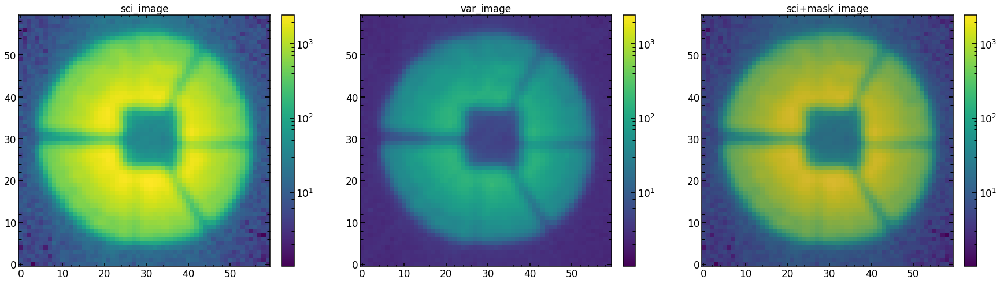

In [113]:
single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
single_analysis.create_basic_data_image()

In [114]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772198ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772198ArSwarm1.npy
(21, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772198ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.717524250348409
average chi2 reduced is: -3.4713609466104


### chain analysis 

In [126]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771218Arres_gbests_position.npy
(21, 129)


array([   -8.32910489,     0.72335193,     0.26689933,     0.31879047,
          -0.08619471,    -0.12544504,    -0.02666825,     0.51350785,
           0.06538129,     0.72705424,    -0.01544141,     0.16300197,
          -0.00561512,    -0.36893058,    -0.07955504,    -0.0866709 ,
           0.01663116,    -0.16453663,    -0.0043254 ,    -0.11196658,
           0.004414  ,     0.00935807,     0.01329779,     0.03503538,
          -0.0329002 ,     0.0001803 ,     0.01088897,     0.05118915,
           0.00693318,     0.01896245,     0.00202522,     0.02304517,
          -0.01396636,    -0.02557397,    -0.00446657,     0.03844159,
           0.01261298,     0.04457017,     0.70578051,     0.08807659,
          -0.15943939,    -0.06906434,     0.0551483 ,     0.02133142,
           0.96557353,     0.27687519,     0.16480496,     2.63954086,
           0.04379663,    -0.11577007,     0.90632076,     0.09788838,
           0.75103716,     1.03888404,     0.67795937, 66187.15470613,
      

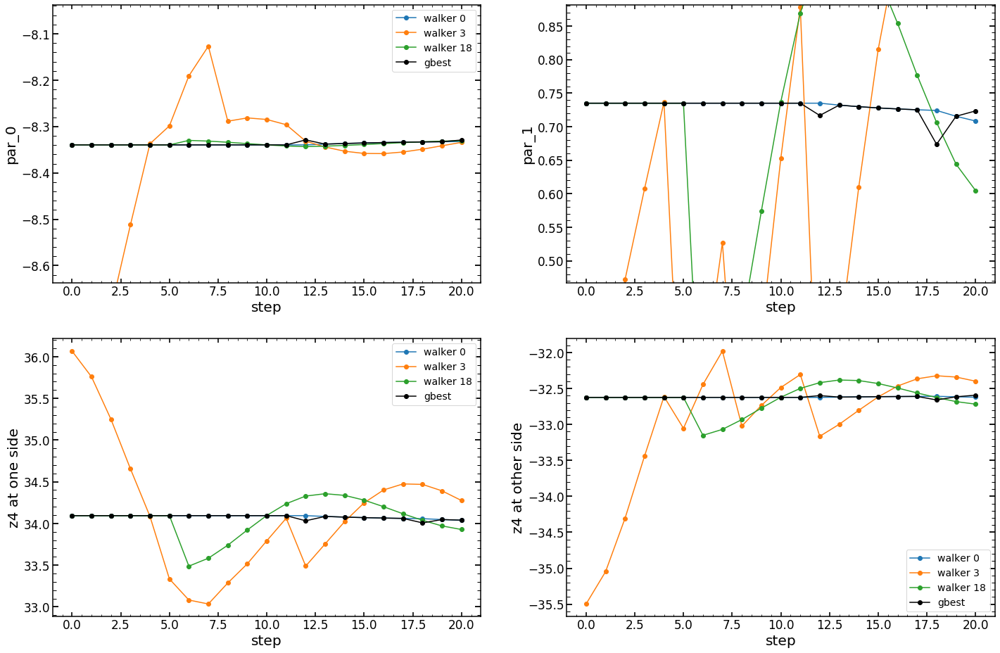

In [127]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=0*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(gbests_positions[:,i])
plt.ylim(np.min([mean_one_what-0.3,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.3,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

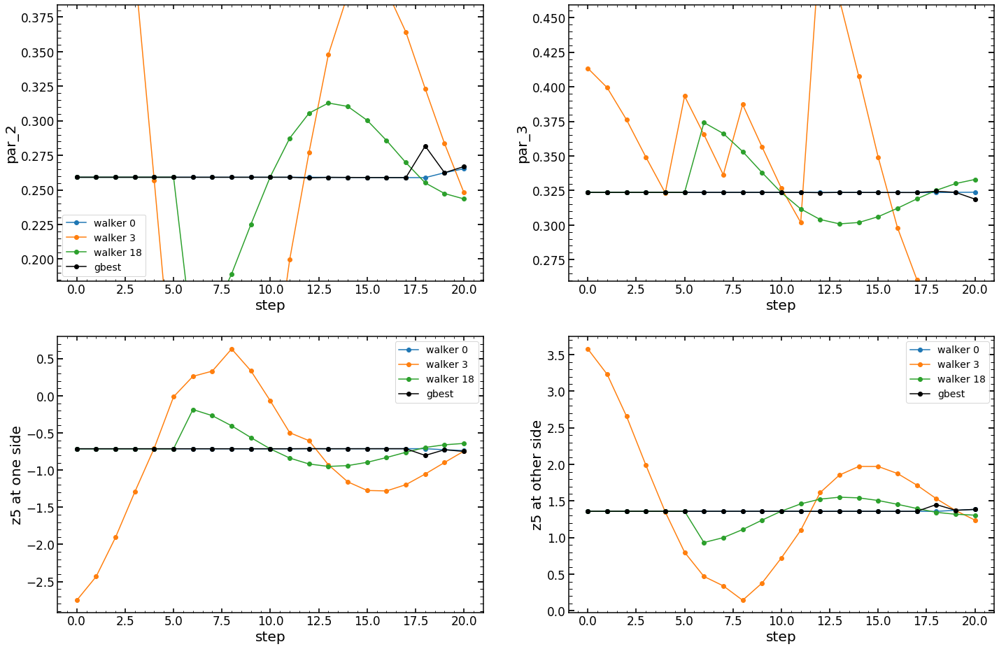

In [128]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=1*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

Text(0.5, 1.0, 'par_46 / wide_43')

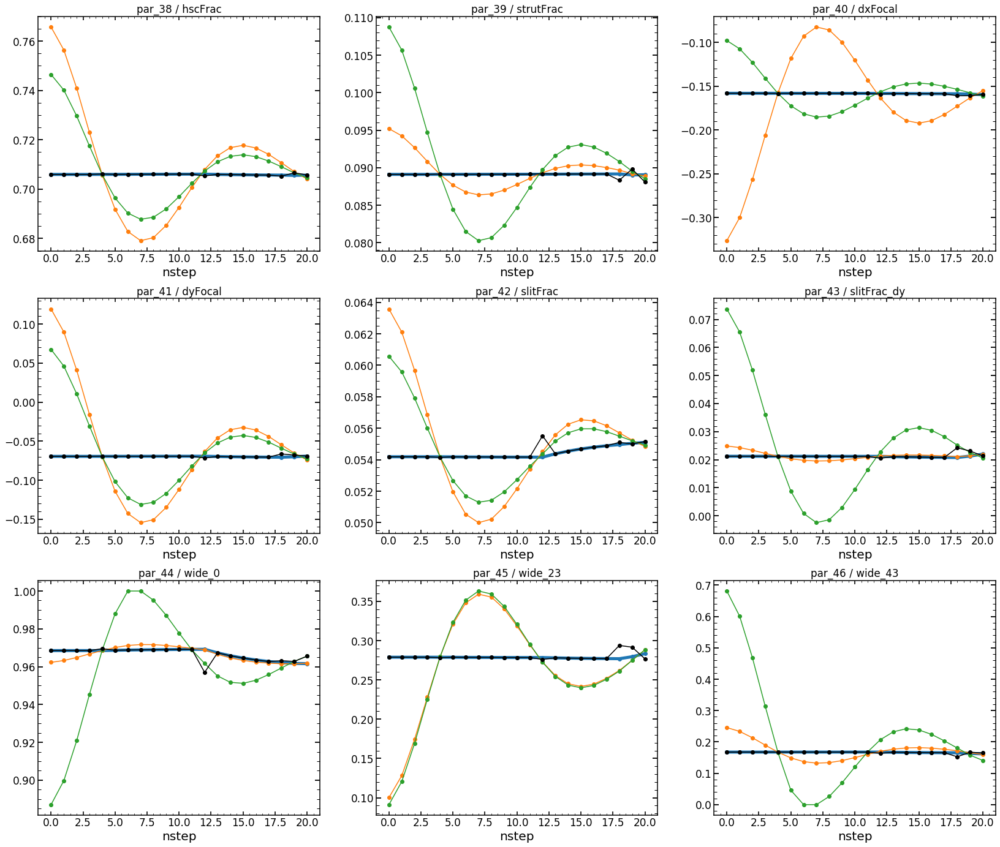

In [129]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

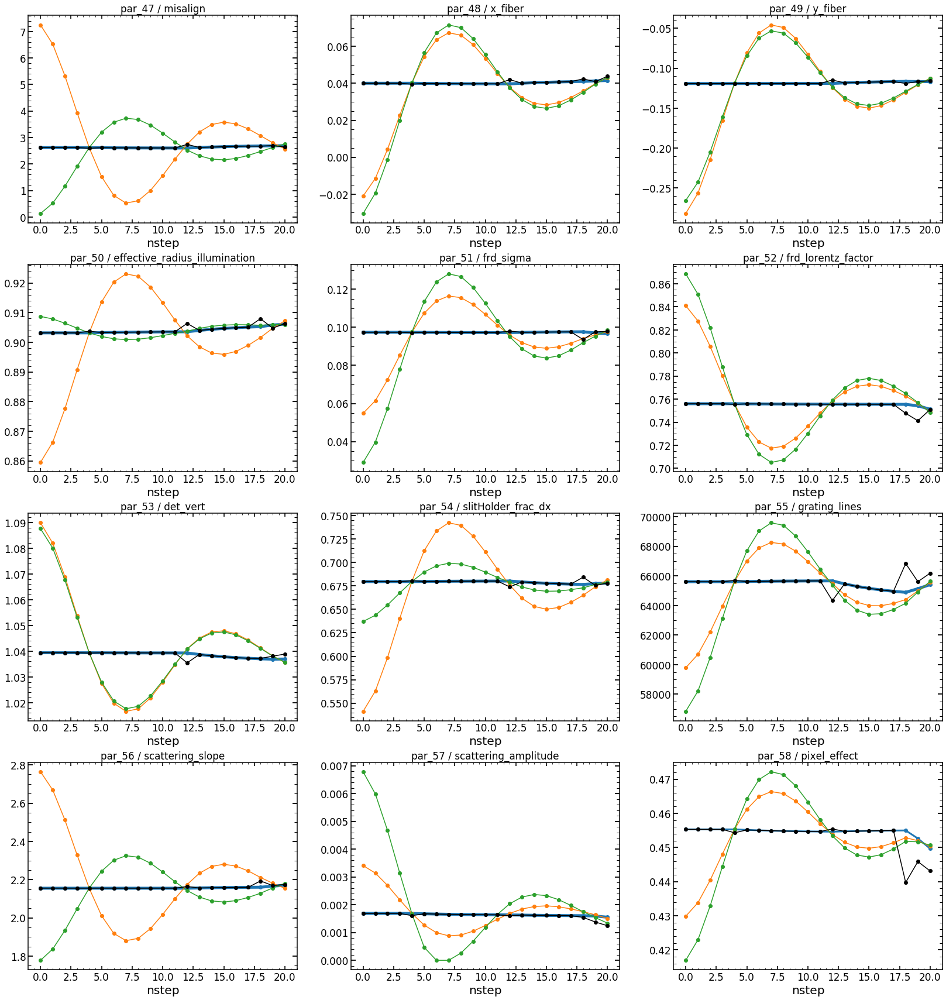

In [130]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

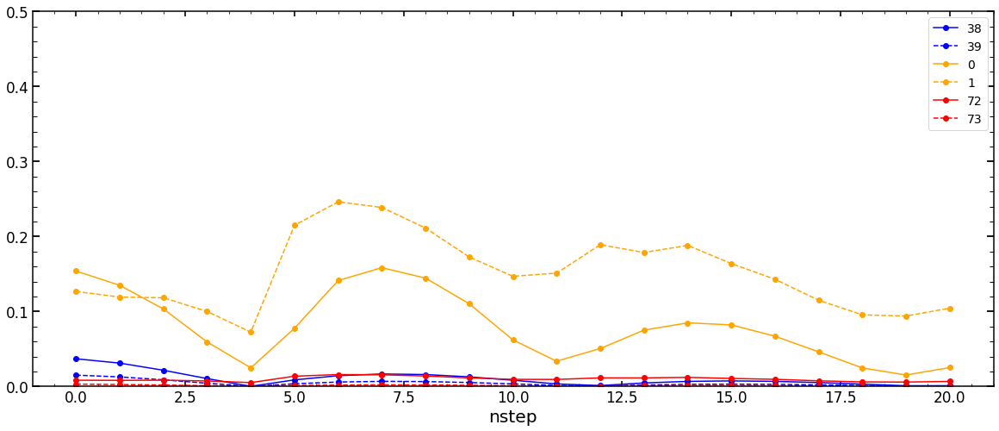

In [131]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

(0.08767247860982244, 0.0919686476999046)

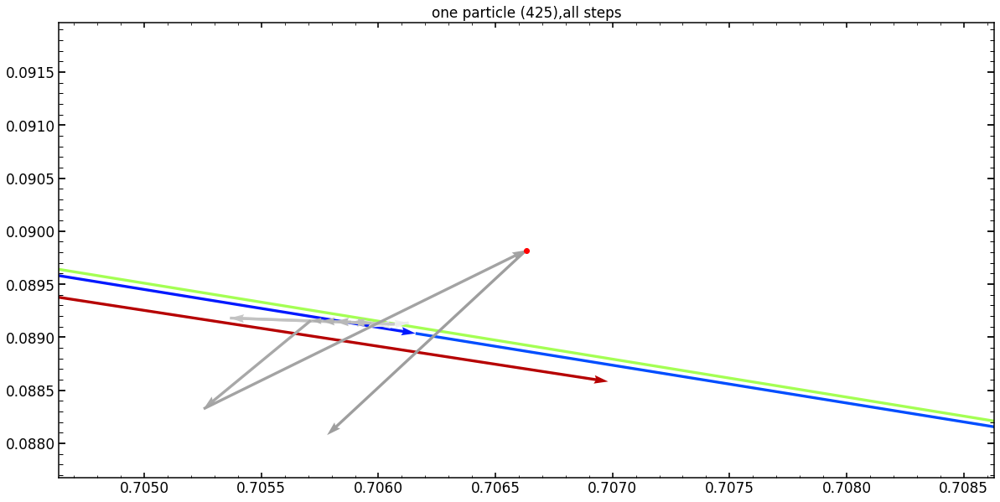

In [132]:
nsteps=chain0_swarm_1.shape[0]


j=0
n_particle=425
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle ('+str(n_particle)+'),all steps')

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors)
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,ls='--')
plt.scatter(X_best[-1],Y_best[-1],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.xlim(X_best[-1]-3*delta_X,X_best[-1]+3*delta_X)
plt.ylim(Y_best[-1]-3*delta_Y,Y_best[-1]+3*delta_Y)

Text(0, 0.5, 'parameter: 39')

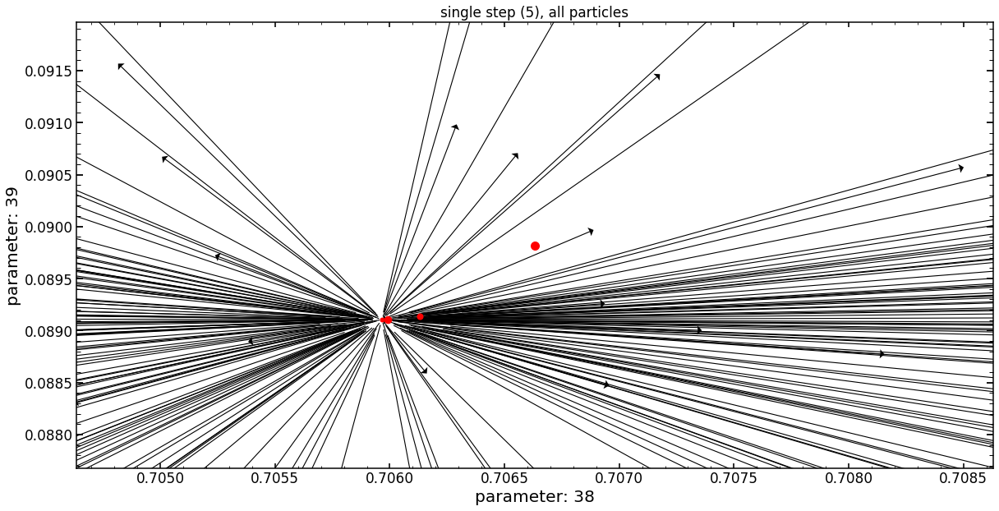

In [133]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771218ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.997569799423218
average chi2 reduced is: -3.946375932394272
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771218ArSwarm1.npy
(21, 480, 129)


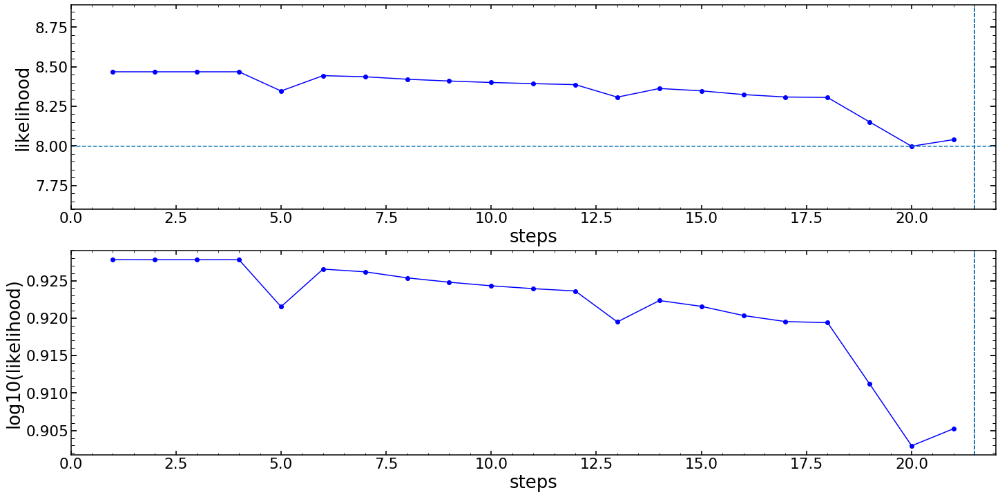

In [134]:
single_analysis.create_fitting_evolution_plot()

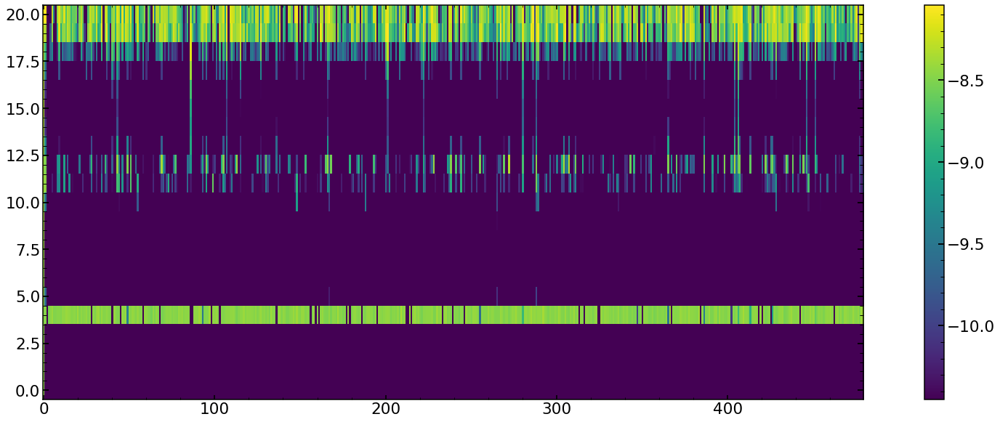

In [135]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()

In [136]:
list_of_which_particle_is_gbest=[]
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,38]==gbests_positions[i][38])[0][0]])
    
list_of_which_particle_is_gbest

[[0, 0],
 [1, 0],
 [2, 0],
 [3, 0],
 [4, 209],
 [5, 0],
 [6, 0],
 [7, 0],
 [8, 0],
 [9, 0],
 [10, 0],
 [11, 0],
 [12, 272],
 [13, 0],
 [14, 0],
 [15, 0],
 [16, 0],
 [17, 0],
 [18, 86],
 [19, 127],
 [20, 148]]

### image analysis 

In [115]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)




#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


res_multi_21=np.copy(res_multi)
mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

"""
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)
"""

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 3.8721285
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 2.4853506
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   31.80582578    -0.17610392    -0.70075504     0.64609333
    -0.47123111    -0.09315469    -0.38319317     0.29016284
    -0.05947834    -0.08050832    -0.00530651     0.03447579
    -0.10478207     0.11801352     0.01924793    -0.0239955
     0.00824401     0.0150567      0.44876934     0.65977809
     0.07095361    -0.03324424    -0.04241        0.05007691
     0.03995198     0.63651804     0.00851999    

chi2 within shgo with use_only_chi True and use_center_of_light False [-4.36214672  3.24238136] / 9.169371
chi2 within shgo with use_only_chi True and use_center_of_light False [ -2.98714672 -10.50761864] / 11.555378
chi2 within shgo with use_only_chi True and use_center_of_light False [ 8.01285328 11.49238136] / 14.258784
chi2 within shgo with use_only_chi True and use_center_of_light False [ 13.51285328 -21.50761864] / 22.337809
chi2 within shgo with use_only_chi True and use_center_of_light False [2.51285328 0.49238136] / 4.419525
chi2 within shgo with use_only_chi True and use_center_of_light False [ -0.23714672 -16.00761864] / 15.347593
chi2 within shgo with use_only_chi True and use_center_of_light False [10.76285328  5.99238136] / 11.331464
chi2 within shgo with use_only_chi True and use_center_of_light False [ 5.26285328 -5.00761864] / 5.720013
chi2 within shgo with use_only_chi True and use_center_of_light False [-5.73714672 16.99238136] / 19.861427
chi2 within shgo with use_o

chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.93985549 -1.2647678 ] / 3.9873838
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94112239 -1.26504574] / 3.9873834
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94070009 -1.26495309] / 3.987383
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94106669 -1.26513263] / 3.987383
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94022209 -1.26494734] / 3.9873838
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94085554 -1.26508631] / 3.987383
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94064439 -1.26503998] / 3.9873834
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.94082769 -1.26512975] / 3.9873827
chi2 within shgo with use_only_chi True and use_center_of_light False [ 2.940772   -1.26521664] / 3.9873834
chi2 within shgo with use_only_

Time for postprocessing pupil after _get_Pupil 0.33280324935913086
Time for pupil and illumination calculation is 0.34212398529052734

Starting creation of wavefront
diam_sic [m]: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -0.42365240062142173, 0.07821172403812031, -0.4253153063398401, 0.5185698991848978, 0.16663400534888242, -0.08392018279166749, -0.3493821504981803, -0.5975549120127412, -0.046671400496234035, -0.035846045346884806, 0.023581536624979485, 0.0583572152688309, -0.019935605851427535, -0.004955682700651345, -0.0349443078245266, -0.018362498290372287, -0.011364345023732923, -0.014168106962303983, -0.10238799456970783, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.07821172403812031, -0.4253153063398401, 0.5185698991848978, 0.16663400534888242, -0.08392018279166749, -0.3493821504981803, 0, -0.0466714004

sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.73194875 4.40628253] / 0.005084022889386774
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.79982243 4.34154689] / 0.005929709656761113
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.78539928 4.3771089 ] / 0.0027605759312802182
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.86345401 4.38988567] / 0.007257264209863044
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.76482507 4.40218332] / 0.002183541248057115
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.78942928 4.44413372] / 0.002894692018744438
sim00=False and center of light =true
chi2 within shgo with use_only_chi Tr

sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.7876738 4.4095515] / 2.472004594877211e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.78765529 4.40952857] / 2.16898005629658e-07
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.78765969 4.40951973] / 1.047320194313858e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.78765937 4.40953541] / 5.825083021587112e-07
sim00=False and center of light =true
We are fitting for only one source
One source fitting result is [8.78765529 4.40952857]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 3.541278839111328
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Image in focus, using pipeline normaliz

offset_initial_and_sci: [ 1.10862072 -0.13361763]
[x_primary, y_primary, y_secondary,ratio_secondary] / chi2 output
chi2 within shgo with use_only_chi True and use_center_of_light False [  1.19482794 -23.46979394] / 24.861671
chi2 within shgo with use_only_chi True and use_center_of_light False [12.19482794 -1.46979394] / 5.0230145
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.69482794 -12.46979394] / 12.948765
chi2 within shgo with use_only_chi True and use_center_of_light False [6.69482794 9.53020606] / 12.883334
chi2 within shgo with use_only_chi True and use_center_of_light False [ 9.44482794 -6.96979394] / 8.19896
chi2 within shgo with use_only_chi True and use_center_of_light False [20.44482794 15.03020606] / 18.600506
chi2 within shgo with use_only_chi True and use_center_of_light False [ 14.94482794 -17.96979394] / 17.156214
chi2 within shgo with use_only_chi True and use_center_of_light False [3.94482794 4.03020606] / 10.504944
chi2 within shgo wit

chi2 within shgo with use_only_chi True and use_center_of_light False [12.55116992 -0.7891245 ] / 4.962098
chi2 within shgo with use_only_chi True and use_center_of_light False [12.56024594 -0.79001427] / 4.962132
chi2 within shgo with use_only_chi True and use_center_of_light False [12.54286944 -0.78108458] / 4.9621034
chi2 within shgo with use_only_chi True and use_center_of_light False [12.54788606 -0.79121129] / 4.9620953
chi2 within shgo with use_only_chi True and use_center_of_light False [12.54875244 -0.79731805] / 4.9621024
chi2 within shgo with use_only_chi True and use_center_of_light False [12.55618654 -0.79925121] / 4.9621124
chi2 within shgo with use_only_chi True and use_center_of_light False [12.54619871 -0.78562624] / 4.962091
chi2 within shgo with use_only_chi True and use_center_of_light False [12.54291486 -0.78771303] / 4.962094
chi2 within shgo with use_only_chi True and use_center_of_light False [12.54122751 -0.78212798] / 4.962102
chi2 within shgo with use_only_ch

'\nindex_of_single_image=1\nmodel = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True)  \n\nres_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)\n'

In [116]:
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=True)  

res_with_Image_21=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 0.9853321
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 1.5376681
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   -0.4236524      0.07821172    -0.42531531     0.5185699
     0.16663401    -0.08392018    -0.34938215    -0.59755491
    -0.0466714     -0.03584605     0.02358154     0.05835722
    -0.01993561    -0.00495568    -0.03494431    -0.0183625
    -0.01136435    -0.01416811    -0.10238799     0.65977809
     0.07095361    -0.03324424    -0.04241        0.05007691
     0.03995198     0.63651804     0.00851999     0.01093186
     4.80371702     0.04372139    -0.00845576     0

sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.81283086 18.11113794] / 1.4052266822683066
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 18.31283086 -14.88886206] / 2.0253982318224875
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [7.31283086 7.11113794] / 0.3023324584608447
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.56283086 -9.38886206] / 1.2110898807233081
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [15.56283086 12.61113794] / 1.153201040718863
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [10.06283086  1.61113794] / 0.4234629942806355
sim00=True and center of light =true
chi2 within shgo with use_only_chi False

sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.01601623 4.01377438] / 0.0004539689178465065
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.01393436 4.0051913 ] / 0.0010211346374255897
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.02037086 4.01506544] / 0.0001622259401857677
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.02478911 4.0110648 ] / 0.0004487447267669348
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.02259589 4.01174219] / 0.00023922618061580366
sim00=True and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.02253227 4.01703389] / 0.00038711733473371533
sim00=True and center of light =true
chi2 within shgo with use_only_

In [94]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [95]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(len(list_of_sci_images)):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-61.97334671 -43.17953491 -53.10351562]


'model pixels with a flux larger than (quantile_08_focus): 4.653273487091067'

mean reported value:-4.727159023284912
array_of_single_res: [-5.87634897 -1.55193758 -6.75319052]
renormalization factors: [1. 1. 1.]
array_of_single_res renormalized: [-5.87634897 -1.55193758 -6.75319052]


([<matplotlib.axis.XTick at 0x7fc30b4d4be0>,
 <a list of 3 Text xticklabel objects>)

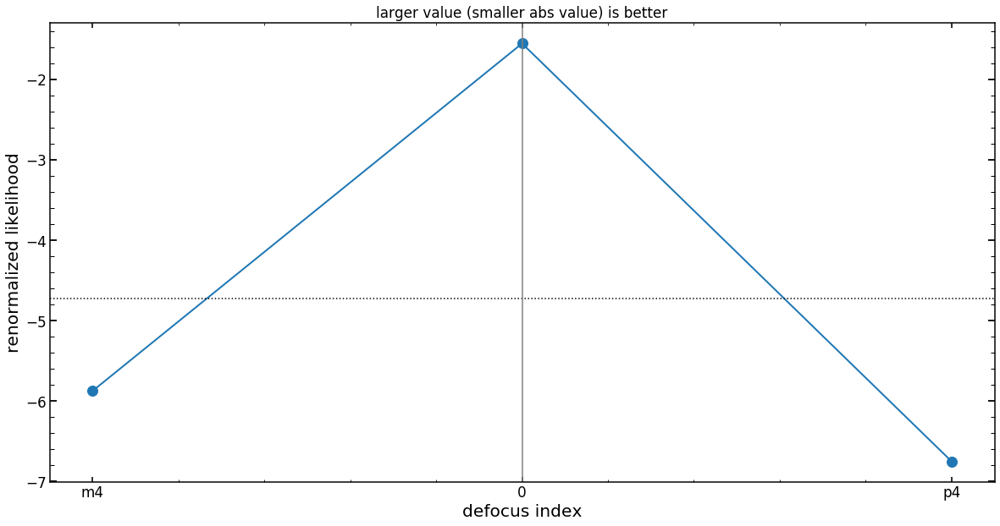

In [96]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.ones(len(list_of_sci_images))


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.title('larger value (smaller abs value) is better')

plt.axvline(np.where(np.array(list_of_defocuses_input_short_with_focus)=='0')[0][0],color='gray')
plt.xticks(np.arange(len(list_of_defocuses_input_short_with_focus)),list_of_defocuses_input_short_with_focus)

In [97]:
minchain=list_of_minchain[1]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6       z7        z8       z9       z10  \
0 -0.423652  0.078212 -0.425315  0.51857  0.166634 -0.08392 -0.349382   

        z11  
0 -0.597555  
##############################################
        z12       z13       z14       z15       z16       z17       z18  \
0 -0.046671 -0.035846  0.023582  0.058357 -0.019936 -0.004956 -0.034944   

        z19       z20       z21       z22  
0 -0.018362 -0.011364 -0.014168 -0.102388  

##############################################
    hscFrac  strutFrac   dxFocal  dyFocal  slitFrac  slitFrac_dy
0  0.659778   0.070954 -0.033244 -0.04241  0.050077     0.039952
##############################################
     wide_0  wide_23   wide_43  misalign
0  0.636518  0.00852  0.010932  4.803717
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.043721 -0.008456                       0.911788       0.01   

   frd_lorentz_factor  
0    

(-1.5, -0.5)

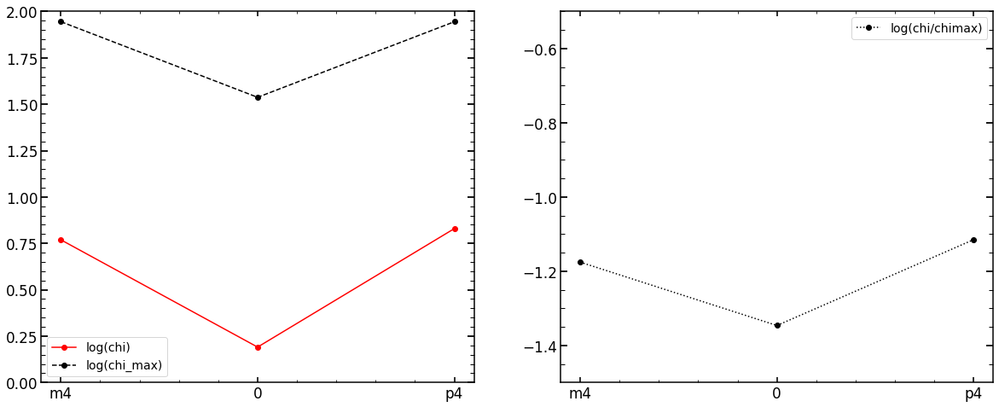

In [98]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

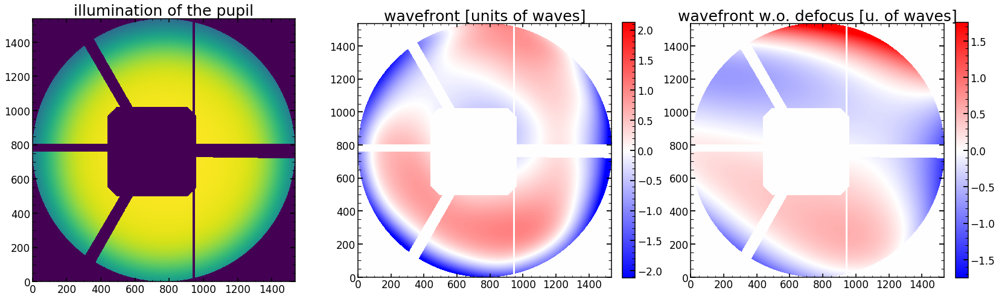

In [99]:
# save has to be save=1 for this to update
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 3.8721285
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 2.4853506
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 19.049164295196533
---------------------
chi**2 max reduced is: 5816.532
chi**2 reduced is: 34.291916 for log improvement: -2.2294724
chi max reduced is: 51.360634
chi reduced is: 3.9733582 for log improvement: -1.1114726
---------------------
chi**2 reduced within custom mask area is: 34.291916
---------------------
chi**2 max reduced within flux mask area is: 10385.051
chi**2 reduced within flux mask area is: 58.318302 for log improvement: -2.2506037


/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_19264/468137248.py:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array_of_sci_image=np.array(list_of_sci_images)
/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_19264/468137248.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array_of_single_model_image=np.array(list_of_single_model_image)
/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_19264/468137248.py:26: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of 

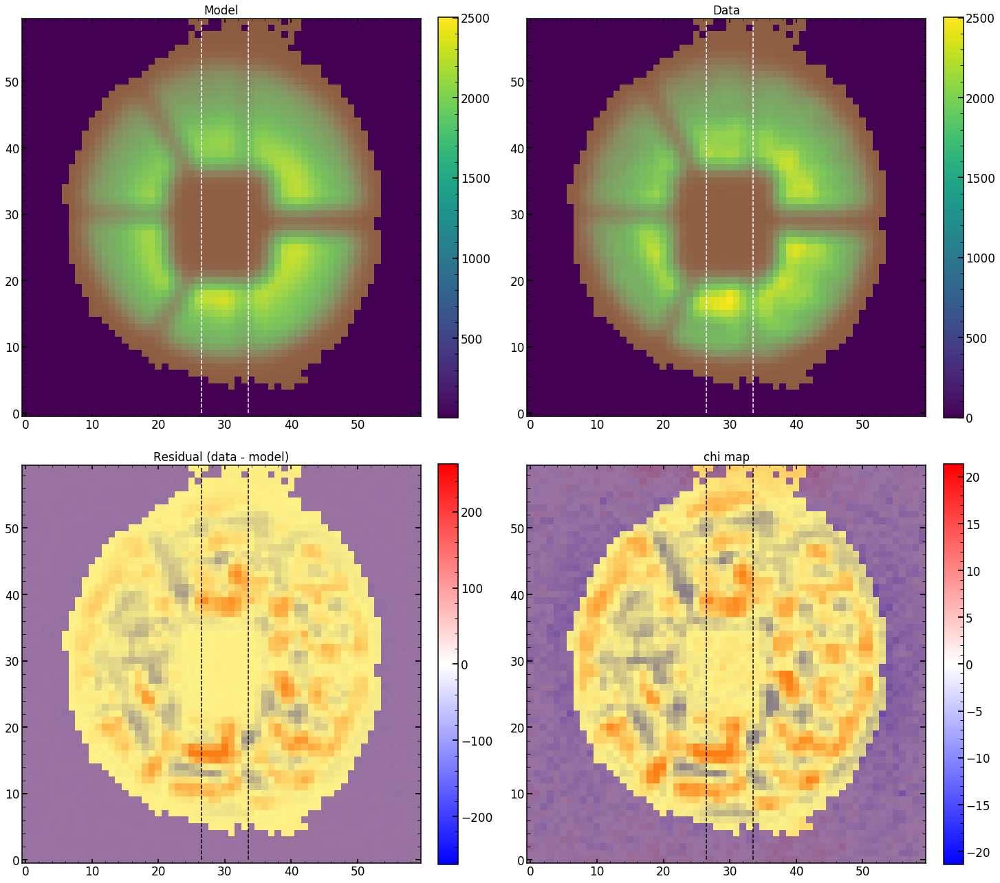

In [100]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_single_model_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_var_images)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 3.8721285
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 2.4853506
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 19.049164295196533
fraction of chi2 due to 1% of pixels: 0.10000631
---------------------
chi**2 max reduced is: 5816.532
chi**2 reduced is: 34.291916 for log improvement: -2.2294724
chi max reduced is: 51.360634
chi reduced is: 3.9733582 for log improvement: -1.1114726
---------------------
chi**2 reduced within custom mask area is: 34.291916
---------------------
chi**2 max reduced within flux mask area is: 10385.051
chi**2 reduced within flux mask ar

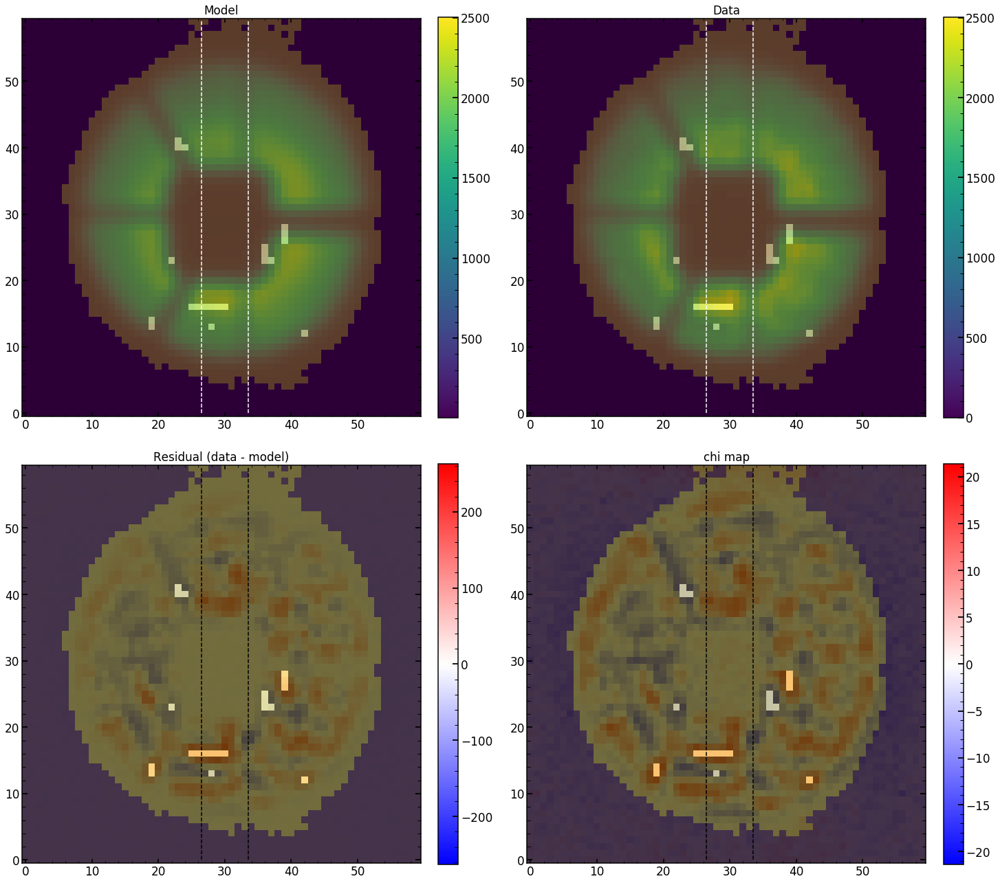

In [101]:
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 3.8721285
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 2.4853506
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 19.049164295196533
---------------------
chi**2 max reduced is: 5816.532
chi**2 reduced is: 34.291916 for log improvement: -2.2294724
chi max reduced is: 51.360634
chi reduced is: 3.9733582 for log improvement: -1.1114726
---------------------
chi**2 reduced within custom mask area is: 34.291916
---------------------
chi**2 max reduced within flux mask area is: 10385.051
chi**2 reduced within flux mask area is: 58.318302 for log improvement: -2.2506037


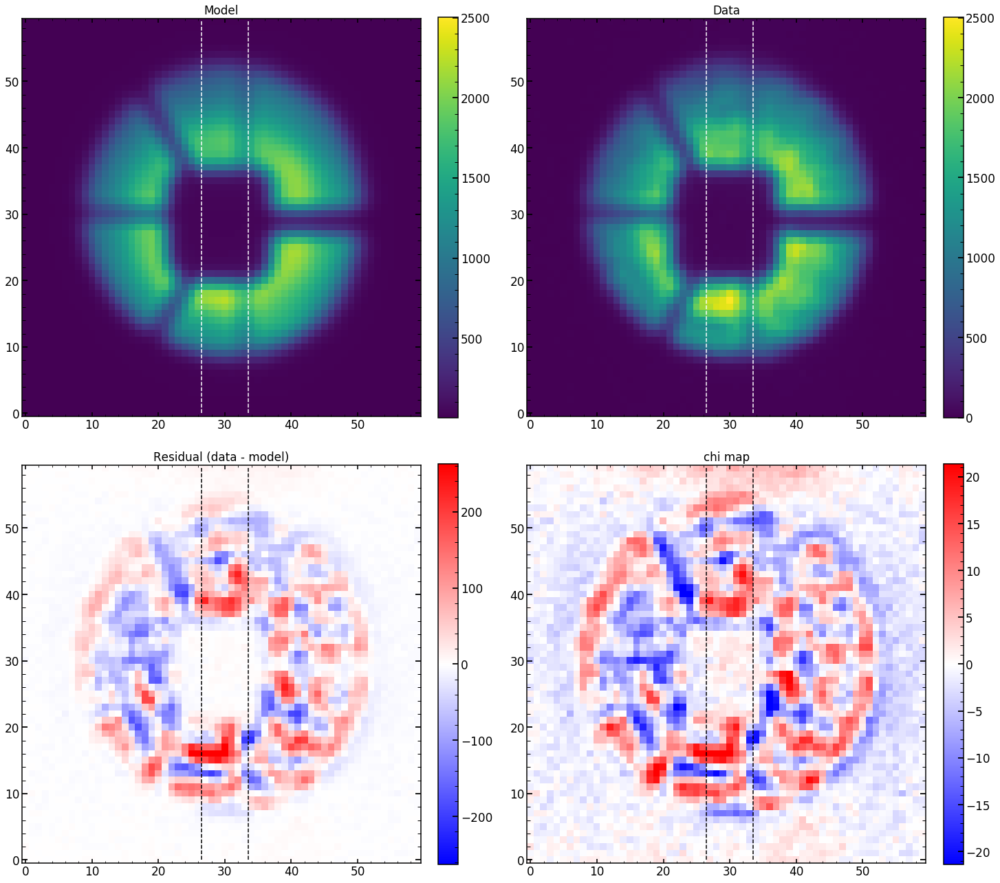

In [102]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 0.9853321
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 1.5376681
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 4.4993577003479
---------------------
chi**2 max reduced is: 662.5012
chi**2 reduced is: 1.9376128 for log improvement: -2.5339198
chi max reduced is: 7.912834
chi reduced is: 1.0617757 for log improvement: -0.8722993
---------------------
chi**2 reduced within custom mask area is: 1.9376129
---------------------
chi**2 max reduced within flux mask area is: 3226.0461
chi**2 reduced within flux mask area is: 4.0762153 for log improvement: -2.8984134
chi 

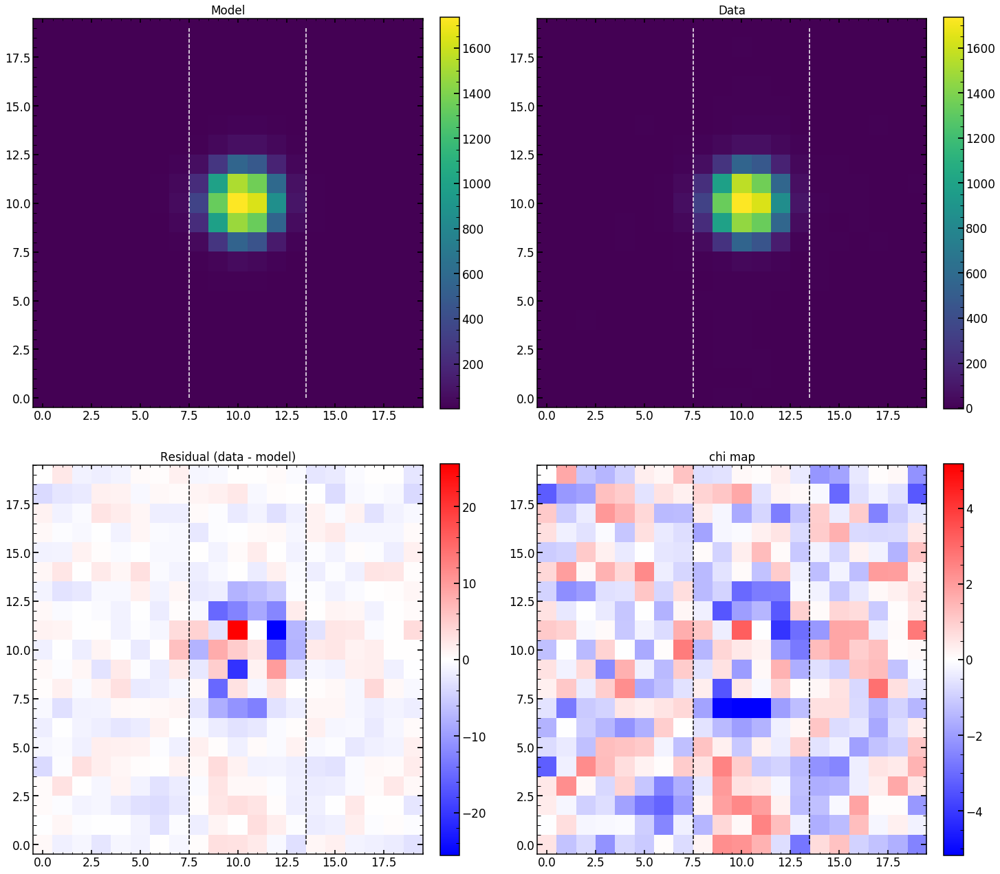

In [103]:
index_of_single_image=1
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 662.5012
chi**2 reduced is: 1.9376128
Abs of residual divided by total flux is: 0.037679385
Abs of residual divided by largest value of a flux in the image is: 0.01971881


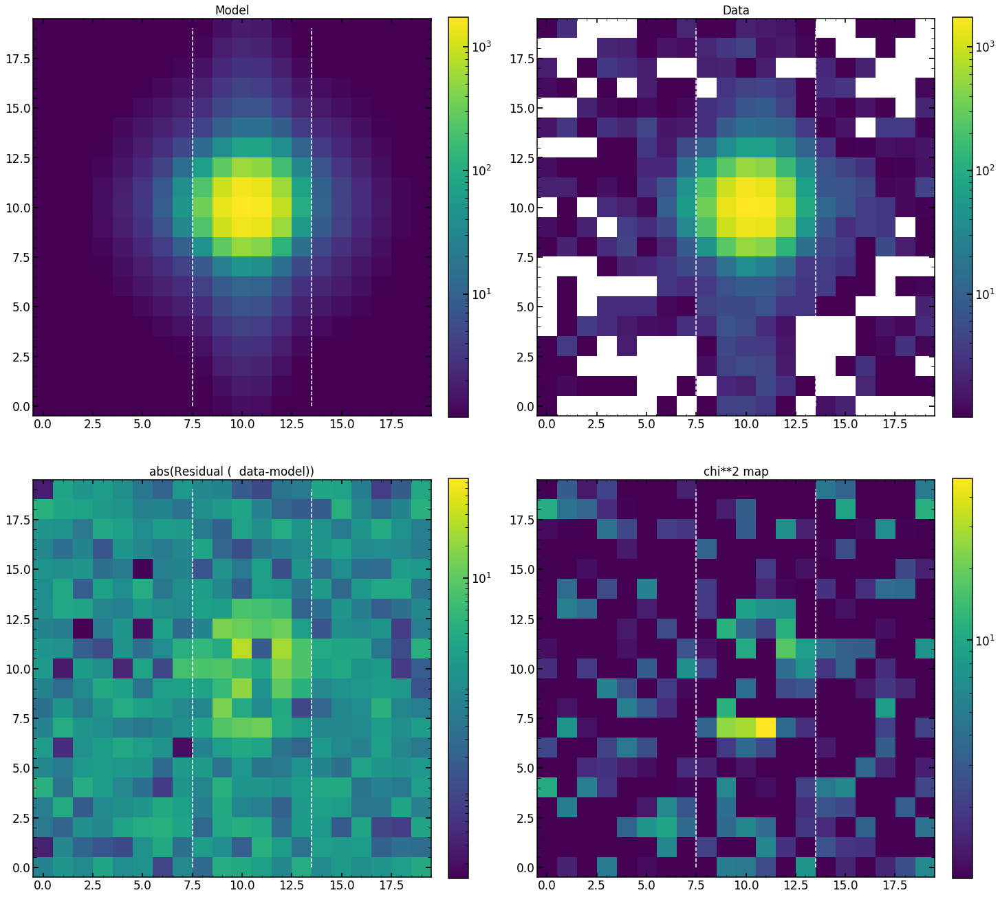

In [104]:
index_of_single_image=1
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

1.9376128
chi**2 reduced is: 1.9376128
Abs of residual divided by total flux is: 0.037679385
Abs of residual divided by largest value of a flux in the image is: 0.01971881


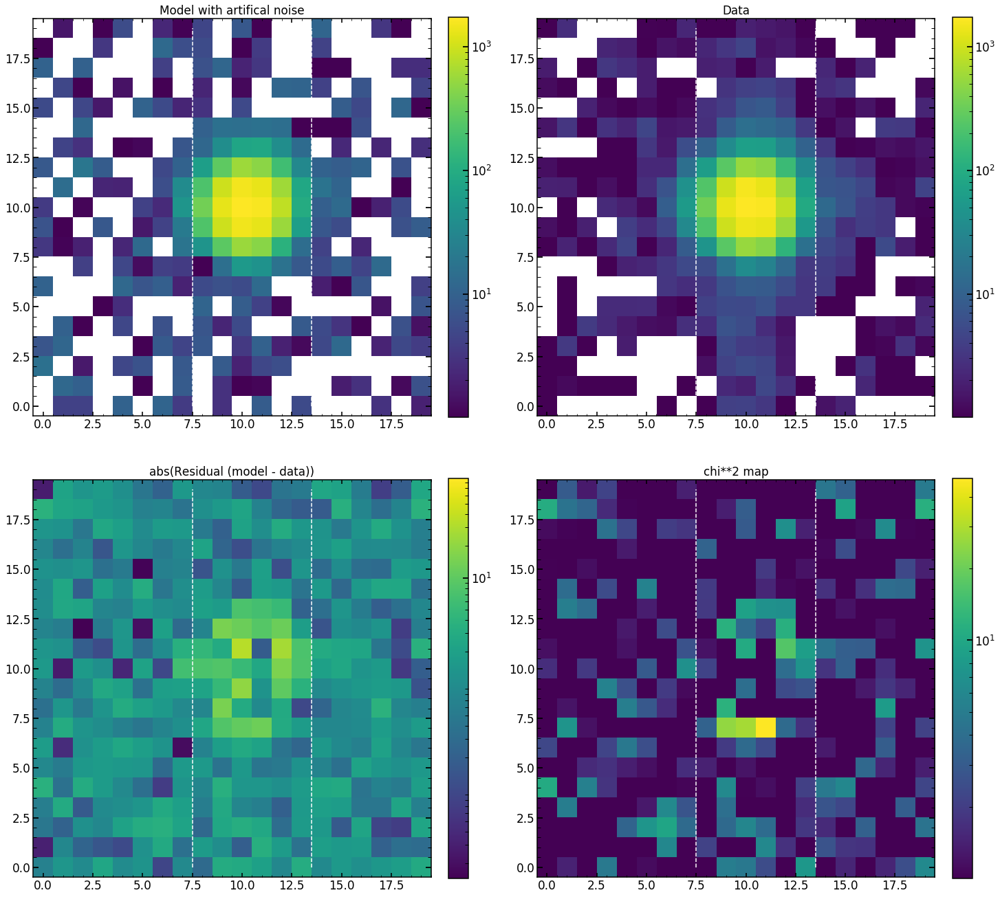

In [105]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

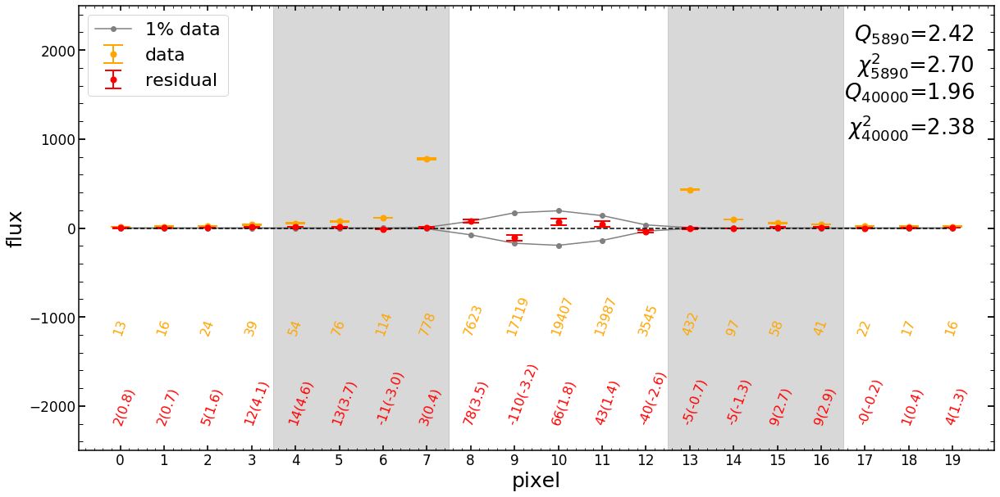

In [51]:
index_of_single_image=1
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## results everywhere 

In [137]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar[:,1])

unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne[:,1])

if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr[:,1])
else:
    unique_numbers_Kr=np.array([])


In [139]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 121
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771218ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.997569799423218
average chi2 reduced is: -4.134570507587561
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 123
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 foun

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771408ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.063318093617758
average chi2 reduced is: -4.327135456293931
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 141
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771418ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 21.33712371190389
average chi2 reduced is: -4.939698603567298
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 143
list_of_

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771638ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.65090274810791
average chi2 reduced is: -4.558349573929553
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 164
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771648ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.732356548309326
average chi2 reduced is: -4.292947837902057
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 165
list_of_d

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771868ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.482998371124268
average chi2 reduced is: -4.492139816624941
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 187
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516771878ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.814966678619385
average chi2 reduced is: -4.6774894407708505
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 188
list_o

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772078ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.84766685962677
average chi2 reduced is: -3.679222092756103
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 209
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772098ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.954249064127604
average chi2 reduced is: -4.874924789926999
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/Reduc

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772278ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.792574326197306
average chi2 reduced is: -4.059401240367553
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 229
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772298ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.967540264129639
average chi2 reduced is: -3.7969737622656177
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 231
list_of_

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 248
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772488ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.214036782582602
average chi2 reduced is: -4.448026924875886
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 249
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 fou

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772698ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 18.106244564056396
average chi2 reduced is: -5.106238349438886
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 270
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772708ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.20915961265564
average chi2 reduced is: -4.337925854691164
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 271
list_of_

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 293
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516772938ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 19.574945608774822
average chi2 reduced is: -5.240342077695478
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 294
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 fou

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516773118ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.00215744972229
average chi2 reduced is: -4.160517163534498
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 337
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516773378ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 5.8089726368586225
average chi2 reduced is: -3.8316919070518383
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 339
list_of_

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516773568ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.368833382924398
average chi2 reduced is: -4.405172657935982
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 357
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [51485, 51497, 51509, 51569, 51581, 51593, 51653, 51665, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_516773578ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 24.319007714589436
average chi2 reduced is: -5.067952011458854
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/Red

In [140]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598471018NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.340142091115316
average chi2 reduced is: -4.533002595575381
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 104
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
P

analyzing label: 59655
double_sources_positions_ratios for this spot is: [-19.25 0.0034]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598471328NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.367182970046997
average chi2 reduced is: -4.886089805548428
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 133
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598471338NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 16.959742228190105
average chi2 reduced is: -4.799474391384225
STAMPS_FOLDER: /Volumes/Saturn_USA/P

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598471678NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.696959654490152
average chi2 reduced is: -4.847274219277618
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 168
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [-19.25 0.0034]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598471688NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.55581283569336
average chi2 reduced is: -4.91275379971476
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS

analyzing label: 59655
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598471968NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 19.84186553955078
average chi2 reduced is: -4.844074001180847
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 200
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598472008NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.302112738291422
average chi2 reduced is: -4.42712940824421
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598472308NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 17.058380762736004
average chi2 reduced is: -4.920844933984016
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 231
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598472318NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 16.814391295115154
average chi2 reduced is: -4.957094790498987
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 232
list_of

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_598472778NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 17.96994415918986
average chi2 reduced is: -4.719926617252379
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 92
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [59655, 59667, 59679, 59739, 59751, 59763, 59823, 59835, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_59847928NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.173368692398071
average chi2 reduced is: -4.5686900398838475
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedDa

In [141]:
results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 103
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [52085, 52097, 52109, 52169, 52181, 52193, 52253, 52265, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_522771038KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 17.235020478566486
average chi2 reduced is: -4.711903322575374
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 107
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [52085, 52097, 52109, 52169, 52181, 52193, 52253, 52265, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
P

analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_52277758KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 15.102891604105631
average chi2 reduced is: -4.6501878355275945
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/
labelInput: m4
self.single_number: 79
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [52085, 52097, 52109, 52169, 52181, 52193, 52253, 52265, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Aug0121/chainAug0121_Single_P_52277798KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.925825436909994
average chi2 reduced is: -4.283370239434597
STAMPS_FOLDER: /Volumes/Saturn_USA/PFS/ReducedDa

In [142]:
# just the ones without neigbhours done with 0.47f 

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

# Combining results 

In [84]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121_10.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121_10.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121_10.pkl',allow_pickle=True)

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121_21.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121_21.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121_21.pkl',allow_pickle=True)

In [85]:
results_of_fit_many_direct_Ar_0 = pd.concat([results_of_fit_many_direct_Ar_10['0'],results_of_fit_many_direct_Ar_21['0']])
results_of_fit_many_direct_Ne_0 = pd.concat([results_of_fit_many_direct_Ne_10['0'],results_of_fit_many_direct_Ne_21['0']])
results_of_fit_many_direct_Kr_0 = pd.concat([results_of_fit_many_direct_Kr_10['0'],results_of_fit_many_direct_Kr_21['0']])

results_of_fit_many_direct_Ar_m4 = pd.concat([results_of_fit_many_direct_Ar_10['m4'],results_of_fit_many_direct_Ar_21['m4']])
results_of_fit_many_direct_Ne_m4 = pd.concat([results_of_fit_many_direct_Ne_10['m4'],results_of_fit_many_direct_Ne_21['m4']])
results_of_fit_many_direct_Kr_m4 = pd.concat([results_of_fit_many_direct_Kr_10['m4'],results_of_fit_many_direct_Kr_21['m4']])

results_of_fit_many_direct_Ar_p4 = pd.concat([results_of_fit_many_direct_Ar_10['p4'],results_of_fit_many_direct_Ar_21['p4']])
results_of_fit_many_direct_Ne_p4 = pd.concat([results_of_fit_many_direct_Ne_10['p4'],results_of_fit_many_direct_Ne_21['p4']])
results_of_fit_many_direct_Kr_p4 = pd.concat([results_of_fit_many_direct_Kr_10['p4'],results_of_fit_many_direct_Kr_21['p4']])

In [86]:
results_of_fit_many_Ar = {'m4': results_of_fit_many_direct_Ar_m4.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4.copy()}

results_of_fit_many_Ne = {'m4': results_of_fit_many_direct_Ne_m4.copy(), 
                       '0' : results_of_fit_many_direct_Ne_0.copy(),
                        'p4' :results_of_fit_many_direct_Ne_p4.copy()}

results_of_fit_many_Kr = {'m4': results_of_fit_many_direct_Kr_m4.copy(), 
                       '0' : results_of_fit_many_direct_Kr_0.copy(),
                        'p4' :results_of_fit_many_direct_Kr_p4.copy()}

In [88]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.DEFAULT_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.DEFAULT_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.DEFAULT_PROTOCOL)

## plot image 

In [149]:
renormalization_ratios_Ar=800/finalAr.loc[results_of_fit_many_Ar['m4'].index.astype(int)]['wavelength'].astype(float).values
renormalization_ratios_Ne=800/finalNe.loc[results_of_fit_many_Ne['m4'].index.astype(int)]['wavelength'].astype(float).values
renormalization_ratios_Kr=800/finalKr.loc[results_of_fit_many_Kr['m4'].index.astype(int)]['wavelength'].astype(float).values

In [150]:
results_of_fit_many_direct_Ar_m4_renormalized=results_of_fit_many_direct_Ar_m4.copy()
results_of_fit_many_direct_Ar_0_renormalized=results_of_fit_many_direct_Ar_0.copy()
results_of_fit_many_direct_Ar_p4_renormalized=results_of_fit_many_direct_Ar_p4.copy()

for i in range(4,56):
    results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    
    
#####################################################################################    
results_of_fit_many_direct_Ne_m4_renormalized=results_of_fit_many_direct_Ne_m4.copy()
results_of_fit_many_direct_Ne_0_renormalized=results_of_fit_many_direct_Ne_0.copy()
results_of_fit_many_direct_Ne_p4_renormalized=results_of_fit_many_direct_Ne_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]/renormalization_ratios_Ne
    
    
    
#####################################################################################    
results_of_fit_many_direct_Kr_m4_renormalized=results_of_fit_many_direct_Kr_m4.copy()
results_of_fit_many_direct_Kr_0_renormalized=results_of_fit_many_direct_Kr_0.copy()
results_of_fit_many_direct_Kr_p4_renormalized=results_of_fit_many_direct_Kr_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]/renormalization_ratios_Kr
    
    
results_of_fit_many_Ar_renormalized = {'m4': results_of_fit_many_direct_Ar_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4_renormalized.copy()}

results_of_fit_many_Ne_renormalized = {'m4': results_of_fit_many_direct_Ne_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ne_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ne_p4_renormalized.copy()}

results_of_fit_many_Kr_renormalized = {'m4': results_of_fit_many_direct_Kr_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Kr_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Kr_p4_renormalized.copy()}

In [151]:
# plot the results of the interpolation
#  renomalized!!!!
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Aug0121'
# [:42] makes that you go up to z22
descriptions=results_of_fit_many_Ar[label[0]].columns[:42]
# j runs throught the amount of defocu that we have analyzed

#for j in tqdm(labels_with_data):
for j in [0,8,17]:
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ar=np.array(results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]])
        
        # take values for Krypton        
        x_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Kr=np.array(results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]])        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_Ar,x_Ne,x_Kr))
        y=np.concatenate((y_Ar,y_Ne,y_Kr))    
        colors= np.concatenate((values_Ar,values_Ne,values_Kr))
        

        
        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=3
                    min_colors=-3 
                    
            # limits of color for z12-z22
            if np.in1d([i],[8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=0.25
                    min_colors=-0.25

            # limits for all other parameters   - they change 
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(np.quantile(colors,0.9)-median_color)
                low_limit=np.abs(np.quantile(colors,0.1)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  
            
            # Zernike above z22
            if i >42:
                max_colors=0.5/(i-20)
                min_colors=-0.5/(i-20)  

        plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='o')
        plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='s')
        plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='p')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+': '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.clf()

/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_1344/166678072.py:17: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  x_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_1344/166678072.py:18: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  y_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
/var/folders/b0/5ykwr2v9451f6dg7vxc42d940000gn/T/ipykernel_1344/166678072.py:22: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  x_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
/var/folders/b0/5ykwr2v9451f6dg7

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/m4/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z4/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z5/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z6/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z7/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z8/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z9/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z10/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z11/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z12/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z13/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Aug0121/Plane/z14/
Images are in folder: /Users/nevenc

<Figure size 864x720 with 0 Axes>

## quality - not done

## wf grid - last time done in Jan, Feb

## Creating array_of_arrays

In [41]:
finalAr=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalAr_Jul2021",allow_pickle=True)
finalNe=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalNe_Jul2021",allow_pickle=True)
finalKr=np.load("/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/DataFrames/finalKr_Jul2021",allow_pickle=True)

date_of_input='Aug0121'
direct_or_interpolation='direct'
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_'+str(direct_or_interpolation)+'_Ar_from_'+str(date_of_input)+'.pkl', 'rb') as f:
    results_of_fit_many_Ar=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_'+str(direct_or_interpolation)+'_Ne_from_'+str(date_of_input)+'.pkl', 'rb') as f:
    results_of_fit_many_Ne=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_'+str(direct_or_interpolation)+'_Kr_from_'+str(date_of_input)+'.pkl', 'rb') as f:
    results_of_fit_many_Kr=pickle.load(f)


In [58]:

# test

minchain=results_of_fit_many_Ar['0'].loc['41'].values
positions_of_simulation_00_Ar=finalAr.loc[41][['fiber','xc','yc','wavelength']]
wavelength=float(positions_of_simulation_00_Ar[3])

sci_image_unit=np.ones((21,21))
var_image_unit=np.ones((21,21))



model = LN_PFS_single(sci_image_unit,var_image_unit,wavelength=wavelength,dithering=1,save=1,verbosity=1,zmax=56,npix=1536,simulation_00=True,\
                      double_sources=False,use_center_of_flux=True,use_only_chi=True)   
test=model(minchain[:-2],return_Image=True)


Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.2643404      0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67570471
     0.07748559    -0.08983609    -0.01122745     0.0575504
     0.02100696     0.29850797     0.1364008      0.23485726
     1.23607639     0.01349601    -0.06147791     0.95482105

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.58683438 -17.74029636] / 1.5106327016779195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.41316562  4.25970364] / 0.8951098951821195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.03816562 -9.49029636] / 0.9692529044343383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.96183438 12.50970364] / 1.2970568937853413
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.46183438 -20.49029636] / 1.942489488028097
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.53816562  1.50970364] / 0.27870867287219037
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17452871 -1.26018979] / 1.2276367283787885e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17465983 -1.2605512 ] / 2.9229622267376482e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17440002 -1.26020004] / 1.0502324137756585e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17448419 -1.25994543] / 3.275916184796654e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17445445 -1.26031965] / 1.5862864645119223e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17432576 -1.2603299 ] / 1.1623526537274344e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
/opt/miniconda3/envs/idp2_pyfftw/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


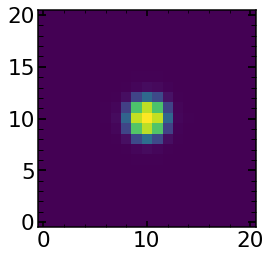

In [43]:
plt.imshow(test[1])

(114.99673519948443, 114.99997758349964)
(10.000000105463265, 10.000000084620348)
(21, 21)


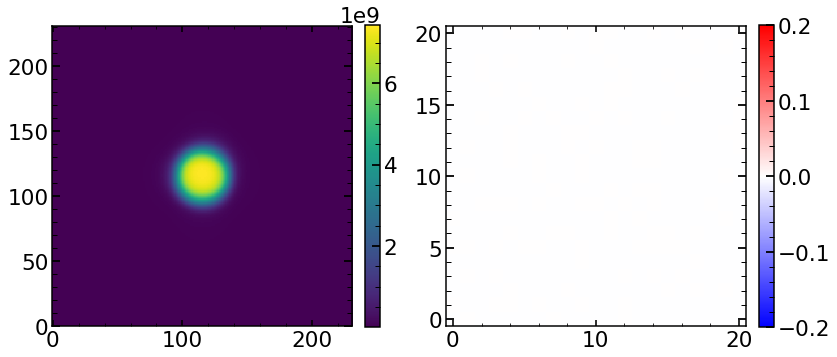

In [48]:
single_primary_realization_oversampled_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization_oversampled_to_save.npy')
complete_realization_renormalized_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/complete_realization_renormalized_to_save.npy')
single_primary_realization=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization.npy')
plt.figure(figsize=(20,8))

resized=resize(single_primary_realization_oversampled_to_save,(21,21))
resized=resized*np.sum(complete_realization_renormalized_to_save)/np.sum(resized)
find_centroid_of_flux(resize(single_primary_realization_oversampled_to_save,(21,21)))

print(find_centroid_of_flux(single_primary_realization_oversampled_to_save))
print(find_centroid_of_flux(complete_realization_renormalized_to_save))

plt.subplot(131)
plt.imshow(single_primary_realization_oversampled_to_save)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

print(single_primary_realization.shape)
plt.subplot(132)
plt.imshow((complete_realization_renormalized_to_save-resized)/complete_realization_renormalized_to_save,cmap='bwr',vmax=0.2,vmin=-0.2)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

In [78]:
sci_image_unit=np.ones((21,21))
var_image_unit=np.ones((21,21))

list_of_simulation_00_Ar_single=[]
positions_of_simulation_00_Ar_single=[]
positions_of_simulation_00_Ar=finalAr.loc[results_of_fit_many_Ar['0'].index.values.astype(int)][['fiber','xc','yc','wavelength']]
for i in tqdm(results_of_fit_many_Ar['0'].index.values):
    minchain=results_of_fit_many_Ar['0'].loc[str(i)].values[:-2]  
    print(i,positions_of_simulation_00_Ar.loc[int(i)])
    
    wavelength=float(positions_of_simulation_00_Ar.loc[int(i)][3])
    
    
    #model = LN_PFS_single(sci_image_unit,var_image_unit,\
    #                      wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
    #                      simulation_00=True,double_sources=False,double_sources_positions_ratios=False,fit_for_flux=True,\
    #                      npix=1536,use_center_of_flux=True,use_only_chi=True)  
    
    model = LN_PFS_single(sci_image_unit,var_image_unit,wavelength=wavelength,dithering=1,save=1,verbosity=1,zmax=56,npix=1536,simulation_00=True,\
                      double_sources=False,use_center_of_flux=True,use_only_chi=True)   
    
    
    model(minchain,return_Image=True)
    
    
    single_primary_realization_oversampled_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization_oversampled_to_save.npy')
    complete_realization_renormalized_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/complete_realization_renormalized_to_save.npy')
    single_primary_realization=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization.npy')
    list_of_simulation_00_Ar_single.append(single_primary_realization_oversampled_to_save)
    positions_of_simulation_00_Ar_single.append(positions_of_simulation_00_Ar.loc[int(i)][:4].values)

  0%|                                                                                                                            | 0/229 [00:00<?, ?it/s]

1 fiber              650
xc                  69
yc                 875
wavelength    696.7261
Name: 1, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [     0.94227273      0.21149271     -0.26198467      0.45252606
      0.65050338      0.22489788     -0.44909082     -0.00356578
     -0.14798977     -0.07400413      0.02752439      0.04829742
      0.058761        0.02802313      0.03674398      0.0061759
     -0.03827862      0.01692189     -0.01276567      0.66297839
      0.08148568     -0.17629618     -0.04809

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.73184755 -5.92346613] / 0.5515023235012738
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.26815245 16.07653387] / 1.656288271722581
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.76815245 -16.92346613] / 1.501882816430809
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.23184755   5.07653387] / 0.8875407976086537
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.85684755 -8.67346613] / 0.9634733336601626
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14315245 13.32653387] / 1.2884689525728343
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.00589687 -0.43328431] / 1.797455574001448e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.00614578 -0.43316088] / 5.353214986828292e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.00619194 -0.43294167] / 2.485572440169114e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.00607778 -0.43321914] / 3.104305490871214e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.00613767 -0.43328761] / 1.0390013600302605e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.00609884 -0.43314122] / 4.4665209038419665e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  0%|▌                                                                                                                   | 1/229 [00:12<48:42, 12.82s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.795369863510132 seconds
 
101 fiber                63
xc                 3623
yc                 1632
wavelength    763.74286
Name: 101, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.16753245 -17.10675126] / 1.508023020256999
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.83246755  4.89324874] / 0.8983239558445155
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.45746755 -8.85675126] / 0.9707822751816777
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.54253245 13.14324874] / 1.2949894912105342
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.04253245 -19.85675126] / 1.9424193812332204
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.04253245 2.14324874] / 0.27795146807291493
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.4344854  -0.60156205] / 0.00036856798607670085
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43756918 -0.60510024] / 8.162042154943568e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.44057203 -0.6050341 ] / 0.00035560786413927844
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43642288 -0.60422396] / 5.6322946186441033e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43594938 -0.60543643] / 0.000121353088522504
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43647271 -0.60504927] / 5.9744047073656316e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  1%|█                                                                                                                   | 2/229 [00:25<47:51, 12.65s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.497462034225464 seconds
 
102 fiber               63
xc                3623
yc                1994
wavelength    795.0522
Name: 102, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.31801235 -17.20362883] / 1.5048064339354135
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.68198765  4.79637117] / 0.8974154786307273
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.30698765 -8.95362883] / 0.9684273716438871
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.69301235 13.04637117] / 1.2933552670865893
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.19301235 -19.95362883] / 1.9377878825182164
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.19301235 2.04637117] / 0.2786183653521388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.58329053 -0.69905514] / 1.4264818063805993e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.58307255 -0.69873948] / 4.1259193508349345e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.58347209 -0.69908272] / 9.325755967615224e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.58356886 -0.69890907] / 1.5589660145327714e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.58336011 -0.69901862] / 6.849096078534187e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.58344491 -0.69921986] / 2.1062301500064463e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  1%|█▌                                                                                                                  | 3/229 [00:37<47:26, 12.59s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.493093013763428 seconds
 
103 fiber               63
xc                3623
yc                2361
wavelength    826.6699
Name: 103, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.01513804 10.49230872] / 1.1082529202722688
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26513804 -6.00769128] / 0.5532808769820173
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.73486196 15.99230872] / 1.6611330080252211
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.23486196 -17.00769128] / 1.5038206673269057
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.76513804  4.99230872] / 0.8970153299708937
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.39013804 -8.75769128] / 0.9686691485574803
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50102513 -0.51178547] / 8.15199143101242e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50109261 -0.51168186] / 1.5847685052220858e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.5010931  -0.51177025] / 7.376027807702758e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50095617 -0.51162392] / 2.463244452619099e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50111059 -0.51185483] / 2.711135869800939e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50117856 -0.51183961] / 9.156695929480723e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  2%|██                                                                                                                  | 4/229 [00:50<46:36, 12.43s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.153565168380737 seconds
 
104 fiber               63
xc                3624
yc                2662
wavelength    852.4029
Name: 104, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.52698757 -16.43624578] / 1.5034779760844388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.47301243  5.56375422] / 0.8960992457973544
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.09801243 -8.18624578] / 0.9673225550779712
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.90198757 13.81375422] / 1.2920105721395605
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.40198757 -19.18624578] / 1.9349439973428515
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.40198757 2.81375422] / 0.27868863481509665
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.78312877 0.0704984 ] / 1.7405557759186144e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.7833726  0.07054936] / 7.4645405443969535e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.78333771 0.07045724] / 2.3016484687004337e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.78335219 0.07039664] / 7.373692866895251e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.783239   0.07039419] / 1.024259950069602e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.7833392  0.07051057] / 3.1166088269290876e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  2%|██▌                                                                                                                 | 5/229 [01:01<44:52, 12.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.25767993927002 seconds
 
105 fiber               63
xc                3628
yc                3374
wavelength    912.5693
Name: 105, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.04900291 12.87340696] / 1.110227461367278
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29900291 -3.62659304] / 0.5569965947456894
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.70099709 18.37340696] / 1.6633026419661068
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.20099709 -14.62659304] / 1.5110804805848799
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.79900291  7.37340696] / 0.8966460633202391
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.42400291 -6.37659304] / 0.9707620386513139
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.46918377 1.87487042] / 0.0003481193767675824
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.46625243 1.87947393] / 0.00013797428919215025
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.46341967 1.87818623] / 0.0003541878861125411
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.46733936 1.87848402] / 3.454503320549347e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.46777863 1.88066237] / 0.0002228281045475515
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.46630453 1.87813728] / 7.688534448043544e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  3%|███                                                                                                                 | 6/229 [01:13<45:09, 12.15s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.384229183197021 seconds
 
107 fiber               63
xc                3633
yc                4022
wavelength    966.0642
Name: 107, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.10317324 11.53952958] / 1.0994653503606477
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.35317324 -4.96047042] / 0.5512871718777573
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.64682676 17.03952958] / 1.6478031346508653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.14682676 -15.96047042] / 1.4951483406704351
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.85317324  6.03952958] / 0.8897495790191018
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.47817324 -7.71047042] / 0.963378050111125
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.42097896 0.54605672] / 1.4806076203797455e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.42094793 0.54579311] / 1.6979746293705044e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.42090325 0.54588586] / 7.193447879337748e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.42066246 0.54572962] / 2.845376351607506e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.42089984 0.54597495] / 4.05239973050646e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.42106491 0.54596032] / 1.9061082853738843e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  3%|███▌                                                                                                                | 7/229 [01:25<44:49, 12.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.014979839324951 seconds
 
109 fiber                2
xc                4005
yc                 875
wavelength    696.7261
Name: 109, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65662557 -6.6011277 ] / 0.554425202181907
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.65662557 15.3988723 ] / 1.6621182203675289
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.15662557 -17.6011277 ] / 1.5059690505155268
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.84337443  4.3988723 ] / 0.8971516054090601
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.46837443 -9.3511277 ] / 0.9681644659191276
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.53162557 12.6488723 ] / 1.2944604289542834
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.44071488 -1.11832584] / 0.00019043624743293036
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.44023482 -1.12122126] / 7.779896859460155e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.43919456 -1.1202499 ] / 7.241106383294497e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.43883446 -1.11879909] / 0.0001717018052708418
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.43988473 -1.12061572] / 2.142089702187119e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.44056487 -1.12013625] / 6.287951135051722e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  3%|████                                                                                                                | 8/229 [01:39<46:05, 12.51s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.339820146560669 seconds
 
11 fiber              650
xc                  59
yc                4044
wavelength    966.0642
Name: 11, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.30466342 -4.75009208] / 0.5502593017040422
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.69533658 17.24990792] / 1.6453081271008856
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.19533658 -15.75009208] / 1.4940452397332493
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.80466342  6.24990792] / 0.8859867889370803
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.42966342 -7.50009208] / 0.9598589772325499
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57033658 14.49990792] / 1.2797452744842372
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55855804  0.75310345] / 5.144800305344234e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55914843  0.75289146] / 1.0137754035950288e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55926964  0.75317199] / 2.425427351672217e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55898568  0.75290939] / 1.173352401515927e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55912187  0.75269847] / 2.5880461749914366e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55903964  0.75300141] / 4.773467640753153e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  4%|████▌                                                                                                               | 9/229 [01:51<45:18, 12.36s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.993451833724976 seconds
 
111 fiber                 2
xc                 4003
yc                 1229
wavelength    727.47876
Name: 111, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.00628619 -6.20609986] / 0.5522822971312548
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.00628619 15.79390014] / 1.6589280293943849
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.50628619 -17.20609986] / 1.501126282350614
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.49371381  4.79390014] / 0.8950033216636952
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.11871381 -8.95609986] / 0.9664640502258498
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.88128619 13.04390014] / 1.2902680373498465
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77467665 -0.70349036] / 1.2095756739669998e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77515018 -0.70332018] / 5.735992185206677e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77447649 -0.70379745] / 2.398732670293582e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77442768 -0.70350145] / 1.2439432187752135e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77462784 -0.70319436] / 3.341959765097426e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77451433 -0.70364668] / 9.746620150259818e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  4%|█████                                                                                                              | 10/229 [02:04<46:07, 12.64s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.229344844818115 seconds
 
113 fiber                 2
xc                 4002
yc                 1647
wavelength    763.74286
Name: 113, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.35745537 16.24914122] / 1.6612263842589157
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.85745537 -16.75085878] / 1.507981497063625
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.14254463  5.24914122] / 0.8951198036533378
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.76754463 -8.50085878] / 0.9701500533734884
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.23245537 13.49914122] / 1.293358040538772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.73245537 -19.50085878] / 1.939353205343665
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.14185331 -0.26301498] / 0.0001244284689189546
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.14153266 -0.26364091] / 6.093908791675538e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.14269672 -0.26434061] / 0.00012140444789888732
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.14114666 -0.2640229 ] / 2.617048614453971e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.14140804 -0.26499868] / 6.74322611185763e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.1415015  -0.26398035] / 3.167492298423596e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  5%|█████▌                                                                                                             | 11/229 [02:17<46:24, 12.77s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.96225619316101 seconds
 
114 fiber                2
xc                4002
yc                2011
wavelength    795.0522
Name: 114, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.20636803 -22.16417141] / 2.216218253576071
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.79363197 -0.16417141] / 0.0015324343647088049
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.29363197 -11.16417141] / 1.106048432254179
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.70636803 10.83582859] / 1.1106963739489715
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04363197 -5.66417141] / 0.5557754322368456
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.04363197 16.33582859] / 1.6609739625106987
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.80531874 -0.17690027] / 4.185379635581853e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.80579302 -0.17646321] / 1.557775772342655e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.8061067  -0.17664137] / 3.759598615749596e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.80563524 -0.1765502 ] / 6.419736008593467e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.80563399 -0.17678497] / 1.6712805208985966e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.80575326 -0.17654365] / 7.960092405756771e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  5%|██████                                                                                                             | 12/229 [02:29<45:22, 12.55s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.999918937683105 seconds
 
115 fiber                2
xc                4002
yc                2379
wavelength    826.6699
Name: 115, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59561632 -5.41015936] / 0.5535010921144162
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.40438368 16.58984064] / 1.6586051973384273
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.90438368 -16.41015936] / 1.50259049862027
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.09561632  5.58984064] / 0.8946271161489424
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.72061632 -8.16015936] / 0.9676068107978383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.27938368 13.83984064] / 1.2905890035066692
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18196169 0.0980432 ] / 5.9661274271277914e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18169295 0.0988656 ] / 1.9400341339906126e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.1821349  0.09923253] / 4.733976932831616e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18170489 0.09861414] / 1.8753370249915167e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18201545 0.09852347] / 2.2163913953012658e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18177357 0.09878007] / 9.769803928297015e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  6%|██████▌                                                                                                            | 13/229 [02:42<45:23, 12.61s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.735399961471558 seconds
 
116 fiber                2
xc                4003
yc                2681
wavelength    852.4029
Name: 116, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.17641594 11.53670462] / 1.1074786669556558
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42641594 -4.96329538] / 0.5544878092430829
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.57358406 17.03670462] / 1.660494276444444
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.07358406 -15.96329538] / 1.504939862424626
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.92641594  6.03670462] / 0.8970523954460209
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.55141594 -7.71329538] / 0.9702539619783562
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.34835483 0.53906824] / 1.3705407300785831e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.34885356 0.53916973] / 4.3893511498997896e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.34832669 0.53891944] / 1.1362783443284e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.34803172 0.53905019] / 3.974716905350593e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.34849528 0.53896567] / 5.100495051777863e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.34846714 0.53881686] / 1.3319421099151435e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  6%|███████                                                                                                            | 14/229 [02:54<45:04, 12.58s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.474861145019531 seconds
 
117 fiber                2
xc                4008
yc                3393
wavelength    912.5693
Name: 117, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.66800915 -15.62037628] / 1.5111490907896716
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.33199085  6.37962372] / 0.8956228525365225
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.95699085 -7.37037628] / 0.9710484403626016
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.04300915 14.62962372] / 1.2954692376107024
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.54300915 -18.37037628] / 1.9425546540637666
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.54300915 3.62962372] / 0.2782566213327433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.92857089 0.87675597] / 5.002132595218195e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.9284966  0.87699181] / 2.3240469898502793e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.92866405 0.87670733] / 4.98793164651702e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.92858936 0.87661495] / 1.258637162658971e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.92863152 0.87679   ] / 2.994391539405422e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.92872469 0.87674136] / 8.01592988211146e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  7%|███████▌                                                                                                           | 15/229 [03:06<44:13, 12.40s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.967550992965698 seconds
 
119 fiber                2
xc                4016
yc                4044
wavelength    966.0642
Name: 119, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.03263719 16.97734911] / 1.649893768889254
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.53263719 -16.02265089] / 1.4963012168231704
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.46736281  5.97734911] / 0.8892403051051379
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.09236281 -7.77265089] / 0.9633154199264942
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.90763719 14.22734911] / 1.2824045354413254
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.40763719 -18.77265089] / 1.9268198116869601
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.78178482 0.48676506] / 8.836164279896637e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.78161956 0.48635372] / 5.191546370943543e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.78077018 0.48699865] / 9.265804838813483e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.78160179 0.4859646 ] / 4.4829673262975014e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.78101184 0.48587573] / 2.173663728826344e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.78043967 0.48617597] / 6.123347656645913e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  7%|████████                                                                                                           | 16/229 [03:19<44:36, 12.56s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.918373823165894 seconds
 
13 fiber              587
xc                 461
yc                 860
wavelength    696.7261
Name: 13, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-12.35503974 -22.99671665] / 2.2151153155238212
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.35503974 -0.99671665] / 0.0018838642222042184
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.14496026 -11.99671665] / 1.1077029148696265
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.85503974 10.00328335] / 1.1090361303369207
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.10503974 -6.49671665] / 0.552530265564165
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.89496026 15.50328335] / 1.6641564869507763
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37132108 -1.00742537] / 0.00014417507994032036
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37024076 -1.00409614] / 0.00035190639256873986
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37292072 -1.00769874] / 4.071203898319312e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37433336 -1.00584374] / 0.0001801709604015936
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37207415 -1.00702996] / 7.324142956728151e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37226115 -1.00915833] / 0.0001673456247558459
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  7%|████████▌                                                                                                          | 17/229 [03:31<43:53, 12.42s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.063774824142456 seconds
 
15 fiber               587
xc                  462
yc                 1214
wavelength    727.47876
Name: 15, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.07712467 -8.7534254 ] / 0.9673460075940572
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92287533 13.2465746 ] / 1.2922944882741376
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.42287533 -19.7534254 ] / 1.939060247389834
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.57712467  2.2465746 ] / 0.27621139929726124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.32712467 -14.2534254 ] / 1.2903761912138867
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [5.67287533 7.7465746 ] / 0.9700595840236246
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22258808 -0.50833857] / 3.1893895499226234e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22260248 -0.50842008] / 8.132774057985912e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22255789 -0.50831797] / 2.9170418552898814e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22252724 -0.50834486] / 2.4683709087736256e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22252678 -0.50839234] / 4.888194104317057e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22255011 -0.50833656] / 1.1691426516968896e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  8%|█████████                                                                                                          | 18/229 [03:43<42:28, 12.08s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.254624366760254 seconds
 
17 fiber               587
xc                  463
yc                 1631
wavelength    763.74286
Name: 17, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-12.75408872 -22.42083329] / 2.219446926439675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75408872 -0.42083329] / 0.0007634698357665465
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.74591128 -11.42083329] / 1.1102794246345924
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.25408872 10.57916671] / 1.1099248866955598
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.50408872 -5.92083329] / 0.5547924260058991
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.49591128 16.07916671] / 1.6653887336800797
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75418463 -0.42948949] / 6.520904420394387e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75378848 -0.42874022] / 2.2801953911027822e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75419011 -0.42864688] / 2.284680108412176e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75407251 -0.42874432] / 8.92808649672106e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75440538 -0.42894741] / 3.674531414477558e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.7539427  -0.42879202] / 7.948256730093125e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  8%|█████████▌                                                                                                         | 19/229 [03:54<41:07, 11.75s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.974632024765015 seconds
 
18 fiber              587
xc                 463
yc                1993
wavelength    795.0522
Name: 18, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.84864846  5.28264709] / 0.8947633033851126
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.47364846 -8.46735291] / 0.9681688613673288
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.52635154 13.53264709] / 1.295118610853829
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.02635154 -19.46735291] / 1.9411190162476468
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.97364846  2.53264709] / 0.277373870373553
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.72364846 -13.96735291] / 1.2946277002586817
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60272909 -0.23083995] / 3.3480338572980076e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60277611 -0.23079894] / 5.676883875067593e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60270012 -0.23081236] / 1.717421169670917e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60269283 -0.23074823] / 5.642367997027026e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60272003 -0.23081702] / 1.0630508710790697e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60269835 -0.23085356] / 4.68507040057792e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  9%|██████████                                                                                                         | 20/229 [04:05<40:08, 11.52s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.974871158599854 seconds
 
19 fiber              587
xc                 463
yc                2361
wavelength    826.6699
Name: 19, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.31989417 -16.70183267] / 1.5035329125843202
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.68010583  5.29816733] / 0.8927674046833088
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.30510583 -8.45183267] / 0.9648021257295981
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.69489417 13.54816733] / 1.2910253166480812
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.19489417 -19.45183267] / 1.9344160212514965
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.80510583  2.54816733] / 0.2769373216465613
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  9%|██████████▌                                                                                                        | 21/229 [04:16<39:27, 11.38s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.027199983596802 seconds
 
20 fiber              587
xc                 462
yc                2662
wavelength    852.4029
Name: 20, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.51123628 -8.00750879] / 0.9662226391290779
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.48876372 13.99249121] / 1.2904985121930452
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.98876372 -19.00750879] / 1.9362398749285807
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.01123628  2.99249121] / 0.2758237967995508
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.76123628 -13.50750879] / 1.2907169809514605
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [5.23876372 8.49249121] / 0.9664532991002003
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6397327  0.2568027] / 3.847945723984382e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.63966932  0.2569086 ] / 1.383748629601532e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.63971185  0.25674778] / 1.5740384222356436e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6397819   0.25675042] / 6.33109743998148e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.63969246  0.25678766] / 3.0951407145809993e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.63967162  0.25673274] / 5.076379475764012e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 10%|███████████                                                                                                        | 22/229 [04:27<38:49, 11.25s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.936517238616943 seconds
 
21 fiber              587
xc                 459
yc                3374
wavelength    912.5693
Name: 21, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-12.4373177  -20.95047693] / 2.218784260616346
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.4373177   1.04952307] / 0.001646563733789558
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.0626823  -9.95047693] / 1.1103193159295355
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.9373177  12.04952307] / 1.107948632728712
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.1873177  -4.45047693] / 0.5544117057503296
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.8126823  17.54952307] / 1.663889848520687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44836701  1.06222811] / 0.00015836716741580124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44915318  1.06447046] / 4.4531260103203005e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44843914  1.06596738] / 0.00017929403400069818
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.4490459   1.06372276] / 1.8733260853851806e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44966498  1.06372175] / 6.029233908145021e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44938226  1.06390918] / 3.0313282497919293e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 10%|███████████▌                                                                                                       | 23/229 [04:38<38:35, 11.24s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.20031189918518 seconds
 
23 fiber              587
xc                 453
yc                4020
wavelength    966.0642
Name: 23, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.79456099 -7.24898317] / 0.9614992369467623
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.20543901 14.75101683] / 1.2823296776141686
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.70543901 -18.24898317] / 1.9255281132715067
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.29456099  3.75101683] / 0.273482895065583
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.04456099 -12.74898317] / 1.2849323361489802
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [5.95543901 9.25101683] / 0.9600470891510987
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.92553477  1.02065222] / 1.0178730351734738e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.9254009   1.02071424] / 2.097122600054734e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.92540538  1.02081053] / 9.066130603405678e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.92543381  1.0206867 ] / 1.468292168081716e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.92538695  1.02065922] / 4.430076660240279e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.92543256  1.02072109] / 1.8939713864330672e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 10%|████████████                                                                                                       | 24/229 [04:49<38:00, 11.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.82813811302185 seconds
 
25 fiber              525
xc                 845
yc                 851
wavelength    696.7261
Name: 25, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.08345744 -18.32287836] / 1.503422827152574
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.91654256  3.67712164] / 0.8944610965318653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.54154256 -10.07287836] / 0.9651266526361427
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.45845744 11.92712164] / 1.2946807019756288
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.95845744 -21.07287836] / 1.936258391619925
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.04154256  0.92712164] / 0.27844020193327573
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66263612 -1.82961897] / 3.704091376095628e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66326323 -1.83009307] / 4.18928885502395e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66241399 -1.83004195] / 6.519223944032246e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66321751 -1.82976305] / 1.9125690588627893e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6625904  -1.82928896] / 5.386614295799473e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66309502 -1.82989204] / 1.8962689900300055e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 11%|████████████▌                                                                                                      | 25/229 [05:00<38:01, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.29967188835144 seconds
 
27 fiber               525
xc                  846
yc                 1203
wavelength    727.47876
Name: 27, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.39417001 -22.890825  ] / 2.2037714155480566
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.39417001 -0.890825  ] / 0.00106679110270668
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.10582999 -11.890825  ] / 1.1017672700165209
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.89417001 10.109175  ] / 1.1029108377062835
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.14417001 -6.390825  ] / 0.5489801830027133
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.85582999 15.609175  ] / 1.6556686215052903
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40398615 -0.89579615] / 4.458868565722408e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40449054 -0.89603546] / 7.608175914848511e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40445885 -0.89618418] / 1.4777324683199915e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.4043684  -0.89595704] / 6.578185299679192e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40455237 -0.89596245] / 1.4108084850919035e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40436802 -0.89601315] / 4.2176973015893856e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 11%|█████████████                                                                                                      | 26/229 [05:11<38:08, 11.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.471657991409302 seconds
 
29 fiber               525
xc                  846
yc                 1620
wavelength    763.74286
Name: 29, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.46462259 15.66447283] / 1.6668916955614488
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.96462259 -17.33552717] / 1.5088686777720406
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.03537741  4.66447283] / 0.8956922460673248
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.66037741 -9.08552717] / 0.9691337332191391
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.33962259 12.91447283] / 1.2970779663493417
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.83962259 -20.08552717] / 1.942705597587114
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.160377

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77786634 -0.8302493 ] / 2.499066498996512e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77812318 -0.83052184] / 1.0393287176567518e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77819388 -0.83030818] / 1.2363139629773047e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77814596 -0.83036559] / 5.7755897365556725e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.7780957  -0.83016792] / 2.1041845886290013e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77811631 -0.83043336] / 2.898254326651593e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 12%|█████████████▌                                                                                                     | 27/229 [05:22<37:38, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.952038764953613 seconds
 
3 fiber               650
xc                   71
yc                 1229
wavelength    727.47876
Name: 3, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.66678985 -8.11273546] / 0.9537748062331375
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.33321015 13.88726454] / 1.2784238827140852
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.83321015 -19.11273546] / 1.9166365483291203
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.16678985  2.88726454] / 0.27217039210689126
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.91678985 -13.61273546] / 1.2772195680533844
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [5.08321015 8.38726454] / 0.956938531979365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81694643  0.15053712] / 5.8146391608218015e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81695369  0.15064308] / 6.014832692294074e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81692886  0.15060383] / 2.1924559950560354e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81684408  0.15065874] / 7.950473499412603e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81692084  0.15056753] / 2.4093053388930735e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81698806  0.15057932] / 7.177219668958696e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 12%|██████████████                                                                                                     | 28/229 [05:33<37:13, 11.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.93806505203247 seconds
 
30 fiber              525
xc                 847
yc                1982
wavelength    795.0522
Name: 30, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.00184724  4.72089186] / 0.8948991608031864
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.62684724 -9.02910814] / 0.9680322081531365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.37315276 12.97089186] / 1.2951028541153387
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.87315276 -20.02910814] / 1.9404936263338826
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.12684724  1.97089186] / 0.27747282136334794
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.87684724 -14.52910814] / 1.2941308424344022
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.74568807 -0.77369393] / 8.081106270177141e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.74566255 -0.77381849] / 3.4137613411357333e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.74578865 -0.77385972] / 1.2782544284527183e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.74565317 -0.7737822 ] / 1.7341892810040882e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.74558161 -0.77380311] / 8.481188730346891e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.74569598 -0.77379897] / 2.6591273895518977e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 13%|██████████████▌                                                                                                    | 29/229 [05:45<37:12, 11.16s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.261198997497559 seconds
 
31 fiber              525
xc                 846
yc                2350
wavelength    826.6699
Name: 31, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.88975215 -22.20573634] / 2.2110331362905855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88975215 -0.20573634] / 0.0012647893421133321
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.61024785 -11.20573634] / 1.1054639597783888
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.38975215 10.79426366] / 1.1066968859895856
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.63975215 -5.70573634] / 0.5538299725856292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.36024785 16.29426366] / 1.6582997797122188
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88703729 -0.21961053] / 3.6587478386056374e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88693125 -0.21956267] / 1.127460133824772e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88703736 -0.21970934] / 5.428373346711908e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88710795 -0.2196095 ] / 7.914390192989609e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88700201 -0.21968516] / 3.763479658031868e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88700193 -0.21958634] / 6.0535542343167824e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_ligh

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 13%|███████████████                                                                                                    | 30/229 [05:56<36:43, 11.07s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.847102165222168 seconds
 
32 fiber              525
xc                 846
yc                2651
wavelength    852.4029
Name: 32, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.53151497 -16.32889023] / 1.5021744948091313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.46848503  5.67110977] / 0.8927953594571039
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.09348503 -8.07889023] / 0.9651122237459081
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.90651497 13.92110977] / 1.2906479927754109
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.40651497 -19.07889023] / 1.9344976811348942
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.59348503  2.92110977] / 0.2766857560605139
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.23841908  0.18424433] / 1.1957922783787987e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.23841711  0.18440193] / 2.0723258367905106e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.2384587   0.18440426] / 3.7643615932181718e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.2384124   0.18436224] / 1.9053812118526817e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.23839095  0.18441361] / 4.262123072515249e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.23842666  0.18436632] / 1.2123556791634722e-06
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 14%|███████████████▌                                                                                                   | 31/229 [06:07<36:36, 11.09s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.120674133300781 seconds
 
33 fiber              525
xc                 844
yc                3360
wavelength    912.5693
Name: 33, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.96786109 -21.2295356 ] / 2.218071195184536
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96786109  0.7704644 ] / 0.0005395000883947862
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.53213891 -10.2295356 ] / 1.1092339752703018
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.46786109 11.7704644 ] / 1.1094468461291358
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.71786109 -4.7295356 ] / 0.5564057654716701
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.28213891 17.2704644 ] / 1.6622970747547863
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97110816  0.76540021] / 1.2483551244958186e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.9711726   0.76520658] / 9.25848600757854e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97109558  0.7649966 ] / 2.42702090054602e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97110501  0.7652993 ] / 3.7568728892577206e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97096354  0.76528295] / 9.716418029931402e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97112034  0.76522567] / 4.849361288775134e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 14%|████████████████                                                                                                   | 32/229 [06:18<36:28, 11.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.131898164749146 seconds
 
35 fiber              525
xc                 840
yc                4009
wavelength    966.0642
Name: 35, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.11181608  6.54045661] / 0.885274977973802
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.73681608 -7.20954339] / 0.9608314586670768
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.26318392 14.79045661] / 1.2811829314364729
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.76318392 -18.20954339] / 1.9241812666929994
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.23681608  3.79045661] / 0.2731047526252742
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.98681608 -12.70954339] / 1.2841455317505603
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.86437983  1.06533138] / 4.826377326954615e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.86443162  1.06520561] / 1.0141368537335623e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.86433566  1.06531066] / 2.0743914636576623e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.86436003  1.06542214] / 1.1272012604845817e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8643566   1.06527046] / 1.762026351195456e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.86431243  1.06524974] / 4.074956770987362e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 14%|████████████████▌                                                                                                  | 33/229 [06:29<36:30, 11.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.30494999885559 seconds
 
37 fiber              464
xc                1223
yc                 843
wavelength    696.7261
Name: 37, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

chi2 within shgo with use_only_chi True and use_center_of_light True [-8.43707044  3.74692631] / 0.8943894995182181
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.06207044 -10.00307369] / 0.9656501363405309
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.93792956 11.99692631] / 1.2941531953141434
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.43792956 -21.00307369] / 1.9364120591622602
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56207044  0.99692631] / 0.2784404922973974
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.31207044 -15.50307369] / 1.2903798745706783
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [6.6879

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19981229 -1.76049782] / 1.3659666176942072e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19977998 -1.76065889] / 3.633290648564366e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19983882 -1.76067157] / 2.6810796151430604e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19987757 -1.76070793] / 7.442666574382804e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19987901 -1.76062423] / 5.751236285352747e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19980474 -1.76065022] / 1.3244858948008134e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 15%|█████████████████                                                                                                  | 34/229 [06:40<36:07, 11.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.95739197731018 seconds
 
39 fiber               464
xc                 1223
yc                 1195
wavelength    727.47876
Name: 39, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.66306359 -17.92983511] / 1.5035798998018457
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.33693641  4.07016489] / 0.8927062911374594
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.96193641 -9.67983511] / 0.9664091143784254
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.03806359 12.32016489] / 1.2915588035220462
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.53806359 -20.67983511] / 1.9358926311919504
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.46193641  1.32016489] / 0.2770028554513426
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.09526871 -1.44937125] / 3.2014913431373144e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.09515346 -1.44929105] / 1.545916228967942e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.09529124 -1.44944865] / 4.720785575575687e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.09533803 -1.44939892] / 4.1762797786931206e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0953155  -1.44932152] / 7.774974720185416e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0952973  -1.44941687] / 1.809505286573649e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 15%|█████████████████▌                                                                                                 | 35/229 [06:52<36:13, 11.21s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.396742105484009 seconds
 
41 fiber               464
xc                 1224
yc                 1612
wavelength    763.74286
Name: 41, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.08683438 15.25970364] / 1.6650114934838074
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.58683438 -17.74029636] / 1.5106327016779195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.41316562  4.25970364] / 0.8951098951821195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.03816562 -9.49029636] / 0.9692529044343383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.96183438 12.50970364] / 1.2970568937853413
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.46183438 -20.49029636] / 1.942489488028097
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.1740795  -1.26041148] / 3.4632768656128876e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17452871 -1.26018979] / 1.2276367283787885e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17465983 -1.2605512 ] / 2.9229622267376482e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17440002 -1.26020004] / 1.0502324137756585e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17448419 -1.25994543] / 3.275916184796654e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17445445 -1.26031965] / 1.5862864645119223e-06
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 16%|██████████████████                                                                                                 | 36/229 [07:05<37:49, 11.76s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.037722110748291 seconds
 
42 fiber              464
xc                1224
yc                1974
wavelength    795.0522
Name: 42, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.45505774 10.05043809] / 1.1100972347054496
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.70505774 -6.44956191] / 0.5546684636109456
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.29494226 15.55043809] / 1.665294445294785
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.79494226 -17.44956191] / 1.5086662286722874
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.20505774  4.55043809] / 0.895032484485255
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.83005774 -9.19956191] / 0.9688281273375047
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04973614 -0.95173121] / 4.313398557766399e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04981622 -0.95184719] / 9.469436143856169e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04970791 -0.9517513 ] / 2.813619200402517e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04969217 -0.95164719] / 1.1463912887364658e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04973695 -0.95178829] / 1.2778282663950696e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04970872 -0.95180838] / 2.5100645142578077e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 16%|██████████████████▌                                                                                                | 37/229 [07:18<39:00, 12.19s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.154834270477295 seconds
 
43 fiber              464
xc                1223
yc                2340
wavelength    826.6699
Name: 43, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.9913639  15.72142493] / 1.662457679056938
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.4913639  -17.27857507] / 1.5033770207040507
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.5086361   4.72142493] / 0.8952788678423318
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.1336361  -9.02857507] / 0.9663238960786753
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.8663639  12.97142493] / 1.2931337112408103
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.3663639  -20.02857507] / 1.9365362603909173
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27143276 -0.77507251] / 1.3888925243093179e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27130226 -0.77505823] / 7.686809692290645e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27122146 -0.77492705] / 9.69083710991434e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27127429 -0.77496342] / 4.022695932372968e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.271324   -0.77484652] / 1.1468706292161414e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27130769 -0.7750053 ] / 2.950010193577676e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 17%|███████████████████                                                                                                | 38/229 [07:30<38:51, 12.21s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.226353883743286 seconds
 
44 fiber              464
xc                1223
yc                2641
wavelength    852.4029
Name: 44, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.2863386  -22.42211519] / 2.2126935252495805
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.2863386  -0.42211519] / 0.0013876556004007062
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.2136614  -11.42211519] / 1.1058548416475882
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.7863386  10.57788481] / 1.108204922549226
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.0363386  -5.92211519] / 0.5535910210439223
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.9636614  16.07788481] / 1.6604454652456433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29824114 -0.43091553] / 4.601597026208061e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29811813 -0.43077633] / 1.776629734685566e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29832299 -0.4308957 ] / 4.613573938741726e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29829586 -0.43101493] / 1.2902666528565386e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29827517 -0.43085096] / 2.9149582038289053e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29819332 -0.43087078] / 7.738494783831315e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 17%|███████████████████▌                                                                                               | 39/229 [07:41<37:17, 11.77s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.747942209243774 seconds
 
45 fiber              464
xc                1222
yc                3350
wavelength    912.5693
Name: 45, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.60528719 -15.60995016] / 1.5124698095231384
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.39471281  6.39004984] / 0.8950577924242012
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.01971281 -7.35995016] / 0.97018447049158
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.98028719 14.64004984] / 1.297317242419284
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.48028719 -18.35995016] / 1.944753975958453
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.51971281  3.64004984] / 0.2778183901628769
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16073465  0.88735894] / 2.2860498672418877e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16074043  0.8872251 ] / 1.2006073147251307e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16103343  0.88716491] / 2.070704752566012e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16070814  0.88713225] / 8.989044021579169e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16086041  0.88696832] / 1.2420571579068072e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16077042  0.88716091] / 5.8929508419573006e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 17%|████████████████████                                                                                               | 40/229 [07:52<36:27, 11.58s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.093509912490845 seconds
 
47 fiber              464
xc                1219
yc                3993
wavelength    966.0642
Name: 47, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.33043892 -15.55710915] / 1.4943146797896896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.66956108  6.44289085] / 0.8867396552961794
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.29456108 -7.30710915] / 0.9596546623675887
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.70543892 14.69289085] / 1.2809399213616102
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.20543892 -18.30710915] / 1.922198707298088
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.79456108  3.69289085] / 0.27416747283292653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43012343  0.95692444] / 2.3711691350674375e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42993093  0.95665522] / 5.6593667817475465e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43005608  0.95659065] / 1.0061976258441095e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42996341  0.95673059] / 4.46343989437272e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42983666  0.95667314] / 1.4183559449961271e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43000242  0.95670279] / 2.2701658494356053e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 18%|████████████████████▌                                                                                              | 41/229 [08:03<35:58, 11.48s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.24622893333435 seconds
 
49 fiber              401
xc                1610
yc                 838
wavelength    696.7261
Name: 49, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.19669011  3.6577002 ] / 0.8940722809736497
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.82169011 -10.0922998 ] / 0.9666465414153268
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.17830989 11.9077002 ] / 1.2949985614570045
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.67830989 -21.0922998 ] / 1.937273862181209
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32169011  0.9077002 ] / 0.2786686017057154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.07169011 -15.5922998 ] / 1.2920292773529203
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.0588725  -1.84933723] / 4.140846498732584e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05890135 -1.84933841] / 1.7164281060925988e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05886158 -1.84927187] / 7.865852095336939e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05892797 -1.84934761] / 7.71263987567813e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.058919   -1.84937971] / 3.366175674879553e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05891249 -1.84932467] / 1.66082119190185e-06
sim00=True and center of light =true
chi2 within shgo with use_on

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 18%|█████████████████████                                                                                              | 42/229 [08:14<35:08, 11.28s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.780646085739136 seconds
 
5 fiber               650
xc                   73
yc                 1647
wavelength    763.74286
Name: 5, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.81909138 -8.24064324] / 0.968422486221019
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.18090862 13.75935676] / 1.2961726297733775
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.68090862 -19.24064324] / 1.9420853488957939
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.31909138  2.75935676] / 0.27739006588999787
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.06909138 -13.74064324] / 1.2955497501791609
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [4.93090862 8.25935676] / 0.9697408786320282
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95221091  0.01044354] / 4.105761437770491e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95223586  0.0104924 ] / 8.73484303836799e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95225611  0.01048756] / 1.2952011920557324e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95224644  0.0104853 ] / 4.556104891379892e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95224825  0.01046659] / 1.4651193525326948e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95223896  0.01048595] / 2.904879537622933e-07
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 19%|█████████████████████▌                                                                                             | 43/229 [08:25<34:50, 11.24s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.132138013839722 seconds
 
51 fiber               401
xc                 1610
yc                 1190
wavelength    727.47876
Name: 51, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.05341273 -23.36620059] / 2.2091969823036024
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05341273 -1.36620059] / 0.002257711972193732
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.44658727 -12.36620059] / 1.1034049583553467
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.55341273  9.63379941] / 1.1080455114097367
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.80341273 -6.86620059] / 0.5531006938347918
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.19658727 15.13379941] / 1.6583294622192846
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05903296 -1.38952939] / 6.779129616265021e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05882919 -1.38942441] / 2.445721598476816e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05906016 -1.38962669] / 2.8480710567316174e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05915974 -1.38956695] / 1.0133026848460776e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05898997 -1.38958358] / 4.809752754947781e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05901717 -1.38968088] / 7.982208327492995e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 19%|██████████████████████                                                                                             | 44/229 [08:36<34:32, 11.20s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.09912896156311 seconds
 
53 fiber               401
xc                 1610
yc                 1606
wavelength    763.74286
Name: 53, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.46356962 -22.80085884] / 2.220145759801875
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.53643038 -0.80085884] / 0.0005288564061830753
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.03643038 -11.80085884] / 1.1100133577289912
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.96356962 10.19914116] / 1.109738474908615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.21356962 -6.30085884] / 0.5533603591022576
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.78643038 15.69914116] / 1.666371799715799
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.5367761  -0.79473507] / 1.9678831827099206e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.53797552 -0.79472896] / 0.00011387149502645252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.53779209 -0.79298118] / 0.0002000662346900596
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.53716767 -0.79560743] / 6.794477876240877e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.53596826 -0.79561354] / 0.00010028992519785743
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.53647007 -0.7953924 ] / 5.1137387811263356e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 20%|██████████████████████▌                                                                                            | 45/229 [08:48<34:38, 11.29s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.488367080688477 seconds
 
54 fiber              401
xc                1610
yc                1968
wavelength    795.0522
Name: 54, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.43466185 15.3577356 ] / 1.6631113490998233
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.93466185 -17.6422644 ] / 1.50784495176272
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.06533815  4.3577356 ] / 0.8944108022276164
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.69033815 -9.3922644 ] / 0.9682480077094936
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.30966185 12.6077356 ] / 1.2953369308017337
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.80966185 -20.3922644 ] / 1.93958969596215
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.19676672 -1.16190892] / 1.2383190782919585e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.19649701 -1.16172524] / 4.112443785562504e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.19679636 -1.16213441] / 1.2269270470816687e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.19693664 -1.16195622] / 8.261339649440476e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.19709174 -1.16189077] / 2.308547808097828e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.19696628 -1.1621817 ] / 1.758465478320432e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 20%|███████████████████████                                                                                            | 46/229 [08:59<34:22, 11.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.193397998809814 seconds
 
55 fiber              401
xc                1610
yc                2334
wavelength    826.6699
Name: 55, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.79800752 -17.2168124 ] / 1.502144279228881
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.20199248  4.7831876 ] / 0.8942005659368528
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.82699248 -8.9668124 ] / 0.9674349168033313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.17300752 13.0331876 ] / 1.2911331538722497
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.67300752 -19.9668124 ] / 1.935993602704765
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32699248  2.0331876 ] / 0.2769712666782118
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05291171 -0.71312461] / 4.989226693188077e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05298972 -0.71313389] / 1.7105370712263082e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05294727 -0.71307381] / 5.113518179579853e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05297553 -0.71313908] / 1.3553910342111478e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05302276 -0.71317222] / 6.113097837522717e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05296256 -0.71311862] / 9.336288675188354e-07
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 21%|███████████████████████▌                                                                                           | 47/229 [09:10<34:13, 11.28s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.298250913619995 seconds
 
56 fiber              401
xc                1610
yc                2635
wavelength    852.4029
Name: 56, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.76921343 -22.50263948] / 2.2127495706217752
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23078657 -0.50263948] / 0.0012394459796526165
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.73078657 -11.50263948] / 1.1062629176417613
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.26921343 10.49736052] / 1.1065341833385858
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.51921343 -6.00263948] / 0.5530313673218992
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.48078657 15.99736052] / 1.659737658321292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.24323056 -0.50763726] / 1.507025683690556e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.24341938 -0.50755191] / 4.728822530225655e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.24348715 -0.5076619 ] / 1.1223894480256173e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.2433637 -0.5075595] / 3.8100632234432242e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.24333465 -0.50764294] / 6.961751901012341e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.24339819 -0.50757467] / 1.8355227262639925e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 21%|████████████████████████                                                                                           | 48/229 [09:22<34:33, 11.46s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.84017825126648 seconds
 
57 fiber              401
xc                1609
yc                3343
wavelength    912.5693
Name: 57, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.89809484 -7.8066343 ] / 0.970067788214383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.10190516 14.1933657 ] / 1.2919946502155786
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.60190516 -18.8066343 ] / 1.9411800085598445
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.39809484  3.1933657 ] / 0.27573522466811295
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.14809484 -13.3066343 ] / 1.2929300559079342
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [6.85190516 8.6933657 ] / 0.9691636505011
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0257307   0.45036885] / 2.7409151109185253e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02568985  0.45035665] / 8.317101457150229e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02568485  0.45038385] / 2.4869668273587474e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02570069  0.4503563 ] / 4.7068103214553536e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02568958  0.45033864] / 2.264454705010122e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02569812  0.4503654 ] / 4.427262925376607e-07
sim00=True and center of light =true
saving oversampled simul

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 21%|████████████████████████▌                                                                                          | 49/229 [09:34<34:17, 11.43s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.357290029525757 seconds
 
59 fiber              401
xc                1608
yc                3987
wavelength    966.0642
Name: 59, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.73806566 11.83520853] / 1.0995847623909654
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.98806566 -4.66479147] / 0.551680221070541
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.01193434 17.33520853] / 1.64742485476332
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.51193434 -15.66479147] / 1.4964904945575703
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.48806566  6.33520853] / 0.8869443551344197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.11306566 -7.41479147] / 0.9610766141316054
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25293644  0.83936288] / 2.61292185147796e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25263185  0.83913831] / 1.0768223818955402e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25260712  0.83927702] / 5.71006409493568e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25269628  0.83942123] / 1.4498996078168309e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25264796  0.83920904] / 4.482444188534432e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25276186  0.83921454] / 9.329797392767494e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 22%|█████████████████████████                                                                                          | 50/229 [09:46<35:24, 11.87s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.821835041046143 seconds
 
6 fiber              650
xc                  73
yc                2009
wavelength    795.0522
Name: 6, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.89081194 -5.59545098] / 0.5532833196096896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.10918806 16.40454902] / 1.66006460358837
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.60918806 -16.59545098] / 1.505708543421025
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.39081194   5.40454902] / 0.8904486946000569
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.01581194 -8.34545098] / 0.96467284296495
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.98418806 13.65454902] / 1.292997847191124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.1707092  -0.10592915] / 0.00012917241311943486
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.1684095  -0.10493681] / 0.0002793119441353383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.17201585 -0.10519188] / 5.621798508995125e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.17222491 -0.10354729] / 0.0001135271936510054
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.17184598 -0.10414276] / 5.3190928939540156e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.17294357 -0.10505008] / 0.0001232350858679394
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 22%|█████████████████████████▌                                                                                         | 51/229 [09:59<36:08, 12.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.883464813232422 seconds
 
61 fiber              339
xc                1992
yc                 836
wavelength    696.7261
Name: 61, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.14586063 -7.58247817] / 0.5530631022671593
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.85413937 14.41752183] / 1.6639711979962755
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.35413937 -18.58247817] / 1.505966647747317
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.64586063  3.41752183] / 0.8955849146637531
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.27086063 -10.33247817] / 0.9658368304285281
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.72913937 11.66752183] / 1.29635001455233
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60085264 -2.11085901] / 5.8554242555471345e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60074435 -2.11108695] / 2.6532717116516613e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60082049 -2.11076048] / 3.1414793816561765e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60093555 -2.11073991] / 1.0560085932449355e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60088606 -2.11077483] / 5.06222489425022e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60085391 -2.11067629] / 1.011888053159781e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 23%|██████████████████████████                                                                                         | 52/229 [10:11<35:46, 12.13s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.97714614868164 seconds
 
63 fiber               339
xc                 1992
yc                 1187
wavelength    727.47876
Name: 63, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.97447757 15.33634492] / 1.6559579809698022
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.47447757 -17.66365508] / 1.5001815872263604
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.52552243  4.33634492] / 0.8915119230919523
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.15052243 -9.41365508] / 0.9626141785377926
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.84947757 12.58634492] / 1.2901199024501466
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.34947757 -20.41365508] / 1.9292858515405622
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72012674 -1.1902985 ] / 1.8176251549155787e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.7200299  -1.19034871] / 8.297741474001417e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71986229 -1.19010486] / 2.496905221691803e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71997822 -1.19041685] / 4.916958133097824e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72015887 -1.19048856] / 2.2234425436770588e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71992666 -1.19032989] / 4.244815410289224e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 23%|██████████████████████████▌                                                                                        | 53/229 [10:23<35:19, 12.04s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.816275835037231 seconds
 
65 fiber               339
xc                 1992
yc                 1603
wavelength    763.74286
Name: 65, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.72746341 -17.29515848] / 1.5092813270638885
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.27253659  4.70484152] / 0.8962891406643989
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.89753659 -9.04515848] / 0.9702697692999663
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.10246341 12.95484152] / 1.2969797329603867
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.60246341 -20.04515848] / 1.94310399583174
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.39753659  1.95484152] / 0.2785027752018614
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98017562 -0.7884782 ] / 4.8805126984621214e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98090233 -0.78863825] / 1.2652329886605115e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98128885 -0.78896784] / 5.5347272310010096e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98067234 -0.78855704] / 7.562100427696661e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98072131 -0.7884456 ] / 1.2898176896062288e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98075432 -0.78852162] / 5.726637363617607e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 24%|███████████████████████████                                                                                        | 54/229 [10:35<34:58, 11.99s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.854187965393066 seconds
 
66 fiber              339
xc                1992
yc                1965
wavelength    795.0522
Name: 66, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.61215354 -17.39239587] / 1.5065464170696221
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.38784646  4.60760413] / 0.8958362646476248
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.01284646 -9.14239587] / 0.9679921397690685
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.98715354 12.85760413] / 1.2956860244908845
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.48715354 -20.14239587] / 1.9390790371980284
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.51284646  1.85760413] / 0.2790541461709299
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85728159 -0.8908852 ] / 1.9695480942590888e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85744745 -0.89104152] / 2.234955368069961e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.8571538  -0.89109654] / 3.7125096702164057e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85709942 -0.89095681] / 1.4794688264628566e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85723402 -0.89110025] / 3.267728269796573e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85716333 -0.89118846] / 8.136704994039341e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 24%|███████████████████████████▌                                                                                       | 55/229 [10:47<34:24, 11.86s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.551681995391846 seconds
 
67 fiber              339
xc                1992
yc                2332
wavelength    826.6699
Name: 67, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.49678196 -17.03060617] / 1.5041369389049772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.50321804  4.96939383] / 0.8954729984394585
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.12821804 -8.78060617] / 0.9679630086901332
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.87178196 13.21939383] / 1.2916101915676501
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.37178196 -19.78060617] / 1.9376946034118434
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62821804  2.21939383] / 0.2770028135259635
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.73963852 -0.53357288] / 1.8708469315953966e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.73942213 -0.5336112 ] / 1.903327534853637e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.73941246 -0.5336653 ] / 4.984297182694189e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.73943412 -0.53364182] / 2.102045387417911e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.73936683 -0.53362754] / 6.774506928166372e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.73945878 -0.53362599] / 1.741166093392688e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 24%|████████████████████████████                                                                                       | 56/229 [10:58<33:49, 11.73s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.411135911941528 seconds
 
68 fiber              339
xc                1992
yc                2631
wavelength    852.4029
Name: 68, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.59644282 -22.37086925] / 2.215003303476674
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40355718 -0.37086925] / 0.0012638249897809334
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.90355718 -11.37086925] / 1.1070989346502829
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.09644282 10.62913075] / 1.1085857604906424
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.34644282 -5.87086925] / 0.5541464874663623
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.65355718 16.12913075] / 1.6615001318826994
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.41137646 -0.38160774] / 3.179978999549636e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.41143465 -0.38152887] / 1.1008756757267631e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.41142105 -0.3816945 ] / 6.070775514553569e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.41132281 -0.3816314 ] / 6.689771470047506e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.41136079 -0.38164126] / 3.05765504596498e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4113162  -0.38155451] / 1.0714293970719659e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 25%|████████████████████████████▌                                                                                      | 57/229 [11:09<33:09, 11.57s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.168636083602905 seconds
 
69 fiber              339
xc                1992
yc                3340
wavelength    912.5693
Name: 69, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.47208136 -16.07776219] / 1.5084788717394557
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.52791864  5.92223781] / 0.896124840024294
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.15291864 -7.82776219] / 0.9701266641691436
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.84708136 14.17223781] / 1.2939458253943499
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.34708136 -18.82776219] / 1.9425054988231503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65291864  3.17223781] / 0.27686569198338945
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.71498623 0.43001339] / 1.4664950616559757e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.71507861 0.42986039] / 2.269409369709394e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.71516786 0.42990143] / 9.561703121546067e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.71504436 0.42989351] / 2.321238653254504e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.71503053 0.42982199] / 6.549456268565167e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.71507696 0.42990443] / 2.4327043024179868e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 25%|█████████████████████████████▏                                                                                     | 58/229 [11:21<32:45, 11.49s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.296650886535645 seconds
 
7 fiber              650
xc                  72
yc                2377
wavelength    826.6699
Name: 7, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.81402774 -16.05050283] / 1.502523009813277
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.18597226   5.94949717] / 0.890807174188388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.81097226 -7.80050283] / 0.9669000703106415
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.18902774 14.19949717] / 1.2879419869889719
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.68902774 -18.80050283] / 1.9363715379671707
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.31097226  3.19949717] / 0.2738733382040946
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94585925  0.45801276] / 1.5300539519631566e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94556285  0.45860563] / 7.488456822613812e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94610268  0.4578649 ] / 9.417992451130778e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.9459757   0.45766681] / 2.5046914808072475e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94597833  0.45780282] / 1.2243130826646792e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94622177  0.45765496] / 3.113958226910698e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 26%|█████████████████████████████▋                                                                                     | 59/229 [11:32<32:53, 11.61s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.863313913345337 seconds
 
71 fiber              339
xc                1991
yc                3977
wavelength    966.0642
Name: 71, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.84759355 -15.7577516 ] / 1.5010070933383173
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.15240645  6.2422484 ] / 0.8899962467354756
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.77740645 -7.5077516 ] / 0.965975513060943
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.22259355 14.4922484 ] / 1.2854912139460897
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.72259355 -18.5077516 ] / 1.9315928057422376
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.27740645  3.4922484 ] / 0.27451767572487035
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.10686021 0.74154774] / 3.0417642846701706e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.10687875 0.74147   ] / 5.3948231411786075e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.10683386 0.74154644] / 2.592939021017124e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.10681108 0.7414929 ] / 3.586832938067216e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.10684793 0.74153403] / 1.4468244140159582e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.10685151 0.74148177] / 3.449370217192422e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 26%|██████████████████████████████▏                                                                                    | 60/229 [11:43<32:14, 11.45s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.054796934127808 seconds
 
73 fiber              255
xc                2440
yc                 839
wavelength    696.7261
Name: 73, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.5895789 14.4489432] / 1.6646852568599022
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.0895789 -18.5510568] / 1.5067683956598812
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.9104211  3.4489432] / 0.8966096587017788
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.5354211 -10.3010568] / 0.9675072899184756
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.4645789 11.6989432] / 1.2965660398903616
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.9645789 -21.3010568] / 1.9385309759271374
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_cen

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35644184 -2.07522223] / 1.521151302049431e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35650675 -2.0751468 ] / 6.481084023700946e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35635923 -2.07491457] / 2.2403244158706062e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35657387 -2.07511925] / 4.196849884932568e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35658273 -2.0753108 ] / 1.9535577970187306e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35651911 -2.07504413] / 3.96033746878015e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 27%|██████████████████████████████▋                                                                                    | 61/229 [11:55<32:13, 11.51s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.62509298324585 seconds
 
75 fiber               255
xc                 2440
yc                 1190
wavelength    727.47876
Name: 75, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.58923667 15.01648081] / 1.6590693111718275
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.08923667 -17.98351919] / 1.501191918352252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.91076333  4.01648081] / 0.8943944891010952
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.53576333 -9.73351919] / 0.9661283741295407
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.46423667 12.26648081] / 1.2901070642447312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.96423667 -20.73351919] / 1.933599986200834
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.358915   -1.50127969] / 2.8983635498078145e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35841623 -1.50099281] / 6.557800585707688e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35885427 -1.50170514] / 1.4473106716587371e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35926776 -1.50132913] / 4.9113176639547284e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35869308 -1.50157406] / 1.0520789862271435e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35863235 -1.50199951] / 4.484954874818268e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 27%|███████████████████████████████▏                                                                                   | 62/229 [12:07<32:11, 11.57s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.693004131317139 seconds
 
77 fiber               255
xc                 2439
yc                 1606
wavelength    763.74286
Name: 77, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.12355534 15.09599912] / 1.6648422299242929
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.62355534 -17.90400088] / 1.5095069716626637
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.37644466  4.09599912] / 0.8955082862893917
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.00144466 -9.65400088] / 0.96991251009293
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.99855534 12.34599912] / 1.2956918996614197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.49855534 -20.65400088] / 1.9424452159512082
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86831497 -1.41996696] / 9.538672752471396e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86476051 -1.42038763] / 0.0003742153109186138
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86932928 -1.41921283] / 4.423686644677261e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.87034651 -1.4199379 ] / 0.00015379041133583448
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86805993 -1.4194159 ] / 7.417046869458076e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86907424 -1.41866176] / 4.5593878917934406e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 28%|███████████████████████████████▋                                                                                   | 63/229 [12:19<32:31, 11.76s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.177309036254883 seconds
 
78 fiber              255
xc                2439
yc                1967
wavelength    795.0522
Name: 78, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.64382116  9.61400742] / 1.1114933092688875
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.89382116 -6.88599258] / 0.5551487500815264
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.10617884 15.11400742] / 1.663686170055948
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.60617884 -17.88599258] / 1.5084151332095503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.39382116  4.11400742] / 0.8949513024681686
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.01882116 -9.63599258] / 0.9690063605984223
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85309228 -1.40278681] / 0.00018353071218616586
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85031007 -1.40305569] / 8.312111737106726e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85032407 -1.40148325] / 0.00011165400703891533
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85055067 -1.40205051] / 5.6929843368910214e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85148508 -1.40117466] / 0.0001299241823583835
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85060382 -1.40258543] / 3.7597630326397054e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 28%|████████████████████████████████▏                                                                                  | 64/229 [12:32<33:02, 12.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.600696086883545 seconds
 
79 fiber              255
xc                2439
yc                2334
wavelength    826.6699
Name: 79, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.70955847 -17.42117722] / 1.5021429463155458
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.29044153  4.57882278] / 0.8948574433716524
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.91544153 -9.17117722] / 0.9665639838799341
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.08455847 12.82882278] / 1.2923018038864813
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.58455847 -20.17117722] / 1.934391788247955
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41544153  1.82882278] / 0.27849738238013433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.96173767 -0.92421479] / 4.96160303655003e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.96147849 -0.92482607] / 7.274072523309468e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.96133701 -0.92476762] / 1.0508270746410167e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.96132136 -0.92500061] / 2.4648209611144934e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.96145095 -0.92469497] / 3.951487873065035e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.96159243 -0.92475342] / 1.090583628753811e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 28%|████████████████████████████████▋                                                                                  | 65/229 [12:44<33:05, 12.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.302189826965332 seconds
 
8 fiber              650
xc                  72
yc                2679
wavelength    852.4029
Name: 8, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.81377592 -15.66302149] / 1.504961507571124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.18622408   6.33697851] / 0.8900184863798608
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.81122408 -7.41302149] / 0.9663570372424475
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.18877592 14.58697851] / 1.2896138878354664
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.68877592 -18.41302149] / 1.9362217094905627
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.31122408  3.58697851] / 0.27494022556435116
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94628009  0.83623266] / 2.2133596757371023e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94647991  0.836432  ] / 3.5532556319054007e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94641573  0.83660001] / 1.9084275297144235e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94643798  0.83636116] / 4.907470625983984e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94653668  0.8363436 ] / 5.911813203430881e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94649781  0.83637009] / 2.1245964696237955e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 29%|█████████████████████████████████▏                                                                                 | 66/229 [12:56<32:33, 11.98s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.671935796737671 seconds
 
80 fiber              255
xc                2440
yc                2634
wavelength    852.4029
Name: 80, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.23199091 15.66869394] / 1.661170477099514
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.73199091 -17.33130606] / 1.5027262455845734
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.26800909  4.66869394] / 0.895177811096365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.89300909 -9.08130606] / 0.9674115878335301
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.10699091 12.91869394] / 1.2924658082819542
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.60699091 -20.08130606] / 1.9357670182292306
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98523039 -0.82876723] / 8.34420322519246e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98519011 -0.82854845] / 1.3811691918843888e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98523805 -0.82861557] / 6.762279013735152e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98512685 -0.82878466] / 1.5221629707359814e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98528791 -0.82864476] / 3.4950292577403213e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98529557 -0.8284931 ] / 1.675332843893677e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 29%|█████████████████████████████████▋                                                                                 | 67/229 [13:08<32:26, 12.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.075551986694336 seconds
 
81 fiber              255
xc                2440
yc                3342
wavelength    912.5693
Name: 81, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.75762316 -21.74049086] / 2.2204059856391574
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24237684 0.25950914] / 0.0019595274642369154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.74237684 -10.74049086] / 1.1105301342778982
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.25762316 11.25950914] / 1.1082205191776833
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50762316 -5.24049086] / 0.554263128711862
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.49237684 16.75950914] / 1.6644925067413465
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.25883436 0.2726666 ] / 5.091480204753158e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.25950191 0.27250314] / 1.2109257229230623e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.25959678 0.27270099] / 2.5176633602991062e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.25932316 0.27251927] / 5.082003452500011e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.25914808 0.27267269] / 2.4136559517825423e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.25941345 0.27254552] / 3.584883027165038e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 30%|██████████████████████████████████▏                                                                                | 68/229 [13:19<31:56, 11.91s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.615684270858765 seconds
 
83 fiber              255
xc                2441
yc                3983
wavelength    966.0642
Name: 83, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20927166 -4.79261469] / 0.5528119483244243
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.79072834 17.20738531] / 1.6521820107231033
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.29072834 -15.79261469] / 1.4995251036258526
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.70927166  6.20738531] / 0.8917100734850705
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.33427166 -7.54261469] / 0.9647157248726564
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.66572834 14.45738531] / 1.2848975278966468
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.54281505 0.70734955] / 8.668949885522406e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.54276491 0.70757995] / 1.683836585748028e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.54275371 0.70748538] / 8.11995421421109e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.54260862 0.70756789] / 1.9843498415751894e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.54276345 0.70740414] / 2.525572053226793e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.5426797  0.70735082] / 7.085031845817142e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 30%|██████████████████████████████████▋                                                                                | 69/229 [13:32<32:09, 12.06s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.387187957763672 seconds
 
85 fiber              192
xc                2828
yc                 843
wavelength    696.7261
Name: 85, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.93948356 -18.09076846] / 1.505494117247485
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.06051644  3.90923154] / 0.8957010721871045
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.68551644 -9.84076846] / 0.9692904154273255
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.31448356 12.15923154] / 1.2936614791033088
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.81448356 -20.84076846] / 1.9400264954728512
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18551644  1.15923154] / 0.2772950992853698
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.2083461  -1.60096489] / 4.523924722071252e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20818922 -1.60045873] / 1.0317326063735505e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20797406 -1.60046837] / 1.4382681803716164e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20806782 -1.60050694] / 5.310386452976879e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20801253 -1.60068048] / 1.6065792990755217e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20814505 -1.60051417] / 3.7684069728729916e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 31%|███████████████████████████████████▏                                                                               | 70/229 [13:45<32:47, 12.37s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.092151165008545 seconds
 
87 fiber               192
xc                 2828
yc                 1195
wavelength    727.47876
Name: 87, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.12848721 -12.13054221] / 1.1047201088108698
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.87151279  9.86945779] / 1.1099668159574843
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.12151279 -6.63054221] / 0.5534231598705895
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.87848721 15.36945779] / 1.6612558378638977
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.37848721 -17.63054221] / 1.5047514603045749
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.62151279  4.36945779] / 0.8955186255725877
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.63376592 -1.15481718] / 9.291910747760823e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.63296862 -1.15381364] / 2.3120235107269294e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.63277322 -1.15409622] / 2.9691047029802766e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.63319237 -1.15402921] / 1.0405293738393378e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.63336044 -1.15450501] / 4.755328847381792e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.63306657 -1.15398648] / 5.6077665062098475e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 31%|███████████████████████████████████▋                                                                               | 71/229 [13:58<33:08, 12.58s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.040159940719604 seconds
 
89 fiber               192
xc                 2827
yc                 1611
wavelength    763.74286
Name: 89, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.92248313 -17.65644339] / 1.509451074654298
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.07751687  4.34355661] / 0.8953132788137422
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.70251687 -9.40644339] / 0.9694960986104617
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.29748313 12.59355661] / 1.296197525401455
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.79748313 -20.40644339] / 1.9413677029971037
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20251687  1.59355661] / 0.27848412718897275
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.19105115 -1.17616452] / 9.216063757791243e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.19077339 -1.17606518] / 1.7096498634534904e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.19104012 -1.17596785] / 1.708296519133587e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.19131788 -1.17606719] / 3.327569344625469e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.19090951 -1.17606568] / 7.4860608079272106e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.19092054 -1.17626235] / 1.1177877072156245e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 31%|████████████████████████████████████▏                                                                              | 72/229 [14:10<32:16, 12.34s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.735414028167725 seconds
 
9 fiber              650
xc                  66
yc                3395
wavelength    912.5693
Name: 9, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.9146423  -4.48537151] / 0.5547921699295902
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.0853577  17.51462849] / 1.661253744343787
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.5853577  -15.48537151] / 1.5074574564541867
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.4146423   6.51462849] / 0.8928233225787601
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.0396423  -7.23537151] / 0.9672825708387689
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.9603577  14.76462849] / 1.293364716793365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18352995  1.0269151 ] / 3.359310198432085e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18403991  1.02684008] / 1.3609962972958108e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18434692  1.02715361] / 4.29769052180451e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18363402  1.02761717] / 6.155615049827323e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18370947  1.02724738] / 3.164473480794343e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18421943  1.02717236] / 3.4070082039956714e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 32%|████████████████████████████████████▋                                                                              | 73/229 [14:22<31:54, 12.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.094768047332764 seconds
 
90 fiber              192
xc                2827
yc                1972
wavelength    795.0522
Name: 90, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.85899156 -17.38909616] / 1.5065333638019527
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.14100844  4.61090384] / 0.8951507698914536
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.76600844 -9.13909616] / 0.9684463376767842
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.23399156 12.86090384] / 1.2951356780934309
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.73399156 -20.13909616] / 1.9391525723491696
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26600844  1.86090384] / 0.2785325952372066
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.12600656 -0.88715696] / 5.587065505328499e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.12583746 -0.88789928] / 9.431642935561795e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.12609206 -0.88814358] / 3.467421976107204e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.12584791 -0.88768317] / 1.0235364544092181e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.12566424 -0.88780846] / 1.870136878605591e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.12593191 -0.88778261] / 4.580273261403479e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 32%|█████████████████████████████████████▏                                                                             | 74/229 [14:34<31:15, 12.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.677253007888794 seconds
 
91 fiber              192
xc                2827
yc                2339
wavelength    826.6699
Name: 91, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.57441812 -17.21450717] / 1.5015165427515202
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.42558188  4.78549283] / 0.8951295627144827
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.05058188 -8.96450717] / 0.9668222388408475
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.94941812 13.03549283] / 1.2909082620560888
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.44941812 -19.96450717] / 1.935011125970301
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.55058188  2.03549283] / 0.27739917905687606
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.81824719 -0.71154762] / 2.2517939875416757e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.81807962 -0.71179749] / 5.219376395280392e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.81831377 -0.71184613] / 1.829092130280277e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.81809225 -0.71172894] / 4.327022015555408e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.81791932 -0.71178792] / 1.8473074773416836e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.81816924 -0.71175087] / 3.970458824527116e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 33%|█████████████████████████████████████▋                                                                             | 75/229 [14:45<30:51, 12.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.823075771331787 seconds
 
92 fiber              192
xc                2828
yc                2639
wavelength    852.4029
Name: 92, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.5846477 16.4184742] / 1.6604730753847967
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.0846477 -16.5815258] / 1.5049413911784537
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.9153523  5.4184742] / 0.8955743466791597
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.5403523 -8.3315258] / 0.96765188717774
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.4596477 13.6684742] / 1.2925152083925062
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.9596477 -19.3315258] / 1.936581362685626
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_o

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35019405 -0.08972183] / 2.797899895115222e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35017717 -0.08960512] / 1.2224578150730336e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35025483 -0.08976901] / 4.207328446849768e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35018503 -0.08978391] / 4.557595911977679e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35020474 -0.08976467] / 2.153427707441134e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35014395 -0.08971749] / 7.19936040707083e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 33%|██████████████████████████████████████▏                                                                            | 76/229 [14:57<30:17, 11.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.535047054290771 seconds
 
93 fiber              192
xc                2829
yc                3348
wavelength    912.5693
Name: 93, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.91924172 -16.1808224 ] / 1.5071613633921384
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.08075828  5.8191776 ] / 0.8958049453403663
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.70575828 -7.9308224 ] / 0.9706834108114067
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.29424172 14.0691776 ] / 1.2932060690858973
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.79424172 -18.9308224 ] / 1.9418163463056757
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20575828  3.0691776 ] / 0.27651294106139146
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.18662417 0.33106237] / 1.0116521864715322e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.18662958 0.33111798] / 4.912466544483601e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.18674713 0.33101061] / 1.7353431952540435e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.18661894 0.33117312] / 2.3505619232396502e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.18655476 0.33117119] / 8.030139710838507e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.18665901 0.33113273] / 3.578085379367206e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 34%|██████████████████████████████████████▋                                                                            | 77/229 [15:09<30:06, 11.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.8644380569458 seconds
 
95 fiber              192
xc                2831
yc                3993
wavelength    966.0642
Name: 95, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.67817057 -15.7409468 ] / 1.4969938158052296
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.32182943  6.2590532 ] / 0.8879089261211826
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.94682943 -7.4909468 ] / 0.9633681858620632
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.05317057 14.5090532 ] / 1.2818626558258068
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.55317057 -18.4909468 ] / 1.9255545633879554
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.44682943  3.5090532 ] / 0.2744133462408682
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.93402731 0.7607896 ] / 4.299747094929513e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.93371519 0.76025711] / 1.1431788280349904e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.93407442 0.7598293 ] / 5.423799030532127e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.93374832 0.76044371] / 7.309891928861686e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.93346467 0.76048012] / 2.8283333862345813e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.9338653  0.76028555] / 1.0193432514943496e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 34%|███████████████████████████████████████▏                                                                           | 78/229 [15:20<29:36, 11.76s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.460713863372803 seconds
 
97 fiber               63
xc                3626
yc                 862
wavelength    696.7261
Name: 97, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.22544547 -18.09462099] / 1.50327759214963
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.77455453  3.90537901] / 0.8978836668161024
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.39955453 -9.84462099] / 0.9684558322430431
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.60044547 12.15537901] / 1.29255801704946
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 13.10044547 -20.84462099] / 1.9363443342243192
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.10044547 1.15537901] / 0.2788348848770648
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.50399888 -1.60424319] / 3.0975463161042357e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.50395415 -1.60380163] / 1.2258027940139076e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.50379639 -1.60401299] / 1.4556343149351388e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.50398505 -1.6038856 ] / 7.213781411993927e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.50404903 -1.60363273] / 3.0465403520936985e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.50392989 -1.60394906] / 2.2924177724948154e-06
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 34%|███████████████████████████████████████▋                                                                           | 79/229 [15:33<29:53, 11.96s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.39452600479126 seconds
 
99 fiber                63
xc                 3624
yc                 1214
wavelength    727.47876
Name: 99, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.17908135 -17.79275884] / 1.5031454155269377
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.82091865  4.20724116] / 0.8959406550329505
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.44591865 -9.54275884] / 0.9671382600204104
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.55408135 12.45724116] / 1.2914176864184481
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 13.05408135 -20.54275884] / 1.933432566808148
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.05408135 1.45724116] / 0.2790706377535978
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46401576 -1.31694454] / 4.7344088427392524e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46602351 -1.31823788] / 0.00021851622251942675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46324539 -1.31749767] / 6.101289125516045e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46293406 -1.31589795] / 0.00016899845840798037
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46397884 -1.31788269] / 4.2747424643009066e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46474921 -1.31732956] / 8.386800862961851e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 35%|████████████████████████████████████████▏                                                                          | 80/229 [15:45<29:56, 12.06s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.26688003540039 seconds
 
121 fiber              643
xc                 118
yc                 872
wavelength    696.7261
Name: 121, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.05434978 15.71077759] / 1.664390420890905
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.55434978 -17.28922241] / 1.5057738094838442
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.44565022   4.71077759] / 0.8936164524000961
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.07065022 -9.03922241] / 0.9660412282926172
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.92934978 12.96077759] / 1.2949914673437342
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.42934978 -20.03922241] / 1.9391853875111011
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22298755 -0.78523697] / 3.4201369095870085e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22334083 -0.78499685] / 7.271284192073729e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22310704 -0.78487509] / 1.6652694569500604e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22328173 -0.7850721 ] / 8.874311273236096e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22351639 -0.78505294] / 2.3874807951400193e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22320873 -0.78502524] / 6.662173190190216e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 35%|████████████████████████████████████████▋                                                                          | 81/229 [15:57<29:41, 12.04s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.957886934280396 seconds
 
123 fiber               643
xc                  120
yc                 1226
wavelength    727.47876
Name: 123, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.65674238 -5.8893931 ] / 0.5534805209761973
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.34325762 16.1106069 ] / 1.659191696561215
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.84325762 -16.8893931 ] / 1.5048877964835008
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.15674238  5.1106069 ] / 0.8910414305164848
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.78174238 -8.6393931 ] / 0.9667610747932528
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.21825762 13.3606069 ] / 1.2907727929309791
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.90696312 -0.39992637] / 8.802084091289934e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.90704162 -0.39982896] / 2.8533536081041418e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.90694188 -0.39982404] / 6.385023976531808e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.90703446 -0.39985392] / 1.983256159813938e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.9071105  -0.39982391] / 8.453036490463891e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.90700181 -0.3998502 ] / 1.0867557982860603e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 36%|█████████████████████████████████████████▏                                                                         | 82/229 [16:09<29:19, 11.97s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.79660701751709 seconds
 
125 fiber               643
xc                  122
yc                 1643
wavelength    763.74286
Name: 125, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

chi2 within shgo with use_only_chi True and use_center_of_light True [-7.56134921 10.51003122] / 1.1114152596105498
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.81134921 -5.98996878] / 0.5555728603371434
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.18865079 16.01003122] / 1.6669980989520863
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.68865079 -16.98996878] / 1.5111493138827718
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.31134921   5.01003122] / 0.8951923510545403
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.93634921 -8.73996878] / 0.9710362301925768
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.06365

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.07718025 -0.49344439] / 4.5566847405514205e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.07617495 -0.49306621] / 7.277137764969514e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.0765162  -0.49334751] / 3.434773673844347e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.07587058 -0.49371634] / 7.035901158181466e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.07685284 -0.49351238] / 1.9406757032367417e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.07687127 -0.49397809] / 3.3302626424635045e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 36%|█████████████████████████████████████████▋                                                                         | 83/229 [16:21<29:23, 12.08s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.304210901260376 seconds
 
126 fiber              643
xc                 122
yc                2006
wavelength    795.0522
Name: 126, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.06996263 16.27917992] / 1.6638083554838627
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.56996263 -16.72082008] / 1.509894989643836
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.43003737   5.27917992] / 0.8928808832669565
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.05503737 -8.47082008] / 0.9675552165688222
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94496263 13.52917992] / 1.2957672621456955
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.44496263 -19.47082008] / 1.9416823519253434
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20532433 -0.23348988] / 9.924368076564615e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20623465 -0.23447788] / 3.200606341222331e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20678116 -0.23404044] / 5.0024786563844996e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20650036 -0.23412215] / 2.429582278364011e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20647017 -0.23357409] / 5.4265396506628105e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.20629353 -0.23425193] / 1.2907586536772509e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 37%|██████████████████████████████████████████▏                                                                        | 84/229 [16:34<29:22, 12.16s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.322067022323608 seconds
 
127 fiber              643
xc                 122
yc                2374
wavelength    826.6699
Name: 127, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.1616056  -15.78911572] / 1.5096541245718291
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.8383944   6.21088428] / 0.8956444612115094
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.4633944  -7.53911572] / 0.9696227061537596
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.5366056  14.46088428] / 1.294104323876036
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.0366056  -18.53911572] / 1.9422740485138608
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.9633944   3.46088428] / 0.2767877967836983
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.58583778  0.70593111] / 1.4160427559185664e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.58602385  0.70576266] / 1.3053573698841764e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.58623688  0.70579972] / 2.6090527861540295e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.58593755  0.70589826] / 4.2309227612036355e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.58596451  0.70610378] / 1.9249644721120886e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.58600901  0.70584794] / 5.223493742899646e-06
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 37%|██████████████████████████████████████████▋                                                                        | 85/229 [16:45<28:46, 11.99s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.58539080619812 seconds
 
128 fiber              643
xc                 121
yc                2675
wavelength    852.4029
Name: 128, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.89133382 -16.19312728] / 1.5041610037024566
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.10866618   5.80687272] / 0.8931356893462865
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.73366618 -7.94312728] / 0.9680169040238439
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.26633382 14.05687272] / 1.2908435440164048
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.76633382 -18.94312728] / 1.9387548447848661
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.23366618  3.05687272] / 0.2751869657325069
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86019532  0.32005742] / 3.1789416432553154e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86032554  0.32013283] / 1.5658678598315698e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86017846  0.319985  ] / 3.719283841222288e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86011412  0.32003129] / 6.4582264773572045e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86022327  0.32001617] / 3.163351699689778e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86024013  0.32008859] / 7.538102516922464e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 38%|███████████████████████████████████████████▏                                                                       | 86/229 [16:57<28:26, 11.94s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.781413078308105 seconds
 
129 fiber              643
xc                 116
yc                3388
wavelength    912.5693
Name: 129, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [-3.44775935 -5.11158415] / 0.5545575692996672
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.55224065 16.88841585] / 1.6666104813346947
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.05224065 -16.11158415] / 1.5095658525695381
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.94775935  5.88841585] / 0.8963678502273641
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.57275935 -7.86158415] / 0.9710263855204369
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.42724065 14.13841585] / 1.294987329747797
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.9272406

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.69143315  0.3974605 ] / 1.2881759810323561e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.69128373  0.39750708] / 2.337402110119342e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.69126396  0.39740945] / 8.010487519337345e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.69132355  0.39750764] / 3.149046509395068e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.69128363  0.39757198] / 8.212444996780793e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.69131365  0.39747505] / 1.8791739909313636e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 38%|███████████████████████████████████████████▋                                                                       | 87/229 [17:08<27:44, 11.72s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.206747770309448 seconds
 
131 fiber              643
xc                 109
yc                4035
wavelength    966.0642
Name: 131, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.71842206 -16.75398261] / 1.4995088987049245
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.28157794  5.24601739] / 0.8903301332028746
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.90657794 -8.50398261] / 0.9646012012629939
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.09342206 13.49601739] / 1.2864596965308814
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.59342206 -19.50398261] / 1.9292260864129211
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40657794  2.49601739] / 0.2761560764159534
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.97641309 -0.26880041] / 1.702204586119376e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.97669142 -0.26902162] / 1.5583525390927432e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.97691777 -0.26906579] / 3.445040715602459e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.97658745 -0.26866752] / 2.7834039091414115e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.97653466 -0.26903277] / 6.44542423318254e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.97681299 -0.26925398] / 3.605088695344836e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 38%|████████████████████████████████████████████▏                                                                      | 88/229 [17:20<27:48, 11.83s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.055608987808228 seconds
 
133 fiber              621
xc                 255
yc                 867
wavelength    696.7261
Name: 133, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.38142114 15.17959707] / 1.6625659230612446
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.88142114 -17.82040293] / 1.5070594082490916
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.11857886   4.17959707] / 0.8922199440429117
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.74357886 -9.57040293] / 0.9671119142089234
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.25642114 12.42959707] / 1.2940237471829679
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.75642114 -20.57040293] / 1.9396039954782558
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86863815 -1.34911391] / 0.0008173676565157018
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87602465 -1.34094294] / 0.0002213535879604899
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87177176 -1.34065014] / 0.0001842169639549387
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86981317 -1.33906871] / 0.0004076538854683937
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87636037 -1.33807288] / 0.00041481130358945453
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87266712 -1.34215837] / 9.052408126851917e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 39%|████████████████████████████████████████████▋                                                                      | 89/229 [17:33<28:03, 12.03s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.466259956359863 seconds
 
135 fiber               621
xc                  257
yc                 1220
wavelength    727.47876
Name: 135, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.0451319 -17.0999647] / 1.5023208672877353
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.9548681  4.9000353] / 0.892581801028387
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.5798681 -8.8499647] / 0.9657280097894748
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.4201319 13.1500353] / 1.2909536619798703
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.9201319 -19.8499647] / 1.9364863953326954
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.0798681  2.1500353] / 0.27572079989046994
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_cente

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.70659086 -0.60138147] / 5.058797532251755e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.70667482 -0.60071418] / 1.4719651859575088e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.70701251 -0.60082222] / 2.7333035761047543e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.70661162 -0.6008675 ] / 1.0058532311883152e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.70647076 -0.60059105] / 3.4606602907392095e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.70672945 -0.60089074] / 2.77267826883943e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 39%|█████████████████████████████████████████████▏                                                                     | 90/229 [17:45<28:02, 12.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.25440526008606 seconds
 
137 fiber               621
xc                  258
yc                 1638
wavelength    763.74286
Name: 137, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.16928555 -6.09584749] / 0.5536211448000049
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.83071445 15.90415251] / 1.6680444512069939
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.33071445 -17.09584749] / 1.5094481229611207
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.66928555   4.90415251] / 0.8964609665158556
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.29428555 -8.84584749] / 0.9694582832871442
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.70571445 13.15415251] / 1.2964001490792714
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.43498892 -0.59450683] / 5.5350035498086035e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.43517905 -0.59440059] / 2.0005422420318338e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.43500099 -0.59460854] / 6.4504578746764166e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.43485814 -0.59454375] / 1.6527367474791827e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.43506336 -0.59456465] / 3.563027963247359e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.43505129 -0.59446294] / 8.325223814376103e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 40%|█████████████████████████████████████████████▋                                                                     | 91/229 [17:57<27:52, 12.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.147663116455078 seconds
 
138 fiber              621
xc                 259
yc                2000
wavelength    795.0522
Name: 138, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.75768723 16.26809788] / 1.6638523290618379
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.25768723 -16.73190212] / 1.509169425763533
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.74231277  5.26809788] / 0.8942754799135278
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.36731277 -8.48190212] / 0.9674505513035088
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63268723 13.51809788] / 1.2953761558386154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.13268723 -19.48190212] / 1.9407173825031312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50147626 -0.24507363] / 1.4806946882209539e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.5012455  -0.24485542] / 3.77696267085648e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50146656 -0.24525285] / 4.8471387510866856e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50129979 -0.24534632] / 1.60797961594474e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50143214 -0.2451418 ] / 7.756194920909483e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50158922 -0.24522754] / 1.6046920259498913e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 40%|██████████████████████████████████████████████▏                                                                    | 92/229 [18:09<27:24, 12.00s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.685948848724365 seconds
 
139 fiber              621
xc                 258
yc                2368
wavelength    826.6699
Name: 139, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.03688331 11.37774203] / 1.1055675593807008
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.28688331 -5.12225797] / 0.5523447449070541
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.71311669 16.87774203] / 1.6617089788735544
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.21311669 -16.12225797] / 1.5041377734636452
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.78688331  5.87774203] / 0.8946497156619971
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.41188331 -7.87225797] / 0.9675392201643584
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

chi2 within shgo with use_only_chi True and use_center_of_light True [-1.54361148  0.38835335] / 2.451358583658515e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.54347197  0.38862528] / 4.8608189491031535e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.54357878  0.3886552 ] / 9.094030986395019e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.54349349  0.38855356] / 3.7881211603946317e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.54339359  0.38862924] / 1.167775657764356e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.5435273   0.38856951] / 2.659010871792027e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_ligh

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 41%|██████████████████████████████████████████████▋                                                                    | 93/229 [18:20<26:56, 11.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.582530975341797 seconds
 
140 fiber              621
xc                 258
yc                2669
wavelength    852.4029
Name: 140, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.62562476 16.43009974] / 1.6608566182076514
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.12562476 -16.56990026] / 1.5050410555293203
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.87437524  5.43009974] / 0.8935139455631483
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.49937524 -8.31990026] / 0.9658517920925409
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50062476 13.68009974] / 1.292817293540907
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.00062476 -19.31990026] / 1.9366572886110387
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62810502 -0.07723198] / 6.7622499885260344e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62816373 -0.077094  ] / 1.2148224218971814e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6281132  -0.07713879] / 6.120215912227042e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62802847 -0.07704197] / 1.1343847702569831e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62808588 -0.07718448] / 2.940208866635865e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62799299 -0.07718085] / 6.040259567857019e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 41%|███████████████████████████████████████████████▏                                                                   | 94/229 [18:33<26:55, 11.97s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.149056196212769 seconds
 
141 fiber              621
xc                 254
yc                3381
wavelength    912.5693
Name: 141, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.19397847 -16.40454935] / 1.5083415057144725
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.80602153  5.59545065] / 0.8955696116619488
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.43102153 -8.15454935] / 0.9677371351666558
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.56897847 13.84545065] / 1.2962360154869077
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.06897847 -19.15454935] / 1.9411502544417154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.93102153  2.84545065] / 0.2780298768114994
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56218703  0.1044134 ] / 8.105794709821687e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56240523  0.10446541] / 1.7260489685036336e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56215043  0.10449423] / 7.409554969522151e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56224709  0.10463667] / 1.2046392773138135e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56220205  0.10446922] / 3.4091168727840263e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56233531  0.10453083] / 1.073702471602652e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 41%|███████████████████████████████████████████████▋                                                                   | 95/229 [18:44<26:37, 11.92s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.763808012008667 seconds
 
143 fiber              621
xc                 247
yc                4026
wavelength    966.0642
Name: 143, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.28064647 -4.733153  ] / 0.5517123926970049
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.71935353 17.266847  ] / 1.6501971375245175
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.21935353 -15.733153  ] / 1.4980419590204521
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.78064647  6.266847  ] / 0.8890130959777656
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.40564647 -7.483153  ] / 0.9625184581051687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.59435353 14.516847  ] / 1.2836527223301095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.53433367  0.768078  ] / 2.359987166386543e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.53396778  0.76769422] / 5.754361648263782e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.53457771  0.7680775 ] / 1.4799175919265271e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.53465917  0.76782099] / 1.5124191428095622e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.5345778   0.76788524] / 5.453238954482312e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.53441521  0.76762922] / 2.8336986970889457e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 42%|████████████████████████████████████████████████▏                                                                  | 96/229 [18:56<26:24, 11.91s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.874705076217651 seconds
 
145 fiber              593
xc                 429
yc                 862
wavelength    696.7261
Name: 145, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.07445039 -6.97310409] / 0.5525923060661454
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.92554961 15.02689591] / 1.6638091057284556
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.42554961 -17.97310409] / 1.5062550107708454
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.57445039  4.02689591] / 0.8937552083336858
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.19945039 -9.72310409] / 0.9663099603769915
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.80054961 12.27689591] / 1.2942628996703818
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.34444839 -1.48846516] / 0.0001626870491623286
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.34297619 -1.48701353] / 3.384577584889483e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.34322674 -1.48602408] / 0.00012093382449722497
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.34331292 -1.48750012] / 2.2957630941026368e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.34269691 -1.48751096] / 5.260796970224677e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.34336838 -1.48712975] / 2.126400521177063e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 42%|████████████████████████████████████████████████▋                                                                  | 97/229 [19:09<26:45, 12.16s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.735174179077148 seconds
 
147 fiber               593
xc                  431
yc                 1214
wavelength    727.47876
Name: 147, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.8778272  15.80240353] / 1.6685188009958716
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.3778272  -17.19759647] / 1.5091794429083898
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.6221728   4.80240353] / 0.8970584907496448
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.2471728  -8.94759647] / 0.9692282711438583
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.7528272  13.05240353] / 1.297192729039718
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.2528272  -19.94759647] / 1.943929681363814
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.3841439 -0.6924311] / 1.915365717692163e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.38391318 -0.69266448] / 4.942922280236779e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.38456823 -0.69263952] / 3.617413887250108e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.38426391 -0.69223002] / 1.184730269681808e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.38382102 -0.69235919] / 4.804970850672813e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.38439535 -0.69231625] / 7.113125991464734e-06
sim00=True and center of light =true
chi2 within shgo with use_onl

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 43%|█████████████████████████████████████████████████▏                                                                 | 98/229 [19:21<26:15, 12.03s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.69385814666748 seconds
 
149 fiber               593
xc                  432
yc                 1632
wavelength    763.74286
Name: 149, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.58385572 -6.36771944] / 0.5534291945130908
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.41614428 15.63228056] / 1.6648982973215072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.91614428 -17.36771944] / 1.5073580295698306
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.08385572  4.63228056] / 0.8941404083400641
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.70885572 -9.11771944] / 0.9677419676237421
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.29114428 12.88228056] / 1.295906765413274
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.82876485 -0.86482558] / 1.640029282687798e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.82844047 -0.86493701] / 2.1916015460938978e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8285242  -0.86482316] / 9.65615729240033e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.82883805 -0.8650557 ] / 3.443628156247668e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.82854776 -0.86470871] / 5.277887907796585e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8283071  -0.86470629] / 2.582767354799721e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 43%|█████████████████████████████████████████████████▋                                                                 | 99/229 [19:33<26:05, 12.04s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.052530288696289 seconds
 
150 fiber              593
xc                 432
yc                1993
wavelength    795.0522
Name: 150, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.22771066 10.53340169] / 1.1087476786667605
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.47771066 -5.96659831] / 0.5543506069661679
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.52228934 16.03340169] / 1.6636643662247463
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.02228934 -16.96659831] / 1.5082155273078741
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.97771066  5.03340169] / 0.8937358897525315
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.60271066 -8.71659831] / 0.9687086856927332
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.72447284 -0.47168421] / 9.587131473963318e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.72449464 -0.47172885] / 4.978765582639616e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.72462771 -0.47164863] / 1.4307409740718883e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.72449437 -0.47177235] / 3.5450874370001197e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.72440603 -0.47176782] / 1.1666756009185584e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.72453874 -0.47174198] / 2.3897488327710578e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 44%|█████████████████████████████████████████████████▊                                                                | 100/229 [19:44<25:31, 11.87s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.448338031768799 seconds
 
151 fiber              593
xc                 432
yc                2361
wavelength    826.6699
Name: 151, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.01857693 -16.266447  ] / 1.5031802966528065
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.98142307  5.733553  ] / 0.8932884206127607
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.60642307 -8.016447  ] / 0.9666227388202486
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.39357693 13.983553  ] / 1.2908957151791196
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.89357693 -19.016447  ] / 1.9369924065012685
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.10642307  2.983553  ] / 0.2757252597403063
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73209996  0.24773248] / 5.2763443607092094e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73203647  0.24779603] / 1.3493061248103907e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.731949    0.24764062] / 1.8214870728756325e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73216645  0.2476963 ] / 2.3469979812356665e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73217844  0.24780578] / 1.0884440273988487e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73211059  0.2476687 ] / 3.4884112022191313e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 44%|██████████████████████████████████████████████████▎                                                               | 101/229 [19:56<25:15, 11.84s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.745456218719482 seconds
 
152 fiber              593
xc                 431
yc                2662
wavelength    852.4029
Name: 152, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.09698224   5.46718063] / 0.8934778150413943
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.72198224 -8.28281937] / 0.967498398753531
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.27801776 13.71718063] / 1.2936721451391704
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.77801776 -19.28281937] / 1.9388161843412677
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.22198224  2.71718063] / 0.27705245696321307
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.97198224 -13.78281937] / 1.2934548282723464
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.8468873  -0.03653022] / 1.4091469121606209e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.84711703 -0.0365701 ] / 6.406538904292326e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.84707528 -0.03644207] / 8.731365853500098e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.84706481 -0.03657613] / 3.016490745323973e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.84696736 -0.03649883] / 7.989378655853394e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.84707961 -0.03655228] / 2.8284276507900175e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 45%|██████████████████████████████████████████████████▊                                                               | 102/229 [20:07<24:26, 11.55s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.83715033531189 seconds
 
153 fiber              593
xc                 428
yc                3373
wavelength    912.5693
Name: 153, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.61204079  5.87630267] / 0.8974548786268162
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.23704079 -7.87369733] / 0.9708293329723487
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.76295921 14.12630267] / 1.2962287062993818
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.26295921 -18.87369733] / 1.9452309367422786
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73704079  3.12630267] / 0.27726974425970163
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.48704079 -13.37369733] / 1.2963898505222553
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.37138385  0.38566575] / 2.0897770309446046e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.37139549  0.3857222 ] / 5.054488189215237e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.37139871  0.38565414] / 1.6382985803625735e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.3714263   0.38567628] / 2.071216317337148e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.37141569  0.38567365] / 1.0579575545556446e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.37140297  0.38563989] / 2.8741471988231873e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 45%|███████████████████████████████████████████████████▎                                                              | 103/229 [20:18<24:05, 11.48s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.277838706970215 seconds
 
155 fiber              593
xc                 423
yc                4017
wavelength    966.0642
Name: 155, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.79441628 16.34246815] / 1.6529735796554224
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.29441628 -16.65753185] / 1.4984567789963157
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.70558372  5.34246815] / 0.8893770385739524
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.33058372 -8.40753185] / 0.9612930838121196
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.66941628 13.59246815] / 1.2868996023140944
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.16941628 -19.40753185] / 1.927192590923058
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46371193 -0.17069688] / 6.502897123656484e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46379763 -0.17088998] / 1.2408688427388711e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46373336 -0.17074515] / 2.0715293283355645e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.4636551  -0.17082439] / 8.649306165674242e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46375921 -0.17077145] / 2.7968361780746835e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46377691 -0.17068356] / 8.69540823365566e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 45%|███████████████████████████████████████████████████▊                                                              | 104/229 [20:31<24:42, 11.86s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.671339988708496 seconds
 
157 fiber              545
xc                 727
yc                 853
wavelength    696.7261
Name: 157, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.28857162  9.49725513] / 1.1085155327032845
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.53857162 -7.00274487] / 0.552786146866621
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.46142838 14.99725513] / 1.6634186995403848
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.96142838 -18.00274487] / 1.5058473865744462
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.03857162  3.99725513] / 0.8936307074382113
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.66357162 -9.75274487] / 0.9677562225668066
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.78353365 -1.51518793] / 2.2375886873726864e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.78366715 -1.51573227] / 4.1294010138961666e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.78329728 -1.51524516] / 1.603851757645284e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.78352345 -1.51480597] / 5.65309492271452e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.78336147 -1.51542183] / 4.91513790800645e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.7831251  -1.51547906] / 2.6135663997434045e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 46%|████████████████████████████████████████████████████▎                                                             | 105/229 [20:45<25:45, 12.47s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.695668935775757 seconds
 
159 fiber               545
xc                  728
yc                 1206
wavelength    727.47876
Name: 159, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.36109648 -6.49277065] / 0.5505744351414095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.63890352 15.50722935] / 1.6581421102036302
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.13890352 -17.49277065] / 1.5004234257534879
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.86109648  4.50722935] / 0.8919085320362208
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.48609648 -9.24277065] / 0.962534356577365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.51390352 12.75722935] / 1.2911088151428047
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61068603 -1.00587119] / 8.687776669190866e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61085372 -1.00587141] / 1.275898367896762e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61078479 -1.00590582] / 5.9027026203746e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61084447 -1.00604391] / 1.2070690844434898e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61072564 -1.00591437] / 3.7784353545668758e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61068654 -1.00601782] / 7.087394004310203e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 46%|████████████████████████████████████████████████████▊                                                             | 106/229 [20:57<25:16, 12.33s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.978123903274536 seconds
 
161 fiber               545
xc                  729
yc                 1622
wavelength    763.74286
Name: 161, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.79488381 15.29606482] / 1.6652186772895965
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.29488381 -17.70393518] / 1.5094548878277303
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.70511619  4.29606482] / 0.8957514417323458
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.33011619 -9.45393518] / 0.9678447383117481
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.66988381 12.54606482] / 1.296815683406458
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.16988381 -20.45393518] / 1.940998826682318
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46154234 -1.22518383] / 0.00017466900535033104
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45985363 -1.22371578] / 3.542037941986645e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45899732 -1.22415943] / 0.00010683211829736557
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46038285 -1.22402733] / 2.735909480886569e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.4602481  -1.22331615] / 6.405253658571002e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.46005331 -1.22414925] / 1.3421554818848154e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 47%|█████████████████████████████████████████████████████▎                                                            | 107/229 [21:09<24:44, 12.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.766629219055176 seconds
 
163 fiber              545
xc                 729
yc                2351
wavelength    826.6699
Name: 163, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.20842917 -0.64735762] / 0.0016306987473240313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.29157083 -11.64735762] / 1.1082600355013286
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.70842917 10.35264238] / 1.1082645961589872
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.95842917 -6.14735762] / 0.5527018070637164
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.04157083 15.85264238] / 1.663795651759901
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.54157083 -17.14735762] / 1.5049344199387746
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22617989 -0.64470315] / 3.3622632717583145e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22644964 -0.64508417] / 1.0201906198837316e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22605706 -0.64520436] / 3.311003210671069e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22643128 -0.64497389] / 7.054000345959397e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22671749 -0.64504081] / 3.199322044698839e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.22630195 -0.64502315] / 5.730354650166644e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 47%|█████████████████████████████████████████████████████▊                                                            | 108/229 [21:21<24:38, 12.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.333262205123901 seconds
 
164 fiber              545
xc                 729
yc                2651
wavelength    852.4029
Name: 164, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.11153084 -5.73086877] / 0.5538652858199329
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.88846916 16.26913123] / 1.6612187444123088
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.38846916 -16.73086877] / 1.506114034750093
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.61153084  5.26913123] / 0.8941620448060233
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.23653084 -8.48086877] / 0.9665631317540072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.76346916 13.51913123] / 1.2930051927531345
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37672527 -0.24480319] / 1.03880718926447e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37654916 -0.24459584] / 1.5094321785166568e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37668124 -0.24475135] / 4.353013412596489e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37680263 -0.24462192] / 1.4714168101822059e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37663305 -0.24472865] / 4.055681669853412e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.37661638 -0.24484521] / 1.365188962290747e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 48%|██████████████████████████████████████████████████████▎                                                           | 109/229 [21:33<24:22, 12.19s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.095452785491943 seconds
 
165 fiber              545
xc                 726
yc                3361
wavelength    912.5693
Name: 165, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.09480714 -3.3791439 ] / 0.5547835879517639
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.90519286 18.6208561 ] / 1.6647526692821053
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.40519286 -14.3791439 ] / 1.5097058992513428
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.59480714  7.6208561 ] / 0.8947751663602992
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.21980714 -6.1291439 ] / 0.9685556133378734
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.78019286 15.8708561 ] / 1.29536944923154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.36243198  2.14636118] / 3.7206659252164234e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.36288612  2.14609786] / 1.3883006858292753e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.36301063  2.14638502] / 2.3384934304650826e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.36275702  2.14612779] / 1.0282565250310545e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.3626679   2.14635915] / 1.7200139474555398e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.36283156  2.14616318] / 6.44258404918159e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 48%|██████████████████████████████████████████████████████▊                                                           | 110/229 [21:45<24:02, 12.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.948778867721558 seconds
 
167 fiber              545
xc                 722
yc                4004
wavelength    966.0642
Name: 167, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [-3.80540445 -5.2456736 ] / 0.5500952499022976
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.19459555 16.7543264 ] / 1.6526531403450975
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.69459555 -16.2456736 ] / 1.4963674265525195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.30540445  5.7543264 ] / 0.8886268619816533
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.93040445 -7.9956736 ] / 0.9627053663160672
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.06959555 14.0043264 ] / 1.2847163447500114
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.569595

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.0745208   0.26971202] / 1.7912193149545525e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.07429584  0.26953618] / 7.479243979368155e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.07446867  0.26937651] / 1.8589247274045604e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.07433047  0.2696001 ] / 5.306132893355771e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.07416907  0.26962132] / 1.841592823480641e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.0743852   0.26954155] / 2.088079694966334e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 48%|███████████████████████████████████████████████████████▎                                                          | 111/229 [21:57<23:38, 12.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.775816917419434 seconds
 
169 fiber              518
xc                 894
yc                 849
wavelength    696.7261
Name: 169, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.35782744 14.59362718] / 1.6642146433603273
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.85782744 -18.40637282] / 1.505471520726907
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.14217256  3.59362718] / 0.8935803650293407
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.76717256 -10.15637282] / 0.9661908359940609
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.23282744 11.84362718] / 1.2958560131995795
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.73282744 -21.15637282] / 1.9379934307380609
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89075348 -1.91629023] / 6.107205037674066e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89086278 -1.91612089] / 1.3635639312575983e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89070659 -1.91625159] / 3.6836900477738307e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89069624 -1.91641601] / 1.6882814050969742e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89074693 -1.91619836] / 2.012110793364242e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89070004 -1.91615971] / 5.936897470488464e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 49%|███████████████████████████████████████████████████████▊                                                          | 112/229 [22:09<23:22, 11.99s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.874959230422974 seconds
 
171 fiber               518
xc                  895
yc                 1201
wavelength    727.47876
Name: 171, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.771047   15.43227875] / 1.6600040171671198
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.271047   -17.56772125] / 1.5027846936639229
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.728953    4.43227875] / 0.8930737464102467
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.353953   -9.31772125] / 0.9636008753499323
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.646047   12.68227875] / 1.292869965361491
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.146047   -20.31772125] / 1.9330647529234002
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48428326 -1.08672898] / 2.570073327867634e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48421787 -1.08698143] / 2.639899329405864e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48398933 -1.08674503] / 3.268520883946401e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48410258 -1.08660611] / 1.581037222952362e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48403231 -1.08682149] / 4.822626667366042e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48389949 -1.08681215] / 1.1967590041676624e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 49%|████████████████████████████████████████████████████████▎                                                         | 113/229 [22:20<22:57, 11.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.594706058502197 seconds
 
173 fiber               518
xc                  896
yc                 1618
wavelength    763.74286
Name: 173, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.95174781  9.6778885 ] / 1.1121467879838969
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.20174781 -6.8221115 ] / 0.5549382223550992
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.79825219 15.1778885 ] / 1.6661998974961933
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.29825219 -17.8221115 ] / 1.5103567298853033
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.70174781  4.1778885 ] / 0.8961577354335407
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.32674781 -9.5721115 ] / 0.9688578031847117
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45694318 -1.33988741] / 8.907298396033383e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45659962 -1.33981484] / 3.442870169940044e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45701728 -1.33980359] / 5.851975117859724e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45714752 -1.33996374] / 2.431484292965719e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45689658 -1.33978639] / 5.845984479760073e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.45697068 -1.33970257] / 8.660796472326226e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 50%|████████████████████████████████████████████████████████▊                                                         | 114/229 [22:33<23:01, 12.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.297872066497803 seconds
 
174 fiber              518
xc                 896
yc                1979
wavelength    795.0522
Name: 174, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.83717165  4.54272902] / 0.8961509502265953
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.46217165 -9.20727098] / 0.9676653240560671
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.53782835 12.79272902] / 1.2972427921934577
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.03782835 -20.20727098] / 1.9407821194526587
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96217165  1.79272902] / 0.27902984603397235
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.71217165 -14.70727098] / 1.2959974719092482
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.58550056 -0.96123859] / 6.46988780643118e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.58543733 -0.96034693] / 1.4183324711570977e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.58572151 -0.96029311] / 2.123522387830623e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.58562021 -0.9603876 ] / 8.80015843211748e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.58578337 -0.9606579 ] / 2.7727640537972266e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.58552384 -0.96042467] / 3.7487784516993187e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 50%|█████████████████████████████████████████████████████████▏                                                        | 115/229 [22:45<22:48, 12.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.950051069259644 seconds
 
175 fiber              518
xc                 896
yc                2346
wavelength    826.6699
Name: 175, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.88339668 -22.77385412] / 2.214446914868249
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88339668 -0.77385412] / 0.0005138232141860425
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.61660332 -11.77385412] / 1.1077682666397934
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.38339668 10.22614588] / 1.1063438014755789
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.63339668 -6.27385412] / 0.5521705857462287
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.36660332 15.72614588] / 1.6619104462928793
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87859222 -0.77030789] / 1.1773711236364489e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87818872 -0.77048559] / 4.953081214147869e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87879834 -0.77031406] / 6.2439151726972504e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87879252 -0.77018737] / 1.1218832315903915e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87899864 -0.77019354] / 2.5035951861995366e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87869383 -0.7702793 ] / 3.31481417555064e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 51%|█████████████████████████████████████████████████████████▋                                                        | 116/229 [22:56<21:57, 11.66s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.827870845794678 seconds
 
176 fiber              518
xc                 896
yc                2646
wavelength    852.4029
Name: 176, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-12.19275295 -22.25262832] / 2.2140437736571292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.19275295 -0.25262832] / 0.0020778112248003833
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.30724705 -11.25262832] / 1.1067707842188388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.69275295 10.74737168] / 1.1092717066206943
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.94275295 -5.75262832] / 0.5546475707656213
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.05724705 16.24737168] / 1.6613603885202792
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

chi2 within shgo with use_only_chi True and use_center_of_light True [-1.21136811 -0.26642646] / 1.127347087081495e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.21091964 -0.26655852] / 4.3321496691789044e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.21140474 -0.26625961] / 8.131732308973158e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.21165488 -0.26639404] / 3.023838471038373e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.2112522  -0.26631754] / 6.976237928395883e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.21128884 -0.26615069] / 1.4942138808722788e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_ligh

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 51%|██████████████████████████████████████████████████████████▏                                                       | 117/229 [23:07<21:45, 11.65s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.622666120529175 seconds
 
177 fiber              518
xc                 894
yc                3355
wavelength    912.5693
Name: 177, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-12.69313191 -20.34301523] / 2.2196003511691393
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69313191  1.65698477] / 0.0003682776033922037
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.80686809 -9.34301523] / 1.1108422506112672
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.19313191 12.65698477] / 1.108560704918968
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.44313191 -3.84301523] / 0.5561229224278804
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.55686809 18.15698477] / 1.663293696584205
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69442106  1.65984583] / 7.496120453666505e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69497857  1.66070565] / 2.1300577832105138e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69541547  1.66022769] / 5.566928923058962e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69478458  1.66055044] / 1.040042415498221e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69475196  1.66107603] / 5.553573793257167e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69494638  1.66040406] / 1.0685947085249257e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 52%|██████████████████████████████████████████████████████████▋                                                       | 118/229 [23:19<21:31, 11.64s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.579010963439941 seconds
 
179 fiber              518
xc                 890
yc                3997
wavelength    966.0642
Name: 179, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.3395421  -5.35215957] / 0.5494584270657646
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.6604579  16.64784043] / 1.6531117135738824
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.1604579  -16.35215957] / 1.4968272784688457
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.8395421   5.64784043] / 0.8888965128773854
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.4645421  -8.10215957] / 0.960947584720236
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.5354579  13.89784043] / 1.286042785204177
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59228889  0.16078472] / 7.500848133756103e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59236219  0.16094217] / 2.0262421092758925e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59221446  0.1607615 ] / 1.5500418224686738e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59216407  0.16083549] / 6.595234331331599e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59214002  0.16073827] / 7.4796856513795735e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59221389  0.16082861] / 4.368560428225423e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 52%|███████████████████████████████████████████████████████████▏                                                      | 119/229 [23:31<21:25, 11.68s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.771841049194336 seconds
 
181 fiber              497
xc                1024
yc                 847
wavelength    696.7261
Name: 181, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.2570942  -7.74561848] / 0.5531391977961765
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.7429058  14.25438152] / 1.6642070094340742
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.2429058  -18.74561848] / 1.506942239091493
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.7570942   3.25438152] / 0.8950581820074077
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.3820942  -10.49561848] / 0.9662740315787738
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.6179058  11.50438152] / 1.2959612375581169
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.51209004 -2.27633379] / 0.00018821293585617277
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.50930735 -2.27720579] / 9.104604313648066e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.51116248 -2.27662446] / 9.518952623729613e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.50977113 -2.27706046] / 4.4607408046997316e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.51019257 -2.27842701] / 0.0001349526140811283
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.51006629 -2.27678064] / 2.242935533467886e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 52%|███████████████████████████████████████████████████████████▋                                                      | 120/229 [23:43<21:28, 11.82s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.110732793807983 seconds
 
183 fiber               497
xc                 1025
yc                 1198
wavelength    727.47876
Name: 183, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.95305328 -18.23526812] / 1.5000884019194098
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.04694672  3.76473188] / 0.8929485924533586
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.67194672 -9.98526812] / 0.964684555168366
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.32805328 12.01473188] / 1.2912093337531394
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.82805328 -20.98526812] / 1.932842958690406
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17194672  1.01473188] / 0.2775624317447296
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.216575   -1.74404149] / 1.4724939968632015e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21631033 -1.74426936] / 2.0452518362058243e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21637307 -1.74416283] / 9.292058048757143e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21609468 -1.74419247] / 3.0683042723236127e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21645492 -1.74407923] / 3.913238337630289e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21653137 -1.74417094] / 1.4115515299382872e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 53%|████████████████████████████████████████████████████████████▏                                                     | 121/229 [23:55<21:13, 11.80s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.72340202331543 seconds
 
186 fiber              497
xc                1026
yc                1976
wavelength    795.0522
Name: 186, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.05279901 -17.92130555] / 1.5088400827391872
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.94720099  4.07869445] / 0.8961359488980201
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.57220099 -9.67130555] / 0.9697425574930914
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.42779901 12.32869445] / 1.2954348419625599
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.92779901 -20.67130555] / 1.9424366827939679
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.07220099  1.32869445] / 0.27748797071190356
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31458635 -1.43544856] / 6.472057627265144e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31465837 -1.43540198] / 1.6410243921209462e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31467246 -1.43543561] / 3.1496741803237606e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.3146386  -1.43540942] / 9.165061588396582e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31465556 -1.43537708] / 3.709041497013615e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31464494 -1.43542001] / 5.377526653985407e-07
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 53%|████████████████████████████████████████████████████████████▋                                                     | 122/229 [24:05<20:33, 11.52s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.869940996170044 seconds
 
187 fiber              497
xc                1025
yc                2342
wavelength    826.6699
Name: 187, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.97774159 10.33251887] / 1.107177247459095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.22774159 -6.16748113] / 0.5516956267444653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.77225841 15.83251887] / 1.6631015355731316
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.27225841 -17.16748113] / 1.5034906093562186
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.72774159  4.83251887] / 0.8959166513217605
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.35274159 -8.91748113] / 0.9670447160001773
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48177096 -0.66487336] / 1.2653084616332666e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48187501 -0.66512363] / 2.288037767074545e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48188367 -0.66479493] / 8.224729560452784e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48210332 -0.6648572 ] / 1.945348051104145e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48185405 -0.66486932] / 4.754048629431384e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48174711 -0.66472862] / 2.0614512189028494e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 54%|█████████████████████████████████████████████████████████████▏                                                    | 123/229 [24:17<20:12, 11.44s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.2199227809906 seconds
 
188 fiber              497
xc                1025
yc                2642
wavelength    852.4029
Name: 188, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.73624912 -22.82554741] / 2.2159085074034484
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.73624912 -0.82554741] / 0.0007314336426448354
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.76375088 -11.82554741] / 1.1085533939314072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.23624912 10.17445259] / 1.1069260027027188
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.48624912 -6.32554741] / 0.5522750979538056
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.51375088 15.67445259] / 1.6631841776872998
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72926711 -0.82195419] / 6.463298598961083e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72890612 -0.8227199 ] / 1.7644776225096727e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72865556 -0.82248064] / 1.728602519079743e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72840747 -0.82242881] / 4.056502188845127e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72865061 -0.82210577] / 4.1358564452371067e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72884224 -0.82256637] / 2.9512778113544605e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 54%|█████████████████████████████████████████████████████████████▋                                                    | 124/229 [24:29<20:24, 11.66s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.164226770401001 seconds
 
189 fiber              497
xc                1024
yc                3351
wavelength    912.5693
Name: 189, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.64948377 18.78241183] / 1.6630757799861091
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.14948377 -14.21758817] / 1.5082211761665485
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.85051623  7.78241183] / 0.8940135309996939
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.47551623 -5.96758817] / 0.969393644498748
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.52448377 16.03241183] / 1.2921036851863992
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.02448377 -16.96758817] / 1.9423459634844666
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6057619   2.31254862] / 6.93620516009782e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60603167  2.31282418] / 3.390544810718699e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60643652  2.3121892 ] / 7.505430970575394e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60618339  2.31311023] / 1.9274013577459068e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60665559  2.3130683 ] / 3.0034728974943524e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.60649961  2.31300727] / 1.4438927289604368e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 55%|██████████████████████████████████████████████████████████████▏                                                   | 125/229 [24:41<20:18, 11.71s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.814323902130127 seconds
 
191 fiber              497
xc                1021
yc                3993
wavelength    966.0642
Name: 191, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.37955939  5.48196303] / 0.886024125070643
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.00455939 -8.26803697] / 0.9590814605547733
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.99544061 13.73196303] / 1.2833615815768817
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.49544061 -19.26803697] / 1.9219371550566438
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50455939  2.73196303] / 0.27557842297592855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.25455939 -13.76803697] / 1.2829855331129334
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14157199 -0.02029705] / 4.90969096215091e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14164563 -0.02032339] / 2.008545807840555e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14158907 -0.02036126] / 4.079819641156187e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14163429 -0.02031207] / 1.4848347478647166e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14168711 -0.02030192] / 5.887833759105319e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14161638 -0.02032564] / 5.303810830718155e-07
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 55%|██████████████████████████████████████████████████████████████▋                                                   | 126/229 [24:52<19:38, 11.44s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.798047065734863 seconds
 
193 fiber              449
xc                1320
yc                 842
wavelength    696.7261
Name: 193, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.80318227 -19.31319933] / 1.5046336234834414
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.19681773  2.68680067] / 0.8953012107549819
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.82181773 -11.06319933] / 0.9671636761304633
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.17818227 10.93680067] / 1.296073036406098
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.67818227 -22.06319933] / 1.9379427182036877
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32181773 -0.06319933] / 0.2792901814135493
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05815937 -2.83151351] / 5.863496899734815e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05843565 -2.8317217 ] / 2.992686367683746e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05850938 -2.83111214] / 6.767314909343949e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05863364 -2.83195404] / 1.5051507511512466e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05894679 -2.83185746] / 1.4714496588641119e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.05920236 -2.83192533] / 3.669031850616024e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 55%|███████████████████████████████████████████████████████████████▏                                                  | 127/229 [25:03<19:29, 11.47s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.500407934188843 seconds
 
195 fiber               449
xc                 1321
yc                 1193
wavelength    727.47876
Name: 195, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.67806692 -23.48774454] / 2.2107199683545695
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.32193308 -1.48774454] / 0.0019424352945794981
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.82193308 -12.48774454] / 1.1047294031908514
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.17806692  9.51225546] / 1.1069314740394576
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.42806692 -6.98774454] / 0.5516267104160917
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.57193308 15.01225546] / 1.6600226514161445
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33421419 -1.50393926] / 2.339831897837171e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33444318 -1.50415381] / 2.932252852274096e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33425216 -1.50414052] / 1.1750002491565676e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33455826 -1.50376458] / 5.575647145807768e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33407063 -1.50417754] / 5.6323158143497495e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.3341086  -1.50437881] / 2.0157677332658338e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 56%|███████████████████████████████████████████████████████████████▋                                                  | 128/229 [25:14<19:14, 11.43s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.314028024673462 seconds
 
197 fiber               449
xc                 1321
yc                 1609
wavelength    763.74286
Name: 197, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.51452057 -17.78113438] / 1.5106951457878433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.48547943  4.21886562] / 0.8959981787650585
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.11047943 -9.53113438] / 0.9693008101113376
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.88952057 12.46886562] / 1.2974397363894556
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.38952057 -20.53113438] / 1.9427237767270318
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.61047943  1.46886562] / 0.2789854282211312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 56%|████████████████████████████████████████████████████████████████▏                                                 | 129/229 [25:25<18:51, 11.32s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.032937049865723 seconds
 
198 fiber              449
xc                1321
yc                1970
wavelength    795.0522
Name: 198, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.03607454 -17.37775381] / 1.506001753701262
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.96392546  4.62224619] / 0.8953675868757695
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.58892546 -9.12775381] / 0.967426286928294
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.41107454 12.87224619] / 1.2951868055211682
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.91107454 -20.12775381] / 1.938656560229911
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.08892546  1.87224619] / 0.2784593111085012
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.29853948 -0.87558309] / 3.0469600829505637e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.29847535 -0.87560259] / 9.09438379996095e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.29845147 -0.87553516] / 1.2011980679304064e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.29859857 -0.87557446] / 2.6100882436028787e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.29857845 -0.87561793] / 2.856322306944073e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.29863754 -0.8756093 ] / 6.389464577788921e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 57%|████████████████████████████████████████████████████████████████▋                                                 | 130/229 [25:36<18:26, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.835415124893188 seconds
 
199 fiber              449
xc                1321
yc                2336
wavelength    826.6699
Name: 199, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.82517536 -22.59576236] / 2.212789638930311
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.17482464 -0.59576236] / 0.001099485865700674
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.67482464 -11.59576236] / 1.1064465459290715
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.32517536 10.40423764] / 1.1059998849191237
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.57517536 -6.09576236] / 0.5521805391489267
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.42482464 15.90423764] / 1.660245017957582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.18731079 -0.59635849] / 8.404435316901417e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.18726096 -0.59632607] / 3.007235616671377e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.18734567 -0.59621007] / 1.3238715537484008e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.18721299 -0.59631625] / 2.2947356290539685e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.18722047 -0.59640668] / 9.781625280250717e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.18724523 -0.5962784 ] / 2.6484149646793174e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 57%|█████████████████████████████████████████████████████████████████▏                                                | 131/229 [25:47<18:12, 11.15s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.07557201385498 seconds
 
200 fiber              449
xc                1321
yc                2636
wavelength    852.4029
Name: 200, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.94421944 -17.28086822] / 1.504642542275618
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.05578056  4.71913178] / 0.8962184009471296
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.68078056 -9.03086822] / 0.9686350131910774
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.31921944 12.96913178] / 1.2937327043767035
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.81921944 -20.03086822] / 1.9390276262009742
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18078056  1.96913178] / 0.2776613031761409
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.20657886 -0.7764585 ] / 7.481642857332927e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.2067659  -0.77655374] / 2.5648013094154822e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.20652405 -0.77638173] / 9.909281152131467e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.20647244 -0.7764206 ] / 6.039994646709483e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.20641763 -0.77634383] / 1.10936440275615e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.20653855 -0.77642983] / 3.6734069767453383e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 58%|█████████████████████████████████████████████████████████████████▋                                                | 132/229 [25:58<17:57, 11.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.999689102172852 seconds
 
201 fiber              449
xc                1320
yc                3344
wavelength    912.5693
Name: 201, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.12933216  6.41638823] / 0.8946561609988837
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.75433216 -7.33361177] / 0.9704887035663954
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.24566784 14.66638823] / 1.2963610384679045
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.74566784 -18.33361177] / 1.9441234340262974
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.25433216  3.66638823] / 0.2773284190771278
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.00433216 -12.83361177] / 1.297638898497252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.874795    0.91543205] / 2.4430316103698137e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87450829  0.91555563] / 4.961025331699557e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87457363  0.91568727] / 8.553462584517587e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87457302  0.91562761] / 3.698115814999217e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87444478  0.91560298] / 9.731736967367156e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8745886   0.91558594] / 2.7682282051986938e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 58%|██████████████████████████████████████████████████████████████████▏                                               | 133/229 [26:10<17:51, 11.16s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.274075031280518 seconds
 
203 fiber              449
xc                1318
yc                3985
wavelength    966.0642
Name: 203, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.90327793  6.08354361] / 0.8878005095827
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.52827793 -7.66645639] / 0.9625115129196385
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.47172207 14.33354361] / 1.2822621432438868
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.97172207 -18.66645639] / 1.9273193371779367
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02827793  3.33354361] / 0.27308763464093333
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.77827793 -13.16645639] / 1.2837953029851432
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65296124  0.58791068] / 4.410005622491495e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65344072  0.58775702] / 5.2970350600577354e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65350973  0.58782637] / 1.4429129350688989e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6534439   0.58781317] / 9.502579098909283e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65356921  0.58772727] / 1.6384310299858624e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65337885  0.587814  ] / 8.479552275081195e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 59%|██████████████████████████████████████████████████████████████████▋                                               | 134/229 [26:21<17:37, 11.13s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.046219110488892 seconds
 
205 fiber              418
xc                1511
yc                 839
wavelength    696.7261
Name: 205, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.03587456  3.19888178] / 0.8947116101577202
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.66087456 -10.55111822] / 0.9681090438214034
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.33912544 11.44888178] / 1.2954306488923895
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.83912544 -21.55111822] / 1.9398000280203105
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.16087456  0.44888178] / 0.2781850231668543
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.91087456 -16.05111822] / 1.29252039765454
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.22720734 -2.32970426] / 3.555403556893762e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.22752064 -2.33041356] / 4.2022285865038975e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.22733263 -2.33024875] / 1.9282462209718422e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.22745809 -2.32948939] / 6.016412175887124e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.22717593 -2.33022006] / 1.2997310008715024e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.22730122 -2.33076455] / 6.43056135591942e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 59%|███████████████████████████████████████████████████████████████████▏                                              | 135/229 [26:32<17:35, 11.23s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.433417797088623 seconds
 
207 fiber               418
xc                 1512
yc                 1191
wavelength    727.47876
Name: 207, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.50656421 -23.70278247] / 2.2111550627249574
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49343579 -1.70278247] / 0.000859402217183193
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.99343579 -12.70278247] / 1.1049483539065137
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.00656421  9.29721753] / 1.1067518317138134
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.25656421 -7.20278247] / 0.5502871144553437
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.74343579 14.79721753] / 1.6613886044281378
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49859679 -1.70958586] / 0.00013705475575706975
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49755487 -1.71145124] / 6.175756657248412e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49567856 -1.71185705] / 0.00022977385443943545
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49804988 -1.71093417] / 1.7446408361556774e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49864073 -1.71135306] / 8.555345074980579e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49822155 -1.71127288] / 4.951144376079762e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 59%|███████████████████████████████████████████████████████████████████▋                                              | 136/229 [26:43<17:23, 11.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.180739641189575 seconds
 
209 fiber               418
xc                 1512
yc                 1606
wavelength    763.74286
Name: 209, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.08361479 -22.83635503] / 2.221065196949437
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91638521 -0.83635503] / 0.0005063979894283786
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.41638521 -11.83635503] / 1.1103386082625775
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.58361479 10.16364497] / 1.1104494044112685
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.83361479 -6.33635503] / 0.5546409777546814
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.16638521 15.66364497] / 1.6661357435688755
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.9135672  -0.83139792] / 6.751929204908945e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.9144433  -0.83102536] / 1.8107696910113973e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91429589 -0.83068759] / 2.6114671924672383e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91427816 -0.8308453 ] / 1.2251763880844235e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91391242 -0.8308006 ] / 3.14587087341412e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91431058 -0.83096917] / 6.40125920202244e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 60%|████████████████████████████████████████████████████████████████████▏                                             | 137/229 [26:54<17:07, 11.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.048994064331055 seconds
 
210 fiber              418
xc                1512
yc                1967
wavelength    795.0522
Name: 210, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.46124756 -17.44603965] / 1.5049489178547006
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.53875244  4.55396035] / 0.8949191509421645
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.16375244 -9.19603965] / 0.9658137841247576
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.83624756 12.80396035] / 1.294693600536404
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.33624756 -20.19603965] / 1.9361390339476097
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66375244  1.80396035] / 0.2792396585027436
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70601797 -0.95011078] / 2.730432497490094e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70610817 -0.9495048 ] / 6.893752890215407e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70622789 -0.95040414] / 6.8829509690779265e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70656792 -0.9503913 ] / 3.05400103207078e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70615546 -0.95018091] / 1.4325911063409852e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70602536 -0.9504871 ] / 2.436794553984641e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 60%|████████████████████████████████████████████████████████████████████▋                                             | 138/229 [27:06<16:53, 11.14s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.039496183395386 seconds
 
211 fiber              418
xc                1512
yc                2334
wavelength    826.6699
Name: 211, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.27736952 -22.95168107] / 2.2136521538649485
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72263048 -0.95168107] / 0.0007671500194270451
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.22263048 -11.95168107] / 1.1061019545603232
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.77736952 10.04831893] / 1.108372361758413
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02736952 -6.45168107] / 0.5526301202071883
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.97263048 15.54831893] / 1.661818731688129
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71315437 -0.95504861] / 0.0003523920524923276
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71640111 -0.95801426] / 3.8758449051582096e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71758977 -0.95599723] / 0.00018270629155582276
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71544085 -0.95752498] / 7.193136557542686e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71592877 -0.95952205] / 0.00016130075640687915
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71591709 -0.95689341] / 6.393899910284573e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 61%|█████████████████████████████████████████████████████████████████████▏                                            | 139/229 [27:17<16:53, 11.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.547544002532959 seconds
 
212 fiber              418
xc                1512
yc                2633
wavelength    852.4029
Name: 212, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.41622588 -22.52063962] / 2.2143143502362386
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58377412 -0.52063962] / 0.0003996379784441291
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.08377412 -11.52063962] / 1.106648329023031
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.91622588 10.47936038] / 1.1081928334820663
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.16622588 -6.02063962] / 0.5528113066795682
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.83377412 15.97936038] / 1.6620045778520294
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58218488 -0.52412705] / 3.317960223818154e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58199724 -0.52447547] / 6.4487376420093035e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58193897 -0.52439831] / 4.4791499204624985e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58186398 -0.52439852] / 1.1555648594939486e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58190556 -0.52455303] / 1.568033916520635e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.58199938 -0.52437882] / 3.252656522130182e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 61%|█████████████████████████████████████████████████████████████████████▋                                            | 140/229 [27:28<16:35, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.974816083908081 seconds
 
213 fiber              418
xc                1512
yc                3341
wavelength    912.5693
Name: 213, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.16201011 -21.20193238] / 2.2224819815593597
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.16201011  0.79806762] / 0.0011962998582047445
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.33798989 -10.20193238] / 1.110841361257256
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.66201011 11.79806762] / 1.112754786334575
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.91201011 -4.70193238] / 0.5574260800554699
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.08798989 17.29806762] / 1.6661597592659256
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17365505  0.79120932] / 3.4179678715101067e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17373227  0.79106723] / 1.3342615181311017e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17360761  0.79119439] / 2.6199144154753185e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17361938  0.79130903] / 1.1753881422186999e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17363731  0.79114827] / 2.7548741181243563e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17358987  0.79113333] / 5.540497301438214e-06
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 62%|██████████████████████████████████████████████████████████████████████▏                                           | 141/229 [27:39<16:21, 11.15s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.058449983596802 seconds
 
215 fiber              418
xc                1511
yc                3982
wavelength    966.0642
Name: 215, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.84210128 -7.91804154] / 0.9650958595803045
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.15789872 14.08195846] / 1.284285985236423
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.65789872 -18.91804154] / 1.9309839263589808
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.34210128  3.08195846] / 0.2733636157206868
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.09210128 -13.41804154] / 1.285799216770075
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [5.90789872 8.58195846] / 0.9641610681629638
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97760208  0.34585534] / 4.587819699820721e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97773403  0.3458712 ] / 8.03447529140266e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97760218  0.34582055] / 3.8910226464362845e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97769028  0.34578473] / 5.262724457504338e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97762413  0.34583769] / 2.2120740577007226e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.97771213  0.34583666] / 5.190200222912191e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 62%|██████████████████████████████████████████████████████████████████████▋                                           | 142/229 [27:50<16:05, 11.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.973257303237915 seconds
 
217 fiber              400
xc                1622
yc                 838
wavelength    696.7261
Name: 217, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.35004209 -18.00336444] / 1.504102797256561
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.64995791  3.99663556] / 0.8944547131305151
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.27495791 -9.75336444] / 0.9662248916068087
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.72504209 12.24663556] / 1.2927594513778446
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.22504209 -20.75336444] / 1.9364270464875963
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77495791  1.24663556] / 0.2778651997178784
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59820962 -1.5170363 ] / 4.827309151338635e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59818348 -1.51705107] / 2.107666908422425e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59820096 -1.51712346] / 5.909615184743617e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59816168 -1.5170531 ] / 1.8074887977437074e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59817908 -1.51700214] / 6.472455450462846e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59816933 -1.51707706] / 7.720960392626691e-07
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 62%|███████████████████████████████████████████████████████████████████████▏                                          | 143/229 [28:01<15:54, 11.09s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.056456804275513 seconds
 
219 fiber               400
xc                 1623
yc                 1190
wavelength    727.47876
Name: 219, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.53995734 -23.53676674] / 2.2079316894574896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46004266 -1.53676674] / 0.0016124605061319246
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.96004266 -12.53676674] / 1.1031210679721721
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.03995734  9.46323326] / 1.1059348025414815
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.28995734 -7.03676674] / 0.5502728060290423
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.71004266 14.96323326] / 1.6587749141716877
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46635412 -1.5525587 ] / 1.179165009063665e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46619718 -1.55265201] / 2.3167412761720362e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46621935 -1.55229514] / 1.677481161283709e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46630912 -1.55237065] / 6.751678767631823e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46621957 -1.55259574] / 1.747753683472527e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46638765 -1.55239914] / 7.838829834503336e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 63%|███████████████████████████████████████████████████████████████████████▋                                          | 144/229 [28:12<15:42, 11.09s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.050757884979248 seconds
 
221 fiber               400
xc                 1623
yc                 1605
wavelength    763.74286
Name: 221, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.98704999 -23.63007631] / 2.225723274377597
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01295001 -1.63007631] / 0.00044923378635981917
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.51295001 -12.63007631] / 1.1126506017683095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.48704999  9.36992369] / 1.112885893231407
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.73704999 -7.13007631] / 0.5556337844621427
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.26295001 14.86992369] / 1.6698752919002557
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01766628 -1.63008551] / 7.738820161554621e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.0188528  -1.62921983] / 5.0083557737856335e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01929688 -1.6284707 ] / 0.00012796023764834278
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.02033765 -1.62898672] / 0.00016865558554830855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01833413 -1.62981081] / 2.3298329105051804e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01803579 -1.62917823] / 4.7772824065042715e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 63%|████████████████████████████████████████████████████████████████████████▏                                         | 145/229 [28:24<15:38, 11.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.350330114364624 seconds
 
222 fiber              400
xc                1623
yc                1966
wavelength    795.0522
Name: 222, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.47009906 -16.85625404] / 1.5110588913434846
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.52990094  5.14374596] / 0.8959194961672828
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.15490094 -8.60625404] / 0.9699399418692944
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.84509906 13.39374596] / 1.296282553865229
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.34509906 -19.60625404] / 1.9434642033627174
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65490094  2.39374596] / 0.2779732474003299
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71329848 -0.36640045] / 3.96594200772089e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.7131421  -0.36637165] / 1.528991616952288e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.713325   -0.36645174] / 3.284511573145596e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71339388 -0.36640255] / 1.0174884019321756e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71327067 -0.36643787] / 1.9175769267887334e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.71329719 -0.36648916] / 4.531645016339997e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 64%|████████████████████████████████████████████████████████████████████████▋                                         | 146/229 [28:35<15:24, 11.13s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.028933763504028 seconds
 
223 fiber              400
xc                1623
yc                2332
wavelength    826.6699
Name: 223, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.59342915  4.94599168] / 0.8959181715087385
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.21842915 -8.80400832] / 0.9678033327907142
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.78157085 13.19599168] / 1.2920089898797196
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.28157085 -19.80400832] / 1.9378167187264956
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.71842915  2.19599168] / 0.27722330742622897
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.46842915 -14.30400832] / 1.2910042501305465
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65124114 -0.55571743] / 6.7192359868067666e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65125007 -0.55555688] / 1.2435839161410907e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65130501 -0.5557248 ] / 4.547480643808714e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65139612 -0.55562759] / 1.0260600071216543e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65127989 -0.55569497] / 2.4997778818238894e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65125265 -0.55579954] / 1.2481011731798499e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 64%|█████████████████████████████████████████████████████████████████████████▏                                        | 147/229 [28:46<15:11, 11.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.06971001625061 seconds
 
224 fiber              400
xc                1623
yc                2632
wavelength    852.4029
Name: 224, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.86760074  4.89630287] / 0.8962134941347477
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.49260074 -8.85369713] / 0.9679397009702453
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.50739926 13.14630287] / 1.2911303569447286
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.00739926 -19.85369713] / 1.9372419435848627
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.99260074  2.14630287] / 0.27669104419025214
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.74260074 -14.35369713] / 1.2905514859132718
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39120653 -0.60369352] / 2.3033786601794553e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39123274 -0.60366278] / 4.186633936614544e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39118703 -0.60368489] / 9.634092582198731e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39117849 -0.6036529 ] / 2.411309615414386e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39119952 -0.60368336] / 1.1621779734229624e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39118855 -0.60370673] / 2.9529715095680015e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 65%|█████████████████████████████████████████████████████████████████████████▋                                        | 148/229 [28:57<14:52, 11.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.749830961227417 seconds
 
225 fiber              400
xc                1623
yc                3340
wavelength    912.5693
Name: 225, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.68763136 -7.88891019] / 0.9706459060063435
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.31236864 14.11108981] / 1.294315334406638
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.81236864 -18.88891019] / 1.9439769637867466
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.18763136  3.11108981] / 0.27594839128055837
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.93763136 -13.38891019] / 1.295088706001848
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [6.06236864 8.61108981] / 0.9698068644774916
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80618901  0.37157413] / 9.826473812183814e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80625707  0.37147878] / 1.5701908345335363e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8062179   0.37147198] / 2.1223778114666252e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80626017  0.37144359] / 4.052241389003858e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80622614  0.37149127] / 1.4755270333035101e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80626531  0.37149807] / 2.7651558314099646e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_li

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 65%|██████████████████████████████████████████████████████████████████████████▏                                       | 149/229 [29:07<14:37, 10.97s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.848265171051025 seconds
 
227 fiber              400
xc                1622
yc                3980
wavelength    966.0642
Name: 227, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.17359622 -22.23040642] / 2.197222397062435
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17359622 -0.23040642] / 0.0018434652135628801
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.32640378 -11.23040642] / 1.097996285729615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.67359622 10.76959358] / 1.1012280801941863
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.92359622 -5.73040642] / 0.5506807824330228
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.07640378 16.26959358] / 1.6485397460853484
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18757784 -0.24575266] / 9.576133905907427e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18740031 -0.24558936] / 2.0868632483314323e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18744924 -0.24570313] / 9.78218077215449e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.1875471  -0.24593066] / 1.2531373663491187e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18747371 -0.24576001] / 4.250315781095655e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18731437 -0.24588847] / 1.6643835705222993e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 66%|██████████████████████████████████████████████████████████████████████████▋                                       | 150/229 [29:18<14:22, 10.92s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.782356023788452 seconds
 
229 fiber              360
xc                1869
yc                 837
wavelength    696.7261
Name: 229, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.20691398 -17.71387559] / 1.5057215483720814
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.79308602  4.28612441] / 0.8944537032423507
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.41808602 -9.46387559] / 0.9663810229433284
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.58191398 12.53612441] / 1.294007290811328
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.08191398 -20.46387559] / 1.936593710911295
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91808602  1.53612441] / 0.2786748626948002
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4615636  -1.23835325] / 4.167293638300232e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46239031 -1.23723357] / 0.0001253115064538197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46122612 -1.23819584] / 1.9981580130451392e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46112496 -1.23915217] / 0.00010650802405205027
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46152981 -1.23783573] / 2.621132659369682e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46119233 -1.23767832] / 2.9847999641952522e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 66%|███████████████████████████████████████████████████████████████████████████▏                                      | 151/229 [29:30<14:27, 11.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.569788932800293 seconds
 
231 fiber               360
xc                 1869
yc                 1188
wavelength    727.47876
Name: 231, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

chi2 within shgo with use_only_chi True and use_center_of_light True [-7.85571139  4.01154374] / 0.894568480569565
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.48071139 -9.73845626] / 0.9667089399709896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.51928861 12.26154374] / 1.2922409492037763
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.01928861 -20.73845626] / 1.9364949828296596
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.98071139  1.26154374] / 0.2774018460073756
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.73071139 -15.23845626] / 1.290167905458475
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [7.26928861

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40311667 -1.50287899] / 6.5202490921804075e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40314583 -1.50296897] / 2.7401798378530164e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4031859  -1.50294865] / 3.854412848149505e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40313353 -1.50294902] / 1.4859879231424588e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40314385 -1.50290887] / 3.0444251774560398e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40314534 -1.50295394] / 1.2961491872384493e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 66%|███████████████████████████████████████████████████████████████████████████▋                                      | 152/229 [29:41<14:08, 11.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.776523113250732 seconds
 
233 fiber               360
xc                 1870
yc                 1604
wavelength    763.74286
Name: 233, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.48184127 -17.35296865] / 1.5087142323786014
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.51815873  4.64703135] / 0.8967357824212985
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.14315873 -9.10296865] / 0.9684752056375288
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.85684127 12.89703135] / 1.2974590279939762
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.35684127 -20.10296865] / 1.9415124504086858
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.64315873  1.89703135] / 0.27933472330329473
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72493624 -0.84821481] / 6.477993764656989e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72486899 -0.84840085] / 1.1536201317101698e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72481379 -0.84820564] / 1.3392043233788096e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72494703 -0.84835892] / 6.18249504848812e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72501428 -0.84817288] / 1.2444839355049759e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.72490531 -0.84834386] / 5.536539742009272e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_ligh

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 67%|████████████████████████████████████████████████████████████████████████████▏                                     | 153/229 [29:52<14:05, 11.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.332200050354004 seconds
 
234 fiber              360
xc                1870
yc                1964
wavelength    795.0522
Name: 234, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.33887704 -23.06422447] / 2.21918376868361
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66112296 -1.06422447] / 0.0011603875309684128
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.16112296 -12.06422447] / 1.1085467979216825
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.83887704  9.93577553] / 1.111870550717575
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.08887704 -6.56422447] / 0.5545758057249115
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.91112296 15.43577553] / 1.6658032237170326
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65426872 -1.07622627] / 5.1840383273781356e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65485799 -1.07598528] / 9.398336161798778e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65493854 -1.07567906] / 3.597102513991893e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.6547006  -1.07608381] / 9.491850055937739e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65485675 -1.07615659] / 8.510911979634002e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.6549342  -1.07627864] / 2.1121233918926407e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 67%|████████████████████████████████████████████████████████████████████████████▋                                     | 154/229 [30:03<13:53, 11.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.09865665435791 seconds
 
235 fiber              360
xc                1870
yc                2331
wavelength    826.6699
Name: 235, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.56238669 -23.03445791] / 2.212957177045525
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.43761331 -1.03445791] / 0.0014206826373442767
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.93761331 -12.03445791] / 1.1058784015506855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.06238669  9.96554209] / 1.1080064951786093
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.31238669 -6.53445791] / 0.5524875098142545
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.68761331 15.46554209] / 1.661374614217159
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.44551466 -1.05092202] / 0.00016713289343181408
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.44339791 -1.05034609] / 5.870709075661364e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.44399097 -1.0496953 ] / 2.857612310470268e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.44408297 -1.04911123] / 7.768673482047481e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.44499308 -1.04956189] / 0.00010763350537993295
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4437967  -1.05015004] / 1.7328813052272177e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 68%|█████████████████████████████████████████████████████████████████████████████▏                                    | 155/229 [30:14<13:48, 11.19s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.344932079315186 seconds
 
236 fiber              360
xc                1870
yc                2630
wavelength    852.4029
Name: 236, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.78001863 -22.55375622] / 2.216235332606792
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21998137 -0.55375622] / 0.0011519122712487998
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.71998137 -11.55375622] / 1.1081802492899473
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.28001863 10.44624378] / 1.1078112206382817
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.53001863 -6.05375622] / 0.5533485221222416
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.46998137 15.94624378] / 1.6626101548656647
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23254222 -0.55550183] / 7.019163116487625e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23271265 -0.55544597] / 1.117970675021634e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23265017 -0.55543791] / 5.533148933150664e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23255923 -0.55558184] / 1.3514611886173985e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23261467 -0.55541388] / 3.622477029349146e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.23272262 -0.55534997] / 1.5043794645467007e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_ligh

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 68%|█████████████████████████████████████████████████████████████████████████████▋                                    | 156/229 [30:25<13:32, 11.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.946895122528076 seconds
 
237 fiber              360
xc                1870
yc                3338
wavelength    912.5693
Name: 237, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.49599364  5.85330172] / 0.8962972834095254
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.12099364 -7.89669828] / 0.9702978359593852
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.87900636 14.10330172] / 1.295633279324712
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.37900636 -18.89669828] / 1.9442610660280704
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62099364  3.10330172] / 0.2770851001435663
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.37099364 -13.39669828] / 1.295735755568522
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25873421  0.36368323] / 5.876165802802596e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25868436  0.36375301] / 2.3786157636114516e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25873851  0.36377698] / 4.6753326515136364e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25869005  0.36373257] / 1.5689093800064443e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25873374  0.36372129] / 3.0766176102612695e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.25869671  0.36374508] / 9.88120921407142e-07
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 69%|██████████████████████████████████████████████████████████████████████████████▏                                   | 157/229 [30:36<13:16, 11.07s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.909589052200317 seconds
 
239 fiber              360
xc                1869
yc                3978
wavelength    966.0642
Name: 239, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.67827468  4.1332392 ] / 0.8960530640582653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.30327468 -9.6167608 ] / 0.967413887155285
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.69672532 12.3832392 ] / 1.2933967566295455
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.19672532 -20.6167608 ] / 1.9375376326735776
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80327468  1.3832392 ] / 0.27810735712707396
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.55327468 -15.1167608 ] / 1.2909101785760377
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57083572 -1.38705567] / 8.04488750555441e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57078731 -1.38695562] / 8.151942413893865e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.570776   -1.38701032] / 3.1194663739525955e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57063395 -1.38702901] / 1.1540879377288764e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57078527 -1.387049  ] / 3.2954280895378388e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57086761 -1.38698496] / 1.1853903474737837e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 69%|██████████████████████████████████████████████████████████████████████████████▋                                   | 158/229 [30:48<13:07, 11.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.155338287353516 seconds
 
241 fiber              341
xc                1986
yc                 837
wavelength    696.7261
Name: 241, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.95176172 -18.1259906 ] / 1.5035288846084738
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.04823828  3.8740094 ] / 0.8941049643883816
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.67323828 -9.8759906 ] / 0.9671942309951832
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.32676172 12.1240094 ] / 1.2926813666769614
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.82676172 -20.8759906 ] / 1.9374622923854845
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17323828  1.1240094 ] / 0.2770570385172401
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.2150573  -1.63368643] / 1.4246820037644999e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21500393 -1.6338505 ] / 1.9640804788326267e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21505708 -1.63387614] / 6.041964281948743e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21501063 -1.63380628] / 2.2903225041057735e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21496627 -1.63384815] / 4.233672641070706e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21502779 -1.63381851] / 1.970728545398402e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 69%|███████████████████████████████████████████████████████████████████████████████▏                                  | 159/229 [30:59<12:57, 11.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.101396322250366 seconds
 
243 fiber               341
xc                 1986
yc                 1188
wavelength    727.47876
Name: 243, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.35317076 -23.3294627 ] / 2.212088081856166
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64682924 -1.3294627 ] / 0.0020582958957663703
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.14682924 -12.3294627 ] / 1.1046211719915884
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.85317076  9.6705373 ] / 1.1095171559505093
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.10317076 -6.8294627 ] / 0.5531914653587507
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.89682924 15.1705373 ] / 1.6609190922571058
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64340108 -1.35104034] / 1.568706460858147e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64332152 -1.35109188] / 6.745918125758335e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64324717 -1.35093388] / 1.8419500605232765e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64327115 -1.35115028] / 2.209374240323421e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64338788 -1.35117774] / 1.2842071483251222e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64325056 -1.35109275] / 3.5583328545133043e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 70%|███████████████████████████████████████████████████████████████████████████████▋                                  | 160/229 [31:10<12:43, 11.07s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.960629940032959 seconds
 
245 fiber               341
xc                 1987
yc                 1604
wavelength    763.74286
Name: 245, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.51310976 -23.49528479] / 2.2204810941546067
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.48689024 -1.49528479] / 0.0009564145021618552
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.98689024 -12.49528479] / 1.1097020876409516
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.01310976  9.50471521] / 1.111500363211635
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.26310976 -6.99528479] / 0.5541651173735179
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.73689024 15.00471521] / 1.667008177321047
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49018559 -1.50461827] / 4.292641748031707e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49030157 -1.50453107] / 1.5720190737654815e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49019084 -1.50470413] / 4.345210212110759e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49010653 -1.50464779] / 9.19374702553292e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49022906 -1.50466791] / 2.785771675343388e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49022381 -1.50458205] / 7.791270636437865e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 70%|████████████████████████████████████████████████████████████████████████████████▏                                 | 161/229 [31:20<12:26, 10.98s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.773492813110352 seconds
 
246 fiber              341
xc                1987
yc                1964
wavelength    795.0522
Name: 246, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.47227819 -23.87647599] / 2.220402588288469
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52772181 -1.87647599] / 0.00025752994591932794
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.02772181 -12.87647599] / 1.1098251560688004
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.97227819  9.12352401] / 1.1108517815469738
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22227819 -7.37647599] / 0.5529640072990529
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.77772181 14.62352401] / 1.6676902504049744
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52835311 -1.87929257] / 2.2984204067560697e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52854031 -1.87851217] / 6.851904006604747e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52856749 -1.87960956] / 2.6092318005581402e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52854937 -1.87887797] / 3.711642290946243e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52856296 -1.87942667] / 1.0646898124626208e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52897362 -1.87932906] / 3.67813822797963e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 71%|████████████████████████████████████████████████████████████████████████████████▋                                 | 162/229 [31:31<12:16, 10.99s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.999818086624146 seconds
 
247 fiber              341
xc                1987
yc                2330
wavelength    826.6699
Name: 247, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.48596728 -23.16853857] / 2.2127862580998503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51403272 -1.16853857] / 0.002059880340450582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.01403272 -12.16853857] / 1.1052655970218355
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.98596728  9.83146143] / 1.1093694321593242
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.23596728 -6.66853857] / 0.5530932649673426
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.76403272 15.33146143] / 1.6615094068715124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51513697 -1.19189694] / 0.00011894746068087544
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51531583 -1.19533467] / 0.000332074708946876
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51638139 -1.19121314] / 4.91961732877479e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51460291 -1.18983306] / 0.00024124961026246867
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51633731 -1.19241604] / 5.7449878824160286e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.51758174 -1.19173224] / 0.00011673936533048309
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 71%|█████████████████████████████████████████████████████████████████████████████████▏                                | 163/229 [31:43<12:15, 11.14s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.47115707397461 seconds
 
248 fiber              341
xc                1987
yc                2630
wavelength    852.4029
Name: 248, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.32507138 -23.13485084] / 2.211742767915567
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67492862 -1.13485084] / 0.002001402109903226
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.17492862 -12.13485084] / 1.1044742348830572
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.82507138  9.86514916] / 1.1093133869444665
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.07507138 -6.63485084] / 0.5530204712444325
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.92492862 15.36514916] / 1.660743120104068
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67058836 -1.15691069] / 5.8550002455723105e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67008735 -1.157402  ] / 5.89861160702983e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67010925 -1.15773043] / 3.426485696002008e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67020987 -1.15723812] / 1.3022188708540835e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67003191 -1.15723767] / 1.1104206804254074e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.6699094  -1.15740155] / 1.9238686745805074e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 72%|█████████████████████████████████████████████████████████████████████████████████▋                                | 164/229 [31:54<12:00, 11.08s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.922756671905518 seconds
 
249 fiber              341
xc                1987
yc                3338
wavelength    912.5693
Name: 249, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.67989668 -22.76542386] / 2.222880973854863
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.32010332 -0.76542386] / 0.0011902610151201041
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.82010332 -11.76542386] / 1.1118768986764835
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.17989668 10.23457614] / 1.1100872117355582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.42989668 -6.26542386] / 0.5540838681549309
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.57010332 15.73457614] / 1.6678894413088494
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33094829 -0.7588046 ] / 8.736109203635068e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33123195 -0.75879883] / 2.0284383637477784e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33093524 -0.75870602] / 8.944241237074815e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33076354 -0.75884131] / 2.5807576858050692e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33103087 -0.75871231] / 3.1888890601931428e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.33104393 -0.75881089] / 6.237979174859871e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 72%|██████████████████████████████████████████████████████████████████████████████████▏                               | 165/229 [32:04<11:40, 10.94s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.590294122695923 seconds
 
251 fiber              341
xc                1987
yc                3978
wavelength    966.0642
Name: 251, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [-7.63046877  5.49651263] / 0.8918864542638647
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.25546877 -8.25348737] / 0.9622429689508321
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.74453123 13.74651263] / 1.286326670690691
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.24453123 -19.25348737] / 1.9263450547335184
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.75546877  2.74651263] / 0.27710585890732253
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.50546877 -13.75348737] / 1.286353226265663
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [7.4945312

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61860718 -0.00397787] / 3.2480796045568424e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61863739 -0.00411659] / 1.3388755506770893e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61856375 -0.00394506] / 2.0861809939123998e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61860151 -0.00389633] / 6.328368050426193e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61857744 -0.00399403] / 2.1058360441704985e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.618534   -0.00396122] / 3.828067825550887e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 72%|██████████████████████████████████████████████████████████████████████████████████▋                               | 166/229 [32:15<11:29, 10.94s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.927552938461304 seconds
 
253 fiber              289
xc                2235
yc                 836
wavelength    696.7261
Name: 253, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.29192813 -18.59294135] / 1.507514811618923
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.70807187  3.40705865] / 0.8968819151013574
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.33307187 -10.34294135] / 0.9672765567288076
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.66692813 11.65705865] / 1.2970794377683728
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.16692813 -21.34294135] / 1.9385606583861223
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.16692813 0.65705865] / 0.2803076247398399
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54831884 -2.11812276] / 4.922174017858301e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54898562 -2.11827928] / 2.206125945568166e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54917541 -2.11776995] / 4.2916886409717315e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.5487952  -2.11830382] / 1.8776345102685254e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54866783 -2.11799698] / 1.7519239221136172e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54873089 -2.1176656 ] / 3.753413374038465e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 73%|███████████████████████████████████████████████████████████████████████████████████▏                              | 167/229 [32:27<11:23, 11.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.183987140655518 seconds
 
255 fiber               289
xc                 2234
yc                 1188
wavelength    727.47876
Name: 255, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.72184852 -18.12323685] / 1.5035875363603306
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.27815148  3.87676315] / 0.894487984520566
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.90315148 -9.87323685] / 0.9677354214063015
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.09684852 12.12676315] / 1.2927936247930696
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.59684852 -20.87323685] / 1.9372735110501653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.40315148  1.12676315] / 0.2776600846951211
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 73%|███████████████████████████████████████████████████████████████████████████████████▋                              | 168/229 [32:38<11:12, 11.03s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.021657228469849 seconds
 
257 fiber               289
xc                 2234
yc                 1603
wavelength    763.74286
Name: 257, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.53792324  4.18978777] / 0.8951717966644206
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.16292324 -9.56021223] / 0.9677924725070357
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.83707676 12.43978777] / 1.2950412660542858
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.33707676 -20.56021223] / 1.9394729763267773
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66292324  1.43978777] / 0.27844197401422033
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.41292324 -15.06021223] / 1.2928825724936444
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70621945 -1.33035926] / 1.7591248203559842e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70642689 -1.33044607] / 3.311742170449033e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70657616 -1.33038051] / 1.783420008806808e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70635637 -1.33043256] / 3.3647826572361706e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70635089 -1.33049427] / 6.587394777958481e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.70641201 -1.33041183] / 2.991445221628534e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 74%|████████████████████████████████████████████████████████████████████████████████████▏                             | 169/229 [32:49<11:06, 11.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.291786909103394 seconds
 
258 fiber              289
xc                2234
yc                1964
wavelength    795.0522
Name: 258, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.47591038 -23.43450044] / 2.2163754767244765
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52408962 -1.43450044] / 0.0014108543888460034
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.02408962 -12.43450044] / 1.1071438020207398
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.97591038  9.56549956] / 1.1103706946683096
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22591038 -6.93450044] / 0.5535201775519876
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.77408962 15.06549956] / 1.6639595105630252
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52559513 -1.44854891] / 7.617608861863333e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52636161 -1.44907418] / 1.753382953133573e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52599238 -1.44927472] / 2.5452409230858906e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52643249 -1.44934954] / 3.4987030433943454e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52604925 -1.44908691] / 1.255202406445544e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52641848 -1.44888637] / 2.990910395788055e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_ligh

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 74%|████████████████████████████████████████████████████████████████████████████████████▋                             | 170/229 [33:00<10:56, 11.13s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.16749119758606 seconds
 
259 fiber              289
xc                2234
yc                2330
wavelength    826.6699
Name: 259, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.21267493 -23.24598724] / 2.2113902818071645
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78732507 -1.24598724] / 0.002266015118683825
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.28732507 -12.24598724] / 1.1041619068396409
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.71267493  9.75401276] / 1.1095879466063665
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96267493 -6.74598724] / 0.5536333389986923
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.03732507 15.25401276] / 1.6600783404029513
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78060276 -1.26981582] / 1.226196223577175e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78101427 -1.26966264] / 4.9273343169480924e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78049416 -1.26999266] / 6.780444441684164e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78036463 -1.269859  ] / 1.7549035325266754e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78064038 -1.26992686] / 8.827148967150761e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78053178 -1.2701037 ] / 1.53581893456186e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 75%|█████████████████████████████████████████████████████████████████████████████████████▏                            | 171/229 [33:12<10:50, 11.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.384168863296509 seconds
 
260 fiber              289
xc                2234
yc                2630
wavelength    852.4029
Name: 260, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.15538768 15.42364453] / 1.661137369350863
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.65538768 -17.57635547] / 1.5049112556005453
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.34461232  4.42364453] / 0.8946651612185934
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.96961232 -9.32635547] / 0.9669877757251649
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.03038768 12.67364453] / 1.293773027490572
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.53038768 -20.32635547] / 1.9363572063603673
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.4696123

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90346913 -1.09453295] / 3.141691952338388e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90344329 -1.09497388] / 6.869660692714185e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.9033204  -1.09491277] / 7.794446353227395e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90337323 -1.0950903 ] / 1.644073432602817e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90338615 -1.09486983] / 3.3175904514072276e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90350904 -1.09493094] / 8.753627394358727e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 75%|█████████████████████████████████████████████████████████████████████████████████████▌                            | 172/229 [33:23<10:36, 11.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.036680221557617 seconds
 
261 fiber              289
xc                2235
yc                3337
wavelength    912.5693
Name: 261, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.01968946 -22.68963562] / 2.2204687493990245
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98031054 -0.68963562] / 0.0005900644645032736
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.48031054 -11.68963562] / 1.1100675246702167
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.51968946 10.31036438] / 1.1098643611024435
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.76968946 -6.18963562] / 0.5543839727364247
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.23031054 15.81036438] / 1.6655707723532032
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98480143 -0.68444884] / 2.8188893740992846e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98408774 -0.68508214] / 7.251866144959366e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98452935 -0.68497738] / 3.646011840892338e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98419028 -0.68412983] / 8.05702014515766e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98490294 -0.68500475] / 2.4547420863768214e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.98517502 -0.68447621] / 3.425956603138207e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 76%|██████████████████████████████████████████████████████████████████████████████████████                            | 173/229 [33:34<10:26, 11.19s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.231640100479126 seconds
 
263 fiber              289
xc                2235
yc                3977
wavelength    966.0642
Name: 263, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.91852931 16.57725495] / 1.6540602350921292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.41852931 -16.42274505] / 1.49762906554833
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.58147069  5.57725495] / 0.8922022210883673
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.20647069 -8.17274505] / 0.9628572491964811
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.79352931 13.82725495] / 1.287097228311132
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.29352931 -19.17274505] / 1.9277838264362133
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.66587496 0.08563465] / 1.265675830665402e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.66579469 0.08549558] / 1.5660546931772812e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.66586193 0.08545353] / 6.32865869522101e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.66580635 0.0855356 ] / 2.8242693043179667e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.66574598 0.08551027] / 6.057986096706896e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.66582779 0.08551825] / 2.1159904131356036e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 76%|██████████████████████████████████████████████████████████████████████████████████████▌                           | 174/229 [33:45<10:13, 11.15s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.026533126831055 seconds
 
265 fiber              259
xc                2420
yc                 838
wavelength    696.7261
Name: 265, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.99552049 -24.49148065] / 2.2172001725097203
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.00447951 -2.49148065] / 0.0019947688179701457
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.50447951 -13.49148065] / 1.1074334698707566
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.49552049  8.50851935] / 1.111452116205287
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.74552049 -7.99148065] / 0.5540087662149541
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.25447951 14.00851935] / 1.664865656002512
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.0105664  -2.51282993] / 0.00013453031247620144
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01144476 -2.51149532] / 3.222627867136626e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01080729 -2.511139  ] / 3.916584817965652e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01097314 -2.51138384] / 1.2028781577296744e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01036162 -2.51165054] / 5.8254411331154035e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.01117397 -2.51153413] / 1.0959832320191013e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 76%|███████████████████████████████████████████████████████████████████████████████████████                           | 175/229 [33:56<10:05, 11.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.36853289604187 seconds
 
267 fiber               259
xc                 2420
yc                 1189
wavelength    727.47876
Name: 267, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.20409047 -24.22533908] / 2.2103480011711576
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.79590953 -2.22533908] / 0.0031637044998458555
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.29590953 -13.22533908] / 1.103123778216008
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.70409047  8.77466092] / 1.1102693680759426
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.95409047 -7.72533908] / 0.5528539632875892
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.04590953 14.27466092] / 1.6605105909424398
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.79039881 -2.26051543] / 6.093194909524229e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78989127 -2.25994603] / 6.565595870263958e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.79072083 -2.25987829] / 8.8311440246679e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.79090565 -2.26035187] / 4.965047769425271e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.79049034 -2.25983602] / 1.2569337501940428e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.79067445 -2.25957665] / 2.8389740027643875e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 77%|███████████████████████████████████████████████████████████████████████████████████████▌                          | 176/229 [34:08<09:57, 11.28s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.406641006469727 seconds
 
269 fiber               259
xc                 2420
yc                 1605
wavelength    763.74286
Name: 269, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.11424146 -23.49431995] / 2.2190914726611366
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88575854 -1.49431995] / 0.0010121119901108778
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.38575854 -12.49431995] / 1.1086659070230247
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.61424146  9.50568005] / 1.1115092466788845
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.86424146 -6.99431995] / 0.5548288600317923
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.13575854 15.00568005] / 1.6653144914385096
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88200664 -1.50449246] / 3.156373238204281e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88159883 -1.50421636] / 1.611295417952413e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88177968 -1.50396736] / 2.5311480081144115e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88167818 -1.50431651] / 1.238537056022725e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88190453 -1.50428404] / 1.1469423731722458e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.88205155 -1.50415142] / 2.4115305237882925e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 77%|████████████████████████████████████████████████████████████████████████████████████████                          | 177/229 [34:19<09:44, 11.25s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.148198127746582 seconds
 
270 fiber              259
xc                2420
yc                1966
wavelength    795.0522
Name: 270, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.24514164 -18.1900856 ] / 1.5076158903521726
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.75485836  3.8099144 ] / 0.8978886842193937
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.37985836 -9.9400856 ] / 0.9690746837067165
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.62014164 12.0599144 ] / 1.2965876145817752
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.12014164 -20.9400856 ] / 1.941993993322834
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.87985836  1.0599144 ] / 0.27868352453965406
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49791871 -1.69110058] / 6.851539010746646e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4979989  -1.69098972] / 8.398732959680295e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49798278 -1.69103689] / 3.93475185644365e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49807867 -1.69100386] / 1.1247754304724535e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4979587 -1.6910764] / 2.717906617894652e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49799052 -1.69110705] / 2.670295817662225e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 78%|████████████████████████████████████████████████████████████████████████████████████████▌                         | 178/229 [34:30<09:38, 11.33s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.514944076538086 seconds
 
271 fiber              259
xc                2420
yc                2332
wavelength    826.6699
Name: 271, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.53256396 -23.57021928] / 2.2152928293581113
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.46743604 -1.57021928] / 0.000985510946561826
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.96743604 -12.57021928] / 1.107121379823114
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.03256396  9.42978072] / 1.1089363807973271
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.28256396 -7.07021928] / 0.5520299144960757
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.71743604 14.92978072] / 1.663978442053788
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.47137261 -1.57993788] / 2.6413692977056437e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.47068165 -1.58016222] / 9.096312247688656e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.47153694 -1.57964139] / 5.971270358912105e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.47177846 -1.57988715] / 3.2031874656587594e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.47161662 -1.57983839] / 1.7361577940970043e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.47178095 -1.5795419 ] / 3.030020266468747e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 78%|█████████████████████████████████████████████████████████████████████████████████████████                         | 179/229 [34:42<09:23, 11.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.100677728652954 seconds
 
272 fiber              259
xc                2420
yc                2632
wavelength    852.4029
Name: 272, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.42182514 -23.1230746 ] / 2.213397570018647
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57817486 -1.1230746 ] / 0.0018265938257403312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.07817486 -12.1230746 ] / 1.1054708474905752
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.92182514  9.8769254 ] / 1.1097313766757229
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.17182514 -6.6230746 ] / 0.5531988635127338
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.82817486 15.3769254 ] / 1.6619822807562805
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57632816 -1.14437995] / 2.8515506087680065e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57649703 -1.1451378 ] / 8.360369878313648e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57646049 -1.14409374] / 1.2082548830632304e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57617147 -1.14397012] / 4.1453008060611224e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57650575 -1.14437021] / 1.7671852608909703e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.57663808 -1.144084  ] / 1.0823620711834287e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 79%|█████████████████████████████████████████████████████████████████████████████████████████▌                        | 180/229 [34:53<09:09, 11.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.102774858474731 seconds
 
273 fiber              259
xc                2420
yc                3339
wavelength    912.5693
Name: 273, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.64288008  6.06125606] / 0.895991710550137
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.26788008 -7.68874394] / 0.9701332751425353
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.73211992 14.31125606] / 1.2943237659921407
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.23211992 -18.68874394] / 1.9428870939484253
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.76788008  3.31125606] / 0.27697010730989163
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.51788008 -13.18874394] / 1.2948965000697197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [0.604344   0.56154778] / 3.803802190099611e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.60425956 0.56154484] / 5.4315132737499365e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.60428684 0.56153617] / 2.7146270042278205e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.60422709 0.5614956 ] / 8.55396021371299e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.60431477 0.56153474] / 1.0885098495866627e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.60431737 0.56156369] / 3.883354950770567e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.60

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 79%|██████████████████████████████████████████████████████████████████████████████████████████                        | 181/229 [35:04<08:58, 11.21s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.163519144058228 seconds
 
275 fiber              259
xc                2421
yc                3979
wavelength    966.0642
Name: 275, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.05409928  5.82043041] / 0.8913565787232934
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.67909928 -7.92956959] / 0.9650694973470039
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.32090072 14.07043041] / 1.2833508851466675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.82090072 -18.92956959] / 1.928334582815066
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.17909928  3.07043041] / 0.274547908305828
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.92909928 -13.42956959] / 1.2854311203018178
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.21996439 0.33467116] / 1.67538314881516e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.22005639 0.33486072] / 3.2755327878068974e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.21995958 0.33491451] / 9.054260601153802e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.22004549 0.33480661] / 3.6474258812549092e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.22012457 0.3348429 ] / 8.850841696084172e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.22001413 0.33482905] / 1.5551094477317962e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 79%|██████████████████████████████████████████████████████████████████████████████████████████▌                       | 182/229 [35:15<08:48, 11.23s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.267482042312622 seconds
 
277 fiber              223
xc                2643
yc                 841
wavelength    696.7261
Name: 277, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.8801465   2.72140671] / 0.8965232362703358
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.5051465  -11.02859329] / 0.965387087626169
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.4948535  10.97140671] / 1.2945464721679587
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.9948535  -22.02859329] / 1.9345065985029388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0051465  -0.02859329] / 0.27972913572401203
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.7551465  -16.52859329] / 1.2902314202082863
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38718005 -2.79602868] / 5.1414729404291665e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38753928 -2.79793177] / 0.0002008677384591871
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38664673 -2.79562998] / 2.2489277229166924e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38711833 -2.79489286] / 9.846693872297015e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38681092 -2.79629757] / 3.9799757047236514e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38627761 -2.79589887] / 3.6047162549714305e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 80%|███████████████████████████████████████████████████████████████████████████████████████████                       | 183/229 [35:27<08:43, 11.37s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.676354885101318 seconds
 
279 fiber               223
xc                 2642
yc                 1192
wavelength    727.47876
Name: 279, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.93092286 -18.43185388] / 1.5030947407142183
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.06907714  3.56814612] / 0.894483781623322
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.69407714 -10.18185388] / 0.9659753608565598
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.30592286 11.81814612] / 1.2941347322761334
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.80592286 -21.18185388] / 1.9347619736430017
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19407714  0.81814612] / 0.27926388810589436
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.200653   -1.94535657] / 1.75750723455299e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20018794 -1.94501477] / 5.423900910029057e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20066247 -1.94564719] / 1.3374533798116462e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20095988 -1.94548756] / 3.661890069984742e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20050667 -1.94550904] / 4.74511719735373e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.20051614 -1.94579965] / 2.1881760997020905e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 80%|███████████████████████████████████████████████████████████████████████████████████████████▌                      | 184/229 [35:38<08:27, 11.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.00619387626648 seconds
 
282 fiber              223
xc                2642
yc                1968
wavelength    795.0522
Name: 282, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.69416724 -23.57727272] / 2.220349597327113
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.30583276 -1.57727272] / 0.001671506617776617
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.80583276 -12.57727272] / 1.1097274577592386
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.19416724  9.42272728] / 1.1104863903613116
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44416724 -7.07727272] / 0.5536943980463822
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.55583276 14.92272728] / 1.6665112372930002
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.32298339 -1.58360372] / 6.216334283449917e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.32267458 -1.58290798] / 1.0691170269597124e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.32286211 -1.58256721] / 4.2593635644412984e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.32272834 -1.58312451] / 1.2183570908630672e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.32253163 -1.58306298] / 2.0708070725697704e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.32278637 -1.58299287] / 4.105387990014064e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 81%|████████████████████████████████████████████████████████████████████████████████████████████                      | 185/229 [35:49<08:17, 11.30s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.372229099273682 seconds
 
283 fiber              223
xc                2642
yc                2335
wavelength    826.6699
Name: 283, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.49822296  4.44491681] / 0.8952286300858897
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.12322296 -9.30508319] / 0.9658533497144396
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.87677704 12.69491681] / 1.2936338747160119
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.37677704 -20.30508319] / 1.935035674701225
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62322296  1.69491681] / 0.2791071188403143
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.37322296 -14.80508319] / 1.29162860253114
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.74490334 -1.07210919] / 1.0210826459146947e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.74470207 -1.07208857] / 8.361595170263754e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.74457957 -1.07200082] / 2.141152331458474e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.7448596  -1.07195431] / 1.4400287344593972e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.74477426 -1.07217117] / 5.363583352227395e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.744573   -1.07215055] / 2.0286460536232473e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 81%|████████████████████████████████████████████████████████████████████████████████████████████▌                     | 186/229 [36:00<08:04, 11.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.161916971206665 seconds
 
284 fiber              223
xc                2642
yc                2635
wavelength    852.4029
Name: 284, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.08069674  4.34683631] / 0.89540994745097
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.70569674 -9.40316369] / 0.9682583430420881
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.29430326 12.59683631] / 1.2937241645171818
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.79430326 -20.40316369] / 1.9376837509200022
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20569674  1.59683631] / 0.2782495219613726
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.95569674 -14.90316369] / 1.292653389410063
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.18629702 -1.17533884] / 7.774992522336778e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.18643249 -1.17550534] / 1.7918648993265098e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.18635926 -1.17527081] / 3.7972584882990118e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.18618597 -1.17525052] / 1.7899445480413062e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.18639923 -1.17533198] / 2.700032745561676e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.18646146 -1.17526394] / 8.309319745560947e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 82%|█████████████████████████████████████████████████████████████████████████████████████████████                     | 187/229 [36:12<07:54, 11.31s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.381325721740723 seconds
 
285 fiber              223
xc                2643
yc                3343
wavelength    912.5693
Name: 285, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.51348503 -7.85554717] / 0.9715492887834942
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.48651497 14.14445283] / 1.2948362211758218
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.98651497 -18.85554717] / 1.9443061520191833
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.01348503  3.14445283] / 0.2768933619093168
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.76348503 -13.35554717] / 1.2961424390053031
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.23651497 8.64445283] / 0.9694963160721016
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.3758784  0.40308848] / 3.7956640477243598e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.37581824 0.4031486 ] / 6.001218009377813e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.37588844 0.40311147] / 1.8814287170899223e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.37591517 0.40304073] / 9.058094859173487e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.37586755 0.40312959] / 1.0187952100745148e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.37587758 0.40315259] / 2.3255164172517367e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 82%|█████████████████████████████████████████████████████████████████████████████████████████████▌                    | 188/229 [36:23<07:40, 11.23s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.046231985092163 seconds
 
287 fiber              223
xc                2645
yc                3983
wavelength    966.0642
Name: 287, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.2873429   6.14145049] / 0.8905545616997308
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.9123429  -7.60854951] / 0.9662208095413384
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.0876571  14.39145049] / 1.2836529823282075
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.5876571  -18.60854951] / 1.9294382522845108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.5876571  3.39145049] / 0.274840267065008
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.1623429  -13.10854951] / 1.2861274890418322
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.98067871 0.64286551] / 2.061033710609909e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.98096581 0.64286855] / 3.173967478744583e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.98098272 0.6428047 ] / 6.137994303164999e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.98095245 0.64282839] / 2.8698479698098205e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.9810397  0.64286133] / 8.905355428513626e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.98091885 0.64284204] / 1.4052778142916732e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 83%|██████████████████████████████████████████████████████████████████████████████████████████████                    | 189/229 [36:34<07:29, 11.24s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.248321056365967 seconds
 
289 fiber              210
xc                2723
yc                 842
wavelength    696.7261
Name: 289, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.65948348 -24.48460469] / 2.2144019100209054
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34051652 -2.48460469] / 0.00271907413912094
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.84051652 -13.48460469] / 1.105884194328437
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.15948348  8.51539531] / 1.1098317160061715
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.40948348 -7.98460469] / 0.552498876390521
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.59051652 14.01539531] / 1.6632032555652638
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35753193 -2.5072501 ] / 2.0430358141951868e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35774261 -2.50763771] / 2.6137145197820954e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35766168 -2.50726267] / 1.1088102667887273e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35797514 -2.50753783] / 2.9700503656336103e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35764273 -2.50732203] / 7.910425054412876e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35745903 -2.50705944] / 3.802926818762065e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 83%|██████████████████████████████████████████████████████████████████████████████████████████████▌                   | 190/229 [36:45<07:18, 11.24s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.199961185455322 seconds
 
291 fiber               210
xc                 2723
yc                 1193
wavelength    727.47876
Name: 291, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.07989769 -17.59898301] / 1.5007506223823548
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.92010231  4.40101699] / 0.8933900417413827
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.54510231 -9.34898301] / 0.9643382628387442
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.45489769 12.65101699] / 1.2905929574737112
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.95489769 -20.34898301] / 1.930746275908237
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.04510231  1.65101699] / 0.2784386865626791
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34954925 -1.12123989] / 3.562637414846988e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34973572 -1.12081162] / 8.641564906694511e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34958107 -1.12071832] / 1.1985271403927913e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34962353 -1.120789  ] / 4.783268245562134e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34948404 -1.12088511] / 1.5863158220032386e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.3496728  -1.12082999] / 2.5070655215049946e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 191/229 [36:56<07:05, 11.20s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.097609043121338 seconds
 
293 fiber               210
xc                 2722
yc                 1609
wavelength    763.74286
Name: 293, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.00761391 -23.27536097] / 2.217679700547774
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99238609 -1.27536097] / 0.0019328284023012127
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.49238609 -12.27536097] / 1.1076371745605413
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.50761391  9.72463903] / 1.1115872932469808
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.75761391 -6.77536097] / 0.5556688176453115
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.24238609 15.22463903] / 1.6635165985349323
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99872526 -1.29538366] / 2.382311758517819e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99891694 -1.29592159] / 4.387678143776733e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99847606 -1.29543993] / 1.4166726071735997e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99827157 -1.29587358] / 3.464725958219825e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99861184 -1.29550614] / 9.207563329000436e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99856712 -1.29512876] / 4.210267941301197e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 84%|███████████████████████████████████████████████████████████████████████████████████████████████▌                  | 192/229 [37:08<06:55, 11.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.260127305984497 seconds
 
294 fiber              210
xc                2722
yc                1970
wavelength    795.0522
Name: 294, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.38585586  4.33633396] / 0.8945933537013413
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.01085586 -9.41366604] / 0.9677265951952321
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.98914414 12.58633396] / 1.2953288323976107
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.48914414 -20.41366604] / 1.9388376188919252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.51085586  1.58633396] / 0.27879411858802877
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.26085586 -14.91366604] / 1.2937166623365408
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86001987 -1.18456148] / 1.3340027314925057e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.85960838 -1.18454895] / 4.265829768172972e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86017366 -1.18449664] / 1.0181487237223984e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86010439 -1.18440183] / 2.7160009905565298e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86014665 -1.184322  ] / 1.058295861185258e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.86032746 -1.1844318 ] / 2.12118096537028e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 84%|████████████████████████████████████████████████████████████████████████████████████████████████                  | 193/229 [37:19<06:42, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.050642967224121 seconds
 
295 fiber              210
xc                2722
yc                2336
wavelength    826.6699
Name: 295, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.15476901 -23.24945416] / 2.2119293090353382
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84523099 -1.24945416] / 0.0022662688935932572
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.34523099 -12.24945416] / 1.104512572432315
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.65476901  9.75054584] / 1.109715236747383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.90476901 -6.74945416] / 0.5539316717797702
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.09523099 15.25054584] / 1.660265664016928
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83830955 -1.2749886 ] / 0.00016014392914093006
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83500721 -1.27424458] / 0.00039950642204693353
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.8399467  -1.27418631] / 5.969696697926548e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.839928   -1.27262059] / 0.00010351450076819502
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84158385 -1.27338403] / 0.0001831052742206861
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.8391141  -1.27341316] / 4.308121076545636e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 85%|████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 194/229 [37:31<06:38, 11.39s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.880928039550781 seconds
 
296 fiber              210
xc                2723
yc                2636
wavelength    852.4029
Name: 296, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.33556545 -22.5228916 ] / 2.213651389927229
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66443455 -0.5228916 ] / 0.0006025559976571877
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.16443455 -11.5228916 ] / 1.1061791140900208
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.83556545 10.4771084 ] / 1.108138583753719
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.08556545 -6.0228916 ] / 0.5528506940407043
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.91443455 15.9771084 ] / 1.6614443890939403
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65934456 -0.52693638] / 3.069414005556141e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65919607 -0.52659528] / 7.896803695138232e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65938936 -0.52650376] / 1.5689646212796708e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65932925 -0.52656651] / 7.434148782824462e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65947539 -0.52663445] / 1.8863872258915333e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.6592659  -0.52660507] / 1.9371475456167866e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 85%|█████████████████████████████████████████████████████████████████████████████████████████████████                 | 195/229 [37:42<06:23, 11.28s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.007827043533325 seconds
 
297 fiber              210
xc                2724
yc                3344
wavelength    912.5693
Name: 297, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [-5.79790575 -7.63111423] / 0.972756211741312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.20209425 14.36888577] / 1.2959717426012278
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.70209425 -18.63111423] / 1.9464367428104368
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29790575  3.36888577] / 0.2768023919781931
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.04790575 -13.13111423] / 1.2969026611515881
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [7.95209425 8.86888577] / 0.9713419020100899
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.45209425

chi2 within shgo with use_only_chi True and use_center_of_light True [1.08915064 0.61546516] / 9.619980786055218e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.08928349 0.6155309 ] / 8.24945816160586e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.08924818 0.61542252] / 2.5588381759535754e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.08915131 0.61539883] / 1.0417296924723541e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.08926911 0.61545257] / 8.602020917887951e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.08930577 0.61542829] / 4.081820656082318e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.089

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                | 196/229 [37:53<06:13, 11.32s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.404186010360718 seconds
 
299 fiber              210
xc                2725
yc                3985
wavelength    966.0642
Name: 299, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.44979641  6.56263487] / 0.889847516958263
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.07479641 -7.18736513] / 0.9633524186721479
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.92520359 14.81263487] / 1.284559763791117
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.42520359 -18.18736513] / 1.9274893762111
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.57479641  3.81263487] / 0.2755176870139885
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.32479641 -12.68736513] / 1.287401633273501
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.79804012 1.08685665] / 2.888998248841587e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.79769278 1.08678696] / 2.365835579431778e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.79754591 1.08637511] / 3.243001275618465e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.79791657 1.08673627] / 1.4890353448282525e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.79811704 1.08639412] / 2.703432751784827e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.79779884 1.08668875] / 1.1501877832287951e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████                | 197/229 [38:04<06:01, 11.29s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.18482494354248 seconds
 
301 fiber              161
xc                3026
yc                 847
wavelength    696.7261
Name: 301, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.26129491 -18.66890703] / 1.5050200622760836
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.73870509  3.33109297] / 0.8958282768572295
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.36370509 -10.41890703] / 0.9659408950279227
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.63629491 11.58109297] / 1.2949345788327855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.13629491 -21.41890703] / 1.9354698192253776
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.13629491 0.58109297] / 0.27991624162052764
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.52294344 -2.20057989] / 3.078644829067393e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.52219625 -2.20052073] / 5.644850887652549e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.52250649 -2.20071622] / 2.2016296594692715e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.52275993 -2.20005258] / 6.863421185833545e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.52270748 -2.20094579] / 1.1069383675962e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.52227053 -2.20108212] / 4.844756727544238e-05
sim00=True and center of light =true
chi2 within shgo with use_on

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████▌               | 198/229 [38:16<05:53, 11.42s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.698689699172974 seconds
 
303 fiber               161
xc                 3025
yc                 1199
wavelength    727.47876
Name: 303, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.84589296 -18.28376464] / 1.5043619873759517
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.15410704  3.71623536] / 0.8947173725689452
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.77910704 -10.03376464] / 0.9673993929294848
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.22089296 11.96623536] / 1.2942518005303938
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.72089296 -21.03376464] / 1.9372769658206608
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27910704  0.96623536] / 0.27850327488086096
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11260127 -1.78802872] / 2.881748214977131e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11268581 -1.78794308] / 8.403799980050191e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11263952 -1.78807266] / 4.466201534273069e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11253215 -1.78807116] / 9.746774700889074e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11266452 -1.78804045] / 3.0163251868832067e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11262626 -1.78799651] / 2.478687490958348e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████               | 199/229 [38:28<05:43, 11.43s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.460494041442871 seconds
 
305 fiber               161
xc                 3025
yc                 1615
wavelength    763.74286
Name: 305, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.27439069 -23.64084486] / 2.2198902019956934
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72560931 -1.64084486] / 0.0002740154915517134
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.22560931 -12.64084486] / 1.1089401262854335
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.77439069  9.35915514] / 1.1112920961722876
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.02439069 -7.14084486] / 0.5536420812441105
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.97560931 14.85915514] / 1.666557201757449
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72473889 -1.64374766] / 4.2183260509836094e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72502074 -1.64369961] / 1.6195084806335172e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72514127 -1.64444551] / 6.880247337201655e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72521706 -1.64357034] / 1.4110444400227067e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72487495 -1.64324544] / 5.356135139769822e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72524088 -1.64382974] / 1.1292780952421983e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████▌              | 200/229 [38:39<05:30, 11.39s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.275786876678467 seconds
 
306 fiber              161
xc                3025
yc                1976
wavelength    795.0522
Name: 306, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.98968393  4.45368866] / 0.8961761468789042
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.61468393 -9.29631134] / 0.9687850562619065
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.38531607 12.70368866] / 1.296255232915021
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.88531607 -20.29631134] / 1.940253153327215
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.11468393  1.70368866] / 0.27893438336607174
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.86468393 -14.79631134] / 1.2957716810937072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.27899996 -1.05959331] / 2.4548433460287e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.27940636 -1.0593829 ] / 2.108215186563602e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.27979185 -1.05944163] / 4.989625111923648e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.27919793 -1.05955539] / 6.694124265278075e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.27917703 -1.05982453] / 2.1804105283962605e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.27934902 -1.05949331] / 1.0663751016636176e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████              | 201/229 [38:50<05:17, 11.33s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.178965091705322 seconds
 
307 fiber              161
xc                3025
yc                2343
wavelength    826.6699
Name: 307, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.42004917  4.48793777] / 0.8952270833745313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.04504917 -9.26206223] / 0.9663648967776792
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.95495083 12.73793777] / 1.2936968714460721
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.45495083 -20.26206223] / 1.9355667926279372
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.54504917  1.73793777] / 0.2789552429848891
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.29504917 -14.76206223] / 1.2917565864154505
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.82371369 -1.02499157] / 2.6712430451080053e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.82377914 -1.02490058] / 1.0370803818662318e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.82372228 -1.02502552] / 1.1781365168210296e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.82366719 -1.02504092] / 6.136373141494429e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.82374338 -1.02499236] / 2.20970833224662e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.82375198 -1.0250263 ] / 1.8462620059705072e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 202/229 [39:01<05:02, 11.20s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.856544971466064 seconds
 
308 fiber              161
xc                3025
yc                2643
wavelength    852.4029
Name: 308, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.99410661 -17.79212428] / 1.5040409649017612
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.00589339  4.20787572] / 0.8951408655893509
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.63089339 -9.54212428] / 0.9676978189150791
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.36910661 12.45787572] / 1.2920223650903193
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.86910661 -20.54212428] / 1.9362550725299164
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.13089339  1.45787572] / 0.2776228155946932
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26293863 -1.31616104] / 1.55147933046557e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26316003 -1.31594234] / 1.3294493278721846e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26327285 -1.31568879] / 3.8124837467743377e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26302218 -1.31604298] / 2.5793285434803184e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26291361 -1.31600814] / 1.2655297303944686e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26297521 -1.31599169] / 7.834206611499985e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████             | 203/229 [39:12<04:50, 11.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.098561763763428 seconds
 
309 fiber              161
xc                3027
yc                3352
wavelength    912.5693
Name: 309, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.4783776   5.63762203] / 0.8981144560778807
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.1033776  -8.11237797] / 0.9708819556796047
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.8966224  13.88762203] / 1.2987197797864016
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.3966224  -19.11237797] / 1.9450379958440476
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.3966224  2.88762203] / 0.2792631615588091
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.3533776  -13.61237797] / 1.298627170713439
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.76729096 0.14865895] / 9.330398559174986e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.76725764 0.14854751] / 1.4779684506294346e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.76731077 0.14849636] / 8.036764285435962e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.76725932 0.14858176] / 1.9867688633804986e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.76722165 0.14857019] / 2.5208180830197347e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.76724006 0.14856741] / 8.982713162183738e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 204/229 [39:23<04:36, 11.08s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.837796211242676 seconds
 
311 fiber              161
xc                3030
yc                3993
wavelength    966.0642
Name: 311, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.5055999   5.53574708] / 0.8912970412010288
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.1305999  -8.21425292] / 0.9624745135731512
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.8694001  13.78574708] / 1.2866543522718692
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.3694001  -19.21425292] / 1.926981101981756
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6305999   2.78574708] / 0.2770413020973097
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.3805999  -13.71425292] / 1.2866486772761656
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.7409683  0.03996565] / 2.24619509379941e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.74101797 0.03999644] / 4.011574263365273e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.74095467 0.0399877 ] / 1.7937902302234302e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.74096963 0.04003763] / 3.7407569743175855e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.74096863 0.03998364] / 8.360364338925026e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.74094005 0.03995576] / 4.295376118994723e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████            | 205/229 [39:34<04:26, 11.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.171694040298462 seconds
 
337 fiber               60
xc                3652
yc                 864
wavelength    696.7261
Name: 337, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.16118903 14.46437283] / 1.6641215067808353
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.66118903 -18.53562717] / 1.5072379342147468
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.33881097  3.46437283] / 0.8964259414493144
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.96381097 -10.28562717] / 0.9684454458601871
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.03618903 11.71437283] / 1.296653955061027
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.53618903 -21.28562717] / 1.9385409186030291
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92460899 -2.05596224] / 8.784652311023762e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92383213 -2.0546869 ] / 4.0242061596670464e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92472642 -2.05438774] / 6.646104674154854e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92391456 -2.05504313] / 2.4899010070673628e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92462066 -2.05531866] / 4.4413325367141924e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.92402926 -2.05484484] / 1.9072950387945117e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 206/229 [39:45<04:17, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.322120904922485 seconds
 
339 fiber                60
xc                 3650
yc                 1217
wavelength    727.47876
Name: 339, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.15594823 -23.09205416] / 2.212550864990982
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.84405177 -1.09205416] / 0.0021988318398099
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.34405177 -12.09205416] / 1.1037325985912136
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.65594823  9.90794584] / 1.109710690663435
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.09405177 -6.59205416] / 0.5543524302279429
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.09405177 15.40794584] / 1.6590765430227135
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.86085593 -1.11215651] / 5.1409897018246e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.86048573 -1.1114762 ] / 1.8982164763347618e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.86096018 -1.11138797] / 2.9395638891740543e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.86081311 -1.11147775] / 1.4569436245526974e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.86117374 -1.1116604 ] / 4.329307199807574e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.86065773 -1.11152225] / 5.3650651844469535e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████           | 207/229 [39:57<04:07, 11.23s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.338942050933838 seconds
 
341 fiber                60
xc                 3649
yc                 1634
wavelength    763.74286
Name: 341, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.579854   -23.72311857] / 2.2224468817726133
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.420146   -1.72311857] / 0.0017629844268001065
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.920146   -12.72311857] / 1.110496719688212
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.079854    9.27688143] / 1.1111752172801312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.329854   -7.22311857] / 0.5538159384353777
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.670146   14.77688143] / 1.6678391415566336
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43838779 -1.72191598] / 2.362944490916476e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43790002 -1.72233747] / 6.394900136044498e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43864495 -1.72193837] / 1.997980746897994e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43866265 -1.72224922] / 1.698434913017821e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43842319 -1.72253767] / 3.980075663086405e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43858951 -1.7220882 ] / 6.17203615625996e-06
sim00=True and center of light =true
chi2 within shgo with use_on

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 208/229 [40:08<03:56, 11.26s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.304372787475586 seconds
 
342 fiber               60
xc                3649
yc                1996
wavelength    795.0522
Name: 342, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.96825626  4.13408548] / 0.895563073181134
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.59325626 -9.61591452] / 0.9688978107889702
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.40674374 12.38408548] / 1.2933335423975503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.90674374 -20.61591452] / 1.9384437744814957
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.90674374 1.38408548] / 0.2779983563913675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -1.84325626 -15.11591452] / 1.292572695197681
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31054009 -1.38445929] / 2.708162844313354e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31043023 -1.38517394] / 9.48686257410409e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31173967 -1.38531735] / 0.00014583257114435803
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31047254 -1.38381604] / 4.053470533679121e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.30976289 -1.38410166] / 8.425850140388627e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31087803 -1.38415567] / 2.0447998674704984e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████          | 209/229 [40:20<03:47, 11.39s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.675235986709595 seconds
 
343 fiber               60
xc                3649
yc                2363
wavelength    826.6699
Name: 343, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.89911567  4.36612017] / 0.8969431625998053
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.52411567 -9.38387983] / 0.9682219498501007
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.47588433 12.61612017] / 1.2945496606619622
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.97588433 -20.38387983] / 1.9379898833959468
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02411567  1.61612017] / 0.2788653677942313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.77411567 -14.88387983] / 1.29380248164062
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.36591295 -1.15407544] / 6.793848798884471e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.365998  -1.1540914] / 2.0862618135025706e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.36599058 -1.15402559] / 4.141025873027777e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.36598627 -1.15404894] / 2.1023590955311184e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.36601833 -1.15408716] / 3.4420274852969912e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.36597904 -1.15406167] / 1.0994858119951154e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 210/229 [40:31<03:36, 11.37s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.318773031234741 seconds
 
344 fiber               60
xc                3650
yc                2664
wavelength    852.4029
Name: 344, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.49557292  5.82612063] / 0.8967457454339345
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.12057292 -7.92387937] / 0.9700725758834825
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.87942708 14.07612063] / 1.2919116002501185
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.37942708 -18.92387937] / 1.9399120971922
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.37942708 3.07612063] / 0.2769268484147383
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -1.37057292 -13.42387937] / 1.2933040693384714
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

chi2 within shgo with use_only_chi True and use_center_of_light True [2.75561783 0.33869919] / 5.326755315442689e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.75541378 0.3385059 ] / 2.15809329873006e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.75555231 0.33876721] / 7.563979978362945e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.75577571 0.33880538] / 2.2532633817917815e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.75548975 0.33869711] / 6.4961732595584414e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.75555528 0.33862909] / 5.455497714270342e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.755

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████         | 211/229 [40:43<03:25, 11.41s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.48331069946289 seconds
 
345 fiber               60
xc                3653
yc                3375
wavelength    912.5693
Name: 345, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.69703398 -0.47603616] / 0.0005293339470556677
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.19703398 -11.47603616] / 1.1097272120901363
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.80296602 10.52396384] / 1.1127388646649192
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05296602 -5.97603616] / 0.5558362464157997
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.94703398 16.02396384] / 1.6666283083935054
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.44703398 -16.97603616] / 1.510636616604197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.70045599 -0.48053102] / 1.2243680729119816e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.70023391 -0.48040121] / 2.405464438487085e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.70053963 -0.48041451] / 4.378811786832246e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.70057618 -0.48065639] / 2.507022695235925e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.70045863 -0.48038095] / 4.14072261279854e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.70054227 -0.48026444] / 1.4611987392539906e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 212/229 [40:54<03:11, 11.29s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.996342897415161 seconds
 
347 fiber               60
xc                3659
yc                4020
wavelength    966.0642
Name: 347, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.92966776 -8.31962605] / 0.9656482322491692
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.07033224 13.68037395] / 1.2901441477934368
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.57033224 -19.31962605] / 1.9327863266116674
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42966776  2.68037395] / 0.27735718246119667
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.17966776 -13.81962605] / 1.2904560736541566
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [7.82033224 8.18037395] / 0.9648796243998615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████        | 213/229 [41:05<02:58, 11.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 10.899651050567627 seconds
 
349 fiber               32
xc                3825
yc                 870
wavelength    696.7261
Name: 349, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.3537277  -18.23986423] / 1.5037208828627833
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.6462723   3.76013577] / 0.8973653386039048
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.2712723  -9.98986423] / 0.9672248846864563
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.7287277  12.01013577] / 1.2942265058704252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.2287277  -20.98986423] / 1.9362516795822124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.2287277  1.01013577] / 0.279614942227057
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.61711359 -1.74349035] / 8.583609556373353e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.61806562 -1.74284333] / 2.5067783770990996e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.61823043 -1.74327797] / 3.418511426840259e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.61780701 -1.74295075] / 1.6116681603836628e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.61757207 -1.74338375] / 4.374564428815226e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.61794223 -1.74297843] / 9.064833680321412e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 214/229 [41:16<02:49, 11.29s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.5227530002594 seconds
 
351 fiber                32
xc                 3824
yc                 1223
wavelength    727.47876
Name: 351, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.73220948 -23.37572509] / 2.216181608729174
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.26779052 -1.37572509] / 0.0032124258342107795
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.76779052 -12.37572509] / 1.1063833730732395
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.23220948  9.62427491] / 1.1101111409076618
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.48220948 -6.87572509] / 0.5546727568426851
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.51779052 15.12427491] / 1.6618322858802586
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.2983651  -1.39526338] / 0.00019440708693434894
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.29748013 -1.39280995] / 5.470427596294004e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.29648956 -1.39338171] / 9.762797925603281e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.29782519 -1.39335184] / 2.6209896942913306e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.29802549 -1.39224815] / 0.00011662924881608228
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.29746625 -1.39349727] / 1.3100268447446867e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████       | 215/229 [41:28<02:39, 11.37s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.549123048782349 seconds
 
353 fiber                32
xc                 3822
yc                 1641
wavelength    763.74286
Name: 353, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.83394182 -17.62684135] / 1.510170350850612
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.16605818  4.37315865] / 0.8960259974772423
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.79105818 -9.37684135] / 0.970331598061382
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.20894182 12.62315865] / 1.2968390055102195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.70894182 -20.37684135] / 1.9419931695400714
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.70894182 1.62315865] / 0.2790088334095896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10494944 -1.14337421] / 5.051896314192892e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10496039 -1.14352376] / 1.4587981955895886e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10489001 -1.1433296 ] / 3.573744009072794e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10481809 -1.14336982] / 6.192986929475157e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.1049166  -1.14337311] / 2.258187818350378e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.1049291  -1.14328828] / 7.879585992625423e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 216/229 [41:39<02:27, 11.35s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.268929719924927 seconds
 
354 fiber               32
xc                3822
yc                2003
wavelength    795.0522
Name: 354, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.03504556 -16.92631374] / 1.506661660050004
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.96495444  5.07368626] / 0.8951942248495511
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.58995444 -8.67631374] / 0.9694851368518531
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.41004556 13.32368626] / 1.2920746862073031
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.91004556 -19.67631374] / 1.9388663452945232
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.91004556 2.32368626] / 0.2770686184489608
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31490397 -0.43399576] / 3.494957358056147e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31462545 -0.43436613] / 9.586739839666028e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31448107 -0.43415786] / 1.9559112139249723e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31471313 -0.43429957] / 5.943779493509489e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31469248 -0.43452716] / 2.4758240836161116e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.31465769 -0.4342357 ] / 3.3309968043600875e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 217/229 [41:50<02:15, 11.33s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.277009963989258 seconds
 
355 fiber               32
xc                3822
yc                2371
wavelength    826.6699
Name: 355, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [-6.49817113  3.90488187] / 0.8967648223205722
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.12317113 -9.84511813] / 0.967812185921955
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.87682887 12.15488187] / 1.2925249019551497
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.37682887 -20.84511813] / 1.9367784207835421
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.37682887 1.15488187] / 0.2781286014157263
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.37317113 -15.34511813] / 1.2900823195242817
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.62682887 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75280818 -1.60499288] / 7.810306355359629e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75360565 -1.60564708] / 1.865679619898419e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75320181 -1.60612342] / 5.535572596225634e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75345676 -1.60542399] / 1.49728329170197e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75392451 -1.60540388] / 4.9202961449693596e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75333456 -1.60560136] / 7.609095597058829e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 218/229 [42:02<02:04, 11.35s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.375476837158203 seconds
 
356 fiber               32
xc                3823
yc                2672
wavelength    852.4029
Name: 356, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.45008529 -17.11032597] / 1.5051058443563494
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.54991471  4.88967403] / 0.8978806826925103
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.17491471 -8.86032597] / 0.9695211670590478
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.82508529 13.13967403] / 1.2931327898445564
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.32508529 -19.86032597] / 1.939696614114503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.32508529 2.13967403] / 0.2776699872093377
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.69804149 -0.60873714] / 4.486562129812114e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.69902912 -0.60911985] / 9.223178972505262e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.69776602 -0.60911146] / 2.7285462548185606e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.69805715 -0.60986568] / 6.224869003164542e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.6980454  -0.60901928] / 1.807928829313226e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.6974788  -0.60863937] / 7.52895783050326e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 219/229 [42:13<01:54, 11.45s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.684672117233276 seconds
 
357 fiber               32
xc                3827
yc                3384
wavelength    912.5693
Name: 357, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.53516227 -22.7121584 ] / 2.2251565402162
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.46483773 -0.7121584 ] / 0.001404839431349913
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.96483773 -11.7121584 ] / 1.1122525948126312
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.03516227 10.2878416 ] / 1.1119393825399058
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.28516227 -6.2121584 ] / 0.554748293074625
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.71483773 15.7878416 ] / 1.6694627907399653
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.47820621 -0.70528617] / 3.218556052144222e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.47773946 -0.70509472] / 4.4167877486776504e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.47806804 -0.70565989] / 1.7301067143306247e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.47757265 -0.70603054] / 6.033452215312528e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.47804782 -0.70547226] / 9.791319358189616e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.47840504 -0.70547533] / 4.3520205226753536e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 220/229 [42:25<01:42, 11.44s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.3906729221344 seconds
 
359 fiber               32
xc                3834
yc                4029
wavelength    966.0642
Name: 359, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.32459288  4.03350993] / 0.8893950490822264
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.94959288 -9.71649007] / 0.9615828384953969
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.05040712 12.28350993] / 1.2858828234572015
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.55040712 -20.71649007] / 1.9262047102126287
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.44959288  1.28350993] / 0.2761311184542808
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.19959288 -15.21649007] / 1.2815662950976976
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08233874 -1.49034125] / 1.5300254651163277e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08234857 -1.48990127] / 4.8385749866295656e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08245648 -1.49049048] / 1.086440783244498e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08262004 -1.49039614] / 8.992130869959795e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08276068 -1.49042358] / 2.1014350349912803e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08257423 -1.49063971] / 2.4530861564431872e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 221/229 [42:36<01:31, 11.43s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.383466005325317 seconds
 
361 fiber               12
xc                3950
yc                 875
wavelength    696.7261
Name: 361, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.71929023  3.92058685] / 0.8966151175220017
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.34429023 -9.82941315] / 0.9676951417099359
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.65570977 12.17058685] / 1.2934429094466213
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.15570977 -20.82941315] / 1.9376628144707806
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.15570977 1.17058685] / 0.27828556403982524
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.59429023 -15.32941315] / 1.291663704123617
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.5410078  -1.58913369] / 0.0001354904211726745
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54096591 -1.58721941] / 4.9531382150456344e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54213849 -1.58796449] / 0.00010074887603314313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54082981 -1.58760484] / 2.9471345411338047e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54022956 -1.58659421] / 0.00013664048183119999
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.54123202 -1.58782108] / 1.4909056905021731e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 222/229 [42:48<01:20, 11.50s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.657168865203857 seconds
 
363 fiber                12
xc                 3948
yc                 1228
wavelength    727.47876
Name: 363, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.28531883 -17.70732993] / 1.5063649048376844
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.71468117  4.29267007] / 0.8962007995808752
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.33968117 -9.45732993] / 0.9675252947738878
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.66031883 12.54267007] / 1.2941471484991107
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.16031883 -20.45732993] / 1.936564092870564
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.16031883 1.54267007] / 0.27947982194227977
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.55338089 -1.22888004] / 1.3565133305270029e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.55353206 -1.22887302] / 1.9824893768760905e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.55350684 -1.22880178] / 4.96864793781028e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.55356984 -1.22883506] / 5.031677986080281e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.55354464 -1.22883623] / 2.843905150047786e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.55356986 -1.22890748] / 6.6738832483412975e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 223/229 [42:59<01:08, 11.46s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.346214056015015 seconds
 
365 fiber                12
xc                 3946
yc                 1646
wavelength    763.74286
Name: 365, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.83057587 -17.99167702] / 1.5080806833035367
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.16942413  4.00832298] / 0.8958065479174611
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.79442413 -9.74167702] / 0.9706621692425971
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.20557587 12.25832298] / 1.2943321236490541
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.70557587 -20.74167702] / 1.9415670591327154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.70557587 1.25832298] / 0.2775606963654951
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.1029215  -1.50160584] / 2.2337890252174063e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.1023251  -1.50200422] / 6.334086047738729e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.1031506  -1.50175301] / 1.1359854947769309e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10324273 -1.5012912 ] / 5.3281860592448636e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10293271 -1.50187354] / 1.0563660731886949e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10316182 -1.5020207 ] / 2.2521029593667283e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 224/229 [43:11<00:58, 11.70s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.245266914367676 seconds
 
366 fiber               12
xc                3946
yc                2008
wavelength    795.0522
Name: 366, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.923451   -17.15994486] / 1.505876533737779
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.076549    4.84005514] / 0.8958947966951814
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.701549   -8.90994486] / 0.9698575403702026
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.298451   13.09005514] / 1.293095370096823
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.798451   -19.90994486] / 1.9395583791532331
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.798451   2.09005514] / 0.27745234799029705
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.20476839 -0.65508594] / 0.00012197469256592434
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.20340011 -0.65575918] / 1.9919767494814108e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.20335185 -0.65674269] / 0.00011115954244519951
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.20374821 -0.65546793] / 2.4082797844694954e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.20331624 -0.65520059] / 3.8404503577799374e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.2034452  -0.65540708] / 1.6066483601563785e-05
sim00=True and center of light =true
chi2 within shgo with

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 225/229 [43:23<00:46, 11.60s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.343157052993774 seconds
 
367 fiber               12
xc                3947
yc                2376
wavelength    826.6699
Name: 367, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.84336144  5.22975057] / 0.8960476747982667
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.46836144 -8.52024943] / 0.9686068667765556
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.53163856 13.47975057] / 1.2924375478878196
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.03163856 -19.52024943] / 1.9380378398037001
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.03163856 2.47975057] / 0.2775691755650903
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.71836144 -14.02024943] / 1.2927038531714634
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.42041987 -0.28366582] / 1.485370624807261e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.42054676 -0.28383967] / 6.971510128736601e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.42044929 -0.28388047] / 6.57586766422549e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.42035826 -0.28384292] / 1.1718891275315484e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.42049964 -0.28384048] / 3.087251049567006e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.42050607 -0.28376213] / 5.580945854421519e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 226/229 [43:34<00:34, 11.53s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.353506088256836 seconds
 
368 fiber               12
xc                3947
yc                2678
wavelength    852.4029
Name: 368, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.92852556 -8.66476185] / 0.9717165480040756
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.07147444 13.33523815] / 1.2938949218344022
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.57147444 -19.66476185] / 1.942557907101371
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.57147444 2.33523815] / 0.2772070511394043
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -2.17852556 -14.16476185] / 1.2935872019676415
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [8.82147444 7.83523815] / 0.9711128696575437
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95167959 -0.42285686] / 2.4258924661612886e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95194024 -0.42303788] / 6.613779953828874e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95185846 -0.42316366] / 1.0400141128841215e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95186741 -0.42310141] / 4.47773332951866e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95173963 -0.42310395] / 1.126434662981705e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95189009 -0.4230544 ] / 2.2628072745640237e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 227/229 [43:45<00:22, 11.45s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.257817029953003 seconds
 
369 fiber               12
xc                3952
yc                3390
wavelength    912.5693
Name: 369, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.57849107 -21.92738112] / 2.2238239755279907
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.42150893 0.07261888] / 0.001685032747773318
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.92150893 -10.92738112] / 1.1115857219902925
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.07849107 11.07261888] / 1.1111377416976558
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.32849107 -5.42738112] / 0.5553756691236467
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.67150893 16.57261888] / 1.6673518680061687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.43797726 0.0798287 ] / 7.611742524189311e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.43813511 0.07972367] / 1.9458514185714662e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.43789572 0.07975546] / 3.656672973051837e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.43789921 0.07992313] / 1.472225713131332e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.43795513 0.07972656] / 3.0244373943622346e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.43787359 0.07965332] / 1.0238534982544615e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 228/229 [43:57<00:11, 11.38s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.188395023345947 seconds
 
371 fiber               12
xc                3960
yc                4037
wavelength    966.0642
Name: 371, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.80990149  3.89306326] / 0.8899510368471772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.43490149 -9.85693674] / 0.9586507293306543
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.56509851 12.14306326] / 1.2844392920591197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.06509851 -20.85693674] / 1.9221765940207949
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.93490149  1.14306326] / 0.27622871213390554
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.68490149 -15.35693674] / 1.2793920997059687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.56384688 -1.62762714] / 1.220202486285957e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.56375463 -1.62776141] / 4.4426010282585995e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.56385796 -1.62775053] / 5.561815429231037e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.5638269  -1.62774342] / 2.6334242592599265e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.56374448 -1.62779361] / 6.7503034936761596e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.5638139  -1.62773181] / 2.03789675473987e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 229/229 [44:08<00:00, 11.56s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.025389909744263 seconds
 


In [80]:
sci_image_unit=np.ones((21,21))
var_image_unit=np.ones((21,21))

list_of_simulation_00_Ne_single=[]
positions_of_simulation_00_Ne_single=[]
positions_of_simulation_00_Ne=finalNe.loc[results_of_fit_many_Ne['0'].index.values.astype(int)][['fiber','xc','yc','wavelength']]
for i in tqdm(results_of_fit_many_Ne['0'].index.values):
    minchain=results_of_fit_many_Ne['0'].loc[str(i)].values[:-2]  
    print(i,positions_of_simulation_00_Ne.loc[int(i)])
    
    wavelength=float(positions_of_simulation_00_Ne.loc[int(i)][3])
    
    
    #model = LN_PFS_single(sci_image_unit,var_image_unit,\
    #                      wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
    #                      simulation_00=True,double_sources=False,double_sources_positions_ratios=False,fit_for_flux=True,\
    #                      npix=1536,use_center_of_flux=True,use_only_chi=True)  
    
    model = LN_PFS_single(sci_image_unit,var_image_unit,wavelength=wavelength,dithering=1,save=1,verbosity=1,zmax=56,npix=1536,simulation_00=True,\
                      double_sources=False,use_center_of_flux=True,use_only_chi=True)   
    
    
    model(minchain,return_Image=True)
    
    
    single_primary_realization_oversampled_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization_oversampled_to_save.npy')
    complete_realization_renormalized_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/complete_realization_renormalized_to_save.npy')
    single_primary_realization=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization.npy')
    list_of_simulation_00_Ne_single.append(single_primary_realization_oversampled_to_save)
    positions_of_simulation_00_Ne_single.append(positions_of_simulation_00_Ne.loc[int(i)][:4].values)

  0%|                                                                                                                            | 0/106 [00:00<?, ?it/s]

11 fiber              587
xc                 461
yc                 443
wavelength    660.0668
Name: 11, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    1.26972269     0.41377329    -0.44472335     0.7243227
     0.49999377     0.08014795    -0.46054366    -0.08990533
    -0.07046141    -0.15627058    -0.02493007     0.02749105
     0.01463154     0.08242771    -0.00995421     0.03305342
    -0.01418891     0.01106372     0.05106648     0.684327
     0.08707518    -0.1191218     -0.11390016     0.0589448
     

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.81088921 -9.62231369] / 0.9659841648492422
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.18911079 12.37768631] / 1.292221063500361
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.68911079 -20.62231369] / 1.9372055091735962
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.31088921  1.37768631] / 0.2761992104028006
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.06088921 -15.12231369] / 1.2888068127207362
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [4.93911079 6.87768631] / 0.969754678738396
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94748688 -1.39260344] / 0.00013596295156505597
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94825639 -1.38714513] / 0.0006531276482773151
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94634484 -1.3942359 ] / 5.195272448817232e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94735455 -1.39569817] / 0.00017264048268757218
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.9471352  -1.39455892] / 6.384113387054953e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94599317 -1.39619138] / 0.00022635569265848677
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  1%|█                                                                                                                   | 1/106 [00:13<24:03, 13.75s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.723006963729858 seconds
 
14 fiber               587
xc                  464
yc                  822
wavelength    693.13116
Name: 14, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.0521826  -6.43463651] / 0.5518259519221154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.9478174  15.56536349] / 1.662757195797107
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.4478174  -17.43463651] / 1.5041576382610347
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.5521826   4.56536349] / 0.8938879680884904
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.1771826  -9.18463651] / 0.9645610220193247
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.8228174  12.81536349] / 1.294530252561158
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32040931 -0.93967201] / 1.1834144577933302e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32042379 -0.93915196] / 5.054136504936369e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32027003 -0.93987727] / 1.1400253508631189e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32044607 -0.93995028] / 2.189498822629303e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32028647 -0.93968682] / 4.9463040331035744e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32014719 -0.93989208] / 1.8855542585842614e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  2%|██▏                                                                                                                 | 2/106 [00:26<22:25, 12.94s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.352081775665283 seconds
 
15 fiber               587
xc                  465
yc                 1103
wavelength    717.59015
Name: 15, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.63106385 15.34776643] / 1.6577211032798536
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.13106385 -17.65223357] / 1.500566823920269
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.86893615  4.34776643] / 0.8909621087758567
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.49393615 -9.40223357] / 0.9621267015587657
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.50606385 12.59776643] / 1.290684430048799
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.00606385 -20.40223357] / 1.9311482748395077
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6269653  -1.17864748] / 7.39196785232887e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62799543 -1.17726525] / 0.00018726656644121615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62697025 -1.17947085] / 4.6660956894948245e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6276636  -1.17964719] / 3.5896899495623625e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62801275 -1.18014704] / 9.078102215050282e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6269752  -1.18029421] / 9.667110101417437e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  3%|███▎                                                                                                                | 3/106 [00:38<21:55, 12.77s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.542427778244019 seconds
 
2 fiber              650
xc                  69
yc                 453
wavelength    660.0668
Name: 2, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.80622085 16.11903399] / 1.659375155732782
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.30622085 -16.88096601] / 1.5037188184225212
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.69377915   5.11903399] / 0.891125184168292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.31877915 -8.63096601] / 0.9641261706762327
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.68122085 13.36903399] / 1.2907233112698402
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.18122085 -19.63096601] / 1.9355057134977898
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.46871362 -0.3938076 ] / 0.00016835516835688027
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.46919591 -0.39166354] / 4.00043696036139e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.46998167 -0.39170667] / 9.287761274255595e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.46897712 -0.39219416] / 1.5460414853547305e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.46874501 -0.39145791] / 6.627590054866625e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.46925727 -0.39216432] / 1.9106298267205506e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  4%|████▍                                                                                                               | 4/106 [00:50<21:19, 12.54s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.165860891342163 seconds
 
20 fiber              525
xc                 846
yc                 432
wavelength    660.0668
Name: 20, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.08597009 14.02296963] / 1.660481189106143
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.58597009 -18.97703037] / 1.500781544379325
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.41402991  3.02296963] / 0.8923011476905837
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.03902991 -10.72703037] / 0.9635656551678634
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.96097009 11.27296963] / 1.2919554155598074
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.46097009 -21.72703037] / 1.9333871411729584
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.53902

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18471292 -2.50693891] / 0.00011455472555681407
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18522241 -2.50660989] / 6.76473740401265e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18618527 -2.50771516] / 9.900842895563548e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18595157 -2.50721842] / 4.991641452084939e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18694249 -2.50744203] / 0.00011091762985932474
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18565243 -2.50681793] / 3.1300787990639104e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  5%|█████▍                                                                                                              | 5/106 [01:02<20:34, 12.22s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.636136054992676 seconds
 
23 fiber               525
xc                  848
yc                  810
wavelength    693.13116
Name: 23, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.09220383 -18.10923205] / 1.5036050961945675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.90779617  3.89076795] / 0.8952066914431913
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.53279617 -9.85923205] / 0.9668902289879628
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.46720383 12.14076795] / 1.293090846506952
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.96720383 -20.85923205] / 1.9380055406068417
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.03279617  1.14076795] / 0.27706192016035425
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6535907  -1.61827915] / 3.800712912530527e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65397305 -1.61793964] / 1.1313379068899635e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65435895 -1.61791566] / 4.314055753362896e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65382923 -1.61802751] / 8.696170673093942e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65389473 -1.6181287 ] / 8.111118800587487e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65385556 -1.61822323] / 1.7779108182186693e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  6%|██████▌                                                                                                             | 6/106 [01:13<19:47, 11.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.196195125579834 seconds
 
24 fiber               525
xc                  849
yc                 1090
wavelength    717.59015
Name: 24, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.83992598 -18.0567809 ] / 1.4939361469263412
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.16007402  3.9432191 ] / 0.8884569644849108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.78507402 -9.8067809 ] / 0.9606715115748373
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.21492598 12.1932191 ] / 1.2856346354251211
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.71492598 -20.8067809 ] / 1.9259546918052413
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.28507402  1.1932191 ] / 0.27551923872633943
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91352225 -1.57866018] / 0.00010613588101063108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91478672 -1.57848444] / 0.00012367529832093885
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91363646 -1.57736216] / 2.0852974906822385e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91293162 -1.57780202] / 7.261986038593214e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91401213 -1.57758775] / 2.2222528149579326e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91398113 -1.57699373] / 5.686846018771147e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  7%|███████▋                                                                                                            | 7/106 [01:25<19:27, 11.80s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.60733699798584 seconds
 
29 fiber              464
xc                1223
yc                 425
wavelength    660.0668
Name: 29, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.92787256 -19.44303373] / 1.5026635392140224
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.07212744  2.55696627] / 0.8943975017535772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.69712744 -11.19303373] / 0.9647096079474857
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.30287256 10.80696627] / 1.2955924186630257
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.80287256 -22.19303373] / 1.935089066947416
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.19712744 -0.19303373] / 0.27945125160496986
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.81724973 -2.97090828] / 4.624615638850039e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.81786753 -2.97057411] / 8.164808337832322e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.81712827 -2.97142443] / 2.5496801842671655e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.81737817 -2.97188985] / 3.672076993503878e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.81734606 -2.97164446] / 1.7585161246577497e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.81771743 -2.97159373] / 2.937909559333963e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  8%|████████▊                                                                                                           | 8/106 [01:37<19:15, 11.79s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.752849102020264 seconds
 
32 fiber               464
xc                 1225
yc                  802
wavelength    693.13116
Name: 32, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.17043738 14.13553464] / 1.6649978583247285
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.67043738 -18.86446536] / 1.5081172082308327
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.32956262  3.13553464] / 0.8957471666384139
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.95456262 -10.61446536] / 0.9692987933158537
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.04543738 11.38553464] / 1.295971033691023
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.54543738 -21.61446536] / 1.941351052911177
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08715129 -2.39244826] / 1.5554581297005326e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08699249 -2.39259875] / 4.128576921976805e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08699375 -2.39273312] / 1.5740026467482067e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08703203 -2.39254433] / 2.518613836867464e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08697846 -2.3925273 ] / 5.956457104522816e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.08702915 -2.39259365] / 2.1985747086777133e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  8%|█████████▊                                                                                                          | 9/106 [01:48<18:48, 11.64s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.283506155014038 seconds
 
33 fiber               464
xc                 1225
yc                 1082
wavelength    717.59015
Name: 33, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.50058659 -18.1598596 ] / 1.498760211963522
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.49941341  3.8401404 ] / 0.8935456375628453
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.12441341 -9.9098596 ] / 0.9637282449855211
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.87558659 12.0901404 ] / 1.2903839720139605
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.37558659 -20.9098596 ] / 1.9318166353097255
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62441341  1.0901404 ] / 0.2775280583791173
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26272893 -1.67209693] / 2.1273516862492084e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26291207 -1.67186253] / 7.356835996572095e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26305308 -1.67195556] / 1.422091603036842e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26284866 -1.6719095 ] / 5.372541150908541e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26285812 -1.67203415] / 9.459651126454514e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26289858 -1.67190543] / 3.2506419134354344e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  9%|██████████▊                                                                                                        | 10/106 [01:59<18:25, 11.52s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.238994121551514 seconds
 
38 fiber              401
xc                1612
yc                 420
wavelength    660.0668
Name: 38, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.73923937 -18.77742455] / 1.5021239548937486
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.26076063  3.22257545] / 0.8922676492359042
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.88576063 -10.52742455] / 0.964786821750124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.11423937 11.47257545] / 1.2921778264591517
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.61423937 -21.52742455] / 1.9331695079783027
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.38576063  0.47257545] / 0.2781938008116137
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0120104  -2.31431724] / 1.2931507748391972e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.01201374 -2.31415467] / 4.625392160269896e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.01208285 -2.31414989] / 3.7344320699192492e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.01211628 -2.31420169] / 4.926366958957797e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.01203938 -2.31416642] / 2.319160159699589e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.01200371 -2.314223  ] / 5.771303519176118e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 10%|███████████▉                                                                                                       | 11/106 [02:11<18:16, 11.54s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.563810110092163 seconds
 
41 fiber               401
xc                 1613
yc                  797
wavelength    693.13116
Name: 41, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.50426104  3.94044372] / 0.8941643018614326
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.12926104 -9.80955628] / 0.9655063216392794
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.87073896 12.19044372] / 1.2915997772920744
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.37073896 -20.80955628] / 1.9350370344637686
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.62926104  1.19044372] / 0.27736669025798394
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.37926104 -15.30955628] / 1.2880984161291267
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26731938 -1.57313767] / 8.002138047317705e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26765958 -1.57320246] / 3.527686337348355e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26725878 -1.57305727] / 4.440527223790105e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26711278 -1.57312127] / 1.892815037993393e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26737723 -1.57308557] / 7.101836166469903e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.26731663 -1.57300517] / 4.748399229629542e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 11%|█████████████                                                                                                      | 12/106 [02:22<18:01, 11.50s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.40411901473999 seconds
 
42 fiber               401
xc                 1613
yc                 1077
wavelength    717.59015
Name: 42, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
s

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.37160846 14.84633137] / 1.6538998549413773
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.87160846 -18.15366863] / 1.4933137851132032
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.12839154  3.84633137] / 0.890354258392347
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.75339154 -9.90366863] / 0.9616055663382487
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.24660846 12.09633137] / 1.2858111908105654
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.74660846 -20.90366863] / 1.9254515428198582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.13240121 -1.67080783] / 6.041351895497513e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.13262777 -1.67151415] / 8.365319970734255e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.13240663 -1.67159476] / 2.0551455349735853e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.13259877 -1.6713275 ] / 1.0464540791915321e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.13278486 -1.67152263] / 1.967320024071778e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.13252747 -1.67136992] / 7.562367802589777e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 12%|██████████████                                                                                                     | 13/106 [02:34<17:47, 11.48s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.407402992248535 seconds
 
47 fiber              339
xc                1995
yc                 420
wavelength    660.0668
Name: 47, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.40432127 -19.01810391] / 1.501150623447059
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.59567873  2.98189609] / 0.894669462305244
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.22067873 -10.76810391] / 0.9646630042069627
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.77932127 11.23189609] / 1.2923155416091436
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.27932127 -21.76810391] / 1.9334380480233209
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.72067873  0.23189609] / 0.2785663414139127
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65010274 -2.54405994] / 8.86007437365473e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65060154 -2.54403156] / 4.481022874975864e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65142242 -2.5429775 ] / 8.577235074064302e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65087303 -2.54414203] / 3.731682649561389e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.64996378 -2.54469744] / 0.00013152875084275928
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.65112403 -2.54378147] / 1.1915423120039967e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 13%|███████████████▏                                                                                                   | 14/106 [02:46<17:48, 11.62s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.913842916488647 seconds
 
5 fiber               650
xc                   73
yc                  834
wavelength    693.13116
Name: 5, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -0.07970721 -17.33223586] / 1.5047002517406007
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.07970721   4.66776414] / 0.8931299327764656
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.70470721 -9.08223586] / 0.966240551505654
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.29529279 12.91776414] / 1.2939709685292244
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.79529279 -20.08223586] / 1.9385130616356538
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.20470721  1.91776414] / 0.2768057672968108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

chi2 within shgo with use_only_chi True and use_center_of_light True [-2.8388079  -0.83035192] / 2.573569663157159e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.83945701 -0.83071963] / 8.30798329583634e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.83860036 -0.83013087] / 1.659326913284365e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.83844434 -0.83018047] / 3.093936621003988e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.83883402 -0.83027186] / 1.9240385382612082e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.83862648 -0.8300508 ] / 1.3147182195607298e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 14%|████████████████▎                                                                                                  | 15/106 [02:57<17:43, 11.68s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.822075843811035 seconds
 
50 fiber               339
xc                 1995
yc                  795
wavelength    693.13116
Name: 50, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.60171513 -18.06177047] / 1.5033327910773948
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.39828487  3.93822953] / 0.8950144958722946
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.02328487 -9.81177047] / 0.9673852750106273
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.97671513 12.18822953] / 1.292367007668446
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.47671513 -20.81177047] / 1.93696499119925
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.52328487  1.18822953] / 0.27755165046102165
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84624991 -1.57294059] / 5.340041987187817e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84698587 -1.57320737] / 1.5771093494002578e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84737455 -1.57293201] / 5.304554524904409e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.8467533  -1.57317509] / 5.977983096636587e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84680428 -1.5734017 ] / 2.39437981604067e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.84690224 -1.573086  ] / 9.72430336234894e-06
sim00=True and center of light =true
chi2 within shgo with use_on

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 15%|█████████████████▎                                                                                                 | 16/106 [03:10<17:58, 11.99s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.671694040298462 seconds
 
51 fiber               339
xc                 1995
yc                 1074
wavelength    717.59015
Name: 51, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.49040564  9.28113973] / 1.1040624875766687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.74040564 -7.21886027] / 0.5490711690510501
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.25959436 14.78113973] / 1.6565760865551233
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.75959436 -18.21886027] / 1.4962453689174933
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.24040564  3.78113973] / 0.891149663602585
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.86540564 -9.96886027] / 0.9626600458229841
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01072433 -1.73262064] / 1.3048535049664447e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.0107555  -1.73278489] / 2.1927452001601416e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01085563 -1.73282817] / 1.0058032408208964e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01073519 -1.73273842] / 2.751901766847563e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01069551 -1.73277153] / 5.114400363388465e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01077026 -1.73275672] / 1.1503169182344665e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 16%|██████████████████▍                                                                                                | 17/106 [03:22<17:56, 12.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.331527709960938 seconds
 
56 fiber              255
xc                2443
yc                 417
wavelength    660.0668
Name: 56, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.2761777  -19.10781535] / 1.5002573618905837
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.7238223   2.89218465] / 0.8965899255038798
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.3488223  -10.85781535] / 0.9654087375846346
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.6511777  11.14218465] / 1.2923815404141676
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.1511777  -21.85781535] / 1.9333160180486006
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.1511777  0.14218465] / 0.2790469627834823
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.53743236 -2.63019225] / 7.972623764985706e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.53696671 -2.62930557] / 1.5127052296392215e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.53718305 -2.6287359 ] / 6.76579112442731e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.53705608 -2.62959845] / 1.4903250621629276e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.53679269 -2.62958772] / 2.8464764776869695e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.53712074 -2.62938415] / 8.468427808806634e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 17%|███████████████████▌                                                                                               | 18/106 [03:34<17:33, 11.97s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.645677089691162 seconds
 
59 fiber               255
xc                 2443
yc                  799
wavelength    693.13116
Name: 59, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.04611935 -18.37747468] / 1.503318166244846
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.95388065  3.62252532] / 0.8962286503099417
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.57888065 -10.12747468] / 0.9665312503515349
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.42111935 11.87252532] / 1.2945862877869834
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.92111935 -21.12747468] / 1.935922733115309
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.07888065  0.87252532] / 0.27926967397518665
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.31429778 -1.88846358] / 3.4677322746695756e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.31472331 -1.88841014] / 6.233788473131216e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.31484633 -1.8885583 ] / 2.28708081729292e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.31460155 -1.88840498] / 5.938587149589086e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.31468189 -1.88831309] / 6.181585156160911e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.31456013 -1.88830793] / 1.139742416068958e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 18%|████████████████████▌                                                                                              | 19/106 [03:46<17:11, 11.85s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.568657159805298 seconds
 
6 fiber               650
xc                   75
yc                 1115
wavelength    717.59015
Name: 6, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.33352675 -0.89318481] / 0.0027223585486857798
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.16647325 -11.89318481] / 1.105635781011781
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.83352675 10.10681519] / 1.1051607408375965
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.08352675 -6.39318481] / 0.5501517233113723
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.91647325 15.60681519] / 1.6605943569030306
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.41647325 -17.39318481] / 1.5013915854952424
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.36492958 -0.89008101] / 0.0005489121124933503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.36063951 -0.896219  ] / 0.0001670900267972517
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.36376284 -0.89897798] / 0.0002919631714377708
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.3629491  -0.89743186] / 0.00014087123628484996
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.36594079 -0.89676535] / 0.000343550466082703
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.36196483 -0.89635559] / 5.588656620318167e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 19%|█████████████████████▋                                                                                             | 20/106 [03:59<17:33, 12.25s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.147520065307617 seconds
 
60 fiber               255
xc                 2443
yc                 1079
wavelength    717.59015
Name: 60, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.08354778 14.8758655 ] / 1.6564397499189032
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.58354778 -18.1241345 ] / 1.4964708304035599
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.41645222  3.8758655 ] / 0.892492398454906
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.04145222 -9.8741345 ] / 0.9631602061774978
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.95854778 12.1258655 ] / 1.2880700144476216
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.45854778 -20.8741345 ] / 1.9286997114743456
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83051301 -1.64003925] / 4.392378749346414e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83078028 -1.63988952] / 1.8122397562996803e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83061131 -1.63921879] / 5.252124194617603e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83100185 -1.63986106] / 1.7103322283034876e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83081907 -1.64034615] / 5.900160958819621e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83092706 -1.63963985] / 8.596656614940915e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 20%|██████████████████████▊                                                                                            | 21/106 [04:11<17:15, 12.18s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.979787111282349 seconds
 
65 fiber              192
xc                2832
yc                 423
wavelength    660.0668
Name: 65, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.9058326 -7.7839822] / 0.5532612055205065
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.0941674 14.2160178] / 1.660053489934197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.5941674 -18.7839822] / 1.503280425680872
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.4058326  3.2160178] / 0.8945750980908473
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.0308326 -10.5339822] / 0.9660921022554319
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.9691674 11.4660178] / 1.2929603793382018
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.8494964  -2.31930432] / 1.994720169897164e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.84987266 -2.31905622] / 2.3624454564386115e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.84939336 -2.31893567] / 4.208846647411145e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.84983012 -2.31930257] / 9.90525412324549e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.84945385 -2.31955068] / 3.5222734151073304e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.84976796 -2.31917983] / 9.059948588955057e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 21%|███████████████████████▊                                                                                           | 22/106 [04:24<17:16, 12.34s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.683681011199951 seconds
 
68 fiber               192
xc                 2831
yc                  801
wavelength    693.13116
Name: 68, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.53689331 -6.92734893] / 0.5541555594629993
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.46310669 15.07265107] / 1.6630642310839936
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.96310669 -17.92734893] / 1.5064408258052548
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.03689331  4.07265107] / 0.8955065033250433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.66189331 -9.67734893] / 0.9693420458160318
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.33810669 12.32265107] / 1.293462127991396
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23150041 -1.44494159] / 4.1015555561597384e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23187041 -1.44447317] / 2.013343731513005e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23155278 -1.44433017] / 2.2308803461828286e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23164106 -1.44442283] / 1.1318291241304452e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23135891 -1.44450748] / 2.745287271959e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23174253 -1.44448174] / 9.339938994932476e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 22%|████████████████████████▉                                                                                          | 23/106 [04:35<16:52, 12.20s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.840213060379028 seconds
 
69 fiber               192
xc                 2831
yc                 1081
wavelength    717.59015
Name: 69, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.04017931  9.2106872 ] / 1.1049928231661625
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29017931 -7.2893128 ] / 0.5490473721526886
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.70982069 14.7106872 ] / 1.6577449112241809
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.20982069 -18.2893128 ] / 1.4964315258212346
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.79017931  3.7106872 ] / 0.8946758362747422
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.41517931 -10.0393128 ] / 0.9627658652393725
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.47781598 -1.80322521] / 2.0907924832033253e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.47770698 -1.80397603] / 7.288120398157384e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.47747712 -1.80279113] / 3.4856272541981326e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.47763036 -1.80358106] / 3.7394209703677927e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.47751543 -1.80298861] / 1.743558978415866e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.4780399  -1.80306683] / 4.228819033984458e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 23%|██████████████████████████                                                                                         | 24/106 [04:48<16:36, 12.15s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.026664018630981 seconds
 
74 fiber               63
xc                3631
yc                 442
wavelength    660.0668
Name: 74, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.79142606 14.53312803] / 1.659713663075184
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.29142606 -18.46687197] / 1.5002707667974973
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.70857394  3.53312803] / 0.8970923336333743
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -3.33357394 -10.21687197] / 0.9650965731843986
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.66642606 11.78312803] / 1.2925731858466154
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 13.16642606 -21.21687197] / 1.9302439919910053
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57213431 -1.9901525 ] / 6.151585860602052e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57191377 -1.98922343] / 1.834683048207342e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57137828 -1.98877482] / 7.355037647484958e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57203584 -1.98951177] / 1.4455552400177571e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57223007 -1.98942639] / 3.210014961159147e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.57184717 -1.98933821] / 1.0009983794374872e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 24%|███████████████████████████                                                                                        | 25/106 [05:02<17:23, 12.89s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 14.586344957351685 seconds
 
77 fiber                63
xc                 3629
yc                  821
wavelength    693.13116
Name: 77, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.23784476 -6.68951337] / 0.552812891334557
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.76215524 15.31048663] / 1.6581733846310618
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.26215524 -17.68951337] / 1.5019319798023785
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.73784476  4.31048663] / 0.8952643015227455
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.36284476 -9.43951337] / 0.9655220688156421
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.63715524 12.56048663] / 1.2911759352327097
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.5337234  -1.21501532] / 1.2273389746508715e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.53409635 -1.2150918 ] / 3.553107440898496e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.53389886 -1.21512772] / 1.6312586342222153e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.53350388 -1.21519954] / 2.2055786094012083e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.53380012 -1.21514567] / 6.735760315167043e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.53384418 -1.21484906] / 2.9237333465367093e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 25%|████████████████████████████▏                                                                                      | 26/106 [05:17<18:04, 13.55s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 15.060992002487183 seconds
 
78 fiber                63
xc                 3628
yc                 1101
wavelength    717.59015
Name: 78, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


chi2 within shgo with use_only_chi True and use_center_of_light True [-2.86618409 10.04865473] / 1.1063634811791325
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.11618409 -6.45134527] / 0.5514666189835792
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.88381591 15.54865473] / 1.6569578915279664
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.38381591 -17.45134527] / 1.4990521414263198
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.61618409  4.54865473] / 0.8949205789244956
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.24118409 -9.20134527] / 0.9640512151442646
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.7588159

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.65242666 -0.96033102] / 1.3370112505107234e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.65246155 -0.96007856] / 1.0550906942317329e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.65239277 -0.95989126] / 2.7236001570155652e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.65266886 -0.95994825] / 2.5392770535607464e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.65248721 -0.96023533] / 3.6841648253174294e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.65231478 -0.96011318] / 1.9261048486361296e-05
sim00=True and center of light =true
chi2 within shgo with

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 25%|█████████████████████████████▎                                                                                     | 27/106 [05:31<17:46, 13.50s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.37609601020813 seconds
 
83 fiber                2
xc                4012
yc                 455
wavelength    660.0668
Name: 83, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.97170295 15.29184843] / 1.6592383626707836
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.47170295 -17.70815157] / 1.5035109292823905
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.52829705  4.29184843] / 0.8954104338409722
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.15329705 -9.45815157] / 0.966475879812896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.84670295 12.54184843] / 1.292210080061513
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.34670295 -20.45815157] / 1.933624708407968
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.73482584 -1.23350168] / 4.7189070508901945e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.73434821 -1.23275667] / 4.9417490205784884e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.73464931 -1.232955  ] / 1.7742046471484732e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.73489844 -1.2322583 ] / 6.511895607485485e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.73484399 -1.23319083] / 1.9150181262216643e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.73441833 -1.23334085] / 5.071019936648361e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 26%|██████████████████████████████▍                                                                                    | 28/106 [05:43<16:59, 13.07s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.047682046890259 seconds
 
86 fiber                 2
xc                 4008
yc                  835
wavelength    693.13116
Name: 86, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.36986251 -23.44736735] / 2.2109756908961806
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63013749 -1.44736735] / 0.0023398705496778817
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.13013749 -12.44736735] / 1.1030271051893519
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.86986251  9.55263265] / 1.1089293234731128
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.11986251 -6.94736735] / 0.5524794884500008
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.88013749 15.05263265] / 1.6595524877980838
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.64517006 -1.46663353] / 6.66560239414771e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.64638041 -1.46953463] / 0.0003090433819828766
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.64599188 -1.4656729 ] / 6.678695506973454e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.64408922 -1.46501968] / 0.0002064566562789904
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.64632685 -1.46671998] / 5.965632122760505e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.64550503 -1.46768062] / 0.000130547956324973
sim00=True and center of light =true
chi2 within shgo with use_onl

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 27%|███████████████████████████████▍                                                                                   | 29/106 [05:55<16:20, 12.74s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.937546968460083 seconds
 
87 fiber                 2
xc                 4007
yc                 1116
wavelength    717.59015
Name: 87, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.02285955 -17.29145032] / 1.4975960773877683
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.97714045  4.70854968] / 0.8941757066106494
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.60214045 -9.04145032] / 0.964965205200344
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.39785955 12.95854968] / 1.2880986709024682
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.89785955 -20.04145032] / 1.9290628218044577
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.89785955 1.95854968] / 0.2778052040477315
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.30888888 -0.79077549] / 1.1243634887349435e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.30874046 -0.79017378] / 5.521028605949047e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.30906287 -0.79080188] / 8.485007432532521e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.30892984 -0.79116784] / 3.949574268029412e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.3089989  -0.79059911] / 1.1705402140477879e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.30895286 -0.79097827] / 2.2529358317422866e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 28%|████████████████████████████████▌                                                                                  | 30/106 [06:07<15:51, 12.52s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.985039234161377 seconds
 
101 fiber              621
xc                 247
yc                 449
wavelength    660.0668
Name: 101, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.66642713 -17.48092713] / 1.5038882065654313
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.33357287   4.51907287] / 0.8917280626095171
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.95857287 -9.23092713] / 0.9644149741702674
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.04142713 12.76907287] / 1.2936188806946003
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.54142713 -20.23092713] / 1.9355806256885582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.45857287  1.76907287] / 0.2776627171780687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.10863676 -0.99084169] / 1.0538371645776394e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.10871429 -0.99113907] / 2.5182293211507144e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.10880527 -0.99073383] / 8.872503433711833e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.1085289  -0.99067939] / 2.331616673497369e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.10881707 -0.99084195] / 4.9280275618406205e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.10898558 -0.99073409] / 2.085750628694044e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 29%|█████████████████████████████████▋                                                                                 | 31/106 [06:19<15:26, 12.35s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.933020830154419 seconds
 
104 fiber               621
xc                  250
yc                  828
wavelength    693.13116
Name: 104, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.75191133  4.8226821 ] / 0.8957164950575851
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.37691133 -8.9273179 ] / 0.9673999756018772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.62308867 13.0726821 ] / 1.2943113928107537
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.12308867 -19.9273179 ] / 1.940029023683637
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.87691133  2.0726821 ] / 0.27731458367617323
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.62691133 -14.4273179 ] / 1.292712044204037
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50894511 -0.67363049] / 2.0436033710423107e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50876622 -0.67382381] / 4.716965805133675e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.5086321  -0.67380605] / 1.6962647727174083e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50882771 -0.6737777 ] / 2.618674097299581e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50883513 -0.67385102] / 5.648479447416311e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50881605 -0.67382588] / 2.768449644082505e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 30%|██████████████████████████████████▋                                                                                | 32/106 [06:31<15:23, 12.49s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.7817542552948 seconds
 
105 fiber               621
xc                  252
yc                 1108
wavelength    717.59015
Name: 105, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.24362755 14.80876213] / 1.660065617922255
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.74362755 -18.19123787] / 1.499350839326247
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.25637245   3.80876213] / 0.8912513217214456
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.88137245 -9.94123787] / 0.9635071276628756
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.11862755 12.05876213] / 1.2907608152225414
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.61862755 -20.94123787] / 1.9330288196789072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02796018 -1.7020682 ] / 1.111620826598779e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02824937 -1.70245709] / 5.043229365850723e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02778669 -1.70200274] / 6.226582697791108e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02782522 -1.70183075] / 2.1283459847151483e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02789755 -1.70213783] / 9.247066759514524e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02772406 -1.70207238] / 8.345066410661105e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 31%|███████████████████████████████████▊                                                                               | 33/106 [06:45<15:42, 12.91s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.875387907028198 seconds
 
106 fiber               621
xc                  252
yc                 1190
wavelength    724.72437
Name: 106, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.0069285  9.8885099] / 1.1098586758131774
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.2569285 -6.6114901] / 0.5532793257147408
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.7430715 15.3885099] / 1.664487876431181
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.2430715 -17.6114901] / 1.5076499613139485
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.7569285  4.3885099] / 0.8945539901206763
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.3819285 -9.3614901] / 0.9661289560846809
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_o

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51663471 -1.13042598] / 2.365684380393295e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51672906 -1.13089605] / 5.3224275542285024e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.5164043  -1.13031047] / 8.61387898769733e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51616    -1.13046982] / 2.264021767587451e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51627868 -1.13045886] / 1.146897335656899e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51629258 -1.13018399] / 2.1488339922160293e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 32%|████████████████████████████████████▉                                                                              | 34/106 [06:58<15:25, 12.86s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.712868213653564 seconds
 
110 fiber              593
xc                 422
yc                 442
wavelength    660.0668
Name: 110, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.63327745 -13.3593933 ] / 1.1045598683034352
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.36672255  8.6406067 ] / 1.1079861446961325
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.61672255 -7.8593933 ] / 0.5514347615758934
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.38327745 14.1406067 ] / 1.661003609255189
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.88327745 -18.8593933 ] / 1.5031733892350503
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.11672255   3.1406067 ] / 0.8914221793931051
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87303551 -2.39217307] / 0.00010257230848411009
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87396149 -2.39306491] / 7.724202474881574e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87428309 -2.39201383] / 2.6207803345878946e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87345655 -2.39158065] / 9.37109618691612e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87430601 -2.39233075] / 8.447225282370931e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.87482648 -2.39219698] / 5.267084815015868e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 33%|█████████████████████████████████████▉                                                                             | 35/106 [07:10<15:01, 12.69s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.298816919326782 seconds
 
113 fiber               593
xc                  424
yc                  821
wavelength    693.13116
Name: 113, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.01803817 -6.86783917] / 0.5520188498592195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.98196183 15.13216083] / 1.6603863033206274
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.48196183 -17.86783917] / 1.503208695912928
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.51803817  4.13216083] / 0.8928026996308139
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.14303817 -9.61783917] / 0.9646634078694092
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.85696183 12.38216083] / 1.2921103366899955
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.28839977 -1.39008288] / 5.108551165456222e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.28788524 -1.39057954] / 2.383492679096121e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.28778648 -1.3902891 ] / 1.1790650563164604e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.28790861 -1.38997832] / 3.314684697254495e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.28789108 -1.39042924] / 9.655783332946229e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.28811197 -1.39040891] / 2.0350006618460798e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 34%|███████████████████████████████████████                                                                            | 36/106 [07:24<15:01, 12.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.287830114364624 seconds
 
114 fiber               593
xc                  425
yc                 1101
wavelength    717.59015
Name: 114, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

chi2 within shgo with use_only_chi True and use_center_of_light True [  3.50384705 -12.38456592] / 1.100835892431915
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.49615295  9.61543408] / 1.1032387372327452
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.74615295 -6.88456592] / 0.5494951344279824
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.25384705 15.11543408] / 1.654539315726172
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.75384705 -17.88456592] / 1.4978460154961657
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.24615295   4.11543408] / 0.8871637590424436
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.87115

chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02404201 -1.40867669] / 0.00022634800479015598
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02442479 -1.41203749] / 0.00011118207971274698
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.0216102  -1.41376718] / 0.000308371133015282
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02468092 -1.41098108] / 8.097732388636083e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02314603 -1.41072566] / 5.3947796230969094e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.02250665 -1.41006974] / 0.00013384939542603476
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 35%|████████████████████████████████████████▏                                                                          | 37/106 [07:38<15:21, 13.35s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 14.434617757797241 seconds
 
115 fiber               593
xc                  426
yc                 1183
wavelength    724.72437
Name: 115, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.23702879 16.18792868] / 1.6619505541722552
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.73702879 -16.81207132] / 1.5081876022500889
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.26297121  5.18792868] / 0.8924354835620028
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.88797121 -8.56207132] / 0.968205841178467
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.11202879 13.43792868] / 1.2936996417076534
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.61202879 -19.56207132] / 1.9403327327464635
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.02084491 -0.32470306] / 1.6192826296548247e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.0207678  -0.32462846] / 7.183514029828937e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.02060936 -0.32480566] / 2.0394025481708406e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.02072977 -0.32455036] / 5.660973787474017e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.02088611 -0.32453636] / 1.7280908405977614e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.02068012 -0.32461594] / 1.7538025269120022e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 36%|█████████████████████████████████████████▏                                                                         | 38/106 [07:50<14:44, 13.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.178630828857422 seconds
 
119 fiber              545
xc                 720
yc                 434
wavelength    660.0668
Name: 119, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.31384475 14.64144379] / 1.6611697587189687
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.81384475 -18.35855621] / 1.501178111716418
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.18615525  3.64144379] / 0.8925571602074772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.81115525 -10.10855621] / 0.9641639458819572
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.18884475 11.89144379] / 1.2930616409663656
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.68884475 -21.10855621] / 1.933625236532743
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.93747064 -1.87052258] / 7.278774664046706e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.93852031 -1.87015838] / 4.804180588256757e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.93844596 -1.87050337] / 1.8489950626522387e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.93766571 -1.87051873] / 5.696880753476737e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.93848773 -1.87076019] / 1.4905613479813843e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.93895221 -1.87040752] / 5.733101956729887e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 37%|██████████████████████████████████████████▎                                                                        | 39/106 [08:02<14:09, 12.68s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.90387511253357 seconds
 
122 fiber               545
xc                  722
yc                  812
wavelength    693.13116
Name: 122, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.84848307 -7.30917385] / 0.5507553115410718
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.15151693 14.69082615] / 1.66182651518592
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.65151693 -18.30917385] / 1.5018642746557382
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.34848307  3.69082615] / 0.8926859225515155
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.97348307 -10.05917385] / 0.9641627848486221
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.02651693 11.94082615] / 1.2934527670361862
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.11721259 -1.81768691] / 1.282754646906253e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.11705101 -1.81795312] / 2.6994618801233344e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.11739234 -1.81774266] / 7.631248950307928e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.1172604  -1.81749085] / 2.6868416342170766e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.1173235  -1.81782675] / 3.234344683897426e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.11750324 -1.81788251] / 1.7824364570574258e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 38%|███████████████████████████████████████████▍                                                                       | 40/106 [08:14<13:41, 12.45s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.90024209022522 seconds
 
123 fiber               545
xc                  723
yc                 1092
wavelength    717.59015
Name: 123, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.83407256 -12.39697033] / 1.1027590372711018
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.16592744  9.60302967] / 1.1052067488215078
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.41592744 -6.89697033] / 0.5507080130094344
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.58407256 15.10302967] / 1.6572022196831766
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.08407256 -17.89697033] / 1.5002035496705883
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.91592744  4.10302967] / 0.8911630910953615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66419208 -1.42007339] / 4.3942650752318596e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6635748  -1.42032715] / 1.86568805568255e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66398632 -1.42015798] / 2.3080163367274775e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66367768 -1.42028486] / 8.23157242877298e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66349226 -1.42002062] / 3.333698872040949e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.66377802 -1.42028617] / 3.607181180648214e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 39%|████████████████████████████████████████████▍                                                                      | 41/106 [08:28<13:49, 12.76s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.448477983474731 seconds
 
124 fiber               545
xc                  723
yc                 1174
wavelength    724.72437
Name: 124, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.37707129 -6.49353797] / 0.5528115365210252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.62292871 15.50646203] / 1.6632455448349388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.12292871 -17.49353797] / 1.5059812303451376
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.87707129  4.50646203] / 0.8943594013882528
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.50207129 -9.24353797] / 0.9659496872798804
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.49792871 12.75646203] / 1.2951647251680805
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62472329 -1.00288529] / 2.10723584914695e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62448179 -1.00282615] / 2.7602429746101167e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62447684 -1.00297425] / 1.0486039112968284e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62454278 -1.00282243] / 4.317868023305234e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62446475 -1.00272867] / 1.0434366408422828e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.62453605 -1.0028721 ] / 3.614581838826506e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 40%|█████████████████████████████████████████████▌                                                                     | 42/106 [08:41<13:48, 12.94s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.303826093673706 seconds
 
128 fiber              518
xc                 887
yc                 430
wavelength    660.0668
Name: 128, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.39376927 14.39516199] / 1.6589938549241412
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.89376927 -18.60483801] / 1.500842929261001
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.10623073  3.39516199] / 0.8912080884724886
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.73123073 -10.35483801] / 0.9628806697234016
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.26876927 11.64516199] / 1.2923312197100185
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.76876927 -21.35483801] / 1.9316245392273235
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85452501 -2.14097528] / 2.7300157939769146e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85558706 -2.14065906] / 7.266506998388232e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85451004 -2.14077599] / 2.1313847703960508e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85382196 -2.14125253] / 9.146364674008262e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85486531 -2.14068719] / 1.1404265681318327e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85485034 -2.14048789] / 2.487211774366375e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 41%|██████████████████████████████████████████████▋                                                                    | 43/106 [08:53<13:24, 12.76s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.34192681312561 seconds
 
131 fiber               518
xc                  889
yc                  808
wavelength    693.13116
Name: 131, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.5555116 -6.9855117] / 0.5519796279460595
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.4444884 15.0144883] / 1.6611362761766675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.9444884 -17.9855117] / 1.5034317932601142
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.0555116  4.0144883] / 0.8927581293620336
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.6805116 -9.7355117] / 0.9664539515373063
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.3194884 12.2644883] / 1.2917103567814352
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80113439 -1.50142251] / 1.9572355916593633e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80093277 -1.5012407 ] / 5.454075588392218e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80112111 -1.50107544] / 2.323974697533624e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80095963 -1.50130681] / 3.144632339202274e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80079826 -1.50132884] / 1.6768096996838468e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80102018 -1.50124621] / 4.823581144962136e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 42%|███████████████████████████████████████████████▋                                                                   | 44/106 [09:05<12:55, 12.52s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.915987968444824 seconds
 
132 fiber               518
xc                  889
yc                 1088
wavelength    717.59015
Name: 132, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.90007056 -17.85193291] / 1.4941001306123967
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.09992944  4.14806709] / 0.8867490334114569
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.72492944 -9.60193291] / 0.959451321371732
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.27507056 12.39806709] / 1.2846642809593511
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.77507056 -20.60193291] / 1.9238903438098895
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.22492944  1.39806709] / 0.27539969032381884
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85168883 -1.38270597] / 4.499708356461814e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8515391  -1.38250938] / 2.2443535753633994e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85096818 -1.3829687 ] / 7.120505027439646e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85149817 -1.38230452] / 9.733881673764946e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85193336 -1.38227145] / 4.7518362855166474e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85131127 -1.38247469] / 1.6243531821979755e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 42%|████████████████████████████████████████████████▊                                                                  | 45/106 [09:17<12:35, 12.39s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.060499906539917 seconds
 
133 fiber               518
xc                  889
yc                 1169
wavelength    724.72437
Name: 133, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.92963801 14.97071734] / 1.6627583679632365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.42963801 -18.02928266] / 1.504383085004191
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.57036199  3.97071734] / 0.893973443351005
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.19536199 -9.77928266] / 0.9659724189711152
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.80463801 12.22071734] / 1.2931321800852582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.30463801 -20.77928266] / 1.9372522511329657
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.33222917 -1.54145771] / 3.135481811943277e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.33268956 -1.54149941] / 1.2544391840477178e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.33243592 -1.54121966] / 2.540508401960452e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.33260616 -1.54152395] / 7.810460895883233e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.33288644 -1.54167772] / 3.704626107431542e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.33252857 -1.54142866] / 4.074688776900474e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 43%|█████████████████████████████████████████████████▉                                                                 | 46/106 [09:29<12:07, 12.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.48883581161499 seconds
 
137 fiber              497
xc                1017
yc                 429
wavelength    660.0668
Name: 137, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sci

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.55853879 -18.82105358] / 1.5016783914143994
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.44146121  3.17894642] / 0.8925120186377252
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.06646121 -10.57105358] / 0.9636843797132599
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.93353879 11.42894642] / 1.2922155360756598
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.43353879 -21.57105358] / 1.932626740679512
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.56646121  0.42894642] / 0.27830258389869394
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20499506 -2.35683135] / 1.7435695526779076e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20486785 -2.35714115] / 3.673582751007788e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20476064 -2.35667088] / 9.233497408835655e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20515801 -2.35667831] / 3.1156627206314966e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20473777 -2.35678751] / 7.823532473950496e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20450335 -2.35662704] / 3.0437995353160828e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 44%|██████████████████████████████████████████████████▉                                                                | 47/106 [09:41<11:49, 12.03s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.77860403060913 seconds
 
140 fiber               497
xc                 1018
yc                  806
wavelength    693.13116
Name: 140, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.78395815  8.74069186] / 1.1101066435483888
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.03395815 -7.75930814] / 0.5522683735529875
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.96604185 14.24069186] / 1.6615055493305353
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.46604185 -18.75930814] / 1.5039065721505804
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.53395815  3.24069186] / 0.8938475889535131
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.15895815 -10.50930814] / 0.9646175937471005
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29707525 -2.29291868] / 7.391695643146967e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29880014 -2.29228688] / 0.00021786883628810053
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29695169 -2.29437444] / 6.198020140193797e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29596651 -2.29285462] / 0.00011805344691882797
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29648999 -2.29325059] / 5.774317145434224e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.29636643 -2.29470635] / 0.00010579198019012287
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 45%|████████████████████████████████████████████████████                                                               | 48/106 [09:53<11:39, 12.06s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.120384931564331 seconds
 
141 fiber               497
xc                 1019
yc                 1085
wavelength    717.59015
Name: 141, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.32894896 -17.9529317 ] / 1.4942729176016454
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.67105104  4.0470683 ] / 0.8896894928899431
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.29605104 -9.7029317 ] / 0.959666145115958
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.70394896 12.2970683 ] / 1.2856787394767044
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.20394896 -20.7029317 ] / 1.924506539173099
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.79605104  1.2970683 ] / 0.2764568108312104
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43096145 -1.4780045 ] / 2.649522147982869e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43102297 -1.47837426] / 9.465924679458405e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43063534 -1.47844205] / 3.676339646402738e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43105604 -1.47827334] / 6.623589344884297e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43127037 -1.4783627 ] / 2.8058722863419982e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.43092408 -1.47830435] / 6.353223538244631e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 46%|█████████████████████████████████████████████████████▏                                                             | 49/106 [10:04<11:15, 11.85s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.346573114395142 seconds
 
142 fiber               497
xc                 1019
yc                 1167
wavelength    724.72437
Name: 142, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.18206386 -1.13471227] / 0.0021880333349666437
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.31793614 -12.13471227] / 1.1051693909709874
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.68206386  9.86528773] / 1.109305484775507
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.93206386 -6.63471227] / 0.5535915085134667
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.06793614 15.36528773] / 1.6608917014432856
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.56793614 -17.63471227] / 1.5055396260570868
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19459268 -1.15795187] / 0.00015650948760694705
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19509923 -1.15602931] / 1.83693012833284e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19474032 -1.15575433] / 4.458835287749149e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.1948327  -1.15601766] / 2.0838752321321572e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19518101 -1.1555143 ] / 6.255312466678847e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.19485845 -1.15627808] / 1.277286069476379e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 47%|██████████████████████████████████████████████████████▏                                                            | 50/106 [10:16<11:00, 11.80s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.662249326705933 seconds
 
146 fiber              449
xc                1313
yc                 423
wavelength    660.0668
Name: 146, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.2636855  14.35843589] / 1.6614751888524408
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.7636855  -18.64156411] / 1.5044364504864034
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.2363145   3.35843589] / 0.8932733406138197
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.8613145  -10.39156411] / 0.9658883346405723
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.1386855  11.60843589] / 1.2943682772276424
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.6386855  -21.39156411] / 1.9356707322069606
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.361

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.0152826  -2.17494364] / 2.9402809903859894e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01522043 -2.17484602] / 1.157552791266285e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01527206 -2.17498104] / 1.1070705134926056e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01532756 -2.17499626] / 5.7041784321813905e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01525221 -2.17494538] / 2.4760282584509763e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.01524167 -2.17498279] / 1.994076468904444e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 48%|███████████████████████████████████████████████████████▎                                                           | 51/106 [10:29<11:06, 12.11s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.807873964309692 seconds
 
149 fiber               449
xc                 1314
yc                  800
wavelength    693.13116
Name: 149, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.57541457  9.26849197] / 1.1120865578394028
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.82541457 -7.23150803] / 0.554013109612873
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.17458543 14.76849197] / 1.6675339378565903
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.67458543 -18.23150803] / 1.5073865480217603
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.32541457  3.76849197] / 0.8976369283695054
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.95041457 -9.98150803] / 0.9706394654876727
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91600079 -1.73484922] / 2.446995569819206e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91665731 -1.73498452] / 4.410723838385543e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91605491 -1.73458131] / 1.9001782893490616e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91554507 -1.73484833] / 6.060016185268363e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91626924 -1.73464874] / 5.235612696302775e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.91632336 -1.73438083] / 2.997650888795924e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 49%|████████████████████████████████████████████████████████▍                                                          | 52/106 [10:41<11:02, 12.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.608744859695435 seconds
 
150 fiber               449
xc                 1315
yc                 1080
wavelength    717.59015
Name: 150, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.53853161 14.61395071] / 1.6556969154043095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.03853161 -18.38604929] / 1.4951626610614086
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.96146839  3.61395071] / 0.8916626281363051
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.58646839 -10.13604929] / 0.9606994376791548
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.41353161 11.86395071] / 1.289036681172867
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.91353161 -21.13604929] / 1.9256341676189386
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30224277 -1.90639569] / 9.115730834215533e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30217417 -1.90658729] / 1.8333968117614286e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30232415 -1.90639535] / 4.6098061828933335e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30238692 -1.90652264] / 8.172747895085557e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30235088 -1.9064909 ] / 4.0269273393860595e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30236949 -1.90636328] / 8.20053123898294e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 50%|█████████████████████████████████████████████████████████▌                                                         | 53/106 [10:53<10:46, 12.20s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.016748905181885 seconds
 
151 fiber               449
xc                 1315
yc                 1161
wavelength    724.72437
Name: 151, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.22683205 -18.80995314] / 1.5056278661550095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.77316795  3.19004686] / 0.8955492860991626
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.39816795 -10.55995314] / 0.9665237709238381
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.60183205 11.44004686] / 1.2947485189842454
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.10183205 -21.55995314] / 1.9371233212280292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.89816795  0.44004686] / 0.27895982498372773
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.48130373 -2.33966521] / 1.3768062311807682e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.48117722 -2.3392421 ] / 5.256142783191083e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.48107862 -2.33989849] / 1.8429416841866836e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4814631  -2.33986953] / 2.2134200961561914e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.48132714 -2.33982569] / 8.419105874856547e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.48155224 -2.33959242] / 3.5410935157202904e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 51%|██████████████████████████████████████████████████████████▌                                                        | 54/106 [11:05<10:25, 12.02s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.566792249679565 seconds
 
155 fiber              418
xc                1505
yc                 421
wavelength    660.0668
Name: 155, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0338898  -1.96651692] / 0.001488970985440753
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.4661102  -12.96651692] / 1.1063290355120738
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.5338898   9.03348308] / 1.1092940046495017
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.7838898  -7.46651692] / 0.5527590064705875
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.2161102  14.53348308] / 1.6628310095828736
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.7161102  -18.46651692] / 1.5044285442145793
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.283

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.03767758 -1.98372045] / 4.956751295424587e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.03742504 -1.98447967] / 2.0422098084579943e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0377804  -1.98438875] / 1.4204773529544342e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.03804226 -1.98409021] / 3.983664481425568e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.03757935 -1.98438231] / 5.713310293604914e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.03748585 -1.9841747 ] / 1.6571404896228688e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 52%|███████████████████████████████████████████████████████████▋                                                       | 55/106 [11:18<10:25, 12.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.840399980545044 seconds
 
158 fiber               418
xc                 1505
yc                  798
wavelength    693.13116
Name: 158, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.5542079  -18.67514405] / 1.50311336114266
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.4457921   3.32485595] / 0.8934985921228066
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -7.0707921  -10.42514405] / 0.9643425011253708
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.9292079  11.57485595] / 1.293842123482547
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.4292079  -21.42514405] / 1.933888159472623
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.5707921   0.57485595] / 0.2790550167527759
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20870112 -2.21045443] / 3.170601410392556e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20912389 -2.2092694 ] / 0.0001340443260893952
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20875703 -2.21085457] / 1.5158318368868643e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20840063 -2.21111108] / 5.443142802685137e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.2088933  -2.21042621] / 2.9161242205430107e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.20894922 -2.21082635] / 8.275732869543278e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 53%|████████████████████████████████████████████████████████████▊                                                      | 56/106 [11:31<10:21, 12.44s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.800238132476807 seconds
 
159 fiber               418
xc                 1506
yc                 1077
wavelength    717.59015
Name: 159, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.54006211 14.45213046] / 1.6554846725681003
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.04006211 -18.54786954] / 1.4959820283731309
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.95993789  3.45213046] / 0.8916792837804117
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.58493789 -10.29786954] / 0.9607468333336858
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.41506211 11.70213046] / 1.2894997276452351
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.91506211 -21.29786954] / 1.9257727822997923
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30391891 -2.08542768] / 1.301484042539356e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30375432 -2.08546701] / 2.9168954626497363e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30366878 -2.08538419] / 1.1514500328294217e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30380616 -2.08546753] / 3.001802852913946e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30379407 -2.08552205] / 6.487305931311831e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.30377333 -2.08543988] / 8.174216532322862e-07
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 54%|█████████████████████████████████████████████████████████████▊                                                     | 57/106 [11:42<09:59, 12.23s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.71829104423523 seconds
 
160 fiber               418
xc                 1506
yc                 1159
wavelength    724.72437
Name: 160, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.4344111  -18.16339041] / 1.505187730221905
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.5655889   3.83660959] / 0.8960793090114731
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.1905889  -9.91339041] / 0.9673565486634887
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.8094111  12.08660959] / 1.2946395402771587
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.3094111  -20.91339041] / 1.93875126348361
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6905889   1.08660959] / 0.27838499191808896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67954815 -1.66825374] / 6.037864700002323e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67942731 -1.66823681] / 7.71852246913861e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67945984 -1.66826383] / 3.7874300981130976e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67957141 -1.66818961] / 1.1713199802616864e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67947028 -1.66829337] / 2.1670745142678946e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.67938197 -1.66830346] / 1.047446036000043e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 55%|██████████████████████████████████████████████████████████████▉                                                    | 58/106 [11:54<09:37, 12.03s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.493932008743286 seconds
 
164 fiber              400
xc                1616
yc                 420
wavelength    660.0668
Name: 164, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61958524 -1.38779547] / 0.00211440147346711
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.11958524 -12.38779547] / 1.1027085759700153
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.88041476  9.61220453] / 1.1078070544226326
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.13041476 -6.88779547] / 0.5518978640245327
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.86958524 15.11220453] / 1.658586730999565
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.36958524 -17.88779547] / 1.5017685127019937
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61807665 -1.41049977] / 5.166504640892798e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61783979 -1.40991999] / 1.1229692147826934e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61804018 -1.4095886 ] / 4.7777313160304126e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61787396 -1.41010636] / 9.998354217120057e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61769481 -1.4100788 ] / 1.094081189124818e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.61772898 -1.41026516] / 2.3216150298972032e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 56%|████████████████████████████████████████████████████████████████                                                   | 59/106 [12:06<09:26, 12.06s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.1178879737854 seconds
 
167 fiber               400
xc                 1616
yc                  797
wavelength    693.13116
Name: 167, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.88390634 -6.37053799] / 0.5510629670276249
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.11609366 15.62946201] / 1.657676202806901
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.61609366 -17.37053799] / 1.4998847558022512
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.38390634  4.62946201] / 0.8916242806102435
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.00890634 -9.12053799] / 0.9632861899473026
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.99109366 12.87946201] / 1.2905438383229866
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14527705 -0.87226318] / 1.6836311027399938e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14535495 -0.87225527] / 8.01558612539023e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14525057 -0.87228876] / 1.5315854182162394e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14523395 -0.87225992] / 3.215077617357729e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14527874 -0.87228399] / 1.1820344460036565e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.14525226 -0.87230957] / 2.8286870328955668e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 57%|█████████████████████████████████████████████████████████████████                                                  | 60/106 [12:18<09:14, 12.06s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.041758298873901 seconds
 
168 fiber               400
xc                 1617
yc                 1076
wavelength    717.59015
Name: 168, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.1782052  -17.80608171] / 1.4934536616355032
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.8217948   4.19391829] / 0.8894980692746021
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.4467948  -9.55608171] / 0.9595052763561575
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.5532052  12.44391829] / 1.2845920383964908
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.0532052  -20.55608171] / 1.9221481936630562
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.9467948   1.44391829] / 0.27689420359607686
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4380535  -1.33785151] / 7.923053364553524e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4381172  -1.33765354] / 2.207282290658976e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.43810488 -1.33794104] / 5.140089416543028e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.43821587 -1.33792843] / 9.090659022263926e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.43809409 -1.33787074] / 3.6956306302220067e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.43803449 -1.33797287] / 1.1692751739887395e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 58%|██████████████████████████████████████████████████████████████████▏                                                | 61/106 [12:30<08:55, 11.91s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.540058851242065 seconds
 
169 fiber               400
xc                 1617
yc                 1157
wavelength    724.72437
Name: 169, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.68302854 -17.12708928] / 1.5061679496834501
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.31697146  4.87291072] / 0.8948208342853897
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.94197146 -8.87708928] / 0.9692119539630382
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.05802854 13.12291072] / 1.293210011051046
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.55802854 -19.87708928] / 1.9401397973979628
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.44197146  2.12291072] / 0.2770113196043291
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93368293 -0.62478942] / 2.4780183106417086e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93339833 -0.62526207] / 4.1763560542096456e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93388189 -0.62492952] / 1.0323123997131642e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93380635 -0.62442762] / 5.6334170833509265e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93377044 -0.6250754 ] / 6.34689684088469e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93396939 -0.6252155 ] / 2.225521052078944e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 58%|███████████████████████████████████████████████████████████████████▎                                               | 62/106 [12:41<08:36, 11.74s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.340588092803955 seconds
 
173 fiber              360
xc                1862
yc                 418
wavelength    660.0668
Name: 173, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.26878286 -18.33758654] / 1.4982580625860737
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.73121714  3.66241346] / 0.8940901508457786
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.35621714 -10.08758654] / 0.9624460322068834
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.64378286 11.91241346] / 1.2914108788567584
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.14378286 -21.08758654] / 1.929371834791922
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85621714  0.91241346] / 0.2792070801222795
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52259635 -1.85203946] / 8.499886205013179e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52272851 -1.85084954] / 2.4109983407027908e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52235985 -1.85085802] / 2.6065764334839614e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52248709 -1.850954  ] / 1.1618560045381814e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52225871 -1.85135489] / 3.877138275518346e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52261106 -1.85097588] / 8.558863707699035e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 59%|████████████████████████████████████████████████████████████████████▎                                              | 63/106 [12:53<08:27, 11.80s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.923954010009766 seconds
 
176 fiber               360
xc                 1863
yc                  795
wavelength    693.13116
Name: 176, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.05210361 -18.12409019] / 1.5006555038379716
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.94789639  3.87590981] / 0.8943902762377731
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.57289639 -9.87409019] / 0.9657734574049582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.42710361 12.12590981] / 1.2909456528745908
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.92710361 -20.87409019] / 1.9342921319911819
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.07289639  1.12590981] / 0.2770956083958283
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31468656 -1.6350957 ] / 1.3424469943227513e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31475986 -1.63491903] / 4.671386320410336e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31471099 -1.63503681] / 7.432266862694838e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31474764 -1.63494847] / 1.8027469460812495e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31481285 -1.6349828 ] / 6.033059217944029e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.31473033 -1.63496627] / 1.8413771043267017e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 60%|█████████████████████████████████████████████████████████████████████▍                                             | 64/106 [13:04<08:07, 11.61s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.134619951248169 seconds
 
177 fiber               360
xc                 1863
yc                 1074
wavelength    717.59015
Name: 177, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.15549914 -7.5013436 ] / 0.5487851473631502
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.84450086 14.4986564 ] / 1.6560992499316451
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.34450086 -18.5013436 ] / 1.4959266139665344
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.65549914  3.4986564 ] / 0.8926236556845675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.28049914 -10.2513436 ] / 0.9602058985847418
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.71950086 11.7486564 ] / 1.2900152092452128
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59565326 -2.03411287] / 2.0179305777509776e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59559047 -2.03471807] / 6.409152878779383e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59556463 -2.03389097] / 7.4405854753992535e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59572467 -2.03378338] / 2.4952045901292605e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59555108 -2.03411119] / 1.4694280058572072e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.59546245 -2.03388928] / 5.546698430330426e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 61%|██████████████████████████████████████████████████████████████████████▌                                            | 65/106 [13:16<08:00, 11.71s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.939079999923706 seconds
 
178 fiber               360
xc                 1863
yc                 1156
wavelength    724.72437
Name: 178, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.23690574 -17.310102  ] / 1.5043026843752114
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.76309426  4.689898  ] / 0.8954319884480276
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.38809426 -9.060102  ] / 0.9662627761329717
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.61190574 12.939898  ] / 1.2938865671609838
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.11190574 -20.060102  ] / 1.9365800847868562
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.88809426  1.939898  ] / 0.278528383378506
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49132546 -0.80630983] / 6.2671258268038774e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49145886 -0.80629432] / 1.1979353037815715e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49140347 -0.80632916] / 5.874648951607639e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49144869 -0.80643748] / 1.0611396124925973e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.49135627 -0.80634174] / 2.6593497340101037e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.4913235  -0.80643073] / 6.126180590494536e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 62%|███████████████████████████████████████████████████████████████████████▌                                           | 66/106 [13:28<07:46, 11.65s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.484445810317993 seconds
 
182 fiber              341
xc                1979
yc                 418
wavelength    660.0668
Name: 182, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.6404555  13.91604305] / 1.6620959972920706
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.1404555  -19.08395695] / 1.500473256628658
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.8595445   2.91604305] / 0.89525867887539
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.4845445  -10.83395695] / 0.9650730950903341
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.5154555  11.16604305] / 1.2922773688802083
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.0154555  -21.83395695] / 1.9338472143365448
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40023629 -2.60656802] / 3.2495093706014986e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40059769 -2.6067517 ] / 7.093102033774268e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39980347 -2.6072441 ] / 7.651080977699502e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40001934 -2.60634574] / 1.3513642967626763e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.40059715 -2.60619139] / 6.898702930338044e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.39989315 -2.60658962] / 1.390633057729337e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 63%|████████████████████████████████████████████████████████████████████████▋                                          | 67/106 [13:40<07:44, 11.91s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.482377052307129 seconds
 
185 fiber               341
xc                 1980
yc                  795
wavelength    693.13116
Name: 185, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.27445362 -18.37134589] / 1.5018248472576028
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.72554638  3.62865411] / 0.8955210424363178
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.35054638 -10.12134589] / 0.9643874415567552
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.64945362 11.87865411] / 1.2940026556812594
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.14945362 -21.12134589] / 1.9334908169279554
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.85054638  0.87865411] / 0.27963360046147784
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52693404 -1.88231241] / 8.030301408620486e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52719326 -1.88243874] / 3.415176130241866e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52678025 -1.88234554] / 6.9777334732231634e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52681248 -1.88221715] / 1.0173302117463676e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52683481 -1.88227306] / 4.962685144725126e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.52668103 -1.88230619] / 1.6465841777099616e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 64%|█████████████████████████████████████████████████████████████████████████▊                                         | 68/106 [13:52<07:34, 11.97s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.105839014053345 seconds
 
186 fiber               341
xc                 1980
yc                 1074
wavelength    717.59015
Name: 186, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.77119188 -7.46491405] / 0.5497850546130525
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.22880812 14.53508595] / 1.6568135143660783
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.72880812 -18.46491405] / 1.4975698715477046
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.27119188  3.53508595] / 0.891093518089959
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.89619188 -10.21491405] / 0.9616808604025802
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.10380812 11.78508595] / 1.2905999014870368
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02335954 -1.99123244] / 3.06459036018727e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02378834 -1.99115598] / 4.9926630148429235e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02394482 -1.99130589] / 2.148160527620782e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02366158 -1.99115636] / 5.335331716453572e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.02372628 -1.99105592] / 8.193339871834665e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.0237243  -1.99120629] / 4.006399707556298e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 65%|██████████████████████████████████████████████████████████████████████████▊                                        | 69/106 [14:04<07:17, 11.84s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.499217748641968 seconds
 
187 fiber               341
xc                 1980
yc                 1155
wavelength    724.72437
Name: 187, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.41497142 -18.11933995] / 1.506535661557873
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.58502858  3.88066005] / 0.8967272319440825
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.21002858 -9.86933995] / 0.9683159370636547
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.78997142 12.13066005] / 1.2953018875670015
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.28997142 -20.86933995] / 1.9405228056943722
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.71002858  1.13066005] / 0.27828306328530533
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66038731 -1.62436204] / 1.5670308527165856e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66016785 -1.62437512] / 4.982984734056312e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66007973 -1.62451969] / 1.9226455837485775e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66023373 -1.62435378] / 2.139277454272497e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66020464 -1.62428586] / 8.346132635144929e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.66019887 -1.62440375] / 3.5910798872559876e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 66%|███████████████████████████████████████████████████████████████████████████▉                                       | 70/106 [14:15<07:04, 11.78s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.640063047409058 seconds
 
191 fiber              289
xc                2232
yc                 418
wavelength    660.0668
Name: 191, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.50543127 -7.37031939] / 0.5512978470010058
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.49456873 14.62968061] / 1.6609747112166202
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.99456873 -18.37031939] / 1.5013553160182393
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.00543127  3.62968061] / 0.8946798903110526
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.63043127 -10.12031939] / 0.9652901566512081
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.36956873 11.87968061] / 1.292966865365849
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.2668802  -1.88197778] / 1.0302179743322594e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26654601 -1.88193001] / 2.6273001819205194e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26688357 -1.8820779 ] / 7.429955479191457e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26710188 -1.88197625] / 2.8391749900469347e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26677189 -1.88205363] / 3.1027995284349156e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.26677526 -1.88215375] / 7.944038221782334e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 67%|█████████████████████████████████████████████████████████████████████████████                                      | 71/106 [14:27<06:53, 11.82s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.897645711898804 seconds
 
194 fiber               289
xc                 2231
yc                  794
wavelength    693.13116
Name: 194, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.14546891 -18.79102033] / 1.502165738475569
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.85453109  3.20897967] / 0.8950697202958794
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.47953109 -10.54102033] / 0.9653820667740002
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.52046891 11.45897967] / 1.2924170382361606
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.02046891 -21.54102033] / 1.9331549525378284
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.02046891 0.45897967] / 0.2789661208455593
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.40989418 -2.32752945] / 0.00014988648603988226
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.41126839 -2.32652624] / 1.1156797555500517e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.41079451 -2.32577606] / 8.42460603285246e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.41098407 -2.32687081] / 3.1461639285335534e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.41167908 -2.3269115 ] / 5.676324492146564e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.41140265 -2.32680501] / 2.958955276765523e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 68%|██████████████████████████████████████████████████████████████████████████████                                     | 72/106 [14:39<06:40, 11.77s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.631634950637817 seconds
 
195 fiber               289
xc                 2231
yc                 1073
wavelength    717.59015
Name: 195, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.28853016 13.89153996] / 1.6590270253248809
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.78853016 -19.10846004] / 1.4972125228073674
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.21146984  2.89153996] / 0.8939445869697535
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.83646984 -10.85846004] / 0.9646239722463491
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.16353016 11.14153996] / 1.289993099816984
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.66353016 -21.85846004] / 1.9305289862743351
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.05196473 -2.63445321] / 4.8160388368178396e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.05333449 -2.6346715 ] / 0.00013909576218037624
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.05161817 -2.63393682] / 2.1179015473622314e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.05206926 -2.63339383] / 5.455269305286234e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.05199086 -2.63418837] / 2.4647585179622085e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.05119321 -2.63421497] / 6.176581477508745e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 69%|███████████████████████████████████████████████████████████████████████████████▏                                   | 73/106 [14:51<06:29, 11.81s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.870411157608032 seconds
 
196 fiber               289
xc                 2231
yc                 1155
wavelength    724.72437
Name: 196, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.61373342 14.98689889] / 1.6644524242125056
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.11373342 -18.01310111] / 1.506523841458139
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.88626658  3.98689889] / 0.8966347509432641
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.51126658 -9.76310111] / 0.969120615773661
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.48873342 12.23689889] / 1.2941298548473918
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.98873342 -20.76310111] / 1.9402294532357724
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38199141 -1.52375171] / 0.00016077699220179805
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38146071 -1.52265471] / 0.00016466619966013334
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38000683 -1.52411844] / 3.3539208244828965e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38081909 -1.52460571] / 8.044254176315223e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.38026877 -1.5236916 ] / 2.3858884792493345e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.37937801 -1.52393588] / 8.833195011715095e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 70%|████████████████████████████████████████████████████████████████████████████████▎                                  | 74/106 [15:03<06:18, 11.82s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.832212924957275 seconds
 
200 fiber              259
xc                2417
yc                 419
wavelength    660.0668
Name: 200, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.58069707 14.17113629] / 1.6605802299898387
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.08069707 -18.82886371] / 1.502617822107714
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.91930293  3.17113629] / 0.8950960297594474
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.54430293 -10.57886371] / 0.9660314180471725
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.45569707 11.42113629] / 1.292552460064219
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.95569707 -21.57886371] / 1.9342518613195232
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34922642 -2.36178676] / 1.783731919968721e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34934889 -2.36199559] / 6.376098746512714e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34929754 -2.36215549] / 2.1994625358132885e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34900127 -2.36189773] / 3.3211226777674883e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34943085 -2.3618879 ] / 8.276131119987525e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.34955331 -2.36209673] / 2.4685825737742165e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 71%|█████████████████████████████████████████████████████████████████████████████████▎                                 | 75/106 [15:15<06:08, 11.89s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.03379511833191 seconds
 
203 fiber               259
xc                 2416
yc                  795
wavelength    693.13116
Name: 203, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.35338175 -18.47788192] / 1.5028144807760069
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.64661825  3.52211808] / 0.895129735786989
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.27161825 -10.22788192] / 0.9642750847172672
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.72838175 11.77211808] / 1.2946878436052043
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.22838175 -21.22788192] / 1.9336265989474404
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.77161825  0.77211808] / 0.2800483875037453
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60138083 -1.99867905] / 2.8083085010284723e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60211941 -1.99902654] / 9.38953388358983e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60128301 -1.99826608] / 7.100201956870977e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60092106 -1.99858505] / 4.3434181768018305e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60153735 -1.99841632] / 2.1095151624107896e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.60143953 -1.99800334] / 2.9165862183664594e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 72%|██████████████████████████████████████████████████████████████████████████████████▍                                | 76/106 [15:26<05:54, 11.82s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.635426044464111 seconds
 
204 fiber               259
xc                 2416
yc                 1075
wavelength    717.59015
Name: 204, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.4428207  -18.64599343] / 1.496673552461216
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.5571793   3.35400657] / 0.8922039922792239
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -6.1821793  -10.39599343] / 0.9606366450008423
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.8178207  11.60400657] / 1.2898465032990534
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.3178207  -21.39599343] / 1.9257342745322445
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.6821793   0.60400657] / 0.2794208581385125
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.69021442 -2.18810264] / 1.619806154944832e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.69021271 -2.18835106] / 5.941692589380911e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.69004125 -2.1883833 ] / 1.6839187285276452e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.69023457 -2.18828492] / 3.4816646403405925e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.69031973 -2.18835161] / 1.2772591921651445e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.6901756  -2.18830118] / 2.4280000351065107e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 73%|███████████████████████████████████████████████████████████████████████████████████▌                               | 77/106 [15:38<05:40, 11.75s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.549720764160156 seconds
 
205 fiber               259
xc                 2415
yc                 1156
wavelength    724.72437
Name: 205, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.56923277  9.42038885] / 1.1100695903829132
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.81923277 -7.07961115] / 0.5536324275626293
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.18076723 14.92038885] / 1.6642642761138666
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.68076723 -18.07961115] / 1.5062889967345288
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.31923277  3.92038885] / 0.8952731413394405
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.94423277 -9.82961115] / 0.9690755975834705
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93046203 -1.58684695] / 3.758606694613967e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93099528 -1.5870741 ] / 1.7462069730615e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93093565 -1.58673317] / 1.699600075462212e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93072808 -1.58648699] / 4.2911811742336275e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93092848 -1.58692732] / 2.621431179511168e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93078055 -1.58702207] / 1.4953272098334023e-05
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 74%|████████████████████████████████████████████████████████████████████████████████████▌                              | 78/106 [15:50<05:29, 11.78s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.829085111618042 seconds
 
209 fiber              223
xc                2639
yc                 421
wavelength    660.0668
Name: 209, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.086669   -13.24191041] / 1.1019733869249204
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.913331    8.75808959] / 1.109730912471274
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.163331   -7.74191041] / 0.5519014698898049
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.836669   14.25808959] / 1.6597949485973444
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.336669   -18.74191041] / 1.501801661769066
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.663331    3.25808959] / 0.8950257825932812
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59547994 -2.27964109] / 8.647864366155702e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59486546 -2.27868789] / 2.2020532083904195e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59537936 -2.27814402] / 6.696485366678019e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59495484 -2.27899417] / 2.091839677287525e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59449307 -2.27894837] / 5.659167449132291e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59511869 -2.27878736] / 4.77297069070527e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 75%|█████████████████████████████████████████████████████████████████████████████████████▋                             | 79/106 [16:03<05:25, 12.07s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.723404884338379 seconds
 
212 fiber               223
xc                 2638
yc                  798
wavelength    693.13116
Name: 212, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.13992657 -13.66538368] / 1.1047519931473047
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.86007343  8.33461632] / 1.1095796431161646
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.11007343 -8.16538368] / 0.5506900620803521
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.88992657 13.83461632] / 1.6636140274952773
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.38992657 -19.16538368] / 1.5016250884250817
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.61007343  2.83461632] / 0.8968471167991964
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.64627142 -2.68620094] / 0.0002625015536559886
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.64458233 -2.68307529] / 6.965811863128935e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.64601519 -2.68097462] / 0.0002828469276301806
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.6448255  -2.68411929] / 3.2101065843518134e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.64354604 -2.68412774] / 0.00012697835138933143
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.64528285 -2.68333207] / 5.817072560770683e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 75%|██████████████████████████████████████████████████████████████████████████████████████▊                            | 80/106 [16:15<05:12, 12.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.85427212715149 seconds
 
213 fiber               223
xc                 2637
yc                 1077
wavelength    717.59015
Name: 213, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.83271985 -7.63479564] / 0.5493472399536804
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.16728015 14.36520436] / 1.6525159537291925
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.66728015 -18.63479564] / 1.4943507636073394
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.33271985  3.36520436] / 0.8901296596806452
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.95771985 -10.38479564] / 0.9599169668087856
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.04228015 11.61520436] / 1.2878215752800442
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92174763 -2.17960731] / 5.452247938084379e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92231674 -2.17923484] / 3.391748911605209e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92247046 -2.17933112] / 1.601690487489264e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92236539 -2.17932605] / 8.16548830028197e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92247823 -2.17915376] / 1.8418000813801496e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92227248 -2.17934379] / 7.082900349716208e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 76%|███████████████████████████████████████████████████████████████████████████████████████▉                           | 81/106 [16:26<04:59, 11.98s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.899889945983887 seconds
 
214 fiber               223
xc                 2637
yc                 1159
wavelength    724.72437
Name: 214, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.03937788 14.98871345] / 1.664270719641474
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.53937788 -18.01128655] / 1.5068355401798124
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.46062212  3.98871345] / 0.8955974779924648
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.08562212 -9.76128655] / 0.9685212870669685
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.91437788 12.23871345] / 1.2944918496943791
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.41437788 -20.76128655] / 1.9402568398498203
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78326465 -1.52241716] / 2.380685729021158e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78324389 -1.52228469] / 1.1044864154305786e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78289232 -1.52222049] / 2.838349048985933e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78327227 -1.52219336] / 6.336284594466946e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78346881 -1.52235793] / 2.948045782678218e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.78315272 -1.52217957] / 4.674155358587373e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 77%|████████████████████████████████████████████████████████████████████████████████████████▉                          | 82/106 [16:39<04:49, 12.05s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.178343057632446 seconds
 
218 fiber              210
xc                2719
yc                 422
wavelength    660.0668
Name: 218, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.80465612 -8.17200454] / 0.5513445227434227
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.19534388 13.82799546] / 1.6621721391254147
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.69534388 -19.17200454] / 1.5011848086532613
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.30465612  2.82799546] / 0.895546335037451
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.92965612 -10.92200454] / 0.966648259816409
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.07034388 11.07799546] / 1.2928470861953867
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95864457 -2.69015218] / 2.040260209409878e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95808964 -2.69021647] / 2.6253464955073264e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95850584 -2.69016825] / 9.171371542304485e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95843232 -2.69053408] / 2.9710368370721064e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95841098 -2.69013458] / 7.400517484101134e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.95858647 -2.68993559] / 2.9797426374318105e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 78%|██████████████████████████████████████████████████████████████████████████████████████████                         | 83/106 [16:51<04:36, 12.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.876693964004517 seconds
 
221 fiber               210
xc                 2718
yc                  799
wavelength    693.13116
Name: 221, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.0598851 -13.2641285] / 1.102454247842682
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.9401149  8.7358715] / 1.1098540859823247
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.1901149 -7.7641285] / 0.5520436897721661
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.8098851 14.2358715] / 1.6602357709413642
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.3098851 -18.7641285] / 1.5022196797120437
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.6901149  3.2358715] / 0.8952833231853561
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.56847394 -2.30102299] / 6.909239279777957e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.56826213 -2.30019152] / 1.3200038927088199e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.56803993 -2.30027338] / 1.739070296115437e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.5681409  -2.30031197] / 7.178213114208646e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.5681814  -2.29999388] / 3.084089109482095e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.56821157 -2.30038067] / 5.106556981209328e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 79%|███████████████████████████████████████████████████████████████████████████████████████████▏                       | 84/106 [17:03<04:24, 12.04s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.085557222366333 seconds
 
222 fiber               210
xc                 2717
yc                 1078
wavelength    717.59015
Name: 222, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.07356001 -1.55575671] / 0.0023691075855903354
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.57356001 -12.55575671] / 1.1009177465787732
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.42643999  9.44424329] / 1.1045742554954714
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67643999 -7.05575671] / 0.5500725094144586
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.32356001 14.94424329] / 1.6554092389803032
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.82356001 -18.05575671] / 1.4966338286871765
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.09318471 -1.5730292 ] / 5.181439236434842e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.09318504 -1.57361225] / 8.433005385084062e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.09351282 -1.57351904] / 2.0836328983318355e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.09338987 -1.57350541] / 1.160076146278738e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.0932261  -1.57374636] / 1.7262940278107093e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.09325678 -1.5736526 ] / 8.0189467116842e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 80%|████████████████████████████████████████████████████████████████████████████████████████████▏                      | 85/106 [17:16<04:18, 12.33s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.997516870498657 seconds
 
223 fiber               210
xc                 2717
yc                 1160
wavelength    724.72437
Name: 223, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.85378683 -18.14653454] / 1.5066249524250799
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.14621317  3.85346546] / 0.8957516813623795
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.77121317 -9.89653454] / 0.9696867372535497
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.22878683 12.10346546] / 1.2947244037549386
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.72878683 -20.89653454] / 1.9410859687577606
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.27121317  1.10346546] / 0.27765557621735465
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11966756 -1.65009859] / 5.1866195344937804e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11909616 -1.64970478] / 1.266708929607595e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11882661 -1.64988946] / 2.740432330647355e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.1192727  -1.64978015] / 1.2501743236631617e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.1193284  -1.65000376] / 2.287083528584588e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.11915422 -1.64977952] / 5.1993815003634796e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████▎                     | 86/106 [17:28<04:08, 12.42s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.617897272109985 seconds
 
227 fiber              161
xc                3021
yc                 427
wavelength    660.0668
Name: 227, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.91377976 14.01150338] / 1.6630780888023018
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.41377976 -18.98849662] / 1.5032218344701387
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.58622024  3.01150338] / 0.8965953868210229
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.21122024 -10.73849662] / 0.9667547448698536
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.78877976 11.26150338] / 1.2935528403527168
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.28877976 -21.73849662] / 1.9361104922291688
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.66675578 -2.51291595] / 0.0001202292650368135
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.66606514 -2.51165922] / 4.340548376944277e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.66560639 -2.51220073] / 2.5512370124315527e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.66514722 -2.51239741] / 7.22398629559527e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.66560723 -2.5128904 ] / 8.331058172523381e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.66595066 -2.51196701] / 1.3792168068915497e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 82%|██████████████████████████████████████████████████████████████████████████████████████████████▍                    | 87/106 [17:42<04:01, 12.69s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.28787612915039 seconds
 
230 fiber               161
xc                 3020
yc                  804
wavelength    693.13116
Name: 230, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.1248559 13.9452225] / 1.6609913014602224
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.6248559 -19.0547775] / 1.5008231790202624
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.3751441  2.9452225] / 0.895289674632835
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.0001441 -10.8047775] / 0.966218717788283
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.9998559 11.1952225] / 1.2919407136786525
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.4998559 -21.8047775] / 1.9337831001095767
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_cente

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.88188421 -2.58162892] / 0.00029349359532057433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.88278205 -2.57816219] / 4.907687681454433e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.88047678 -2.57729536] / 0.00021021347127881608
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.88284575 -2.57913723] / 6.156303747615288e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.88429767 -2.57841507] / 0.00015803651686374458
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.88207202 -2.57876703] / 3.745849019112511e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 83%|███████████████████████████████████████████████████████████████████████████████████████████████▍                   | 88/106 [17:54<03:44, 12.49s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.001746892929077 seconds
 
231 fiber               161
xc                 3019
yc                 1084
wavelength    717.59015
Name: 231, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.45585421 14.65523175] / 1.6578652243172851
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.95585421 -18.34476825] / 1.4974458050887614
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.04414579  3.65523175] / 0.8936130493961815
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.66914579 -10.09476825] / 0.9635593460811108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.33085421 11.90523175] / 1.2902436477036936
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.83085421 -21.09476825] / 1.9290450685530853
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23006747 -1.85949964] / 2.1518576124887356e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23092619 -1.85964107] / 9.812901755169291e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.22960656 -1.86001693] / 4.355987085532018e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.22964862 -1.85923292] / 3.4048468889041875e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.23010953 -1.85871562] / 7.793123115559119e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.2297323 -1.8596916] / 1.4008030253231046e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 84%|████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 89/106 [18:07<03:37, 12.81s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.502334117889404 seconds
 
232 fiber               161
xc                 3019
yc                 1166
wavelength    724.72437
Name: 232, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.660716   -18.23030412] / 1.5060802417387475
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.339284    3.76969588] / 0.8958509213624567
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.964284   -9.98030412] / 0.9685114308204721
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.035716   12.01969588] / 1.295347821992798
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.535716   -20.98030412] / 1.9399039411322505
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.464284    1.01969588] / 0.2784588660701344
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90955949 -1.73298367] / 1.4188577751067234e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90983828 -1.73290476] / 2.794988836069496e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90970724 -1.73304985] / 1.0695522623469734e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90967381 -1.73262733] / 4.631216725543702e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.90961315 -1.73321148] / 7.517414257043568e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.9097609  -1.73327765] / 1.8352395782003257e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 85%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 90/106 [18:19<03:18, 12.44s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.549025774002075 seconds
 
254 fiber               60
xc                3648
yc                 444
wavelength    660.0668
Name: 254, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [11.00396107 14.54530391] / 1.6586403477109513
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.50396107 -18.45469609] / 1.4997157435194048
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.49603893  3.54530391] / 0.895082620072236
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.12103893 -10.20469609] / 0.964019405178982
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.87896107 11.79530391] / 1.2921827652700966
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.37896107 -21.20469609] / 1.9294560974019612
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77235875 -1.97613924] / 3.663012457879635e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77330316 -1.97749723] / 0.00017256173089318704
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.7717243  -1.97588262] / 2.4334475613953123e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77194063 -1.97531945] / 5.234625861311825e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77199108 -1.97566519] / 2.401388310655127e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.77135663 -1.97540857] / 7.228090520450535e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                | 91/106 [18:31<03:03, 12.24s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.75025725364685 seconds
 
257 fiber                60
xc                 3645
yc                  822
wavelength    693.13116
Name: 257, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.87158259 14.34493221] / 1.6595146160390881
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.37158259 -18.65506779] / 1.5012571885796264
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.62841741  3.34493221] / 0.8959982000067113
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -4.25341741 -10.40506779] / 0.9647526295409623
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.74658259 11.59493221] / 1.2926837014697694
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 12.24658259 -21.40506779] / 1.9312161400338765
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63604417 -2.19143515] / 2.4349099536477263e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63636192 -2.19161845] / 5.843213324198979e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63582013 -2.19198906] / 6.0448655627971924e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63583385 -2.19122843] / 7.049804243934402e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.63626363 -2.19113478] / 4.483373846880539e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.6357767  -2.19143029] / 1.1615653761765633e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████▊               | 92/106 [18:43<02:50, 12.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.002075672149658 seconds
 
258 fiber                60
xc                 3644
yc                 1102
wavelength    717.59015
Name: 258, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.49691038 -18.25188717] / 1.5015614721050579
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.50308962  3.74811283] / 0.8958889774818074
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.12808962 -10.00188717] / 0.9658253775190474
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.87191038 11.99811283] / 1.292818255202152
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.37191038 -21.00188717] / 1.9340371742210072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.37191038 0.99811283] / 0.2791089147721676
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75018196 -1.758637  ] / 2.0761029420282403e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.74944399 -1.75877914] / 8.643304767098556e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.7504649  -1.75870144] / 6.9992926306016905e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75057963 -1.75852077] / 2.5222969390475894e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75045153 -1.75859499] / 1.3016116415536183e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.75073447 -1.75865943] / 3.171248488228854e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 93/106 [18:54<02:35, 11.96s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.443471908569336 seconds
 
259 fiber                60
xc                 3643
yc                 1183
wavelength    724.72437
Name: 259, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

chi2 within shgo with use_only_chi True and use_center_of_light True [-3.40573813  9.78440692] / 1.1105928917991945
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.65573813 -6.71559308] / 0.555267097368289
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.34426187 15.28440692] / 1.661511694232106
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.84426187 -17.71559308] / 1.5071712737983587
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.15573813  4.28440692] / 0.8945254359486052
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.78073813 -9.46559308] / 0.9688001789430749
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.21926187 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.11870885 -1.23756965] / 6.076290092905383e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.11908653 -1.23905327] / 0.00012184735528097435
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.11946459 -1.23740391] / 3.1000253905204765e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.11820516 -1.23663581] / 0.00014280494054563932
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.11952751 -1.23791227] / 1.9411956774801324e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.12028324 -1.23774653] / 7.63783362328552e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 94/106 [19:07<02:26, 12.21s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.772011995315552 seconds
 
263 fiber               32
xc                3822
yc                 449
wavelength    660.0668
Name: 263, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.61796155 -12.45081306] / 1.103361493224467
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.38203845  9.54918694] / 1.1076943125224508
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.63203845 -6.95081306] / 0.5528055560307655
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.36796155 15.04918694] / 1.658321217516308
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.86796155 -17.95081306] / 1.5016497682537964
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.13203845  4.04918694] / 0.893808632496981
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14933764 -1.47023617] / 8.838157772640714e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14861912 -1.46907932] / 4.6325798918609987e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14787749 -1.46988631] / 7.308609136577284e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14889145 -1.46926766] / 3.5743577912969446e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14876014 -1.47005677] / 4.830868256828013e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14865437 -1.46932368] / 2.2956636973740638e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████            | 95/106 [19:19<02:15, 12.30s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.49954891204834 seconds
 
266 fiber                32
xc                 3819
yc                  828
wavelength    693.13116
Name: 266, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.91867365 -7.36043847] / 0.5515868246122871
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.08132635 14.63956153] / 1.660521425749398
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.58132635 -18.36043847] / 1.5008217876593242
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.41867365  3.63956153] / 0.8951777259529577
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.04367365 -10.11043847] / 0.9650086367660272
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.95632635 11.88956153] / 1.2928942878264973
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.83638627 -1.87182239] / 2.042657935234905e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.83650676 -1.8718319 ] / 1.0039069799304701e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.83648378 -1.87156041] / 2.4361147852123617e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.83659999 -1.87187298] / 5.801374858785295e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.83670899 -1.87174675] / 9.498601195145404e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.83665843 -1.87176804] / 4.886520970089676e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 96/106 [19:31<02:02, 12.25s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.113404750823975 seconds
 
267 fiber                32
xc                 3817
yc                 1109
wavelength    717.59015
Name: 267, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.33521457 -17.82305717] / 1.502696235597433
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.66478543  4.17694283] / 0.8945665141254073
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.28978543 -9.57305717] / 0.965635432034198
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.71021457 12.42694283] / 1.2912018081812906
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.21021457 -20.57305717] / 1.9330916847420463
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.21021457 1.42694283] / 0.278416905413442
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59510236 -1.34724873] / 8.947311901639018e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59665825 -1.34505365] / 0.00020990679861816847
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.5944732  -1.34690127] / 6.408711637587619e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59427482 -1.34882794] / 0.00024040909700795356
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.59504426 -1.34619853] / 2.266031633352477e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.5944151  -1.34585106] / 6.081575702460476e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 97/106 [19:44<01:51, 12.39s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.691726207733154 seconds
 
268 fiber                32
xc                 3817
yc                 1191
wavelength    724.72437
Name: 268, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.03221969 -7.49393639] / 0.5528598860801812
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.96778031 14.50606361] / 1.662962837796095
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.46778031 -18.49393639] / 1.5045326380337063
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.53221969  3.50606361] / 0.8960677383505397
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.15721969 -10.24393639] / 0.9658700629086789
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.84278031 11.75606361] / 1.2955047119304335
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72541451 -2.01303082] / 0.0004591132942969771
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.71838166 -2.013002  ] / 0.00020364317270094915
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72141889 -2.01662823] / 0.00024545062654627984
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.71976021 -2.01255592] / 0.00012157813576018327
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72362312 -2.01437864] / 0.0002935898787536144
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.71969202 -2.01334616] / 8.131381137318961e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 98/106 [19:57<01:40, 12.51s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.735116958618164 seconds
 
272 fiber               12
xc                3947
yc                 453
wavelength    660.0668
Name: 272, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
sc

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.37653257 15.59786641] / 1.6590079312357213
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.87653257 -17.40213359] / 1.5017077518899629
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.12346743  4.59786641] / 0.8941179813348361
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.74846743 -9.15213359] / 0.9664345906625862
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.25153257 12.84786641] / 1.2914592507159182
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.75153257 -20.15213359] / 1.9329446968272255
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.15591368 -0.90914327] / 0.00041425304104049794
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.15981148 -0.90436905] / 0.00019247325638015327
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.15755081 -0.90345383] / 9.393459641335429e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.15512121 -0.90458762] / 0.00021743460383316667
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.15863891 -0.9044237 ] / 9.017595251016171e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.15846998 -0.90647271] / 0.00017779174827657948
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 99/106 [20:09<01:27, 12.51s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.501803874969482 seconds
 
275 fiber                12
xc                 3944
yc                  833
wavelength    693.13116
Name: 275, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83633141 -0.65788771] / 0.00031322071670393927
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.33633141 -11.65788771] / 1.1056623524347917
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.66366859 10.34211229] / 1.1068256997531023
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.91366859 -6.15788771] / 0.5521953791152424
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.08633141 15.84211229] / 1.6603292168512702
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.58633141 -17.15788771] / 1.5023089676256671
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tr

chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83360318 -0.65599844] / 1.5856403738629675e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83384873 -0.65586844] / 3.492620553799629e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.8333945  -0.65585248] / 7.122188370516033e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83350904 -0.65613375] / 2.1968133260919037e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83349374 -0.65582131] / 8.700045637947192e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83328506 -0.65567536] / 2.6095088926445902e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_lig

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 100/106 [20:26<01:22, 13.67s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 16.362715005874634 seconds
 
276 fiber                12
xc                 3942
yc                 1114
wavelength    717.59015
Name: 276, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -8.89090911 -23.61892368] / 2.208102837762346
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.10909089 -1.61892368] / 0.00312840248504582
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.60909089 -12.61892368] / 1.1021674940034776
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.39090911  9.38107632] / 1.105765044602955
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.64090911 -7.11892368] / 0.5508465611331635
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.35909089 14.88107632] / 1.6571244918125791
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14253346 -1.63228043] / 1.5575252210086324e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14304536 -1.63208758] / 4.3413196929717595e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14242534 -1.63213032] / 1.0394731972303739e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14222824 -1.63245903] / 4.2364180724035756e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14260498 -1.63207855] / 6.2705166006191095e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.14249686 -1.63192844] / 1.8055718636516376e-05
sim00=True and center of light =true
chi2 within shgo with

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 101/106 [20:41<01:10, 14.16s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 15.291084051132202 seconds
 
277 fiber                12
xc                 3941
yc                 1196
wavelength    724.72437
Name: 277, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.75087959 -17.72947593] / 1.5089701335492656
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.24912041  4.27052407] / 0.8952997251002213
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.87412041 -9.47947593] / 0.9697850029949726
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.12587959 12.52052407] / 1.295417321871738
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.62587959 -20.47947593] / 1.9407188174761918
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.62587959 1.52052407] / 0.27853213945356176
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.01551995 -1.25013658] / 2.3391921660192085e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.01596435 -1.25025209] / 4.4510557377585566e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.01529925 -1.25024016] / 1.739301953964904e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.01530125 -1.25045526] / 1.3104511885677758e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.01552395 -1.2505668 ] / 1.8097883789155855e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.01535542 -1.25032182] / 8.900899961362587e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 102/106 [20:53<00:54, 13.50s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.938496828079224 seconds
 
92 fiber              643
xc                 110
yc                 453
wavelength    660.0668
Name: 92, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scip

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.78254751 -6.24804032] / 0.5514294860730127
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.21745249 15.75195968] / 1.6616519844581612
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.71745249 -17.24804032] / 1.5032248947988547
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.28254751   4.75195968] / 0.8918059753712884
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.90754751 -8.99804032] / 0.9654316330205639
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.09245249 13.00195968] / 1.2923207416468083
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05420119 -0.7442902 ] / 5.183088686337613e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05446614 -0.74443178] / 2.7201237630219395e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05382433 -0.74495745] / 7.504811080432049e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05474508 -0.74447225] / 1.8730271617648727e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05468912 -0.74487667] / 1.9228220858937258e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05502401 -0.74451272] / 3.258181441306856e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 103/106 [21:05<00:39, 13.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.208604097366333 seconds
 
95 fiber               643
xc                  113
yc                  833
wavelength    693.13116
Name: 95, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.34555745 -17.14997751] / 1.5056112682182423
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.65444255   4.85002249] / 0.8943884094410604
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.27944255 -8.89997751] / 0.9665112109777103
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.72055745 13.10002249] / 1.293925575291642
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.22055745 -19.89997751] / 1.939781609508066
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.77944255  2.10002249] / 0.27672957737170367
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.42351339 -0.64777068] / 1.3615513918517067e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.42358969 -0.64774427] / 6.138668827765167e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.42359818 -0.64793667] / 1.8661019682872573e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.42364585 -0.64770042] / 4.40426499590587e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.4235653  -0.64763062] / 1.3790886070630835e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.423644   -0.64776821] / 2.239007145731851e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 104/106 [21:17<00:25, 12.74s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.816908121109009 seconds
 
96 fiber               643
xc                  115
yc                 1114
wavelength    717.59015
Name: 96, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.06429779 -17.41957214] / 1.4984436261828615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.93570221  4.58042786] / 0.890374928519702
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.56070221 -9.16957214] / 0.961193660551946
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.43929779 12.83042786] / 1.289977811918518
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.93929779 -20.16957214] / 1.9296746911736264
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.06070221  1.83042786] / 0.2769024292865805
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69249484 -0.92600143] / 1.6929430168638547e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69326937 -0.92569044] / 6.368643752373945e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69258907 -0.92642604] / 3.132429975772943e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69194708 -0.92606721] / 6.700443218249582e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.6928394  -0.92628699] / 2.4511609324292258e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.69274517 -0.92586238] / 1.8020964701048913e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 105/106 [21:29<00:12, 12.37s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.491322994232178 seconds
 
97 fiber               643
xc                  115
yc                 1196
wavelength    724.72437
Name: 97, dtype: object
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3


sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.28944995 15.74852671] / 1.6677296458556656
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.78944995 -17.25147329] / 1.50928072061819
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.21055005   4.74852671] / 0.8952884405736207
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.83555005 -9.00147329] / 0.9697365149117374
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.16444995 12.99852671] / 1.2970742756496831
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.66444995 -20.00147329] / 1.9441858705797608
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96490085 -0.74488601] / 4.485503533399013e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96539743 -0.74541226] / 1.8343425274234834e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96513837 -0.7458168 ] / 5.148779950041866e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96530566 -0.74523013] / 5.43087398100087e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96560072 -0.74520328] / 2.944959928551191e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.96522696 -0.74538015] / 1.0965867330482577e-05
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 106/106 [21:40<00:00, 12.27s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.529828786849976 seconds
 


In [81]:
sci_image_unit=np.ones((21,21))
var_image_unit=np.ones((21,21))

list_of_simulation_00_Kr_single=[]
positions_of_simulation_00_Kr_single=[]
positions_of_simulation_00_Kr=finalKr.loc[results_of_fit_many_Kr['0'].index.values.astype(int)][['fiber','xc','yc','wavelength']]
for i in tqdm(results_of_fit_many_Kr['0'].index.values):
    minchain=results_of_fit_many_Kr['0'].loc[str(i)].values[:-2]  
    print(i,positions_of_simulation_00_Kr.loc[int(i)])
    
    wavelength=float(positions_of_simulation_00_Kr.loc[int(i)][3])
    
    
    #model = LN_PFS_single(sci_image_unit,var_image_unit,\
    #                      wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
    #                      simulation_00=True,double_sources=False,double_sources_positions_ratios=False,fit_for_flux=True,\
    #                      npix=1536,use_center_of_flux=True,use_only_chi=True)  
    
    model = LN_PFS_single(sci_image_unit,var_image_unit,wavelength=wavelength,dithering=1,save=1,verbosity=1,zmax=56,npix=1536,simulation_00=True,\
                      double_sources=False,use_center_of_flux=True,use_only_chi=True)   
    
    
    model(minchain,return_Image=True)
    
    
    single_primary_realization_oversampled_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization_oversampled_to_save.npy')
    complete_realization_renormalized_to_save=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/complete_realization_renormalized_to_save.npy')
    single_primary_realization=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/single_primary_realization.npy')
    list_of_simulation_00_Kr_single.append(single_primary_realization_oversampled_to_save)
    positions_of_simulation_00_Kr_single.append(positions_of_simulation_00_Kr.loc[int(i)][:4].values)

  0%|                                                                                                                             | 0/31 [00:00<?, ?it/s]

11 fiber          525.00
xc             845.00
yc            3123.00
wavelength     892.87
Name: 11, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.16677682    -0.70364092    -0.27567964     0.01525041
     0.09305051    -0.12752602    -0.26131713    -0.17705836
    -0.05279387     0.07512236    -0.00705938     0.0303021
    -0.01489807     0.02914242    -0.01129575    -0.00737853
    -0.01912653     0.02048176     0.02639251     0.68439127
     0.08440891    -0.12339673     0.14452314     0.06187976
     

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.78791724 -16.05946459] / 1.5073139983231536
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.21208276  5.94053541] / 0.8933410237929156
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.83708276 -7.80946459] / 0.9698185389523939
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.16291724 14.19053541] / 1.2920013683277993
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.66291724 -18.80946459] / 1.941715204610969
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.33708276  3.19053541] / 0.2752058587834839
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96449624  0.44813877] / 3.859369787967951e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96501983  0.44793548] / 8.769506647940629e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96487858  0.44761174] / 3.47316495192534e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96490659  0.44802677] / 5.3531454301893045e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96515175  0.44812088] / 2.3627029793345656e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96486894  0.44791125] / 7.378831441726864e-06
sim00=True and center of light =true
chi2 within shgo with use_

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  3%|███▊                                                                                                                 | 1/31 [00:15<07:31, 15.04s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 15.015988111495972 seconds
 
15 fiber          464.00
xc            1222.00
yc            3113.00
wavelength     892.87
Name: 15, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

chi2 within shgo with use_only_chi True and use_center_of_light True [-3.16773903 -5.30907798] / 0.5537117835592118
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.83226097 16.69092202] / 1.6657241604390882
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.33226097 -16.30907798] / 1.5082244720073281
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.66773903  5.69092202] / 0.8960722747989089
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.29273903 -8.05907798] / 0.9682497000387403
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.70726097 13.94092202] / 1.2958046494541844
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.207260

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42502818  0.20387706] / 3.7664373322244895e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42484729  0.20388943] / 2.0361402820503977e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42507503  0.2038234 ] / 2.7962004984286236e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42513315  0.20388671] / 8.18139969730337e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42509238  0.20386847] / 3.977087733336758e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.42501083  0.203832  ] / 4.508241881357416e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
  6%|███████▌                                                                                                             | 2/31 [00:30<07:22, 15.26s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 15.373579025268555 seconds
 
19 fiber          401.00
xc            1610.00
yc            3106.00
wavelength     892.87
Name: 19, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.55172052 -10.78744392] / 1.1105715013320265
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.44827948 11.21255608] / 1.1084493446405044
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.69827948 -5.28744392] / 0.5546557548516059
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.30172052 16.71255608] / 1.664370989089577
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.80172052 -16.28744392] / 1.5081468151276747
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.19827948  5.71255608] / 0.8946235893198055
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.05709471 0.22566807] / 2.2240420840632873e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.05707007 0.22556868] / 1.1420332196144711e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.05712899 0.22570425] / 2.344957316734998e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.0570997  0.22572227] / 2.8640002563749973e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.05710577 0.22570421] / 1.209501000685253e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.05707149 0.22566804] / 3.4444623967189537e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 10%|███████████▎                                                                                                         | 3/31 [00:45<06:59, 14.99s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 14.619912385940552 seconds
 
23 fiber          339.00
xc            1992.00
yc            3104.00
wavelength     892.87
Name: 23, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.02862199 11.27138222] / 1.1095636330462098
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.27862199 -5.22861778] / 0.5542496099789308
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.72137801 16.77138222] / 1.66674652441675
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.22137801 -16.22861778] / 1.509010482986303
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.77862199  5.77138222] / 0.8974255043145697
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.40362199 -7.97861778] / 0.9700965425889296
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.47537309 0.28404072] / 4.177189856574819e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.47534515 0.28412422] / 5.647493995878899e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.47534049 0.28409225] / 2.656851125471493e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.47526599 0.28413138] / 9.165100449161973e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.47534631 0.28406339] / 9.96638558468247e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.47538822 0.28407579] / 5.154624480503185e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 13%|███████████████                                                                                                      | 4/31 [00:58<06:26, 14.31s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.241502046585083 seconds
 
27 fiber          255.00
xc            2439.00
yc            3106.00
wavelength     892.87
Name: 27, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.51368911 10.84290106] / 1.1110414122946195
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.76368911 -5.65709894] / 0.5562177349207941
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.23631089 16.34290106] / 1.663219078453396
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.73631089 -16.65709894] / 1.5095475184054752
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.26368911  5.34290106] / 0.8946765698147984
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.88868911 -8.40709894] / 0.9697120372718595
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99024331 -0.16909011] / 3.1443129828686746e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99025845 -0.1692151 ] / 1.1815676747981703e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99020601 -0.16907493] / 1.3580582644889624e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99024565 -0.16901183] / 7.658358967821776e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99021416 -0.16911786] / 2.540752590792872e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.99017686 -0.16910269] / 2.5271617708177194e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 16%|██████████████████▊                                                                                                  | 5/31 [01:09<05:45, 13.29s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.45845103263855 seconds
 
3 fiber          650.00
xc              69.00
yc            3157.00
wavelength     892.87
Name: 3, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__ve

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.55654194  6.67448934] / 0.8947671775038192
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.18154194 -7.07551066] / 0.9681246081408236
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.81845806 14.92448934] / 1.294307283463264
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.31845806 -18.07551066] / 1.941026879075263
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.68154194  3.92448934] / 0.2770136642177388
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -5.43154194 -12.57551066] / 1.2951908653376007
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32300933  1.19582025] / 3.379525194887581e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32348059  1.19581505] / 1.1076456355111712e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.3234564   1.19562899] / 1.561111665869641e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.3233658   1.19583961] / 5.512064898055001e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32319662  1.19574831] / 1.6246209574415832e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.3234096   1.19579837] / 4.3242557147219375e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 19%|██████████████████████▋                                                                                              | 6/31 [01:22<05:25, 13.03s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.491936922073364 seconds
 
31 fiber          192.00
xc            2828.00
yc            3112.00
wavelength     892.87
Name: 31, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.26987239 11.26708261] / 1.1082985025068786
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51987239 -5.23291739] / 0.5543462679758189
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.48012761 16.76708261] / 1.6645662811252004
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.98012761 -16.23291739] / 1.5072662332175262
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.01987239  5.76708261] / 0.8965007690774986
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.64487239 -7.98291739] / 0.9704567073520903
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24623747 0.27993006] / 2.1651997255177106e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24685846 0.27942745] / 7.072769228809462e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24626813 0.28015221] / 1.6757984289342376e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24581325 0.28019107] / 5.745353106159959e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24647257 0.27996616] / 1.0061703155714085e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [1.24650323 0.28018832] / 1.302734707919808e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi T

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 23%|██████████████████████████▍                                                                                          | 7/31 [01:35<05:12, 13.00s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.919713020324707 seconds
 
35 fiber           63.00
xc            3626.00
yc            3139.00
wavelength     892.87
Name: 35, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.15919769 0.59471307] / 0.002138066067424552
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.65919769 -10.40528693] / 1.1094409610731533
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.34080231 11.59471307] / 1.1100503998244098
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.59080231 -4.90528693] / 0.5566393947787792
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.40919769 17.09471307] / 1.6628423492876516
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.90919769 -15.90528693] / 1.5099109555448988
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [2.18365945 0.59336089] / 2.2083507988865516e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18327968 0.59368828] / 3.368084631318756e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18338011 0.59353583] / 1.7279363624973236e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18302231 0.59358082] / 4.0477999973032966e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18350016 0.59341587] / 9.748499440288038e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.18342169 0.59328592] / 6.834446557234738e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.1

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 26%|██████████████████████████████▏                                                                                      | 8/31 [01:49<05:04, 13.24s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.664316892623901 seconds
 
39 fiber            2.00
xc            4006.00
yc            3158.00
wavelength     892.87
Name: 39, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.99033658 11.82170366] / 1.1092238165306223
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.24033658 -4.67829634] / 0.5556897629409532
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.75966342 17.32170366] / 1.660716841153995
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.25966342 -15.67829634] / 1.5075268923669618
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.74033658  6.32170366] / 0.896234256604969
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.36533658 -7.42829634] / 0.9690954983305802
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.52432146 0.8177511 ] / 2.324205388167273e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.52430425 0.81833332] / 3.2203547494055974e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.52424264 0.81813224] / 1.350548848101366e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.52396177 0.81849236] / 5.081925710560952e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.52423154 0.81793641] / 4.748062969658113e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [2.52443359 0.81795743] / 2.172490766739855e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 29%|█████████████████████████████████▉                                                                                   | 9/31 [02:02<04:54, 13.38s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.675984144210815 seconds
 
7 fiber          587.00
xc             461.00
yc            3138.00
wavelength     892.87
Name: 7, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__v

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.82341763 17.12995625] / 1.6637909054204068
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.32341763 -15.87004375] / 1.5101874682011218
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.67658237  6.12995625] / 0.8944195207609321
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.30158237 -7.62004375] / 0.9689808604639292
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.69841763 14.37995625] / 1.294293977826519
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.19841763 -18.62004375] / 1.942616700838896
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.43860196  0.62780712] / 5.039537237286413e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.4388099   0.62723641] / 9.777599659737435e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.43910545  0.6274284 ] / 2.6679777954792874e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.43872097  0.62735509] / 1.1851826264723542e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.4386425   0.62706886] / 3.165035095547393e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.4388269  0.6274092] / 7.247121550727203e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 32%|█████████████████████████████████████▍                                                                              | 10/31 [02:14<04:31, 12.94s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.91566276550293 seconds
 
103 fiber          161.00
xc            3026.00
yc            3118.00
wavelength     892.87
Name: 103, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.06979793 -17.07766264] / 1.5094564789229363
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.93020207  4.92233736] / 0.8978635976098024
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.55520207 -8.82766264] / 0.9715223136423047
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.44479793 13.17233736] / 1.2956375954993538
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.94479793 -19.82766264] / 1.9445911843955253
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.05520207  2.17233736] / 0.2772536722393623
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.33567381 -0.5768767 ] / 2.0424357832282373e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.33570815 -0.57661586] / 6.029652620673745e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.33585622 -0.57676151] / 1.41214367330467e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.33568106 -0.57666286] / 5.3094184126726075e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.33561846 -0.57650309] / 1.9642324485396393e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.33573267 -0.57670749] / 3.3873665564772694e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 35%|█████████████████████████████████████████▏                                                                          | 11/31 [02:27<04:15, 12.79s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.429291725158691 seconds
 
107 fiber          111.00
xc            3336.00
yc            3128.00
wavelength     892.87
Name: 107, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-11.95999754 -22.55833193] / 2.215689843810973
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.95999754 -0.55833193] / 0.00041031820044640634
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.54000246 -11.55833193] / 1.108336251545627
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.45999754 10.44166807] / 1.1077006263903688
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.70999754 -6.05833193] / 0.5533072455832586
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.29000246 15.94166807] / 1.6627551096086326
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96429506 -0.55957423] / 3.7711789704628186e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96479286 -0.55962548] / 4.027015131456349e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96493976 -0.55976383] / 2.188219766321859e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96465005 -0.55959538] / 8.400268863571234e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96484319 -0.55970768] / 1.2590118111303334e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.96469834 -0.55962345] / 4.846423762082663e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 39%|████████████████████████████████████████████▉                                                                       | 12/31 [02:39<04:03, 12.79s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.784309148788452 seconds
 
111 fiber          110.00
xc            3342.00
yc            3128.00
wavelength     892.87
Name: 111, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.59171509 -16.95565123] / 1.5053631401611411
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.40828491  5.04434877] / 0.8919101506839365
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.03328491 -8.70565123] / 0.9665542866347777
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.96671509 13.29434877] / 1.2917181935993836
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.46671509 -19.70565123] / 1.937893890940309
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.53328491  2.29434877] / 0.27594511392447274
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.18011793 -0.46302752] / 5.5291652279145664e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17954189 -0.46248731] / 2.0245767241195886e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17942975 -0.46281992] / 2.020286848392135e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17956569 -0.46316629] / 4.580489845060571e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17954784 -0.46265706] / 6.2908281179161375e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.17979592 -0.46267082] / 1.6555063614340717e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 42%|████████████████████████████████████████████████▋                                                                   | 13/31 [02:51<03:45, 12.50s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.805976867675781 seconds
 
115 fiber           60.00
xc            3652.00
yc            3141.00
wavelength     892.87
Name: 115, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.79969216 -17.31437446] / 1.5055164521072013
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.20030784  4.68562554] / 0.895618899197903
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.82530784 -9.06437446] / 0.9689155939684357
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.17469216 12.93562554] / 1.2940277903260986
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.67469216 -20.06437446] / 1.938490868502686
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.67469216 1.93562554] / 0.27837380406296064
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.06932232 -0.81046342] / 9.267876480151079e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.06988615 -0.81035801] / 4.5595035397046276e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.06922259 -0.8113905 ] / 0.00013286414848995718
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.07039197 -0.81014989] / 2.3716669937722727e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.07062402 -0.81056072] / 2.0966098310823304e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.07099296 -0.81066208] / 5.225914333609555e-05
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 45%|████████████████████████████████████████████████████▍                                                               | 14/31 [03:03<03:28, 12.26s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.68252182006836 seconds
 
119 fiber           32.00
xc            3826.00
yc            3149.00
wavelength     892.87
Name: 119, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ -9.0896118  -22.71267165] / 2.221721043457103
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.9103882  -0.71267165] / 0.0006634170263775443
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.4103882  -11.71267165] / 1.1102815198552136
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.5896118  10.28732835] / 1.1108753593326646
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.8396118  -6.21267165] / 0.5547851164462945
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [10.1603882  15.78732835] / 1.6663590079257586
sim00=True and center of light =true
chi2 within shgo with use_only_chi True

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91600508 -0.70517674] / 0.00018380083682526118
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91515107 -0.70714847] / 1.2751493294201238e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91624894 -0.70753282] / 9.778784920523119e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91522734 -0.7066075 ] / 3.923625828234686e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91439374 -0.70707257] / 7.081161613747812e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.91479147 -0.70697528] / 3.744898819605219e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 48%|████████████████████████████████████████████████████████▏                                                           | 15/31 [03:15<03:14, 12.17s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.937994956970215 seconds
 
123 fiber           12.00
xc            3950.00
yc            3156.00
wavelength     892.87
Name: 123, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.58573886 16.04334625] / 1.6655507519663837
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.08573886 -16.95665375] / 1.5096563815107147
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.91426114  5.04334625] / 0.8971755827536072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.53926114 -8.70665375] / 0.9711426998185108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.46073886 13.29334625] / 1.2950039041055712
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 10.96073886 -19.70665375] / 1.9436677621998604
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35165859 -0.46209822] / 2.7769690713805533e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35152109 -0.46240942] / 4.820417687780079e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35159757 -0.46249133] / 1.2991084941386032e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.3515459  -0.46232138] / 4.240313517339429e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35146183 -0.46238416] / 8.18592237579468e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.35156933 -0.46235602] / 2.379859264838603e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 52%|███████████████████████████████████████████████████████████▊                                                        | 16/31 [03:26<02:58, 11.92s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.317023992538452 seconds
 
43 fiber          643.00
xc             118.00
yc            3153.00
wavelength     892.87
Name: 43, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.44605675 -16.32410047] / 1.5092353709309205
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.55394325  5.67589953] / 0.8959774715687668
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.17894325 -8.07410047] / 0.9684880375239108
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.82105675 13.92589953] / 1.296915102856346
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.32105675 -19.07410047] / 1.9426244805578392
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.67894325  2.92589953] / 0.27816281250502084
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32068244  0.1883126 ] / 1.7094536216598453e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32089865  0.18845814] / 6.9331519474256944e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32088642  0.18869271] / 2.4920953219604597e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32084613  0.18839244] / 2.385977800362173e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32092432  0.18832367] / 1.1702603014663255e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.32084643  0.1884761 ] / 5.340258063182873e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 55%|███████████████████████████████████████████████████████████████▌                                                    | 17/31 [03:38<02:46, 11.88s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.783639669418335 seconds
 
47 fiber          621.00
xc             255.00
yc            3146.00
wavelength     892.87
Name: 47, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.78000007 10.93568926] / 1.109616342432282
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.03000007 -5.56431074] / 0.5543204692225423
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.96999993 16.43568926] / 1.66368011863005
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.46999993 -16.56431074] / 1.5082247566502032
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.53000007  5.43568926] / 0.8942287758231945
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.15500007 -8.31431074] / 0.9669176356970702
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29861897 -0.07100633] / 2.7995530797924767e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29899342 -0.07094526] / 7.2437603801861955e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29914064 -0.07071998] / 2.8187612628673848e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29888141 -0.07098868] / 4.8081273717989605e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29893262 -0.07108096] / 1.146599491725941e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.29893981 -0.07090997] / 3.73259948985882e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 58%|███████████████████████████████████████████████████████████████████▎                                                | 18/31 [03:54<02:48, 12.95s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 15.414916753768921 seconds
 
51 fiber          593.00
xc             430.00
yc            3138.00
wavelength     892.87
Name: 51, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

chi2 within shgo with use_only_chi True and use_center_of_light True [-4.42556309 -5.70488936] / 0.5544401844041164
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.57443691 16.29511064] / 1.6633085061825306
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.07443691 -16.70488936] / 1.5085289945844513
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.92556309  5.29511064] / 0.8939301547938715
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.55056309 -8.45488936] / 0.9677957778261692
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.44943691 13.54511064] / 1.2947331540508977
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.949436

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67704466 -0.21826346] / 2.2610805990071358e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67729081 -0.21811714] / 5.484672710690044e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67734737 -0.21825283] / 1.0053352333778213e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67730565 -0.21821414] / 4.857156340802798e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67735941 -0.21809752] / 1.0810066544621887e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.67726763 -0.2181997 ] / 2.3072370531849604e-06
sim00=True and center of light =true
chi2 within shgo with u

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 61%|███████████████████████████████████████████████████████████████████████                                             | 19/31 [04:07<02:36, 13.05s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.23146390914917 seconds
 
55 fiber          545.00
xc             727.00
yc            3127.00
wavelength     892.87
Name: 55, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.85561775 -15.64094968] / 1.5106230422367324
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.14438225   6.35905032] / 0.8927866958220587
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.76938225 -7.39094968] / 0.9692933704843473
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.23061775 14.60905032] / 1.294985320579488
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.73061775 -18.39094968] / 1.942821403481699
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.26938225  3.60905032] / 0.2764412400222068
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.89854873  0.85569358] / 6.806297789439945e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.89847285  0.85581087] / 1.8528160254371652e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.89876145  0.85577385] / 1.6563339459975043e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.89857904  0.85559559] / 5.526086895645598e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.8983968   0.85567274] / 1.866553067150353e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.89864742  0.85563051] / 3.2586423119551714e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 65%|██████████████████████████████████████████████████████████████████████████▊                                         | 20/31 [04:20<02:24, 13.12s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.271180152893066 seconds
 
59 fiber          518.00
xc             895.00
yc            3122.00
wavelength     892.87
Name: 59, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  0.81068821 -15.70563308] / 1.5098947027795693
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.18931179   6.29436692] / 0.8924088557472113
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.81431179 -7.45563308] / 0.9690649314531615
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 2.18568821 14.54436692] / 1.2942170547424485
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  7.68568821 -18.45563308] / 1.9421906113825416
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.31431179  3.54436692] / 0.27612462586390385
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.948545    0.79017284] / 6.432118040516072e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94872013  0.78939041] / 9.539925217256993e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94855412  0.78911948] / 3.745777560071934e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.9486971   0.78961988] / 1.3457246411874707e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94883848  0.78949454] / 5.675074392413741e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.94896834  0.78948393] / 1.6406702762279077e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 68%|██████████████████████████████████████████████████████████████████████████████▌                                     | 21/31 [04:32<02:06, 12.64s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.501641035079956 seconds
 
63 fiber          497.00
xc            1024.00
yc            3118.00
wavelength     892.87
Name: 63, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  1.76427432 -16.48712067] / 1.5093154819560408
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-9.23572568  5.51287933] / 0.8942622380454428
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.86072568 -8.23712067] / 0.9688912861838875
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.13927432 13.76287933] / 1.2963140882329998
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  8.63927432 -19.23712067] / 1.941898648852924
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.36072568  2.76287933] / 0.27794153422577855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True a

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.99046521  0.01440564] / 1.3275353634683826e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.99047545  0.01445219] / 3.907024638922595e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.99044752  0.01439617] / 1.2726319706025297e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.99043076  0.01441457] / 1.5580199819804607e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.9904566   0.01440787] / 6.64347466042336e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.99045753  0.01443575] / 2.0714988501199774e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 71%|██████████████████████████████████████████████████████████████████████████████████▎                                 | 22/31 [04:43<01:49, 12.21s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.193808317184448 seconds
 
67 fiber          449.00
xc            1321.00
yc            3111.00
wavelength     892.87
Name: 67, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.90728023 11.08903619] / 1.1103926279901104
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-3.15728023 -5.41096381] / 0.554466787654321
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.84271977 16.58903619] / 1.6670863819642059
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.34271977 -16.41096381] / 1.509699020937772
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.65728023  5.58903619] / 0.8971507266954271
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.28228023 -8.16096381] / 0.9688463829538959
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41454479  0.09752818] / 5.867438783893939e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41454205  0.09745589] / 4.513568018929437e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41461687  0.09741018] / 6.389220469128279e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41456281  0.09749868] / 2.898096004266237e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41464036  0.09752525] / 6.695095219442576e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.41456663  0.09747323] / 1.82787641595681e-06
sim00=True and center of light =true
chi2 within shgo with use_on

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 74%|██████████████████████████████████████████████████████████████████████████████████████                              | 23/31 [04:55<01:38, 12.28s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 12.422973155975342 seconds
 
71 fiber          418.00
xc            1512.00
yc            3108.00
wavelength     892.87
Name: 71, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.79224564 -16.7753633 ] / 1.512177187199679
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.20775436  5.2246367 ] / 0.8952726004053598
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.83275436 -8.5253633 ] / 0.971309272467825
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 4.16724564 13.4746367 ] / 1.296822372077633
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.66724564 -19.5253633 ] / 1.945063410086051
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.33275436  2.4746367 ] / 0.27758350127901243
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04672352 -0.28783025] / 3.7269865026242315e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04663884 -0.2878142 ] / 7.1545040919417e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04673973 -0.28780037] / 1.8459646686034203e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04670489 -0.28774984] / 3.961216441243239e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04671886 -0.28781015] / 1.851225332334028e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.04676991 -0.28783081] / 5.557473834113788e-06
sim00=True and center of light =true
chi2 within shgo with use_o

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                          | 24/31 [05:07<01:24, 12.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.369028806686401 seconds
 
75 fiber          400.00
xc            1623.00
yc            3107.00
wavelength     892.87
Name: 75, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 7.91460849 16.51880467] / 1.6671822899413327
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  2.41460849 -16.48119533] / 1.5108222605054737
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-8.58539151  5.51880467] / 0.8966897990892642
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.21039151 -8.23119533] / 0.9689467750652881
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 3.78960849 13.76880467] / 1.2982251278442554
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  9.28960849 -19.23119533] / 1.943121979238105
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.34593972  0.0209705 ] / 2.7709926616613576e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.34602483  0.02094784] / 5.514769889672266e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.345961    0.02096483] / 7.878612428540724e-07
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.34595874  0.02091635] / 3.4696011724516183e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.34597724  0.02096665] / 1.2068291767928072e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-0.34595709  0.02099655] / 3.310852178919366e-06
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████▌                      | 25/31 [05:19<01:11, 11.98s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.892612218856812 seconds
 
79 fiber          360.00
xc            1870.00
yc            3105.00
wavelength     892.87
Name: 79, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.19409596 -11.18876647] / 1.107379356910454
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.80590404 10.81123353] / 1.1107588586082222
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.05590404 -5.68876647] / 0.5551994990333893
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.94409596 16.31123353] / 1.6629322979329644
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.44409596 -16.68876647] / 1.5084309314585191
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.55590404  5.31123353] / 0.8953551524839788
sim00=True and center of light =true
chi2 within shgo with use_only_chi True an

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.68817946 -0.20170144] / 1.0005526470803774e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.68778939 -0.20160984] / 3.176868402822523e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.68816089 -0.20185936] / 1.0189603682296555e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.68844569 -0.20170986] / 3.324934583454399e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.68803242 -0.20181567] / 7.085619968614715e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.68805098 -0.20165774] / 1.0713589119107637e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 26/31 [05:34<01:05, 13.01s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 15.361760139465332 seconds
 
83 fiber          341.00
xc            1987.00
yc            3105.00
wavelength     892.87
Name: 83, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-10.7975075  -22.81366356] / 2.2219060928488603
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.2024925  -0.81366356] / 0.0012500666689764662
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  5.7024925  -11.81366356] / 1.1113443806633951
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.2975075  10.18633644] / 1.1096957610675404
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-2.5475075  -6.31366356] / 0.5541267716029854
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 8.4524925  15.68633644] / 1.6668980981694512
sim00=True and center of light =true
chi2 within shgo with use_only_chi Tru

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21426639 -0.80889022] / 0.00012523320983648072
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.2153366  -0.80754702] / 2.8380492794901066e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21508069 -0.80674063] / 9.602593633791563e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21510104 -0.80798362] / 1.6010720602116027e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21558573 -0.80793908] / 3.9192758428833476e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.21503536 -0.80767844] / 1.7053803593344476e-05
sim00=True and center of light =true
chi2 within shgo with 

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████               | 27/31 [05:51<00:56, 14.10s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 16.580892086029053 seconds
 
87 fiber          289.00
xc            2234.00
yc            3105.00
wavelength     892.87
Name: 87, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92966973 -0.26972524] / 0.0011855496552364308
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  6.42966973 -11.26972524] / 1.1086110658237283
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.57033027 10.73027476] / 1.111601956435285
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.82033027 -5.76972524] / 0.5564663132728612
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.17966973 16.23027476] / 1.6637356589295362
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.67966973 -16.76972524] / 1.510308868509486
sim00=True and center of light =true
chi2 within shgo with use_only_chi True 

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92932792 -0.28219414] / 4.5845102001632054e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92973399 -0.2815421 ] / 0.000114725007477873
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92783063 -0.28158381] / 0.0001349284579043137
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92921054 -0.28275946] / 2.3822020187651786e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.93036525 -0.28241258] / 0.00011601866430643046
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.92872122 -0.28250891] / 2.431716657296106e-05
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 28/31 [06:07<00:44, 14.92s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 16.783173084259033 seconds
 
91 fiber          259.00
xc            2420.00
yc            3106.00
wavelength     892.87
Name: 91, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.66035466 10.19360882] / 1.1115577009480666
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.91035466 -6.30639118] / 0.5550023656878033
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.08964534 15.69360882] / 1.6680646454833685
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.58964534 -17.30639118] / 1.5101235673575
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.41035466  4.69360882] / 0.8973893721725158
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.03535466 -9.05639118] / 0.9702363946466247
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83256032 -0.79933661] / 2.5671704111678138e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83263294 -0.79946074] / 1.3500521860169342e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83225045 -0.79950471] / 3.614314343392949e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83273522 -0.79954834] / 9.649257656124235e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83261659 -0.79969445] / 7.893493446546453e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 0.83260842 -0.79981131] / 1.8183233922360593e-05
sim00=True and center of light =true
chi2 within shgo with us

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 29/31 [06:21<00:28, 14.39s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 13.092899084091187 seconds
 
95 fiber          223.00
xc            2643.00
yc            3110.00
wavelength     892.87
Name: 95, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-1.51239154 -5.96958517] / 0.5554840240178527
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 9.48760846 16.03041483] / 1.6655140795004628
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  3.98760846 -16.96958517] / 1.5095750487683899
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-7.01239154  5.03041483] / 0.89681500855429
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-5.63739154 -8.71958517] / 0.9715646907943039
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 5.36260846 13.28041483] / 1.2948595171373425
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and u

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.25457482 -0.47463282] / 1.4158482579910097e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.25478047 -0.47460036] / 5.824140418791356e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.25473415 -0.47452682] / 5.473507909802889e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.25464244 -0.47450087] / 1.0523511369812373e-05
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.25474596 -0.47457548] / 2.445186425372853e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.25470058 -0.47462307] / 4.354623903283855e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 30/31 [06:32<00:13, 13.51s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.447174310684204 seconds
 
99 fiber          210.00
xc            2723.00
yc            3111.00
wavelength     892.87
Name: 99, dtype: float64
Science image shape is: (21, 21)
Top left pixel value of the science image is: 1.0
Variance image shape is: (21, 21)
Top left pixel value of the variance image is: 1.0
Mask image shape is: (21, 21)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy._

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [  4.69453631 -16.56651584] / 1.51096442652271
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-6.30546369  5.43348416] / 0.8961795510272575
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [-4.93046369 -8.31651584] / 0.9706567229982429
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 6.06953631 13.68348416] / 1.2970491537019855
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 11.56953631 -19.31651584] / 1.9430815001625978
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [0.56953631 2.68348416] / 0.278834019882464
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and us

sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94952699 -0.07331728] / 8.991778446912319e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94939348 -0.07329976] / 3.329185525779442e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94941285 -0.07324122] / 3.276934203750976e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94946703 -0.07321779] / 6.050235731450227e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94941187 -0.07327927] / 1.2196965568890328e-06
sim00=True and center of light =true
chi2 within shgo with use_only_chi True and use_center_of_light True [ 1.94944669 -0.07331438] / 3.5333861461932928e-06
sim00=True and center of light =true
chi2 within shgo with use

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:5241: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [06:44<00:00, 13.04s/it]

Finished with lnlike_Neven
chi_2_almost/d.o.f is nan; chi_2_almost_max_dof is nan log(improvment) is nan
The likelihood reported is: -405.25189314326053
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4438416896
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4438416896 is: 11.545850992202759 seconds
 


In [82]:
list_of_simulation_00=list_of_simulation_00_Ar_single+list_of_simulation_00_Ne_single+list_of_simulation_00_Kr_single
array_of_simulation_00=np.array(list_of_simulation_00)

positions_of_simulation_00=np.array(positions_of_simulation_00_Ar_single+positions_of_simulation_00_Ne_single+positions_of_simulation_00_Kr_single)
positions_of_simulation_00[:,0]=positions_of_simulation_00[:,0].astype(int)
positions_of_simulation_00[:,1]=positions_of_simulation_00[:,1].astype(int)
positions_of_simulation_00[:,2]=positions_of_simulation_00[:,2].astype(int)
positions_of_simulation_00[:,3]=positions_of_simulation_00[:,3].astype(float)

In [83]:
date='Aug0121'

FIT_RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/'+str(date)+'/'

if not os.path.exists(FIT_RESULT_FOLDER):
    os.makedirs(FIT_RESULT_FOLDER)
    
np.save(FIT_RESULT_FOLDER+'array_of_simulation_00_from_'+str(date)+'_v1',array_of_simulation_00)
np.save(FIT_RESULT_FOLDER+'positions_of_simulation_00_from_'+str(date)+'_v1',positions_of_simulation_00)

In [89]:
34341+48

34389

# Comparing images from two nearby fibers 

In [111]:
np.unique(finalAr['fiber'])

array([2, 12, 32, 60, 63, 110, 111, 161, 192, 210, 223, 255, 259, 289,
       339, 341, 360, 400, 401, 418, 449, 464, 497, 518, 525, 545, 587,
       593, 621, 643, 650], dtype=object)

In [113]:
np.diff(np.unique(finalAr['fiber']))

array([10, 20, 28, 3, 47, 1, 50, 31, 18, 13, 32, 4, 30, 50, 2, 19, 40, 1,
       17, 31, 15, 33, 21, 7, 20, 42, 6, 28, 22, 7], dtype=object)

In [116]:
# fibers which are close
# 110 - 111 is not usable
np.unique(finalAr['fiber'])[:-1][np.diff(np.unique(finalAr['fiber']))<5]

array([60, 110, 255, 339, 400], dtype=object)

In [144]:
finalAr[finalAr['fiber']==400]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
216,400,1622,772,690.9346,0,Ar,1622,-19.250,0.0034,-40.7,0.006
217,400,1622,838,696.7261,1,Ar,1622,0.000,0.0000,0.0,0.000
218,400,1623,954,706.8989,0,Ar,1623,-39.597,0.0143,0.0,0.000
219,400,1623,1190,727.47876,1,Ar,1623,0.000,0.0000,0.0,0.000
220,400,1623,1317,738.6248,0,Ar,1623,-13.140,0.0110,0.0,0.000
221,400,1623,1605,763.74286,1,Ar,1623,0.000,0.0000,0.0,0.000
222,400,1623,1966,795.0522,1,Ar,1623,0.000,0.0000,0.0,0.000
223,400,1623,2332,826.6699,1,Ar,1623,0.000,0.0000,0.0,0.000
224,400,1623,2632,852.4029,1,Ar,1623,0.000,0.0000,0.0,0.000
225,400,1623,3340,912.5693,1,Ar,1623,0.000,0.0000,0.0,0.000


In [148]:
finalAr[finalAr['fiber']==401]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
48,401,1610,772,690.9346,0,HgAr,1610,-19.250,0.0034,-40.7,0.006
49,401,1610,838,696.7261,1,Ar,1610,0,0,0,0
50,401,1610,955,706.8989,0,Ar,1610,-39.597,0.0143,0.0,0.000
51,401,1610,1190,727.47876,1,Ar,1610,0,0,0,0
52,401,1610,1318,738.6248,0,Ar,1610,-13.140,0.0110,0,0
53,401,1610,1606,763.74286,1,Ar,1610,0.000,0.0000,0.0,0.000
54,401,1610,1968,795.0522,1,Ar,1610,0,0,0,0
55,401,1610,2334,826.6699,1,Ar,1610,0.000,0.0000,0.0,0.000
56,401,1610,2635,852.4029,1,Ar,1610,0,0,0,0
57,401,1609,3343,912.5693,1,Ar,1609,0,0,0,0


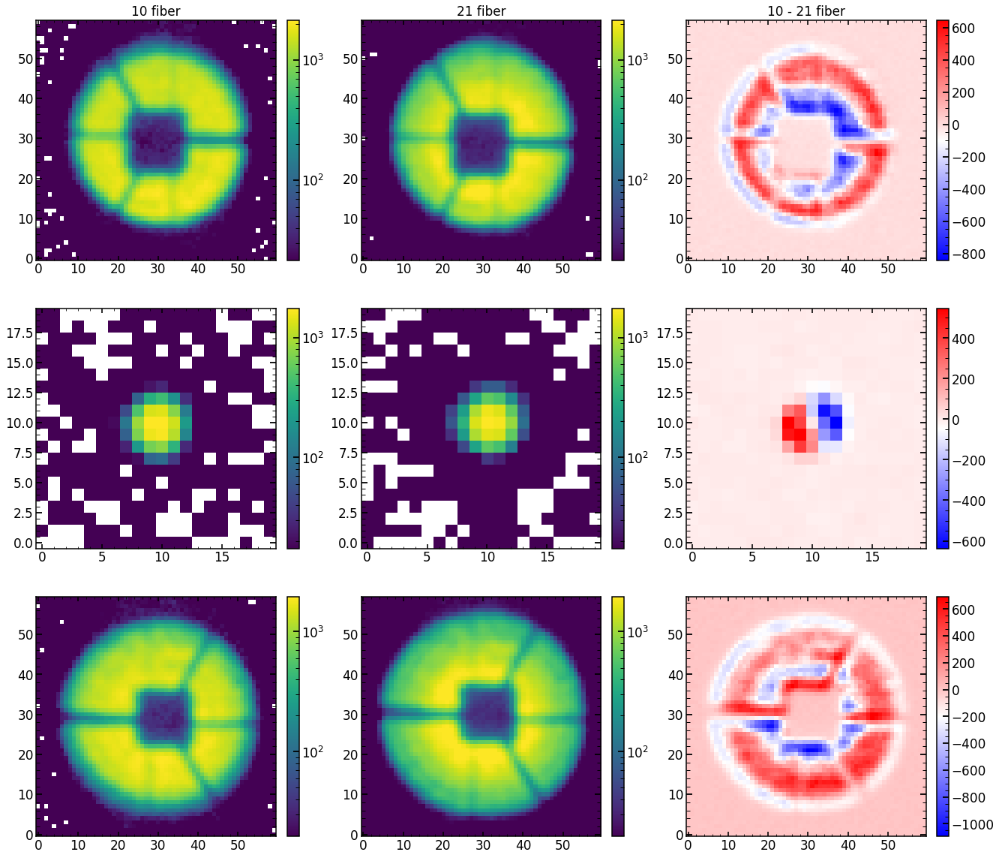

In [142]:
single_number_10=51
single_number_21=219

obs=34341+48
obs_m4=34341+0
obs_p4=34341+48+48
sci_m4_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs_m4)+str(single_number_10)+'Ar_Stacked.npy')
sci_focus_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs)+str(single_number_10)+'Ar_Stacked.npy')
sci_p4_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs_p4)+str(single_number_10)+'Ar_Stacked.npy')

obs=51485+8*12
obs_m4=51485
obs_p4=51485+16*12

sci_m4_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs_m4)+str(single_number_21)+'Ar_Stacked.npy')
sci_focus_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs)+str(single_number_21)+'Ar_Stacked.npy')
sci_p4_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs_p4)+str(single_number_21)+'Ar_Stacked.npy')

sci_m4_10_renormalized=sci_m4_10*np.sum(sci_m4_21)/np.sum(sci_m4_10)
sci_focus_10_renormalized=sci_focus_10*np.sum(sci_focus_21)/np.sum(sci_focus_10)
sci_p4_10_renormalized=sci_p4_10*np.sum(sci_p4_21)/np.sum(sci_p4_10)

plt.figure(figsize=(22,20))

plt.subplot(331)
plt.title('10 fiber')
plt.imshow(sci_m4_10_renormalized,norm=LogNorm(),vmax=np.max(sci_m4_10_renormalized),vmin=np.max(sci_m4_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(332)
plt.title('21 fiber')
plt.imshow(sci_m4_21,norm=LogNorm(),vmax=np.max(sci_m4_10_renormalized),vmin=np.max(sci_m4_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(333)
plt.title('10 - 21 fiber')
plt.imshow(sci_m4_10_renormalized-sci_m4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.imshow(sci_focus_10_renormalized,norm=LogNorm(),vmax=np.max(sci_focus_10_renormalized),vmin=np.max(sci_focus_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.imshow(sci_focus_21,norm=LogNorm(),vmax=np.max(sci_focus_10_renormalized),vmin=np.max(sci_focus_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.imshow(sci_focus_10_renormalized-sci_focus_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)



plt.subplot(337)
plt.imshow(sci_p4_10_renormalized,norm=LogNorm(),vmax=np.max(sci_p4_10_renormalized),vmin=np.max(sci_p4_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.imshow(sci_p4_21,norm=LogNorm(),vmax=np.max(sci_p4_10_renormalized),vmin=np.max(sci_p4_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(339)
plt.imshow(sci_p4_10_renormalized-sci_p4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

In [134]:
#sci_m4_10_renormalized_97=np.copy(sci_m4_10_renormalized)
#sci_m4_21_337=np.copy(sci_m4_21)

In [139]:
#sci_m4_10_renormalized_73=np.copy(sci_m4_10_renormalized)
#sci_m4_21_265=np.copy(sci_m4_21)

In [143]:
#sci_m4_10_renormalized_61=np.copy(sci_m4_10_renormalized)
#sci_m4_21_241=np.copy(sci_m4_21)

In [150]:
sci_m4_10_renormalized_49=np.copy(sci_m4_10_renormalized)
sci_m4_21_217=np.copy(sci_m4_21)

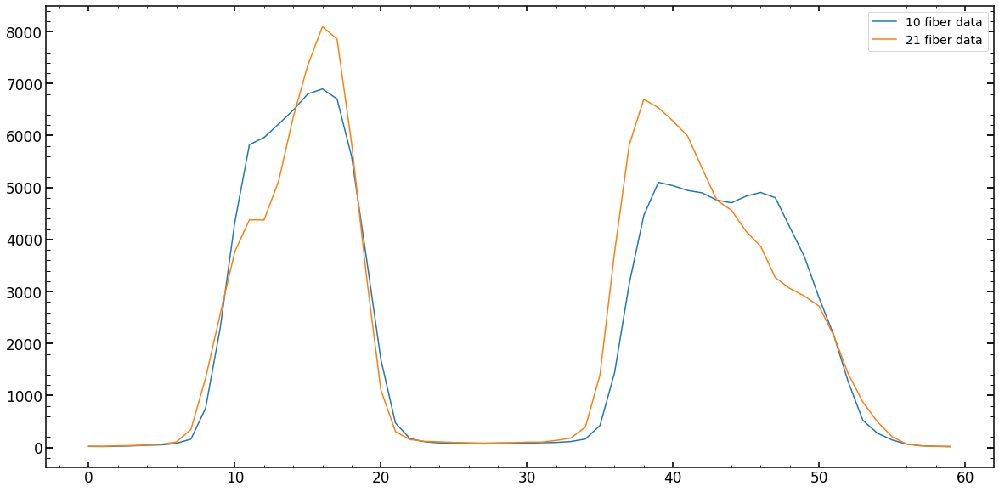

In [151]:
plt.figure(figsize=(20,10))
plt.plot(sci_m4_10_renormalized_49[:,30],label='10 fiber data')
plt.plot(sci_m4_21_217[:,30],label='21 fiber data')
plt.legend()

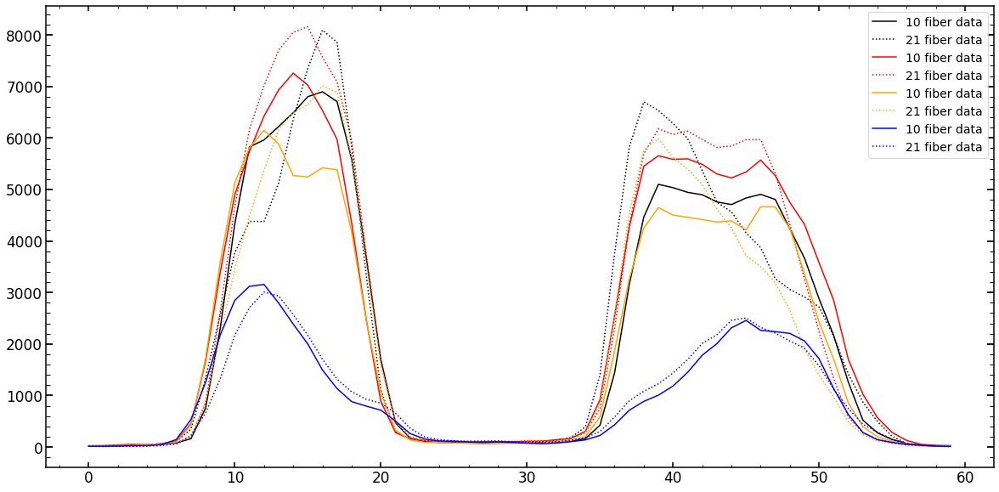

In [153]:
plt.figure(figsize=(20,10))
plt.plot(sci_m4_10_renormalized_49[:,30],label='10 fiber data',color='black')
plt.plot(sci_m4_21_217[:,30],label='21 fiber data',color='black',ls=':')

plt.plot(sci_m4_10_renormalized_61[:,30],label='10 fiber data',color='red')
plt.plot(sci_m4_21_241[:,30],label='21 fiber data',color='red',ls=':')

plt.plot(sci_m4_10_renormalized_73[:,30],label='10 fiber data',color='orange')
plt.plot(sci_m4_21_265[:,30],label='21 fiber data',color='orange',ls=':')

plt.plot(sci_m4_10_renormalized_97[:,30],label='10 fiber data',color='blue')
plt.plot(sci_m4_21_337[:,30],label='21 fiber data',color='blue',ls=':')

plt.legend()

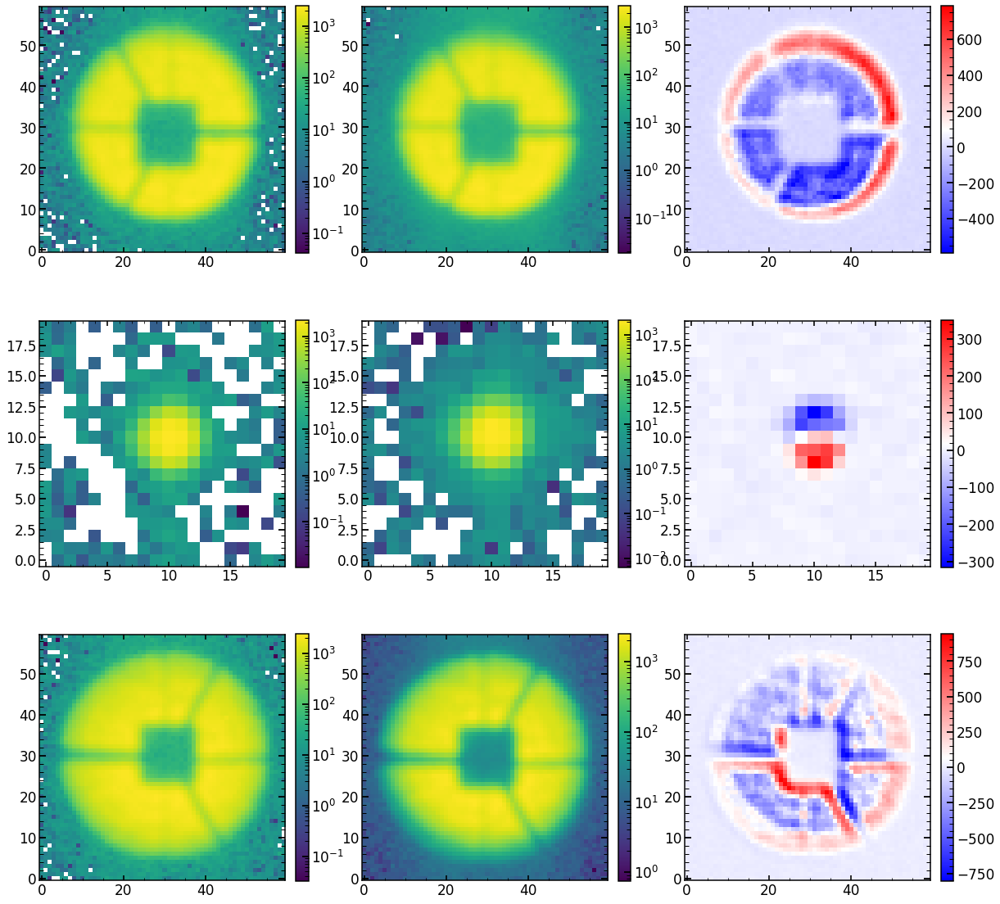

In [125]:
obs=34341+48
obs_m4=34341
obs_p4=34341+48+48
sci_m4_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs_m4)+'63Ar_Stacked.npy')
sci_focus_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs)+'63Ar_Stacked.npy')
sci_p4_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs_p4)+'63Ar_Stacked.npy')

obs=51485+8*12
obs_m4=51485
obs_p4=51485+16*12

sci_m4_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs_m4)+'243Ar_Stacked.npy')
sci_focus_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs)+'243Ar_Stacked.npy')
sci_p4_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs_p4)+'243Ar_Stacked.npy')

sci_m4_10_renormalized=sci_m4_10*np.sum(sci_m4_21)/np.sum(sci_m4_10)
sci_focus_10_renormalized=sci_focus_10*np.sum(sci_focus_21)/np.sum(sci_focus_10)
sci_p4_10_renormalized=sci_p4_10*np.sum(sci_p4_21)/np.sum(sci_p4_10)

plt.figure(figsize=(20,20))

plt.subplot(331)
plt.imshow(sci_m4_10_renormalized,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(332)
plt.imshow(sci_m4_21,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(333)
plt.imshow(sci_m4_10_renormalized-sci_m4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.imshow(sci_focus_10_renormalized,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.imshow(sci_focus_21,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.imshow(sci_focus_10_renormalized-sci_focus_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)



plt.subplot(337)
plt.imshow(sci_p4_10_renormalized,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.imshow(sci_p4_21,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(339)
plt.imshow(sci_p4_10_renormalized-sci_p4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

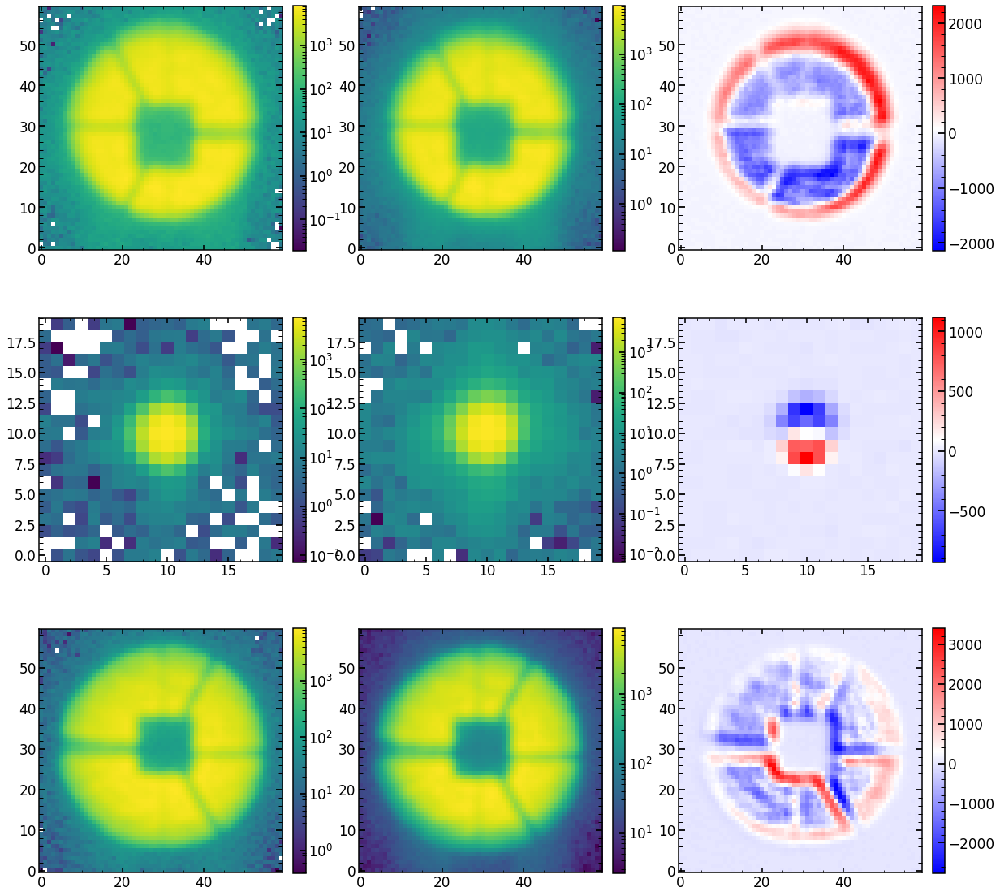

In [60]:
obs=34341+48
obs_m4=34341
obs_p4=34341+48+48
sci_m4_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs_m4)+'61Ar_Stacked.npy')
sci_focus_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs)+'61Ar_Stacked.npy')
sci_p4_10=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci'+str(obs_p4)+'61Ar_Stacked.npy')

obs=51485+8*12
obs_m4=51485
obs_p4=51485+16*12

sci_m4_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs_m4)+'241Ar_Stacked.npy')
sci_focus_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs)+'241Ar_Stacked.npy')
sci_p4_21=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci'+str(obs_p4)+'241Ar_Stacked.npy')

sci_m4_10_renormalized=sci_m4_10*np.sum(sci_m4_21)/np.sum(sci_m4_10)
sci_focus_10_renormalized=sci_focus_10*np.sum(sci_focus_21)/np.sum(sci_focus_10)
sci_p4_10_renormalized=sci_p4_10*np.sum(sci_p4_21)/np.sum(sci_p4_10)

plt.figure(figsize=(20,20))

plt.subplot(331)
plt.imshow(sci_m4_10_renormalized,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(332)
plt.imshow(sci_m4_21,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(333)
plt.imshow(sci_m4_10_renormalized-sci_m4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.imshow(sci_focus_10_renormalized,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.imshow(sci_focus_21,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.imshow(sci_focus_10_renormalized-sci_focus_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)



plt.subplot(337)
plt.imshow(sci_p4_10_renormalized,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.imshow(sci_p4_21,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(339)
plt.imshow(sci_p4_10_renormalized-sci_p4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

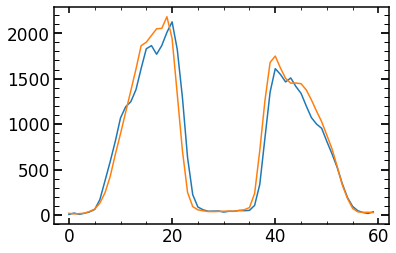

In [66]:
plt.plot(sci_p4_10_renormalized[:,30])
plt.plot(sci_p4_21[:,30])

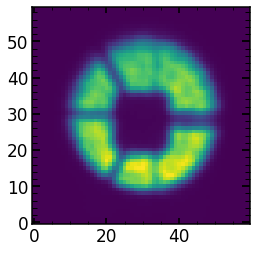

In [201]:
sci_m4_10_2021=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_Jan_21/Stamps_cleaned/sci4717649Ar_Stacked.npy')
sci_p4_10_2021=np.load('/Volumes/Saturn_USA/PFS/ReducedData/Data_May_21/Stamps_cleaned/sci4756049Ar_Stacked.npy')
plt.imshow(sci_m4_10_2021)

In [202]:
sci_m4_10_2021_renormalized=sci_m4_10_2021*np.sum(sci_m4_10)/np.sum(sci_m4_10_2021)
sci_p4_10_2021_renormalized=sci_p4_10_2021*np.sum(sci_p4_10)/np.sum(sci_p4_10_2021)

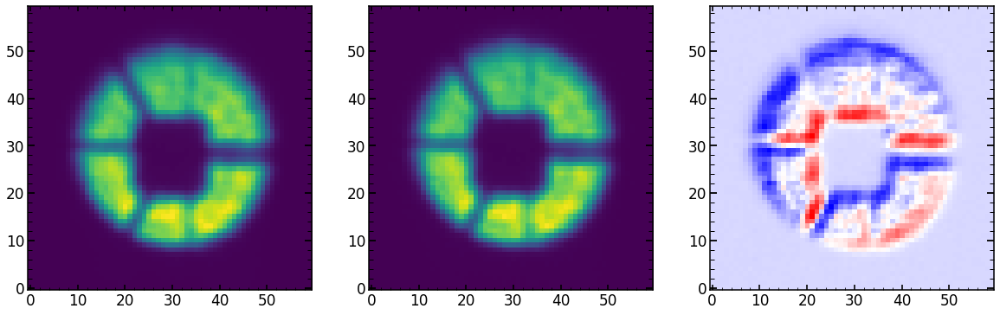

In [195]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(sci_m4_10_2021_renormalized)

plt.subplot(132)
plt.imshow(sci_m4_10)

plt.subplot(133)
plt.imshow(sci_m4_10_2021_renormalized-sci_m4_10,cmap='bwr')



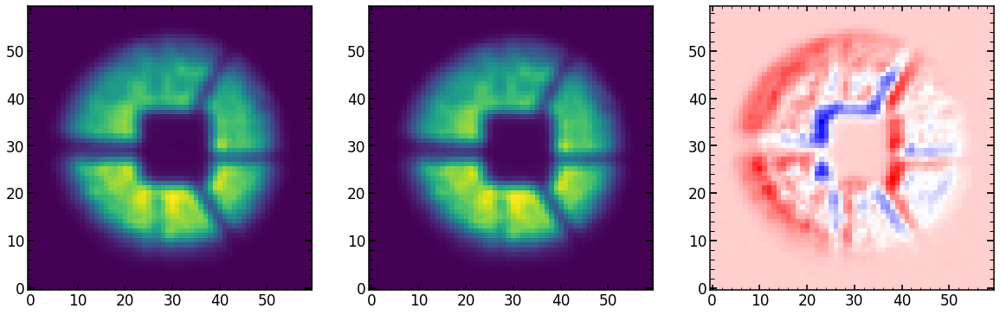

In [203]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(sci_p4_10_2021_renormalized)

plt.subplot(132)
plt.imshow(sci_p4_10)

plt.subplot(133)
plt.imshow(sci_p4_10_2021_renormalized-sci_p4_10,cmap='bwr')


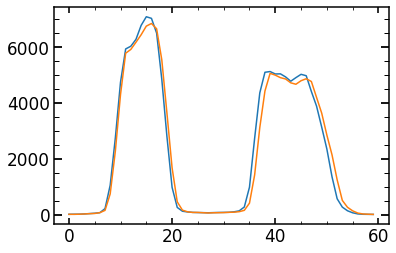

In [198]:
plt.plot(sci_m4_10_2021_renormalized[:,30])
plt.plot(sci_m4_10[:,30])

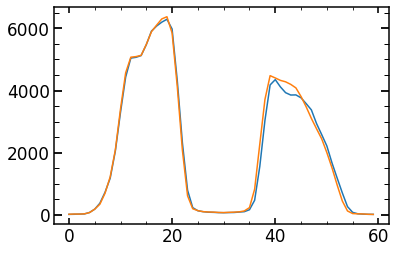

In [204]:
plt.plot(sci_p4_10_2021_renormalized[:,30])
plt.plot(sci_p4_10[:,30])

In [217]:
np.unique(finalAr['fiber'])

array([2, 12, 32, 60, 63, 110, 111, 161, 192, 210, 223, 255, 259, 289,
       339, 341, 360, 400, 401, 418, 449, 464, 497, 518, 525, 545, 587,
       593, 621, 643, 650], dtype=object)

In [218]:
finalAr[finalAr['fiber']==643]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
120,643,118,806,690.9346,0,Ar,118,-19.250,0.0034,-40.7,0.006
121,643,118,872,696.7261,1,Ar,118,0.000,0.0000,0.0,0.000
122,643,119,989,706.8989,0,Ar,119,-39.597,0.0143,0.0,0.000
123,643,120,1226,727.47876,1,Ar,120,0.000,0.0000,0.0,0.000
124,643,121,1354,738.6248,0,Ar,121,-13.140,0.0110,0.0,0.000
125,643,122,1643,763.74286,1,Ar,122,0.000,0.0000,0.0,0.000
126,643,122,2006,795.0522,1,Ar,122,0.000,0.0000,0.0,0.000
127,643,122,2374,826.6699,1,Ar,122,0.000,0.0000,0.0,0.000
128,643,121,2675,852.4029,1,Ar,121,0.000,0.0000,0.0,0.000
129,643,116,3388,912.5693,1,Ar,116,0.000,0.0000,0.0,0.000


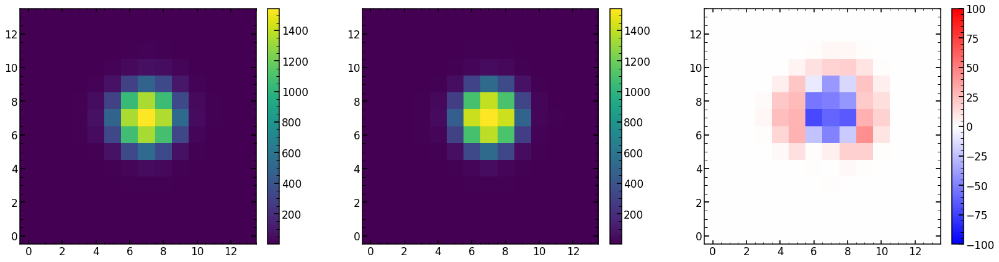

In [141]:
image_21=res_with_Image_21[1]
image_10=res_with_Image_10[1]
image_21=image_21*np.sum(image_10)/np.sum(image_21)

plt.figure(figsize=(28,7))



plt.subplot(131)
plt.imshow(image_21[3:17,3:17],vmax=np.max(image_21))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.imshow(image_10[3:17,3:17],vmax=np.max(image_21))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.imshow(image_21[3:17,3:17]-image_10[3:17,3:17],cmap='bwr',vmax=100,vmin=-100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

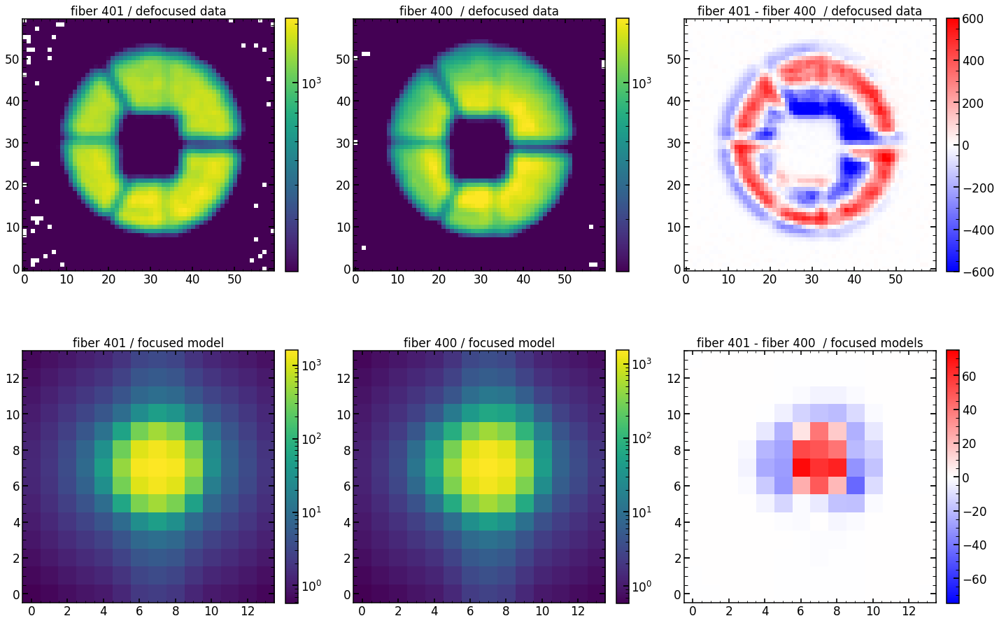

In [153]:
plt.figure(figsize=(24,16))

plt.subplot(231)
plt.title('fiber 401 / defocused data')
plt.imshow(sci_m4_10_renormalized,norm=LogNorm(),vmax=np.max(sci_m4_10_renormalized),vmin=np.max(sci_m4_10_renormalized)/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(232)
plt.title('fiber 400  / defocused data')
plt.imshow(sci_m4_21,norm=LogNorm(),vmax=np.max(sci_m4_10_renormalized),vmin=np.max(sci_m4_10_renormalized)/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(233)
plt.title('fiber 401 - fiber 400  / defocused data')
plt.imshow(sci_m4_10_renormalized-sci_m4_21,cmap='bwr',vmax=600,vmin=-600)
cbar=plt.colorbar(fraction=0.046, pad=0.04)



plt.subplot(234)
plt.title('fiber 401 / focused model')
plt.imshow(image_10[3:17,3:17],vmax=np.max(image_10),norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(235)
plt.title('fiber 400 / focused model')
plt.imshow(image_21[3:17,3:17],vmax=np.max(image_21),norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(236)
plt.title('fiber 401 - fiber 400  / focused models')
plt.imshow(image_10[3:17,3:17]-image_21[3:17,3:17],cmap='bwr',vmax=75,vmin=-75)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

In [117]:
res_with_Image_10

(-13.85886287689209,
 array([[   0.2640902 ,    0.29354617,    0.3258271 ,    0.36059323,
            0.39734095,    0.43517908,    0.47296503,    0.51418334,
            0.6312854 ,    0.9169474 ,    1.0295117 ,    0.91523355,
            0.6299559 ,    0.5102708 ,    0.47255227,    0.4350655 ,
            0.3972473 ,    0.36055017,    0.32581422,    0.29354   ],
        [   0.293422  ,    0.3301413 ,    0.37146112,    0.41713655,
            0.46647844,    0.5186715 ,    0.57241946,    0.6317098 ,
            0.7904404 ,    1.1664451 ,    1.3132343 ,    1.1615905 ,
            0.78594285,    0.62652576,    0.5719528 ,    0.5185977 ,
            0.46646002,    0.41711023,    0.3714336 ,    0.33014303],
        [   0.32575166,    0.37127066,    0.4242088 ,    0.48477444,
            0.5524235 ,    0.62586766,    0.70397794,    0.79230344,
            1.0157101 ,    1.5299904 ,    1.7323596 ,    1.5188783 ,
            1.0062863 ,    0.78516334,    0.7034479 ,    0.6259365 ,
           

# Frd analysis when it is bad 

In [75]:
minchain_original=np.copy(list_of_minchain[index_of_single_image])

In [76]:
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True)  

res_with_Image=model(minchain_original,return_Image=True,use_only_chi=True)


test_Image=res_with_Image[1]

Science image shape is: (20, 20)
Top left pixel value of the science image is: 6.6012983
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 4.1131105
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.2643404      0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67570471
     0.07748559    -0.08983609    -0.01122745     0.0575504
     0.02100696     0.29850797     0.1364008      0.23485726
     1.23607639     0.01349601    -0.06147791     

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [16.30186491 24.04386541] / 1.6600996862805177
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [10.80186491 -8.95613459] / 1.513652984824754
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.19813509 13.04386541] / 0.8975090259082622
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.17686491 -0.70613459] / 0.9751565163133729
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.17686491 21.29386541] / 1.2910166559706868
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.67686491 -11.70613459] / 1.9446482111815748
sim00=False and center of light =true
chi2 within shgo with use_only_

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.08395852 7.60835908] / 0.00016656631867395776
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.07795178 7.60825347] / 0.0005909657217297133
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.0857535  7.60606298] / 0.00017784847968069144
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.08736468 7.60919485] / 0.0004061505611156158
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.08360167 7.60621912] / 3.408808537875204e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.08180669 7.60851522] / 0.0002700131752943484
sim00=False and center of light =true
chi2 within shgo with us

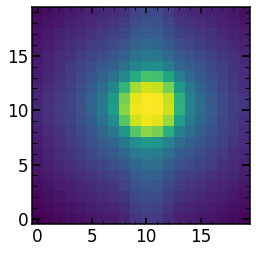

In [78]:
plt.imshow(test_Image,norm=LogNorm())

In [80]:
minchain_original

array([    0.2643404 ,     0.10509474,    -0.2195338 ,     0.30783891,
           0.03175032,    -0.08835079,    -0.26952185,    -0.44443116,
          -0.06712491,    -0.01067905,     0.04206758,     0.03497983,
          -0.00078142,     0.04132943,     0.00015836,    -0.01501016,
          -0.03220647,     0.02601816,    -0.00251206,     0.67570471,
           0.07748559,    -0.08983609,    -0.01122745,     0.0575504 ,
           0.02100696,     0.29850797,     0.1364008 ,     0.23485726,
           1.23607639,     0.01349601,    -0.06147791,     0.95482105,
           0.06079135,     0.36138634,     1.00934774,     0.28510391,
       82272.37420451,     2.44389599,     0.00249541,     0.29749303,
           1.83713185,     1.        ,    -0.01285267,    -0.00864013,
          -0.00139112,    -0.00381739,    -0.003522  ,     0.00347885,
           0.00241284,     0.00253312,    -0.00661511,     0.00003051,
           0.00006039,    -0.01129648,    -0.00369892,     0.0000271 ,
      

In [81]:
bad_minchain=np.copy(minchain_original)
bad_minchain[0]=-0.24

In [82]:
res_with_Image=model(bad_minchain,return_Image=True,use_only_chi=True)


test_Image_bad=res_with_Image[1]


Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67570471
     0.07748559    -0.08983609    -0.01122745     0.0575504
     0.02100696     0.29850797     0.1364008      0.23485726
     1.23607639     0.01349601    -0.06147791     0.95482105
     0.06079135     0.36138634     1.00934774     0.28510391
 82272.37420451     2.44389599     0.00249541     0.29749303
     1.83713185     1.            -0.01285267    -0.00864013
    -0.00139112    -0.00381739    -0.003522       0.00347885
     0.00241284     0.00253312    -0.00661511     0.00003051
     0.00006039    -0.01129648    -0.00369892     0.0000271
     0.0055765     -0.00395639    -0.00166231    -0.00073259
     0.00351182     0.0056447      0.00246309    -

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.88916048 9.96018672] / 0.27539398139103927
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.13916048 -6.53981328] / 1.300977232335136
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [15.13916048 15.46018672] / 0.9642480088693502
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [9.63916048 4.46018672] / 0.2791758492707992
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-1.36083952 26.46018672] / 1.9413442920231188
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.67333952  5.83518672] / 0.8210329543037238
sim00=False and center of light =true
chi2 within shgo with use_only_chi F

chi2 within shgo with use_only_chi False and use_center_of_light True [8.29043121 7.24130903] / 4.0085660767471114e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.29071174 7.24201904] / 4.064729455838304e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.2907136  7.24176959] / 1.8412985861486613e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.29128214 7.24219182] / 7.15867115392276e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.29064394 7.24152973] / 1.3266526604372757e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.2903578  7.24156806] / 3.8094106838968375e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_li

In [ ]:
plt.subplot(331)
plt.title('10 fiber')
plt.imshow(sci_m4_10_renormalized,norm=LogNorm(),vmax=np.max(sci_m4_10_renormalized),vmin=np.max(sci_m4_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(332)
plt.title('21 fiber')
plt.imshow(sci_m4_21,norm=LogNorm(),vmax=np.max(sci_m4_10_renormalized),vmin=np.max(sci_m4_10_renormalized)/100)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(333)
plt.title('10 - 21 fiber')
plt.imshow(sci_m4_10_renormalized-sci_m4_21,cmap='bwr')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

NameError: name 'test_Image' is not defined

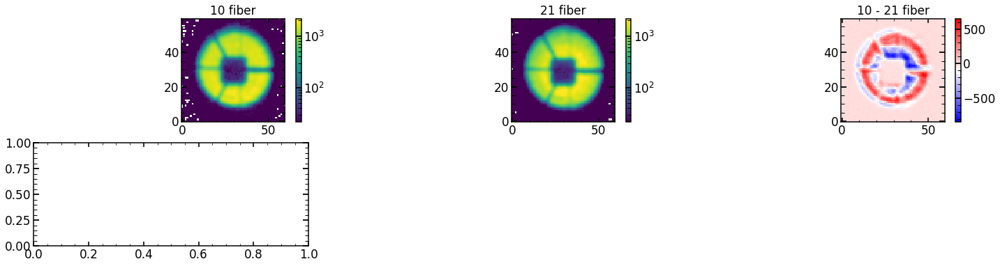

In [99]:
columns22

['z4',
 'z5',
 'z6',
 'z7',
 'z8',
 'z9',
 'z10',
 'z11',
 'z12',
 'z13',
 'z14',
 'z15',
 'z16',
 'z17',
 'z18',
 'z19',
 'z20',
 'z21',
 'z22',
 'hscFrac',
 'strutFrac',
 'dxFocal',
 'dyFocal',
 'slitFrac',
 'slitFrac_dy',
 'wide_0',
 'wide_23',
 'wide_43',
 'misalign',
 'x_fiber',
 'y_fiber',
 'effective_radius_illumination',
 'frd_sigma',
 'frd_lorentz_factor',
 'det_vert',
 'slitHolder_frac_dx',
 'grating_lines',
 'scattering_slope',
 'scattering_amplitude',
 'pixel_effect',
 'fiber_r',
 'flux']

In [107]:
list_of_bad_minchain=[]
for i in range(1,13):
    bad_minchain_single=np.copy(bad_minchain)
    bad_minchain_single[32]=i*0.01
    list_of_bad_minchain.append(bad_minchain_single)
   
list_of_bad_minchain_single=[]
for i in tqdm(range(12)):        
    res_with_Image=model(list_of_bad_minchain[i],return_Image=True,use_only_chi=True)


    test_Image_bad_single=res_with_Image[1]
    
    list_of_bad_minchain_single.append(test_Image_bad_single)

  0%|                                                    | 0/12 [00:00<?, ?it/s]


Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67570471
     0.07748559    -0.08983609    -0.01122745     0.0575504
     0.02100696     0.29850797     0.1364008      0.23485726
     1.23607639     0.01349601    -0.06147791     0.95482105
     0.01           0.36138634     1.00934774     0.28510391
 82272.37420451     2.44389599     0.00249541     0.29749303
     1.83713185     1.            -0.01285267    -0.00864013
    -0.00139112    -0.00381739    -0.003522       0.00347885
     0.00241284     0.00253312    -0.00661511     0.00003051
     0.00006039    -0.01129648    -0.00369892     0.0000271
     0.0055765     -0.00395639    -0.00166231    -0.00073259
     0.00351182     0.0056447      0.00246309    -

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.94281534 9.59468904] / 0.2751722029958078
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.19281534 -6.90531096] / 1.3005987690747607
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [15.19281534 15.09468904] / 0.9646651686914597
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [9.69281534 4.09468904] / 0.27878313695563506
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-1.30718466 26.09468904] / 1.9417660706895434
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.61968466  5.46968904] / 0.8210883877021076
sim00=False and center of light =true
chi2 within shgo with use_only_chi 

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.34590514 6.89152183] / 7.416169179107361e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.34671648 6.89224408] / 2.7482175412276913e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.3469069  6.89191169] / 2.8038339008078054e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.34648984 6.89210507] / 1.5081099162566223e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.34631461 6.89169812] / 3.6148516162470465e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.34661601 6.89210759] / 1.2462400897138523e-05
sim00=False and center of light =true
chi2 within shgo with

  8%|███▋                                        | 1/12 [00:14<02:42, 14.74s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0261304
Finished with lnlike_Neven
chi_almost/d.o.f is 8.623453; chi_almost_max_dof is 61.456562 log(improvment) is -0.85288703
The likelihood reported is: -8.623453140258789
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 14.73479413986206 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.6757

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 2.80646239 17.9345493 ] / 1.109284038053092
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [5.55646239 1.4345493 ] / 0.5608853949996471
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [16.55646239 23.4345493 ] / 1.659823438287789
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [11.05646239 -9.5654507 ] / 1.513458617325636
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 0.05646239 12.4345493 ] / 0.8969049307651228
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.43146239 -1.3154507 ] / 0.9765730423391925
sim00=False and center of light =true
chi2 within shgo with use_only_chi Fa

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.33608508 6.97778686] / 0.0001438577325272858
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.33420921 6.97665649] / 5.716701797484877e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.33458619 6.9786407 ] / 0.00014614279331562045
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.33463105 6.97669106] / 4.134595533998935e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.33381727 6.97532217] / 0.0001866128240384873
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.33472156 6.97734958] / 2.3874837150088914e-05
sim00=False and center of light =true
chi2 within shgo with us

 17%|███████▎                                    | 2/12 [00:27<02:17, 13.74s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0224062
Finished with lnlike_Neven
chi_almost/d.o.f is 7.888287; chi_almost_max_dof is 61.456562 log(improvment) is -0.8915855
The likelihood reported is: -7.88828706741333
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 13.04401159286499 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.675704

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [11.04590099 -9.48309065] / 1.5141684293931734
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 0.04590099 12.51690935] / 0.8965466074331837
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.42090099 -1.23309065] / 0.9765891239856076
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.42090099 20.76690935] / 1.2896568506088144
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.92090099 -12.23309065] / 1.9460897616542265
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.92090099 9.76690935] / 0.27479780373371737
sim00=False and center of light =true
chi2 within shgo with use_only_

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.32243038 7.05228638] / 0.00027254277304829646
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.32353396 7.05528267] / 3.31847004489876e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.32470326 7.05543913] / 0.00011309097655399545
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.3231119  7.05451404] / 5.5601194952889645e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.32289511 7.05543457] / 7.442186087890759e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.32353684 7.05463025] / 2.9423973135959648e-05
sim00=False and center of light =true
chi2 within shgo with u

 25%|███████████                                 | 3/12 [00:39<01:54, 12.77s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0197957
Finished with lnlike_Neven
chi_almost/d.o.f is 7.422441; chi_almost_max_dof is 61.456562 log(improvment) is -0.9180215
The likelihood reported is: -7.422441005706787
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 11.619943141937256 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.6757

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 0.03577759 12.58860433] / 0.8962774641645058
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.41077759 -1.16139567] / 0.9764551285627682
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.41077759 20.83860433] / 1.289787575114612
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.91077759 -12.16139567] / 1.9459562849630925
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.91077759 9.83860433] / 0.2749259124210654
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.16077759 -6.66139567] / 1.300305963154672
sim00=False and center of light =true
chi2 within shgo with use_only_chi

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.31483072 7.12514774] / 0.0002470846064489235
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.3125638  7.12295216] / 4.512566962928085e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.31332306 7.12220498] / 9.534510652051306e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.31303562 7.12359445] / 4.044297750271818e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.31190035 7.12323618] / 9.92192617913415e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.31324939 7.12329187] / 2.3656205353376392e-05
sim00=False and center of light =true
chi2 within shgo with use_

 33%|██████████████▋                             | 4/12 [00:52<01:42, 12.85s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0178114
Finished with lnlike_Neven
chi_almost/d.o.f is 7.098231; chi_almost_max_dof is 61.456562 log(improvment) is -0.93741816
The likelihood reported is: -7.098230838775635
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 12.961396932601929 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.675

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [11.02553336 -9.34882565] / 1.5150190295414654
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 0.02553336 12.65117435] / 0.8961432639306461
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.40053336 -1.09882565] / 0.9762505717289373
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.40053336 20.90117435] / 1.2900069901742637
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.90053336 -12.09882565] / 1.9457369523246557
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [6.90053336 9.90117435] / 0.27513811580500797
sim00=False and center of light =true
chi2 within shgo with use_only_

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.30020683 7.18587448] / 0.0002944970544813565
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.30296978 7.18307995] / 6.421741450327686e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.30242811 7.18117106] / 0.00022246868666582286
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.30234675 7.18401719] / 4.422872193583022e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.30353857 7.18404013] / 0.00010734138736556705
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.30221811 7.18330279] / 3.0960845362598874e-05
sim00=False and center of light =true
chi2 within shgo with u

 42%|██████████████████▎                         | 5/12 [01:04<01:27, 12.50s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0162829
Finished with lnlike_Neven
chi_almost/d.o.f is 6.874866; chi_almost_max_dof is 61.456562 log(improvment) is -0.951304
The likelihood reported is: -6.874866008758545
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 11.88359522819519 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.675704

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [5.51500186 1.70613439] / 0.5623019223863536
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [16.51500186 23.70613439] / 1.6583719965937909
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [11.01500186 -9.29386561] / 1.5151515415650736
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 0.01500186 12.70613439] / 0.8961048959633582
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.39000186 -1.04386561] / 0.9760260018197044
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.39000186 20.95613439] / 1.290252175514772
sim00=False and center of light =true
chi2 within shgo with use_only_chi 

 50%|██████████████████████                      | 6/12 [01:19<01:20, 13.45s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.015132
Finished with lnlike_Neven
chi_almost/d.o.f is 6.7247047; chi_almost_max_dof is 61.456562 log(improvment) is -0.96089506
The likelihood reported is: -6.724704742431641
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 15.281564950942993 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.675

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 0.00440356 12.75432592] / 0.896130561152319
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.37940356 -0.99567408] / 0.9758125952818942
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.37940356 21.00432592] / 1.2904853376725276
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.87940356 -11.99567408] / 1.945256219293317
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 6.87940356 10.00432592] / 0.27560234474158674
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.12940356 -6.49567408] / 1.3013659431885745
sim00=False and center of light =true
chi2 within shgo with use_only_

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.28142864 7.28569293] / 5.531226892646349e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.28056625 7.28631695] / 4.769500835561628e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.27969029 7.2862886 ] / 0.00010998048852710148
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.28099406 7.28584185] / 1.4311432744936154e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.28098049 7.28518948] / 6.154908178260645e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.28066981 7.28603508] / 2.173035210961385e-05
sim00=False and center of light =true
chi2 within shgo with us

 58%|█████████████████████████▋                  | 7/12 [01:32<01:06, 13.38s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0143065
Finished with lnlike_Neven
chi_almost/d.o.f is 6.6310062; chi_almost_max_dof is 61.456562 log(improvment) is -0.96698886
The likelihood reported is: -6.631006240844727
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 13.241796016693115 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.00592018 12.79627896] / 0.8961941203156623
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.36907982 -0.95372104] / 0.9756270516442317
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.36907982 21.04627896] / 1.2906858466762112
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.86907982 -11.95372104] / 1.9450500636680859
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 6.86907982 10.04627896] / 0.27579982470165265
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.11907982 -6.45372104] / 1.3017275817796523
sim00=False and center of light =true
chi2 within shgo with use_onl

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.2698228  7.32823748] / 6.807794309073556e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.26787129 7.3289935 ] / 0.00022605355711311057
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.27060431 7.32837565] / 4.1332972752238904e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.27086331 7.32768741] / 0.00010587981597857893
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.26988868 7.32861614] / 4.519915192453219e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.27067019 7.32875431] / 2.7680347725107737e-05
sim00=False and center of light =true
chi2 within shgo with 

 67%|█████████████████████████████▎              | 8/12 [01:48<00:56, 14.12s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0137606
Finished with lnlike_Neven
chi_almost/d.o.f is 6.5823364; chi_almost_max_dof is 61.456562 log(improvment) is -0.9701882
The likelihood reported is: -6.58233642578125
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 15.685296773910522 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.6757

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [5.48431296 1.83245124] / 0.5620971338435627
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [16.48431296 23.83245124] / 1.6585488942235869
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [10.98431296 -9.16754876] / 1.5150246524087991
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.01568704 12.83245124] / 0.8962766166069527
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.35931296 -0.91754876] / 0.9754756675446329
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.35931296 21.08245124] / 1.290847290004526
sim00=False and center of light =true
chi2 within shgo with use_only_chi 

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25988706 7.36721617] / 8.371996405345445e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25748065 7.36697253] / 0.00027786795985981685
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.26074736 7.36658543] / 2.2687636230870344e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.26120458 7.36758884] / 0.00011312568741834028
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25987353 7.36655678] / 5.7924641086838106e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.26073383 7.36592604] / 5.377158055996531e-05
sim00=False and center of light =true
chi2 within shgo with 

 75%|█████████████████████████████████           | 9/12 [02:04<00:43, 14.60s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0134522
Finished with lnlike_Neven
chi_almost/d.o.f is 6.5709243; chi_almost_max_dof is 61.456562 log(improvment) is -0.9709418
The likelihood reported is: -6.570924282073975
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 15.662691831588745 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.675

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.02470594 12.86332154] / 0.896364431316497
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.35029406 -0.88667846] / 0.9753580784795527
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.35029406 21.11332154] / 1.2909691943197315
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.85029406 -11.88667846] / 1.9447484263261279
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 6.85029406 10.11332154] / 0.2760855608974848
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.10029406 -6.38667846] / 1.3021742090656245
sim00=False and center of light =true
chi2 within shgo with use_only_

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.24846421 7.39994376] / 0.00027845706821787896
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.2520864  7.39959141] / 6.297349101478841e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25264732 7.39760741] / 0.00017887964586825556
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25111073 7.39992749] / 6.347934335262204e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25213513 7.39838077] / 9.829351638359714e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.25136683 7.39954081] / 2.366087809809955e-05
sim00=False and center of light =true
chi2 within shgo with us

 83%|███████████████████████████████████▊       | 10/12 [02:18<00:28, 14.43s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0133443
Finished with lnlike_Neven
chi_almost/d.o.f is 6.5886126; chi_almost_max_dof is 61.456562 log(improvment) is -0.9697743
The likelihood reported is: -6.5886125564575195
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 14.057565927505493 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.34211586 -0.8606215 ] / 0.9752700206555314
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.34211586 21.1393785 ] / 1.2910572423076683
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.84211586 -11.8606215 ] / 1.9446479882829018
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 6.84211586 10.1393785 ] / 0.2761783818283286
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 4.09211586 -6.3606215 ] / 1.3023027437104198
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [15.09211586 15.6393785 ] / 0.9630440408460925
sim00=False and center of light =true
chi2 within shgo with use_only

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.24838921 7.42864599] / 0.000477076985390734
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.24224867 7.42592987] / 0.00015496095986370042
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.23775885 7.42850895] / 0.0005142054350865225
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.24434503 7.42628651] / 0.00013351674153896213
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.24414697 7.42848143] / 0.00012069127108164715
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.24509612 7.42975721] / 0.00025832808248094373
sim00=False and center of light =true
chi2 within shgo with u

 92%|███████████████████████████████████████▍   | 11/12 [02:31<00:14, 14.05s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0134029
Finished with lnlike_Neven
chi_almost/d.o.f is 6.6296096; chi_almost_max_dof is 61.456562 log(improvment) is -0.9670803
The likelihood reported is: -6.62960958480835
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 13.19202709197998 seconds
 

Entering lnlike_Neven
allparameters [   -0.24           0.10509474    -0.2195338      0.30783891
     0.03175032    -0.08835079    -0.26952185    -0.44443116
    -0.06712491    -0.01067905     0.04206758     0.03497983
    -0.00078142     0.04132943     0.00015836    -0.01501016
    -0.03220647     0.02601816    -0.00251206     0.67570

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [16.45979005 23.91109843] / 1.6588656512945503
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [10.95979005 -9.08890157] / 1.5147096342909667
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-0.04020995 12.91109843] / 0.8965274475403098
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 1.33479005 -0.83890157] / 0.9752060683995717
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [12.33479005 21.16109843] / 1.2911173649102312
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 17.83479005 -11.83890157] / 1.944573845105273
sim00=False and center of light =true
chi2 within shgo with use_only_

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.2387416  7.45446894] / 0.00037272449403190583
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.23517445 7.45085592] / 7.970987848756822e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.23763236 7.44942216] / 0.0002060198432626523
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.235759   7.45193839] / 7.013624485563506e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.233341   7.45145093] / 0.0002455713883442203
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [8.23652959 7.45137027] / 5.163768088513281e-05
sim00=False and center of light =true
chi2 within shgo with use

100%|███████████████████████████████████████████| 12/12 [02:44<00:00, 13.67s/it]

Image in focus, using pipeline normalization; multiplying all values in the model by 1.0135988
Finished with lnlike_Neven
chi_almost/d.o.f is 6.6903467; chi_almost_max_dof is 61.456562 log(improvment) is -0.9631196
The likelihood reported is: -6.690346717834473
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4717571584
uname_result(system='Darwin', node='IapetusUSA', release='20.6.0', version='Darwin Kernel Version 20.6.0: Wed Jun 23 00:26:31 PDT 2021; root:xnu-7195.141.2~5/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4717571584 is: 12.663926839828491 seconds
 


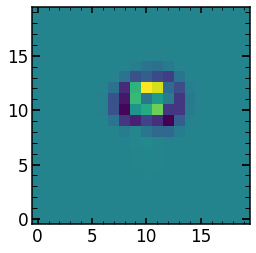

In [110]:
plt.imshow(test_Image-list_of_bad_minchain_single[0])

In [112]:

list_of_abs_chi=[]
for i in range(12):
    list_of_abs_chi.append(np.sum(np.abs(test_Image-list_of_bad_minchain_single[i])/np.sqrt(list_of_bad_minchain_single[i])))

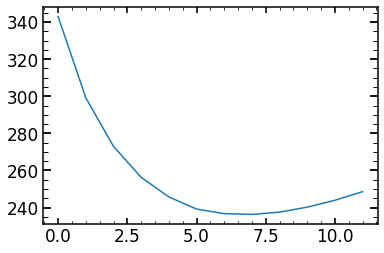

In [113]:
plt.plot(range(12),list_of_abs_chi)

# how should interpolation look like 

In [155]:
date='Aug0121'

FIT_RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/'+str(date)+'/'

if not os.path.exists(FIT_RESULT_FOLDER):
    os.makedirs(FIT_RESULT_FOLDER)
    
array_of_simulation_00=np.load(FIT_RESULT_FOLDER+'array_of_simulation_00_from_'+str(date)+'_v1.npy',allow_pickle=True)
positions_of_simulation_00=np.load(FIT_RESULT_FOLDER+'positions_of_simulation_00_from_'+str(date)+'_v1.npy',allow_pickle=True)

In [157]:
positions_of_simulation_00


array([[650, 69, 875, 696.7261],
       [63, 3623, 1632, 763.74286],
       [63, 3623, 1994, 795.0522],
       ...,
       [259, 2420, 3106, 892.87],
       [223, 2643, 3110, 892.87],
       [210, 2723, 3111, 892.87]], dtype=object)

In [161]:
def provide_PSF_2D(fiberId=None,wavelength=None,PSF_version=None):
    """ Provide 2D PSF at any position in the detector plane
        This a version which takes a finite nubmer of pregenerated PSF and \
        creates the interpolated version at required position
        (Future: version which takes interpolated values for Zernike \
        coefficients and generates image on the fly?)
        

    @param[in] fiberId      fiber of the requested solution
    @param[in] wavelength   wavelength of the requested solution
    @param[in] PSF_version  version of the PSF input files
    
    @returns                numpy array, (if PSF input file has size of189x189, oversampled 9 times, \
                            corresponding to 21x21 physical pixels (315x315 microns))
    """    

    date='Aug0121'
    PSF_version=str(date)+'_v1'
    DATA_DIRECTORY='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'
    positions_of_simulation=np.load(DATA_DIRECTORY+'positions_of_simulation_00_from_'+PSF_version+'.npy',allow_pickle=True)
    array_of_simulation=np.load(DATA_DIRECTORY+'array_of_simulation_00_from_'+PSF_version+'.npy',allow_pickle=True)


    # fiber, x, y position and wavelegnth of the simulated PSFs
    fibers_of_simulation=positions_of_simulation[:,0]
    x_positions_of_simulation=positions_of_simulation[:,1]
    y_positions_of_simulation=positions_of_simulation[:,2]
    wavelengths_of_simulation=positions_of_simulation[:,3]

    # select all of the solution avaliable in the requested fiber
    positions_of_simulation_in_a_fiber=\
    positions_of_simulation[fibers_of_simulation==fiberId]



    # if there are no simulated PSF avaliable in the specified fiber we are not able to provide the solution
    # return the solution of the nearest fiber
    if len(positions_of_simulation_in_a_fiber)<2:
        print('No simulated PSFs are avaliable in this fiber of the detector,')
        print('returning the PSF from closest fiber, BUT that is probably not what you want')

        # find the nearest fiber
        # this is done by searaching the index of all fiber avaliable
        # and select the one with the nearest index (so perhaps not the closest, but closest by index)
        avaliable_fibers=np.unique(fibers_of_simulation)
        distance_fiber = np.abs(avaliable_fibers - fiberId)
        smallest_difference_index = distance_fiber.argmin()
        # replace the requested fiber with the nearest fier
        fiberId=avaliable_fibers[smallest_difference_index]

        # select all of the solution avaliable in the nearest avaliable fiber
        positions_of_simulation_in_a_fiber=\
        positions_of_simulation[fibers_of_simulation==fiberId]


    # wavelength of the simulated solutions avaliable in the fiber
    wavelengths_of_simulation_in_a_fiber=positions_of_simulation_in_a_fiber[:,3]

    # wavelength-distance from the requested positions for all of the suitable simulated PSFs
    distances_of_wavelength_requested_position_from_avaliable=\
    wavelength-wavelengths_of_simulation_in_a_fiber

    # find two solutions that straddle the request point and to the linear interpolation
    
    # if you request for a spot exactly at the position of a input from the array 
    # just find that one spot
    if np.min(np.abs(distances_of_wavelength_requested_position_from_avaliable))==0:
        index_of_simulated_psf=\
        np.where(distances_of_wavelength_requested_position_from_avaliable==0)[0][0]   

        y1_distance=0
        y2_distance=0


        # where is that exact PSF in the initial table
        index_of_1st_closest_simulated_psf_in_positions_of_simulation=\
        np.where(np.sum(positions_of_simulation,axis=1)==\
                 np.sum(positions_of_simulation_in_a_fiber[index_of_simulated_psf]))[0][0]
        print(index_of_1st_closest_simulated_psf_in_positions_of_simulation)
        # extract the 2 simulated PSFs
        first_array_simulation=\
        array_of_simulation[index_of_1st_closest_simulated_psf_in_positions_of_simulation]
        second_array_simulation=\
        array_of_simulation[index_of_1st_closest_simulated_psf_in_positions_of_simulation]
    else:
        distances_of_wavelength_requested_position_from_avaliable_which_are_above_the_spot=\
        distances_of_wavelength_requested_position_from_avaliable[distances_of_wavelength_requested_position_from_avaliable<0]
        distances_of_wavelength_requested_position_from_avaliable_which_are_below_the_spot=\
        distances_of_wavelength_requested_position_from_avaliable[distances_of_wavelength_requested_position_from_avaliable>0]

        # if there are no sources above, do not do interpolation and select the nearest source
        if len(distances_of_wavelength_requested_position_from_avaliable_which_are_above_the_spot)==0:
            index_of_1st_closest_above_simulated_psf=-99 
        else:
            index_of_1st_closest_above_simulated_psf=\
            np.where(distances_of_wavelength_requested_position_from_avaliable==\
                     np.max(distances_of_wavelength_requested_position_from_avaliable_which_are_above_the_spot))[0][0]    

        # if there are no sources below, do not do interpolation and select the nearest source
        if len(distances_of_wavelength_requested_position_from_avaliable_which_are_below_the_spot)==0:
            index_of_1st_closest_below_simulated_psf=-99
        else:
            index_of_1st_closest_below_simulated_psf=\
            np.where(distances_of_wavelength_requested_position_from_avaliable==\
                     np.min(distances_of_wavelength_requested_position_from_avaliable_which_are_below_the_spot))[0][0]       

        if index_of_1st_closest_below_simulated_psf==-99:
            index_of_1st_closest_below_simulated_psf=index_of_1st_closest_above_simulated_psf
        if index_of_1st_closest_above_simulated_psf==-99:
            index_of_1st_closest_above_simulated_psf=index_of_1st_closest_below_simulated_psf


        # where are these 2 closest PSF in the initial table
        index_of_1st_closest_simulated_psf_in_positions_of_simulation=\
        np.where(np.sum(positions_of_simulation,axis=1)==\
                 np.sum(positions_of_simulation_in_a_fiber[index_of_1st_closest_above_simulated_psf]))[0][0]
        index_of_2nd_closest_simulated_psf_in_positions_of_simulation=\
        np.where(np.sum(positions_of_simulation,axis=1)==\
                 np.sum(positions_of_simulation_in_a_fiber[index_of_1st_closest_below_simulated_psf]))[0][0]



        # extract the 2 simulated PSFs
        first_array_simulation=\
        array_of_simulation[index_of_1st_closest_simulated_psf_in_positions_of_simulation]
        second_array_simulation=\
        array_of_simulation[index_of_2nd_closest_simulated_psf_in_positions_of_simulation]    

        # y-position of the wavelength you are requesting
        # detectorMap needed here
        y=dm.findPoint(fiberId,wavelength)[1]

        # y-positions of the provided psf-s; first select their wavelength and the ask detectorMap for y value
        wavelength_1=positions_of_simulation[index_of_1st_closest_simulated_psf_in_positions_of_simulation][3]
        y1=dm.findPoint(fiberId,wavelength_1)[1]
        wavelength_2=positions_of_simulation[index_of_2nd_closest_simulated_psf_in_positions_of_simulation][3]
        y2=dm.findPoint(fiberId,wavelength_2)[1]

        # distance of each PSF from the proposed position
        y1_distance=y-y1
        y2_distance=y-y2

    # if you requested psf at the exact position of existing PSF use that one OR
    # if you are outside of the range covered by spots, use the last avaliable image
    if y1_distance==0 or y1_distance==y2_distance:


        # changed so the output is equivalent as in more general case
        return first_array_simulation,first_array_simulation,second_array_simulation,y1_distance,y2_distance
        # ! end of change here on April 22, 2020
    else:    
        # create the predicted PSF as a linear interpolation of these two PSFs
        predicted_psf=(second_array_simulation-first_array_simulation*(y2_distance/y1_distance))/(1-y2_distance/y1_distance)
        return predicted_psf,first_array_simulation,second_array_simulation,y1_distance,y2_distance

In [162]:
provide_PSF_2D(fiberId=341,wavelength=937.8,PSF_version=None)

NameError: name 'dm' is not defined

# PIPE2D-880, slow execution 

In [45]:
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=False)  

res_with_Image_10=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7328897
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.6817136
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.20.3
scipy.__version__1.6.2
Zernike_Module.__version__0.47f
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.39688587     0.01398799    -0.5930547      0.37408595
    -0.00724699    -0.02165102    -0.26843767    -0.45003392
    -0.01468504    -0.01193744    -0.00153957     0.04175221
    -0.03396056     0.02014584     0.0099644     -0.01725726
    -0.04659504    -0.00414725    -0.00553679     0.64488234
     0.07733101    -0.04796971    -0.03974842     0.05739969
     0.0360364      0.32817029     0.1423118      0.001696
     1.19625273     0.00786866    -0.04978565     

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 11.17902059 -17.15941206] / 1.937187202555188
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [0.17902059 4.84058794] / 0.27388590787938644
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ -2.57097941 -11.65941206] / 1.2914887357408233
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 8.42902059 10.34058794] / 0.9645511860626487
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [ 2.92902059 -0.65941206] / 0.27665565209493287
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [-8.07097941 21.34058794] / 1.9343146316583375
sim00=False and center of light =true
chi2 within shgo with use_onl

sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [1.57898804 2.10773388] / 1.1373677587142281e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [1.57906468 2.1075991 ] / 3.0146067686996364e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [1.57891302 2.10756261] / 1.2330635109202146e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [1.57906448 2.10763736] / 2.2142135500121182e-06
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [1.57916585 2.10761067] / 1.0395928258633626e-05
sim00=False and center of light =true
chi2 within shgo with use_only_chi False and use_center_of_light True [1.57901394 2.10762201] / 2.429183557680392e-06
sim00=False and center of light =true
chi2 within shgo with

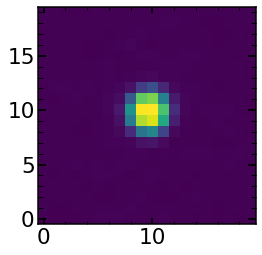

In [23]:
plt.imshow(list_of_sci_images[index_of_single_image])

In [29]:
image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Final_Images/image.npy')
image.shape

(809, 809)

In [66]:
image=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/optPsf_cut_grating_convolved.npy')
image.shape

(309, 309)

In [74]:
pos=galsim.PositionD(0.01,0.021)

In [84]:
shape_of_sci_image=20
oversampling=11
im1=  galsim.Image(image, copy=False,scale=1)

interpolated_image = galsim._InterpolatedImage(im1,\
                     x_interpolant=galsim.Lanczos(5, True))

single_primary_realization_oversampled = interpolated_image.shift(pos).\
    drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array        


In [87]:
pos_2=galsim.PositionD(0.02,0.021)
%timeit single_primary_realization_oversampled_2 = interpolated_image.shift(pos_2).\
    drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array        


26.9 ms ± 2.14 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [88]:
%timeit single_primary_realization_oversampled_2 = interpolated_image.shift(0.02,0.021).\
    drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array     

23.2 ms ± 1.23 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [51]:
%timeit single_primary_realization = resize(single_primary_realization_oversampled,(shape_of_sci_image,shape_of_sci_image),())  

473 µs ± 13 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


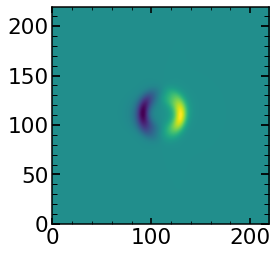

In [86]:
plt.imshow(single_primary_realization_oversampled_2-single_primary_realization_oversampled)

In [56]:
%timeit interpolated_image = galsim._InterpolatedImage(im1,\
x_interpolant=galsim.Lanczos(5, True)) ;  single_primary_realization_oversampled = interpolated_image.shift(0.01,0.021 ).\
drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array ; \
single_primary_realization = resize(single_primary_realization_oversampled,(shape_of_sci_image,shape_of_sci_image),())  


   


25.9 ms ± 324 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [63]:
time_1=time.time()
interpolated_image = galsim._InterpolatedImage(image,\
x_interpolant=galsim.Lanczos(5, True)) ;  single_primary_realization_oversampled = interpolated_image.shift(0.01,0.021 ).\
drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array ; \
single_primary_realization = resize(single_primary_realization_oversampled,(shape_of_sci_image,shape_of_sci_image),())  
time_2=time.time()
print(time_2-time_1)

AttributeError: 'numpy.ndarray' object has no attribute '_view'

In [195]:
time_1=time.time()
interpolated_image = galsim._InterpolatedImage(im1,x_interpolant=galsim.Lanczos(5, True)) 
time_2=time.time()
single_primary_realization_oversampled = interpolated_image.shift(0.01,0.021 ).\
drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array 
time_3=time.time()
single_primary_realization = resize(single_primary_realization_oversampled,(shape_of_sci_image,shape_of_sci_image),())  
time_4=time.time()
print(time_2-time_1)
print(time_3-time_2)
print(time_4-time_3)

0.0005397796630859375
0.0023651123046875
0.0013551712036132812


In [62]:
im1

galsim.Image(bounds=galsim.BoundsI(xmin=1, xmax=309, ymin=1, ymax=309), array=
array([[ 65352.523,  80092.875,  94396.17 , ...,  93901.9  ,  79681.71 ,
         65024.383],
       [ 83976.58 , 102902.766, 121263.68 , ..., 120639.   , 102378.63 ,
         83552.87 ],
       [ 99599.234, 122036.914, 143799.89 , ..., 143096.3  , 121451.4  ,
         99131.55 ],
       ...,
       [107821.49 , 132106.6  , 155661.12 , ..., 156722.66 , 133049.39 ,
        108621.13 ],
       [ 91031.96 , 111549.38 , 131453.88 , ..., 132375.3  , 112369.1  ,
         91729.23 ],
       [ 70960.664,  86963.45 , 102490.75 , ..., 103204.17 ,  87598.36 ,
         71500.63 ]], dtype=float32), wcs=galsim.PixelScale(1.0))

In [276]:
oversampling=11
image=list_of_sci_images[index_of_single_image]
image_var=list_of_var_images[index_of_single_image]
image_mask=list_of_mask_images[index_of_single_image]


shape=image.shape
optPsf_cut_grating_convolved=np.load('/Volumes/Saturn_USA/PFS/Testing/Final_Images/optPsf_cut_grating_convolved.npy')
index_of_single_image=0
from Zernike_Module import Psf_position

single_Psf_position=Psf_position(optPsf_cut_grating_convolved, int(round(oversampling)),shape[0] ,
                                 double_sources=False,double_sources_positions_ratios=[0,0],
                                                                       verbosity=1,save=False)




time_1=time.time()
optPsf_cut_fiber_convolved_downsampled,psf_position=single_Psf_position.find_single_realization_min_cut(optPsf_cut_grating_convolved,
                                                                               int(round(oversampling)),shape[0],image,image_var,image_mask,
                                                                               v_flux=1,simulation_00=False,
                                                                               double_sources=False,double_sources_positions_ratios=[0,0],
                                                                               verbosity=0,explicit_psf_position=None,
                                                                               use_only_chi=True,use_center_of_flux=True)

time_2=time.time()
print(time_2-time_1)

(309, 309)
[0, 0]
time_2-time_1 for shift and resize 0.0004322528839111328
time_3-time_2 for shift and resize 0.0010068416595458984
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 6.508827209472656e-05
time_3_3-time_3_2 for shift and resize 0.08801388740539551
time_4-time_3_3 for shift and resize 1.1920928955078125e-06
time_4-time_3 for shift and resize 0.08808016777038574
time_5-time_4 for shift and resize 0.012713909149169922
time_5-time_1 for shift and resize 0.1022331714630127
sim00=False and center of light =true
time_2-time_1 for initial_complete_realization: 0.617271900177002
(309, 309)
[32.80063243759041, -3.675082525745772]
time_2-time_1 for shift and resize 0.00036787986755371094
time_3-time_2 for shift and resize 0.0006859302520751953
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.295608520507812e-05
time_3_3-time_3_2 for shift and resize 0.08334112167358398
time_4-time_3_3 for shift and resize 2.145767211914

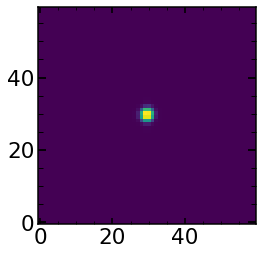

In [277]:
plt.imshow(optPsf_cut_fiber_convolved_downsampled)

In [227]:
time_1=time.time()
single_Psf_position.create_complete_realization(x=[0,0,0,0,], return_full_result=True,use_only_chi=True,use_center_of_light=True,simulation_00=False)
time_2=time.time()
print('time_2-time_1 for initial_complete_realization: '+str(time_2-time_1))

(309, 309)
time_2-time_1 for shift and resize 0.0005788803100585938
time_3-time_2 for shift and resize 0.0021867752075195312
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.0002980232238769531
time_3_3-time_3_2 for shift and resize 0.0329282283782959
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.03322720527648926
time_5-time_4 for shift and resize 0.0010230541229248047
time_5-time_1 for shift and resize 0.03701591491699219
sim00=False and center of light =true
time_2-time_1 for initial_complete_realization: 0.6601109504699707


In [234]:
time_11=time.time()
single_Psf_position.create_complete_realization(x=[0,0,0,0,], return_full_result=True,use_only_chi=True,use_center_of_light=True,simulation_00=False)
time_21=time.time()
print('time_21-time_11 for initial_complete_realization: '+str(time_21-time_11))

(309, 309)
[0, 0]
time_2-time_1 for shift and resize 0.0006351470947265625
time_3-time_2 for shift and resize 0.0010497570037841797
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.0108642578125e-05
time_3_3-time_3_2 for shift and resize 0.03289508819580078
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.03297615051269531
time_5-time_4 for shift and resize 0.0006988048553466797
time_5-time_1 for shift and resize 0.035359859466552734
sim00=False and center of light =true
time_21-time_11 for initial_complete_realization: 0.043927907943725586


In [244]:
time_1=time.time()
oversampling=11
shape_of_sci_image=20
primary_offset_axis_1,primary_offset_axis_0 =0, 0
print(optPsf_cut_grating_convolved.shape)
im1=  galsim.Image(optPsf_cut_grating_convolved, copy=True,scale=1)
time_2=time.time()
interpolated_image = galsim._InterpolatedImage(im1,\
                     x_interpolant=galsim.Lanczos(5, True))
time_3=time.time()
#single_primary_realization_oversampled = interpolated_image.shift(primary_offset_axis_1,primary_offset_axis_0 ).\
#    drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array 
time_3_1=time.time()
single_primary_realization_oversampled_1 = interpolated_image.shift(primary_offset_axis_1,primary_offset_axis_0 )
time_3_2=time.time()
single_primary_realization_oversampled_2=single_primary_realization_oversampled_1.drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel')
time_3_3=time.time()
single_primary_realization_oversampled_3=single_primary_realization_oversampled_2.array

time_4=time.time()
single_primary_realization = resize(single_primary_realization_oversampled_3,(shape_of_sci_image,shape_of_sci_image),())   
time_5=time.time()  

print('time_2-time_1 for shift and resize '+str(time_2-time_1))
print('time_3-time_2 for shift and resize '+str(time_3-time_2))
print('time_3_1-time_3 for shift and resize '+str(time_3_1-time_3))
print('time_3_2-time_3_1 for shift and resize '+str(time_3_2-time_3_1))
print('time_3_3-time_3_2 for shift and resize '+str(time_3_3-time_3_2))
print('time_4-time_3_3 for shift and resize '+str(time_4-time_3_3))
print('time_4-time_3 for shift and resize '+str(time_4-time_3))
print('time_5-time_4 for shift and resize '+str(time_5-time_4))
print('time_5-time_1 for shift and resize '+str(time_5-time_1))

(309, 309)
time_2-time_1 for shift and resize 0.0015599727630615234
time_3-time_2 for shift and resize 0.0016131401062011719
time_3_1-time_3 for shift and resize 6.198883056640625e-05
time_3_2-time_3_1 for shift and resize 0.0002617835998535156
time_3_3-time_3_2 for shift and resize 0.04268622398376465
time_4-time_3_3 for shift and resize 0.0001380443572998047
time_4-time_3 for shift and resize 0.043148040771484375
time_5-time_4 for shift and resize 0.0030410289764404297
time_5-time_1 for shift and resize 0.0493621826171875


In [245]:
def test_resize(im1):
    time_1=time.time()
    oversampling=11
    shape_of_sci_image=20
    primary_offset_axis_1,primary_offset_axis_0 =0, 0
    print(optPsf_cut_grating_convolved.shape)
    im1=  galsim.Image(optPsf_cut_grating_convolved, copy=True,scale=1)
    time_2=time.time()
    interpolated_image = galsim._InterpolatedImage(im1,\
                         x_interpolant=galsim.Lanczos(5, True))
    time_3=time.time()
    #single_primary_realization_oversampled = interpolated_image.shift(primary_offset_axis_1,primary_offset_axis_0 ).\
    #    drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel').array 
    time_3_1=time.time()
    single_primary_realization_oversampled_1 = interpolated_image.shift(primary_offset_axis_1,primary_offset_axis_0 )
    time_3_2=time.time()
    single_primary_realization_oversampled_2=single_primary_realization_oversampled_1.drawImage(nx=shape_of_sci_image*oversampling, ny=shape_of_sci_image*oversampling, scale=1, method='no_pixel')
    time_3_3=time.time()
    single_primary_realization_oversampled_3=single_primary_realization_oversampled_2.array

    time_4=time.time()
    single_primary_realization = resize(single_primary_realization_oversampled_3,(shape_of_sci_image,shape_of_sci_image),())   
    time_5=time.time()  

    print('time_2-time_1 for shift and resize '+str(time_2-time_1))
    print('time_3-time_2 for shift and resize '+str(time_3-time_2))
    print('time_3_1-time_3 for shift and resize '+str(time_3_1-time_3))
    print('time_3_2-time_3_1 for shift and resize '+str(time_3_2-time_3_1))
    print('time_3_3-time_3_2 for shift and resize '+str(time_3_3-time_3_2))
    print('time_4-time_3_3 for shift and resize '+str(time_4-time_3_3))
    print('time_4-time_3 for shift and resize '+str(time_4-time_3))
    print('time_5-time_4 for shift and resize '+str(time_5-time_4))
    print('time_5-time_1 for shift and resize '+str(time_5-time_1))

In [246]:
%timeit test_resize(im1)

(309, 309)
time_2-time_1 for shift and resize 0.00048732757568359375
time_3-time_2 for shift and resize 0.0005776882171630859
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.009506225585938e-05
time_3_3-time_3_2 for shift and resize 0.03399991989135742
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-time_3 for shift and resize 0.034072160720825195
time_5-time_4 for shift and resize 0.0009908676147460938
time_5-time_1 for shift and resize 0.03612804412841797
(309, 309)
time_2-time_1 for shift and resize 0.00010609626770019531
time_3-time_2 for shift and resize 0.00042891502380371094
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 6.794929504394531e-05
time_3_3-time_3_2 for shift and resize 0.032296180725097656
time_4-time_3_3 for shift and resize 7.152557373046875e-07
time_4-time_3 for shift and resize 0.032364845275878906
time_5-time_4 for shift and resize 0.002722024917602539
time_5-time_1 for shift a

time_2-time_1 for shift and resize 0.0001957416534423828
time_3-time_2 for shift and resize 0.0004260540008544922
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 5.91278076171875e-05
time_3_3-time_3_2 for shift and resize 0.028477907180786133
time_4-time_3_3 for shift and resize 1.1920928955078125e-06
time_4-time_3 for shift and resize 0.028538227081298828
time_5-time_4 for shift and resize 0.002962827682495117
time_5-time_1 for shift and resize 0.03212285041809082
(309, 309)
time_2-time_1 for shift and resize 0.0003170967102050781
time_3-time_2 for shift and resize 0.0011370182037353516
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 0.00012087821960449219
time_3_3-time_3_2 for shift and resize 0.03457307815551758
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-time_3 for shift and resize 0.034696102142333984
time_5-time_4 for shift and resize 0.003381013870239258
time_5-time_1 for shift and resize 0.03

time_2-time_1 for shift and resize 0.0001621246337890625
time_3-time_2 for shift and resize 0.00040912628173828125
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 5.2928924560546875e-05
time_3_3-time_3_2 for shift and resize 0.022808074951171875
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.022861957550048828
time_5-time_4 for shift and resize 0.002486705780029297
time_5-time_1 for shift and resize 0.02591991424560547
(309, 309)
time_2-time_1 for shift and resize 0.0004010200500488281
time_3-time_2 for shift and resize 0.0009658336639404297
time_3_1-time_3 for shift and resize 9.5367431640625e-07
time_3_2-time_3_1 for shift and resize 8.296966552734375e-05
time_3_3-time_3_2 for shift and resize 0.025030136108398438
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.025115013122558594
time_5-time_4 for shift and resize 0.0027379989624023438
time_5-time_1 for shift a

time_2-time_1 for shift and resize 0.00016689300537109375
time_3-time_2 for shift and resize 0.00045108795166015625
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 5.2928924560546875e-05
time_3_3-time_3_2 for shift and resize 0.024497032165527344
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.024550914764404297
time_5-time_4 for shift and resize 0.002410888671875
time_5-time_1 for shift and resize 0.027579784393310547
(309, 309)
time_2-time_1 for shift and resize 0.00041294097900390625
time_3-time_2 for shift and resize 0.0007638931274414062
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 6.127357482910156e-05
time_3_3-time_3_2 for shift and resize 0.024750947952270508
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.024813175201416016
time_5-time_4 for shift and resize 0.0014760494232177734
time_5-time_1 for shift and resize 0.0274

In [17]:
index_of_single_image=0
image=list_of_sci_images[index_of_single_image]
image_var=list_of_var_images[index_of_single_image]
image_mask=list_of_mask_images[index_of_single_image]

np.save('/Volumes/Saturn_USA/PFS/Testing/Final_Images/sci_image.npy',image)
np.save('/Volumes/Saturn_USA/PFS/Testing/Final_Images/var_image.npy',image_var)
np.save('/Volumes/Saturn_USA/PFS/Testing/Final_Images/mask_image.npy',image_mask)

In [250]:
initial_complete_realization=single_Psf_position.create_complete_realization(x=[0,0,0,0,], return_full_result=True,use_only_chi=True,use_center_of_light=True,simulation_00=False)[-1]

(309, 309)
[0, 0]
time_2-time_1 for shift and resize 0.0007619857788085938
time_3-time_2 for shift and resize 0.001110076904296875
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.797645568847656e-05
time_3_3-time_3_2 for shift and resize 0.038246870040893555
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-time_3 for shift and resize 0.038336992263793945
time_5-time_4 for shift and resize 0.0006918907165527344
time_5-time_1 for shift and resize 0.04090094566345215
sim00=False and center of light =true


In [255]:
sci_image=image
print(find_centroid_of_flux(initial_complete_realization))
print(find_centroid_of_flux(image))

(9.504330868386694, 9.624315660457267)
(9.64560548789256, 9.814369129946524)


In [257]:
offset_initial_and_sci=-((np.array(find_centroid_of_flux(initial_complete_realization))-np.array(find_centroid_of_flux(sci_image))))
offset_initial_and_sci

array([0.14127462, 0.19005347])

In [272]:
list_of_offset_initial_and_sci=[]
for i in range(5):
    if i==0:

        initial_complete_realization=single_Psf_position.create_complete_realization(x=[0,0,0,0,],\
                                                                             return_full_result=True,use_only_chi=True,use_center_of_light=True,simulation_00=False)[-1]

        x_i,y_i=offset_initial_and_sci*oversampling
        
        x_offset,y_offset=0,0
        x_offset=x_offset+x_i
        y_offset=y_offset+y_i
    else:
        x_offset=x_offset+x_i        
        y_offset=y_offset+y_i     
    complete_realization=single_Psf_position.create_complete_realization(x=[x_offset,y_offset,0,0,],\
                                                                         return_full_result=True,use_only_chi=True,use_center_of_light=True,simulation_00=False)[-1]
    offset_initial_and_sci=-((np.array(find_centroid_of_flux(complete_realization))-np.array(find_centroid_of_flux(sci_image))))
    
    x_i,y_i=offset_initial_and_sci*oversampling
    list_of_offset_initial_and_sci.append(offset_initial_and_sci)
    
print(offset_initial_and_sci)

(309, 309)
[0, 0]
time_2-time_1 for shift and resize 0.0006582736968994141
time_3-time_2 for shift and resize 0.0008347034454345703
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 8.0108642578125e-05
time_3_3-time_3_2 for shift and resize 0.036808013916015625
time_4-time_3_3 for shift and resize 9.5367431640625e-07
time_4-time_3 for shift and resize 0.036889076232910156
time_5-time_4 for shift and resize 0.0009980201721191406
time_5-time_1 for shift and resize 0.03938007354736328
sim00=False and center of light =true
(309, 309)
[8.146800567487844e-09, 4.902434369569164e-08]
time_2-time_1 for shift and resize 0.0005471706390380859
time_3-time_2 for shift and resize 0.0005347728729248047
time_3_1-time_3 for shift and resize 0.0
time_3_2-time_3_1 for shift and resize 7.319450378417969e-05
time_3_3-time_3_2 for shift and resize 0.03305983543395996
time_4-time_3_3 for shift and resize 2.1457672119140625e-06
time_4-time_3 for shift and resize 0.033135175704956

In [263]:
x_i,y_i=offset_initial_and_sci

In [273]:
list_of_offset_initial_and_sci

[array([0.14127462, 0.19005344]),
 array([0.00208708, 0.00161586]),
 array([ 0.00017314, -0.00006993]),
 array([0.00001331, 0.0000029 ]),
 array([ 0.00000104, -0.0000001 ])]

In [11]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/'

results_of_fit_many_direct_Ar=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121.pkl',allow_pickle=True)

In [12]:
results_of_fit_many_direct_Ar

{'m4':             z4        z5        z6        z7        z8        z9       z10  \
 1    34.623810 -0.997635  0.016057  0.364121  0.276348  0.205783 -0.509016   
 101  31.799080  0.427019 -0.485069  0.191120 -0.708133  0.054429 -0.366026   
 102  29.779171  0.940648 -0.798074  0.104558 -0.693435 -0.083787 -0.298507   
 103  28.469331  1.091860 -0.831295  0.189854 -0.645328 -0.059438 -0.288451   
 104  27.679092  1.521027 -1.292774  0.149569 -0.577223 -0.081627 -0.294994   
 ..         ...       ...       ...       ...       ...       ...       ...   
 366  28.970733  0.842059 -0.427188  0.570920 -0.447803 -0.190710 -0.465265   
 367  29.084766  1.198025 -0.534350  0.473141 -0.637588 -0.267615 -0.473608   
 368  27.569618  1.140472 -0.610371  0.713651 -0.631322 -0.332115 -0.439203   
 369  24.472781  1.111100 -0.497127  0.193767 -0.684693 -0.266749 -0.220954   
 371  24.147608  0.894640 -1.139494  0.191220 -0.540274 -0.688585 -0.022901   
 
           z11       z12       z13  ...     

In [14]:
type(results_of_fit_many_direct_Ar)

dict

In [20]:
results_of_fit_many_direct_Ar.\
to_pickle('/Users/nevencaplar/Documents/PFS/Fit_Results/Aug0121/results_of_fit_many_direct_Ar_from_Aug0121_protocol_3.pkl',protocol=3)

AttributeError: 'dict' object has no attribute 'to_pickle'

In [16]:
pickle.HIGHEST_PROTOCOL

5

In [21]:

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Aug0121_protocol_3.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar,f, protocol=3)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Aug0121_protocol_3.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ne,f, protocol=3)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Aug0121_protocol_3.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Kr,f, protocol=3)

In [39]:
results_of_fit_many_direct_Ar['p4'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Ar_p4.csv')
results_of_fit_many_direct_Ar['0'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Ar_0.csv')
results_of_fit_many_direct_Ar['m4'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Ar_m4.csv')

results_of_fit_many_direct_Ne['p4'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Ne_p4.csv')
results_of_fit_many_direct_Ne['0'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Ne_0.csv')
results_of_fit_many_direct_Ne['m4'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Ne_m4.csv')

results_of_fit_many_direct_Kr['p4'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Kr_p4.csv')
results_of_fit_many_direct_Kr['0'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Kr_0.csv')
results_of_fit_many_direct_Kr['m4'].to_csv(DATAFRAMES_FOLDER+'results_of_fit_many_direct_Kr_m4.csv')